<a href="https://colab.research.google.com/github/zyduan202/BASF_Project2/blob/main/Identify_key_descriptors.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

This file contains the code corresponding to the methodology section. It incorporates both approach 1 and approach 2 to identify influential features. Additionally, it includes code for replicating the results using the csv files found in the `Trained models and csv files` folder. Moreover, the classes and methods in this file are comprehensively commented. For a code review, please refer to this file.

**Project**: Catalyst Design with Decision Trees and Shapley Additive Explanations

**Member**: Zhaoyan Duan, Haotong Xie

**Task**: suppress or eliminate the influence of reaction conditions to highlight the effects of catalytic descriptors
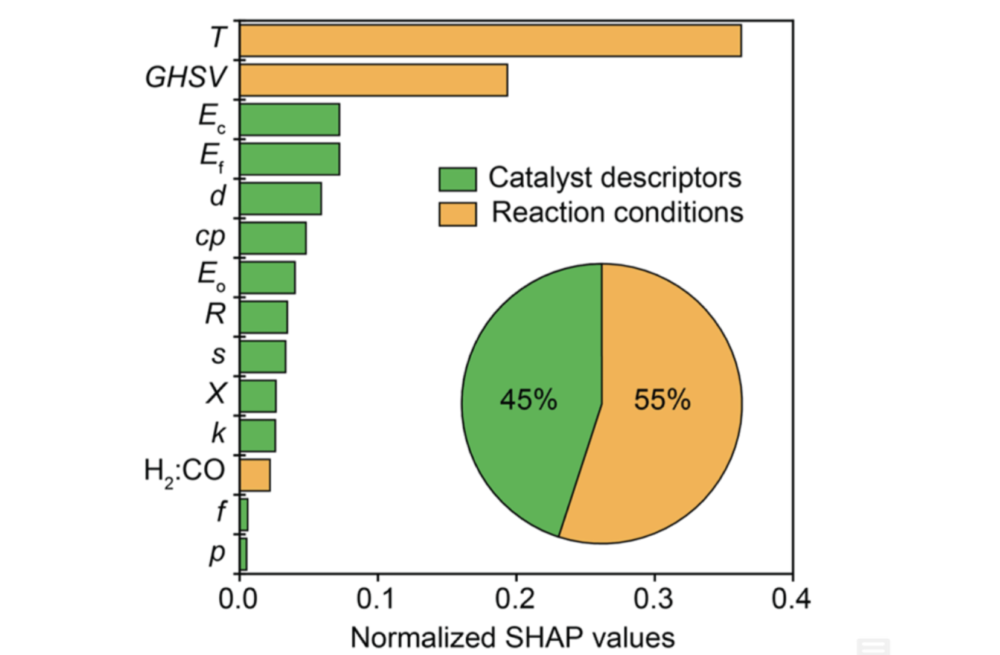

# A. Data preparation

In [ ]:
!pip install shap
!pip install scikit-optimize

import numpy as np
import shap
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
import operator
import inspect
from operator import itemgetter
from math import sqrt
from joblib import dump, load
from sklearn.ensemble import GradientBoostingRegressor, RandomForestRegressor
from sklearn.model_selection import GridSearchCV, cross_val_score, train_test_split, LeaveOneOut
from sklearn.feature_selection import VarianceThreshold
from sklearn.metrics import mean_squared_error, r2_score
from sklearn.linear_model import LinearRegression, Ridge, RidgeCV, ElasticNet, Lasso
from sklearn.svm import SVR
from sklearn.pipeline import Pipeline, make_pipeline
from sklearn.preprocessing import StandardScaler, PolynomialFeatures
from sklearn.gaussian_process import GaussianProcessRegressor
from sklearn.gaussian_process.kernels import RationalQuadratic, ConstantKernel, WhiteKernel, Matern, ExpSineSquared, DotProduct
from sklearn.kernel_ridge import KernelRidge
from sklearn.neighbors import KNeighborsRegressor
from sklearn.tree import DecisionTreeRegressor
from sklearn.neural_network import MLPRegressor
from sklearn.decomposition import PCA
from skopt import BayesSearchCV
from skopt.space import Real, Integer, Categorical
from xgboost import XGBRegressor


In [ ]:
# Import the dataset
data = pd.read_excel('/content/PNNL_data_FinalCurated.xlsx', sheet_name ='Initial set')

In [ ]:
X = data[["crystal radius",'Pauling Electronegativity','FE','OE',
          'valence s','valence p',"valence d",'valence f','specific heat',
          "thermal conductivity","Cohesive energy",
          "GHSV","H2CO","Temp"]]

X_des = data[["crystal radius",'Pauling Electronegativity','FE','OE',
          'valence s','valence p',"valence d",'valence f','specific heat',
          "thermal conductivity","Cohesive energy"]]

X_con = data[["GHSV","H2CO","Temp"]]

y = data['F_STY']

In [ ]:
# Plot input features against target variable

def plot_features_vs_target(X, y, title, rows, cols):
    features = X.columns
    fig, axs = plt.subplots(rows, cols, figsize=(5*cols, 5*rows)) # Adjust the size based on the number of subplots
    axs = axs.ravel() # To handle the subplots easily

    for i, feature in enumerate(features):
        axs[i].scatter(X[feature], y)
        axs[i].set_xlabel(feature)
        axs[i].set_ylabel('Target (F_STY)')
        axs[i].set_title(f'Target vs. {feature}')

    # Remove empty subplots
    if len(features) < rows*cols:
        for ax in axs[len(features):]:
            fig.delaxes(ax)

    plt.tight_layout()
    plt.suptitle(title, y=1.02, fontsize=16)
    plt.show()

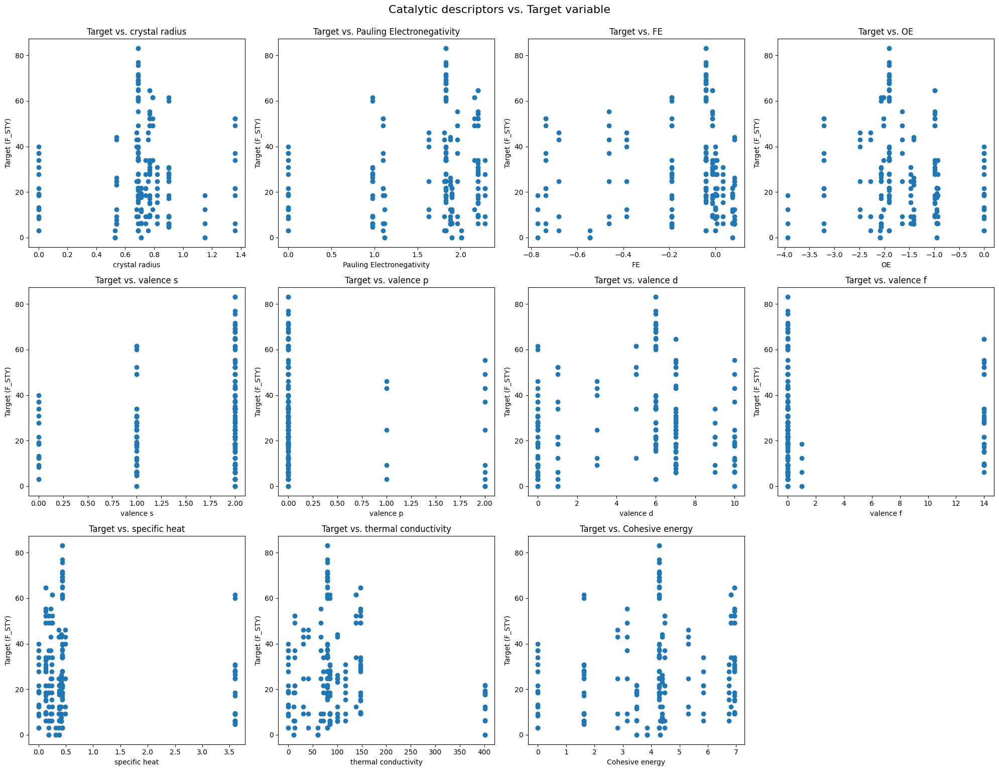

In [ ]:
plot_features_vs_target(X_des, y, 'Catalytic descriptors vs. Target variable', 3, 4)

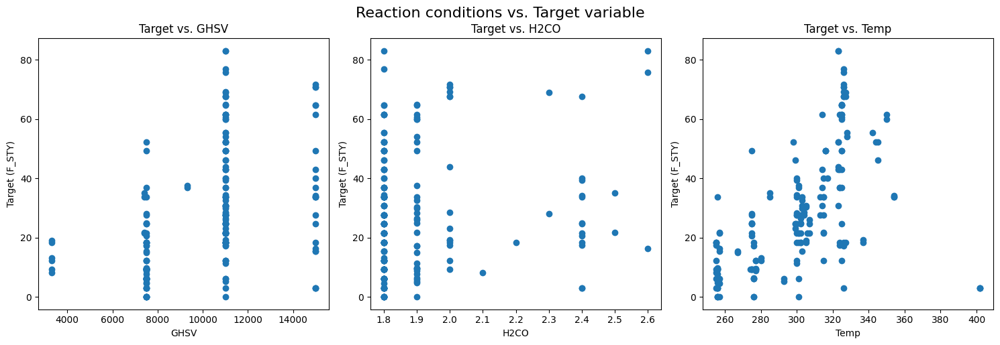

In [ ]:
plot_features_vs_target(X_con, y, 'Reaction conditions vs. Target variable', 1, 3)

# B. Class and methods



### ModelEvaluatorBayes()

In [ ]:
class ModelEvaluatorBayes:
    def __init__(self, X, y, random_seeds, model, param_space, kernel=None, results_dict={}, IIS_dict={}, model_dict={}):
        """Initializes the ModelEvaluatorBayes class.

        Args:
        X (pd.DataFrame): Feature matrix.
        y (pd.Series or np.array): Target vector.
        random_seeds (int or list): Random seed(s) for reproducibility.
        model (model object): The ML model to be used.
        param_space (dict): Hyperparameter search space.
        kernel (optional): Kernel for GaussianProcessRegressor.
        results_dict (dict, optional): Store performance metrics.
        IIS_dict (dict, optional): Integrated Importance Score storage.
        model_dict (dict, optional): Dictionary to store trained models.
        """

        # Initialization parameters
        self.X = X
        self.y = y
        self.model = model
        self.param_space = param_space
        self.kernel = kernel

        # Metrics and results storage
        self.performance_metrics = [] # Store model evaluation metrics for show_performance() method
        self.parameters = {} # Store optimal parameters found by BayesSearchCV
        self.seed_shap_dict = {} # Store mean absolute SHAP values across seeds
        self.stored_shap_values = {} # Store SHAP values across seeds for the plot_SHAP() method
        self.results_dict = results_dict # Store model evaluation metrics across different models
        self.IIS_dict = IIS_dict # Store IIS relevant values across models
        self.model_dict = model_dict # Store the trained models
        self.temp_shap_rank_dict = {feature: [] for feature in self.X.columns} # Store feature rank based on its SHAP value
        self.non_zero_shap_freq_dict = {feature: 0 for feature in self.X.columns} # Store the frequency for computing IIS

        # Handling single or multiple random seeds
        if isinstance(random_seeds, int):
            self.random_seeds = [random_seeds]
        elif isinstance(random_seeds, (list, np.ndarray)):
            self.random_seeds = random_seeds

    def evaluate_model(self):
        """
        Evaluate the model across different random seeds, split the data,
        perform hyperparameter tuning, calculate performance metrics and SHAP values.
        """
        metrics_accumulator = []

        # Loop through random seeds for evaluations
        for seed in self.random_seeds:
            # Split data into training and test sets
            self.X_train, self.X_test, self.y_train, self.y_test = train_test_split(self.X, self.y, test_size=0.2, random_state=seed)

            # Handle different types of ML models, with special conditions for models like GaussianProcessRegressor
            if issubclass(self.model, GaussianProcessRegressor) and self.kernel:
                estimator = self.model(kernel=self.kernel, random_state=seed)
            elif 'random_state' in self.model.get_params(self.model()):
                estimator = self.model(random_state=seed)
            else:
                estimator = self.model()

            # Hyperparameter tuning using BayesSearchCV
            tuning = BayesSearchCV(estimator=estimator,
                                  search_spaces=self.param_space,
                                  cv=10,
                                  n_jobs=-1,
                                  random_state=seed)
            tuning.fit(self.X_train, self.y_train)

            # Special handling for GaussianProcessRegressor
            if issubclass(self.model, GaussianProcessRegressor) and self.kernel:
                model_fitted = GaussianProcessRegressor(kernel=self.kernel,
                                                        alpha=tuning.best_estimator_.alpha,
                                                        n_restarts_optimizer=10,
                                                        random_state=seed)
                model_fitted.fit(self.X_train, self.y_train)
            else:
                model_fitted = tuning.best_estimator_
                model_fitted.fit(self.X_train, self.y_train)

            # Calculate and store model evaluation metrics
            metrics = self._calculate_evaluation_metrics(model_fitted)
            metrics_accumulator.append(metrics)
            self.performance_metrics.append([seed] + list(metrics.values()))

            # Store the best parameters from the Bayesian search
            self.parameters[seed] = tuning.best_params_

            # Calculate and store SHAP values
            self._calculate_shap_values(model_fitted, seed)

            # Store the trained model for this seed
            self.model_dict[self.model.__name__ + "_seed_" + str(seed)] = model_fitted

            print('Random seed ' + str(seed) + ' finished')
            print()

        # Calculate average metrics across all seeds
        mean_metrics = {metric: np.mean([result[metric] for result in metrics_accumulator]) for metric in metrics_accumulator[0]}
        self.results_dict[self.model.__name__] = mean_metrics

        # Calculate the Integrated Importance Score (IIS) for feature importance
        self._calculate_IIS()


    def _calculate_evaluation_metrics(self, model_fitted):
        """Internal method to compute model evaluation metrics like R2 and RMSE.

        Args:
        model_fitted (model object): Fitted machine learning model.

        Returns:
        dict: Dictionary with evaluation metrics.
        """

        # Calculate R2 scores for training and test data
        train_r2 = model_fitted.score(self.X_train, self.y_train)
        test_r2 = model_fitted.score(self.X_test, self.y_test)

        # Predictions for RMSE calculation
        y_predicted_train = model_fitted.predict(self.X_train)
        y_predicted_test = model_fitted.predict(self.X_test)

        # Compute RMSE for training and test data
        train_rmse = sqrt(mean_squared_error(self.y_train, y_predicted_train))
        test_rmse = sqrt(mean_squared_error(self.y_test, y_predicted_test))

        # 5-fold Cross-validation R2
        accuracies = cross_val_score(estimator=model_fitted, X=self.X_train, y=self.y_train, cv=5)
        cv_r2 = accuracies.mean()

        return {
            'train_r2': train_r2,
            'test_r2': test_r2,
            'train_rmse': train_rmse,
            'test_rmse': test_rmse,
            'cv_r2': cv_r2
        }


    def _calculate_shap_values(self, model_fitted, seed):
        """Internal method to calculate SHAP values for a given model and seed.

        Args:
        model_fitted (model object): Fitted machine learning model.
        seed (int): Random seed.
        """

        # Handling different model types for SHAP explainer
        try:
            explainer = shap.Explainer(model_fitted, self.X_train)
        except:
            explainer = shap.Explainer(model_fitted.predict, self.X_train)

        # Calculate and store SHAP values
        shap_values = explainer(self.X_train) # raw SHAP values
        self.stored_shap_values[seed] = shap_values
        seed_shap_values = {feature_name: np.mean(np.abs(shap_values.values[:, i])) for i, feature_name in enumerate(self.X_train.columns)} # absolute mean SHAP value
        self.seed_shap_dict[seed] = seed_shap_values

        # Count frequency of non-zero SHAP values
        for feature_name, value in seed_shap_values.items():
            if value != 0:
                self.non_zero_shap_freq_dict[feature_name] += 1

        # Compute and store feature rank based on non-zero SHAP values for this seed
        non_zero_shap_features = [k for k, v in seed_shap_values.items() if v != 0]
        seed_shap_ranks = {k: rank+1 for rank, k in enumerate(sorted(non_zero_shap_features, key=seed_shap_values.get, reverse=True))}

        # Store SHAP ranks based on non-zero SHAP values
        for feature_name, shap_rank in seed_shap_ranks.items():
            self.temp_shap_rank_dict[feature_name].append(shap_rank)


    def _calculate_IIS(self):
        """Internal method to compute IIS rankings based on the rank and the frequency of non-zero SHAP values"""

        # Compute average rank for non-zero SHAP values
        mean_shap_ranks = {feature: np.mean(ranks) for feature, ranks in self.temp_shap_rank_dict.items() if ranks}

        # Compute frequency of non-zero SHAP values
        total_seeds = len(self.random_seeds)
        non_zero_frequency = {feature: freq / total_seeds for feature, freq in self.non_zero_shap_freq_dict.items()}

        # Define weights for rank and frequency in IIS calculation
        # These weights can be adjusted according to specific needs
        alpha, beta = 0.33, 0.67

        # Compute the IIS values for each feature
        IIS_data = {}
        for feature in self.X.columns:
            if feature not in mean_shap_ranks and non_zero_frequency.get(feature, 0) == 0:
                # If SHAP value is zero across all seeds, set IIS to 0
                iis_value = 0
                mean_rank = None
                frequency = 0
            else:
                iis_value = alpha * (1 / mean_shap_ranks.get(feature, float('inf'))) + beta * non_zero_frequency.get(feature, 0) ### 这行仔细看下
                mean_rank = mean_shap_ranks.get(feature, None)
                frequency = non_zero_frequency.get(feature, 0) * 100  # Convert to percentage

            IIS_data[feature] = [mean_rank, frequency, iis_value]

        # Store the IIS values in the class dictionary
        self.IIS_dict[self.model.__name__] = IIS_data


    def show_performance(self):
        """
        Display the performance metrics for the model evaluations across all seeds.

        Returns:
            pd.DataFrame: A DataFrame with performance metrics for each random seed.
        """
        return pd.DataFrame(self.performance_metrics, columns=['random_seed', 'training R2', 'test R2', 'training RMSE', 'test RMSE', 'cv_score'])

    def show_parameters(self):
        """
        Display the best parameters for the model obtained from Bayesian optimization.

        Returns:
            dict: A dictionary with best parameters for each random seed.
        """
        return self.parameters

    def show_shap_ranks(self):
        """
        Display the SHAP ranks of features for each seed.

        Returns:
            dict: Dictionary with features ranked by their SHAP values.
        """
        return self.temp_shap_rank_dict

    def show_IIS(self):
        """
        Display the Integrated Importance Score (IIS) for each feature.

        Returns:
            pd.DataFrame: A sorted DataFrame with each feature's IIS, mean rank, and frequency of non-zero SHAP values.
        """

        if not self.IIS_dict or self.model.__name__ not in self.IIS_dict:
            raise ValueError("Please first evaluate the model to compute the IIS values.")

        # Convert nested dictionary to list of lists for DataFrame creation
        data = [[feature] + values for feature, values in self.IIS_dict[self.model.__name__].items()]

        iis_df = pd.DataFrame(data, columns=["Feature", "Mean Rank", "Non-Zero Frequency (%)", "IIS"])

        return iis_df.sort_values(by="IIS", ascending=False)

    def plot_SHAP(self, seed=None):
        """
        Plots the SHAP values for a specific seed or for all seeds.

        Args:
            seed (int or 'all', optional): The random seed for which SHAP values should be plotted. If 'all', plots for all seeds. Default is the last seed in the list.

        Raises:
            ValueError: If no SHAP values are stored for the specified seed.
        """

        if seed == 'all':
            for seed in self.random_seeds:
                self.plot_SHAP(seed)
        else:
            if seed is None:
                seed = self.random_seeds[-1]

            if seed not in self.seed_shap_dict:
                raise ValueError(f"No SHAP values stored for seed {seed}")

            shap_values = self.stored_shap_values[seed]
            shap.plots.bar(shap_values, max_display=15)


## IISDataAnalysis()

In [ ]:
class IISDataAnalysis:

    def __init__(self, results={}, IIS={}, models={}, results_csv_name='df_results.csv',
                 models_joblib_name='models.joblib', iis_full_csv_name='df_IIS_full.csv', iis_csv_name='df_IIS.csv'):
        """
        Initialize the IISDataAnalysis class.

        Args:
            results (dict): A dictionary containing model results.
            IIS (dict): A dictionary containing Integrated Importance Score for features.
            models (dict): A dictionary containing trained machine learning models.
            results_csv_name (str): Filename to store the results DataFrame.
            models_joblib_name (str): Filename to store the joblib dump of models.
            iis_full_csv_name (str): Filename to store the full IIS DataFrame with each feature's IIS, mean rank, and frequency of non-zero SHAP values.
            iis_csv_name (str): Filename to store the IIS value DataFrame.
        """

        # Check if provided filenames are strings
        for arg, value in {'results_csv_name': results_csv_name, 'models_joblib_name': models_joblib_name, 'iis_full_csv_name': iis_full_csv_name, 'iis_csv_name': iis_csv_name}.items():
            if not isinstance(value, str):
                raise ValueError(f"The argument {arg} should be a string. Received: {type(value)}")

        self.results = results
        self.IIS = IIS
        self.models = models
        self.results_csv_name = results_csv_name
        self.models_joblib_name = models_joblib_name
        self.iis_full_csv_name = iis_full_csv_name
        self.iis_csv_name = iis_csv_name

        # Process the provided data and store them into appropriate DataFrames
        self._process_data()

    def _process_data(self):
        """
        Processes the data into various DataFrames and saves them as CSVs.
        """

        # Convert model results into a DataFrame and save to CSV
        self.df_results = pd.DataFrame(self.results).T
        self.df_results.to_csv(self.results_csv_name)

        # Save the trained models using joblib
        dump(self.models, self.models_joblib_name)

        # Convert IIS data into a DataFrame and save to CSV
        temp_data = {}
        for model, features in self.IIS.items():
            for feature, values in features.items():
                for i, value_name in enumerate(['Mean Rank', 'Non-Zero Frequency(%)', 'IIS']):
                    col_name = (model, value_name)
                    if col_name not in temp_data:
                        temp_data[col_name] = {}
                    temp_data[col_name][feature] = values[i]
        self.df_IIS_full = pd.DataFrame(temp_data).T
        self.df_IIS_full.to_csv(self.iis_full_csv_name)

        # Extracting IIS values into a new DataFrame and save to CSV
        self.df_IIS = self.df_IIS_full.loc(axis=0)[:, 'IIS']
        self.df_IIS = self.df_IIS.droplevel(1, axis=0) # drop the level of 'IIS'
        self.df_IIS.to_csv(self.iis_csv_name)

    def show_model_performance(self):
        """
        Display the performance of the trained models.

        Returns:
            pd.DataFrame: A DataFrame containing model performance metrics.
        """
        return self.df_results

    def get_IIS_mean_rank(self):
        """
        Calculate and return the mean rank and standard deviation of the IIS across models for each feature.

        Returns:
            pd.DataFrame: A DataFrame containing mean rank and standard deviation for each feature.
        """
        df_ranked = self.df_IIS.rank(axis=1, ascending=False, method='min').astype(int)
        iis_ranks = df_ranked.T
        mean_ranks = iis_ranks.mean(axis=1).round(3)
        std_ranks = iis_ranks.std(axis=1).round(3)
        results_df = pd.DataFrame({
            'Feature': mean_ranks.index,
            'Mean Rank': mean_ranks.values,
            'Standard Deviation': std_ranks.values
        })
        return results_df

    def plot_IIS_mean_rank(self):
        """
        Plot the mean rank of IIS values across models for each feature using a box plot.
        """
        df_ranked = self.df_IIS.rank(axis=1, ascending=False, method='min').astype(int)
        mean_ranks = df_ranked.mean().sort_values()
        sorted_columns = mean_ranks.index.tolist()
        plt.figure(figsize=(14, 10))
        sns.boxplot(data=df_ranked[sorted_columns], orient="v")
        plt.title('Box Plot of IIS Ranks across Models')
        plt.ylabel('IIS Ranks')
        plt.xlabel('Features')
        plt.gca().invert_yaxis()
        plt.xticks(rotation=90)
        plt.tight_layout()
        plt.show()

    def show_IIS_values(self):
        """
        Display the IIS values for each feature across models.

        Returns:
            pd.DataFrame: A DataFrame containing IIS values for each feature across models.
        """
        return self.df_IIS

    def show_IIS_details(self):
        """
        Display the detailed IIS DataFrame which includes Mean Rank, Non-Zero Frequency(%), and IIS values.

        Returns:
            pd.DataFrame: A DataFrame containing detailed IIS data.
        """
        return self.df_IIS_full

    def show_IIS_ranks(self):
        """
        Rank the IIS values across models for each feature.

        Returns:
            pd.DataFrame: A DataFrame containing ranks based on IIS values.
        """
        df_ranked = self.df_IIS.rank(axis=1, ascending=False, method='min').astype(int)
        return df_ranked


## define_search_space()

because of `X_train.shape[1]`, the search space is not the same for models using different approaches

In [ ]:
def define_search_space(X_train):
    param_space_DT = {
        'max_depth': Integer(1, 10),
        'min_samples_split': Real(0.01, 0.1, 'uniform'),
        'min_samples_leaf': Integer(1, 10),
        'max_features': Integer(1, X_train.shape[1])
    }

    param_space_RF = {
        'max_depth': Integer(1, 10),
        'min_samples_split': Real(0.01, 0.1, 'uniform'),
        'min_samples_leaf': Integer(1, 10),
        'max_features': Integer(1, X_train.shape[1])
    }

    param_space_GB = {
        'n_estimators': Integer(10, 200),
        'max_depth': Integer(1, 10),
        'learning_rate': Real(1e-3, 1, 'log-uniform'),
        'min_samples_split': Integer(2, 10),
        'min_samples_leaf': Integer(1, 10),
    }

    param_space_XGB = {
        'n_estimators': Integer(10, 200),
        'max_depth': Integer(1, 10),
        'learning_rate': Real(1e-3, 1, 'log-uniform'),
        'reg_alpha': Real(1e-6, 100.0, 'log-uniform'),
        'reg_lambda': Real(1e-6, 100.0, 'log-uniform'),
    }

    param_space_SVR = {'C': Real(1e-1, 1000, prior='log-uniform'),
                   'gamma': Categorical(['scale', 'auto']),
                   'epsilon': Real(0.1, 0.5, prior='uniform'),
                   'kernel': Categorical(['rbf', 'sigmoid'])
                  }

    param_space_GP = {
        'kernel__k1__k1__constant_value': Real(1e-1, 1e3, 'log-uniform'),
        'kernel__k1__k2__length_scale': Real(1e-6, 1e-1, 'log-uniform'),
        'kernel__k1__k2__alpha': Real(1e-1, 1e6, 'log-uniform'),
        'kernel__k2__noise_level': Real(1e-1, 1e3, 'log-uniform'),
        'alpha': Real(1e-2, 1e4, 'log-uniform'),
    }

    param_space_KNN = {
        'n_neighbors': Integer(3, 21),
        'weights': Categorical(['uniform', 'distance']),
        'p': Integer(1, 2)
    }

    return param_space_DT, param_space_RF, param_space_GB, param_space_XGB, param_space_SVR, param_space_GP, param_space_KNN


# C. Approach 1

Data normalisation w.r.t reference samples

Ideas:

input features = catalytic descriptors + reaction conditions

- input features in metal rows: catalytic descriptors + reaction conditions

- input features in reference rows: reaction conditions

- target variable: metal rows - reference rows = catalytic descriptors

Procedure:
1.   compare metal rows with reference rows:
			if ∣Temp_K(ref._i) - Temp_K(metal_j)∣ ≤ 10
               ∣GHSV(ref._i) - GHSV(metal_j)∣ ≤ 100     
			   ∣H2CO(ref._i) - H2CO(metal_j)∣ ≤ 0.5
			then y_(metal_i) - y_(ref._j) = y_normalised
2.   train models with catalytic descriptors as input features and y_normalised as target




## 1. Subtraction

In [ ]:
# Change the unit of Temperature.
# Kelvin(K) used in the paper, Celsius degree in dataset

# Kelvin = Celsius + 273.15
data['Temp_K'] = data['Temp'] + 273

# Show min and max of the Temp_K in the reference rows
min_Temp_K = data[data['P1'] == 0]['Temp_K'].min()
max_Temp_K = data[data['P1'] == 0]['Temp_K'].max()
print("reference row min_Temp_K:", min_Temp_K)
print("reference row max_Temp_K:", max_Temp_K)

# Show min and max of the Temp_K in the metal rows
min_Temp_K = data[data['P1'] != 0]['Temp_K'].min()
max_Temp_K = data[data['P1'] != 0]['Temp_K'].max()
print("metal row min_Temp_K:", min_Temp_K)
print("metal row max_Temp_K:", max_Temp_K)

reference row min_Temp_K: 528
reference row max_Temp_K: 597
metal row min_Temp_K: 528
metal row max_Temp_K: 675


In [ ]:
# Show min and max of the H2CO in the reference rows
min_H2CO = data[data['P1'] == 0]['H2CO'].min()
max_H2CO = data[data['P1'] == 0]['H2CO'].max()
print("reference row min_H2CO:", min_H2CO) # 528
print("reference row max_H2CO:", max_H2CO) # 597

# Show min and max of the Temp_K in the metal rows
min_H2CO = data[data['P1'] != 0]['H2CO'].min()
max_H2CO = data[data['P1'] != 0]['H2CO'].max()
print("metal row min_H2CO:", min_H2CO) # 528
print("metal row max_H2CO:", max_H2CO) # 597

reference row min_H2CO: 1.8
reference row max_H2CO: 2.1
metal row min_H2CO: 1.8
metal row max_H2CO: 2.6


In [ ]:
unique_ghsv_data_ref = data[data['P1'] == 0]['GHSV'].unique()
unique_ghsv_data_metal = data[data['P1'] != 0]['GHSV'].unique()

print(unique_ghsv_data_ref)
print(unique_ghsv_data_metal)

[ 3300  7500 11000 15000]
[ 7500 11000  7400 15000  9300]


In [ ]:
# Count the occurrences of each GHSV value in metal rows
data_metal = data[data['P1'] != 0]

# List of values to count
values_to_count = unique_ghsv_data_metal

# Count the occurrences of each value in data_metal
count_values = {value: data_metal[data_metal["GHSV"] == value].shape[0] for value in values_to_count}
count_values_str = ", ".join([f"{key}({value})" for key, value in count_values.items()])
count_values_str

'7500(56), 11000(90), 7400(4), 15000(20), 9300(2)'

**H2CO**

When the absolute difference of H2CO is set to 0.8, all datapoints in metal rows can find a match in the reference row regarding H2CO.

However, if we allow a large difference, including H2CO in the matching condition has little meaning. Nevertheless, in the previous part, we observed that H2CO is one of the least important features for the prediction. Therefore, having a too restricted absolute difference, which leads to fewer successful matches, is not necessary.

Therefore, we temporarily chose 0.5 as the threshold, which gives us 140 matches.


**Temp_K**

In the descriptive analysis part of the paper, the k-means clustering is based on Temp_K±10K, so we follow this.

**GHSV**

Besides, in most metal rows, the GHSV takes the value 7500, 11000 and 15000. Only several datapoints has 7400 in GHSV. So we set the absolute difference ± 100 to include these datapoints.

---
The absolute difference can be modified based on domain knowledge.

In [ ]:
def compare_rows(data, show_comparison = False):
    """
    Compares rows in a given DataFrame based on conditions applied to specific columns.

    Parameters:
    - data (DataFrame): The input DataFrame which contains columns 'P1', 'Temp_K', 'GHSV', 'H2CO', and 'F_STY'.
    - show_comparison (bool): If set to True, the function will print comparisons for rows that satisfy conditions.

    Returns:
    - results_df (DataFrame): DataFrame containing rows from 'data' that satisfy the given conditions, along with an additional column 'F_STY_normalised' which represents the difference in 'F_STY' values between the metal and reference rows.

    How the function works:
    1. Filter rows where 'P1' is 0. These are considered 'reference rows'.
    2. Filter rows where 'P1' is not 0 (promoters). These are considered 'metal rows'.
    3. For each 'metal row':
        - Try to find a matching 'reference row' based on the following conditions:
            * Difference in 'Temp_K' values is less than or equal to 10.
            * Difference in 'GHSV' values is less than or equal to 100.
            * Difference in 'H2CO' values is less than or equal to 0.5.
        - If a matching 'reference row' is found:
            * Calculate 'F_STY_normalised' as the difference between 'F_STY' values of the 'metal row' and the 'reference row'.
            * If 'show_comparison' is True, print details of the 'metal row' and its matching 'reference row'.
        - If no matching 'reference row' is found, print a message indicating so.
    4. Return the results as a DataFrame.
    """

    reference_rows = data[data['P1'] == 0]
    metal_rows = data[data['P1'] != 0]

    results = []

    # Iterate over each metal row
    for i in range(len(metal_rows)):
        # Extract current metal row
        metal_row = metal_rows.iloc[i]

        # Create a flag to track if a matching reference row is found
        match_found = False

        # Iterate over each reference row
        for j in range(len(reference_rows)):
            # Extract current reference row
            reference_row = reference_rows.iloc[j]

            # Check conditions
            if (abs(metal_row['Temp_K'] - reference_row['Temp_K']) <= 10 and
                abs(metal_row['GHSV'] - reference_row['GHSV']) <= 100 and
                abs(metal_row['H2CO'] - reference_row['H2CO']) <= 0.5):
                # Calculate F_STY_normalised
                F_STY_normalised = metal_row['F_STY'] - reference_row['F_STY']

                # Combine current metal row with F_STY_normalised
                result_row = metal_row.copy()
                result_row['F_STY_normalised'] = F_STY_normalised

                # Append result_row to results list
                results.append(result_row)

                # If show_comparison is TRUE, print the comparison
                if (show_comparison):
                    print(f"Metal row {i} (GHSV={metal_row['GHSV']}, Temp_K={metal_row['Temp_K']}) is matched with reference row {j} (GHSV={reference_row['GHSV']}, Temp_K={reference_row['Temp_K']})")

                # Set the flag to True as we found a matching reference row
                match_found = True

                # Exit inner loop as we found a matching reference row
                break

        # If no match was found, print a message
        if not match_found:
            print(f"Metal row {i} has no match.")

    results_df = pd.DataFrame(results)

    return results_df


In [ ]:
data2 = compare_rows(data1, show_comparison=True)
len(data2)
# 140 metal rows are matched with a reference row -> new data set for step 2: fitting

Metal row 0 (GHSV=7500, Temp_K=530) is matched with reference row 6 (GHSV=7500, Temp_K=529)
Metal row 1 (GHSV=7500, Temp_K=549) is matched with reference row 7 (GHSV=7500, Temp_K=550)
Metal row 2 (GHSV=11000, Temp_K=574) is matched with reference row 8 (GHSV=11000, Temp_K=573)
Metal row 3 (GHSV=11000, Temp_K=588) is matched with reference row 9 (GHSV=11000, Temp_K=590)
Metal row 4 (GHSV=11000, Temp_K=600) is matched with reference row 9 (GHSV=11000, Temp_K=590)
Metal row 5 (GHSV=7500, Temp_K=529) is matched with reference row 6 (GHSV=7500, Temp_K=529)
Metal row 6 (GHSV=7500, Temp_K=529) is matched with reference row 6 (GHSV=7500, Temp_K=529)
Metal row 7 (GHSV=11000, Temp_K=572) is matched with reference row 8 (GHSV=11000, Temp_K=573)
Metal row 8 (GHSV=11000, Temp_K=596) is matched with reference row 9 (GHSV=11000, Temp_K=590)
Metal row 9 (GHSV=11000, Temp_K=580) is matched with reference row 8 (GHSV=11000, Temp_K=573)
Metal row 10 (GHSV=7500, Temp_K=529) is matched with reference row 6

140

## Fitting with y_normalized and catalytic descriptors

### Prepare input features and target variable

In [ ]:
# the residuals of the subtraction as new target variable
y_nor = data2['F_STY_normalised']
y_nor

17     -3.076923
18    -12.307692
19    -21.538462
20    -27.692308
21    -21.538462
         ...    
183    -3.076923
184    -3.076923
185    -3.076923
186     9.230769
187     6.153846
Name: F_STY_normalised, Length: 140, dtype: float64

In [ ]:
print(np.mean(data2['F_STY']))
print(np.mean(data2['F_STY_normalised']))

27.610989010989012
2.9956043956043956


In [ ]:
# catalytic descriptors as input features
X_des = data2[["crystal radius", 'Pauling Electronegativity', 'FE', 'OE',
               'valence s', 'valence p', "valence d", 'valence f', 'specific heat',
               "thermal conductivity", "Cohesive energy"]]

X_train, X_test, y_train, y_test = train_test_split(X_des, y_nor, test_size = 0.2, random_state = 0)

In [ ]:
# define search space with X_train
param_space_DT, param_space_RF, param_space_GB, param_space_XGB, param_space_SVR, param_space_GP, param_space_KNN = define_search_space(X_train)

In [ ]:
print(len(X_train))
print(len(X_test))

112
28


In [ ]:
# Initial an empty dictionary to store the evaluation metrics
results_sub = {}

# Initial an empty dictionary to store the integrated importance score(IIS)
IIS_sub = {}

# initialize an empty dictionary to store models
models_sub = {}

### Decision Tree

In [ ]:
random_seeds = np.arange(0,10)

model_DT = ModelEvaluatorBayes(X_des, y_nor, random_seeds, DecisionTreeRegressor, param_space_DT, results_dict=results_sub, IIS_dict=IIS_sub, model_dict=models_sub)
model_DT.evaluate_model()

Random seed 0 finished

Random seed 1 finished



The objective has been evaluated at this point before.


Random seed 2 finished

Random seed 3 finished



The objective has been evaluated at this point before.
The objective has been evaluated at this point before.


Random seed 4 finished

Random seed 5 finished



The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.


Random seed 6 finished



The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.


Random seed 7 finished



The objective has been evaluated at this point before.


Random seed 8 finished

Random seed 9 finished



In [ ]:
model_DT.show_IIS()

,Feature,Mean Rank,Non-Zero Frequency (%),IIS
10,Cohesive energy,2.700000,100.0,0.792222
0,crystal radius,3.250000,80.0,0.637538
8,specific heat,3.375000,80.0,0.633778
1,Pauling Electronegativity,3.714286,70.0,0.557846
2,FE,3.857143,70.0,0.554556
9,thermal conductivity,5.400000,50.0,0.396111
4,valence s,3.250000,40.0,0.369538
3,OE,4.500000,40.0,0.341333
6,valence d,4.500000,40.0,0.341333
7,valence f,4.666667,30.0,0.271714


In [ ]:
model_DT.show_shap_ranks()

{'crystal radius': [3, 6, 1, 1, 6, 2, 5, 2],
 'Pauling Electronegativity': [5, 3, 3, 2, 7, 3, 3],
 'FE': [3, 4, 3, 6, 3, 4, 4],
 'OE': [5, 5, 2, 6],
 'valence s': [4, 4, 4, 1],
 'valence p': [6, 8],
 'valence d': [4, 5, 1, 8],
 'valence f': [4, 5, 5],
 'specific heat': [4, 1, 2, 2, 2, 5, 9, 2],
 'thermal conductivity': [2, 5, 3, 10, 7],
 'Cohesive energy': [1, 2, 1, 1, 6, 7, 4, 1, 3, 1]}

In [ ]:
model_DT.show_parameters()

{0: OrderedDict([('max_depth', 7),
              ('max_features', 9),
              ('min_samples_leaf', 1),
              ('min_samples_split', 0.08769150985906783)]),
 1: OrderedDict([('max_depth', 7),
              ('max_features', 2),
              ('min_samples_leaf', 6),
              ('min_samples_split', 0.04411357481510421)]),
 2: OrderedDict([('max_depth', 9),
              ('max_features', 9),
              ('min_samples_leaf', 2),
              ('min_samples_split', 0.05376866265355667)]),
 3: OrderedDict([('max_depth', 4),
              ('max_features', 5),
              ('min_samples_leaf', 1),
              ('min_samples_split', 0.026553794274490318)]),
 4: OrderedDict([('max_depth', 8),
              ('max_features', 8),
              ('min_samples_leaf', 3),
              ('min_samples_split', 0.06560101818142133)]),
 5: OrderedDict([('max_depth', 5),
              ('max_features', 8),
              ('min_samples_leaf', 1),
              ('min_samples_split', 0.1)]),
 

In [ ]:
model_DT.show_performance()

,random_seed,training R2,test R2,training RMSE,test RMSE,cv_score
0,0,0.750957,0.361145,7.364982,13.028350,0.644157
1,1,0.577620,0.576612,9.208943,10.892536,0.275902
2,2,0.786764,0.161104,6.701462,15.292680,0.666470
3,3,0.663771,0.627300,8.971570,7.995041,0.594488
4,4,0.665367,0.689685,8.580602,8.893171,0.478842
5,5,0.701361,0.297892,8.193624,12.733492,0.308916
6,6,0.682626,0.447190,8.654993,9.874498,0.571030
7,7,0.657645,0.519821,8.579437,11.441695,0.403486
8,8,0.653736,0.718460,8.697526,8.445635,0.518180
9,9,0.647748,0.667379,8.250001,11.027923,0.576666


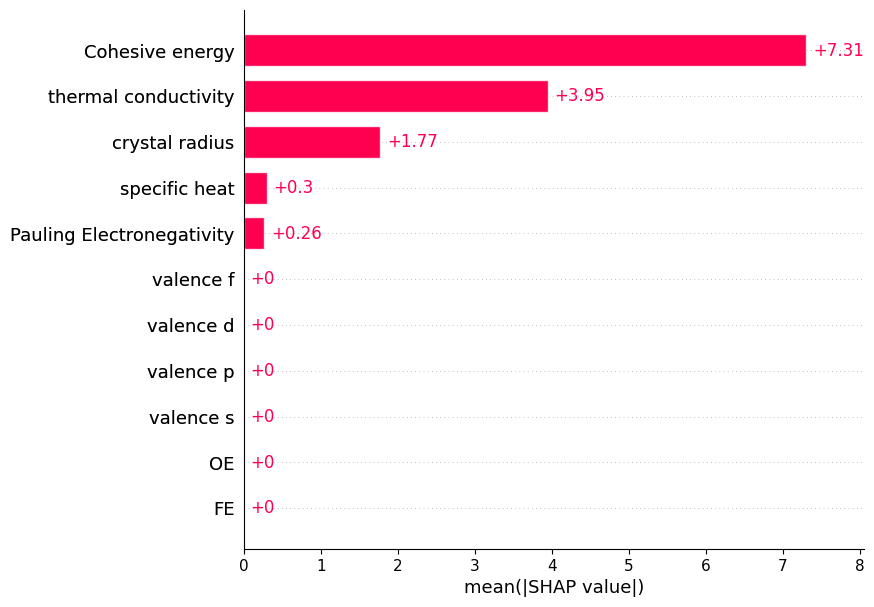

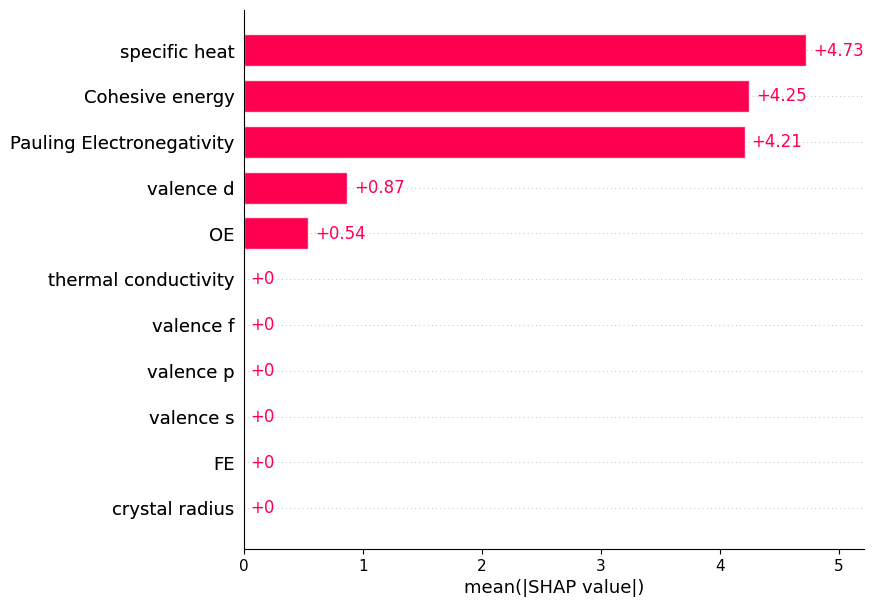

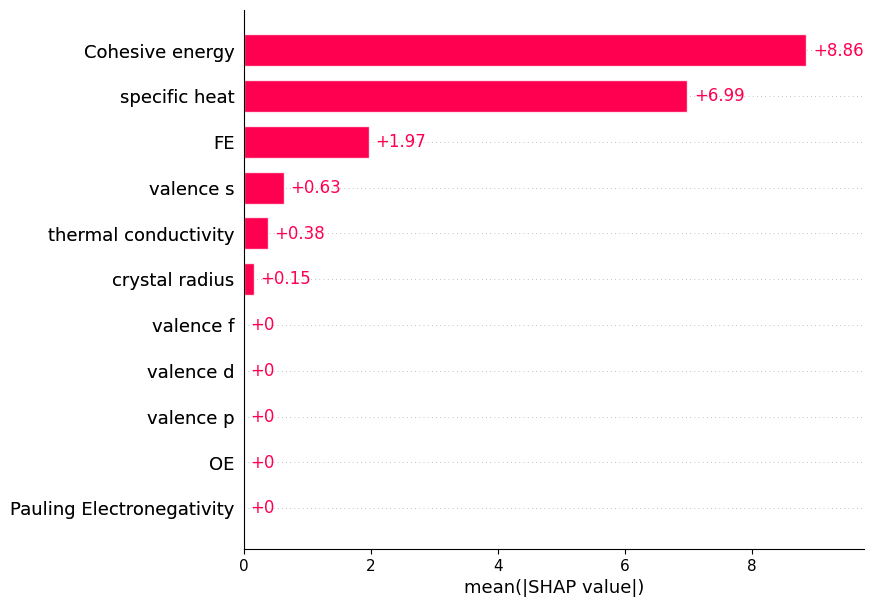

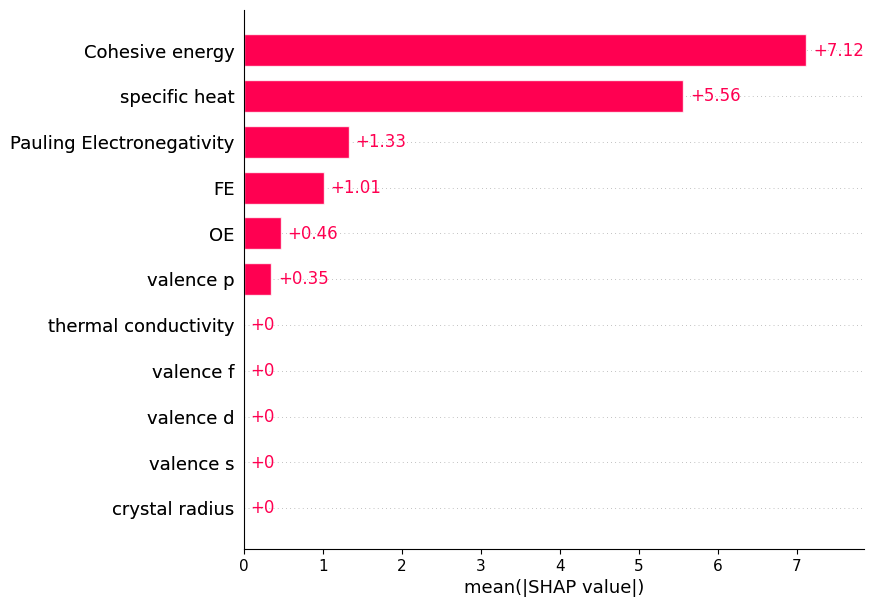

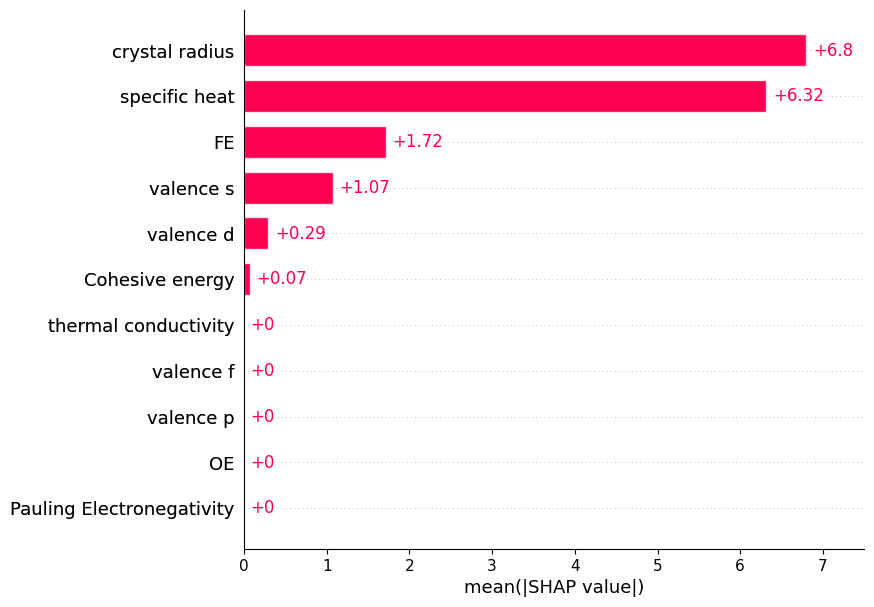

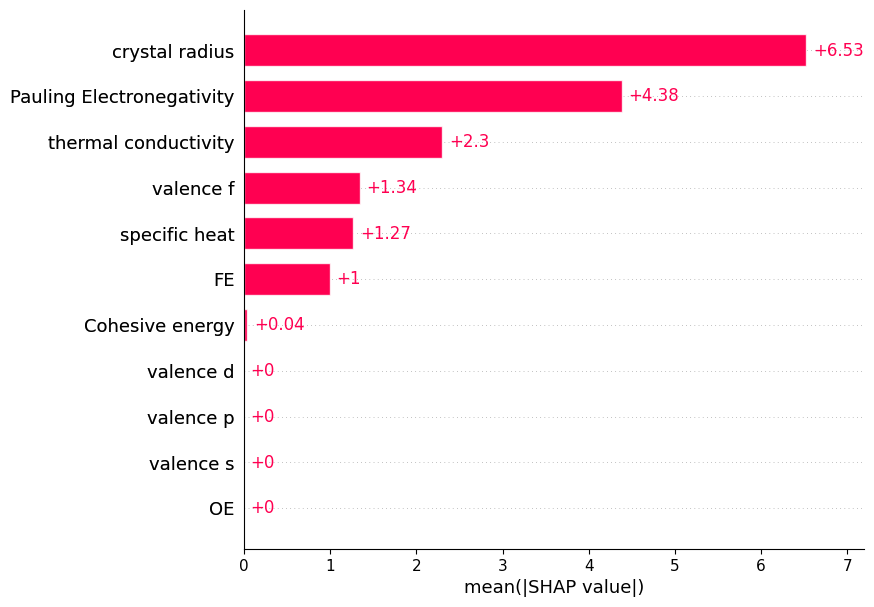

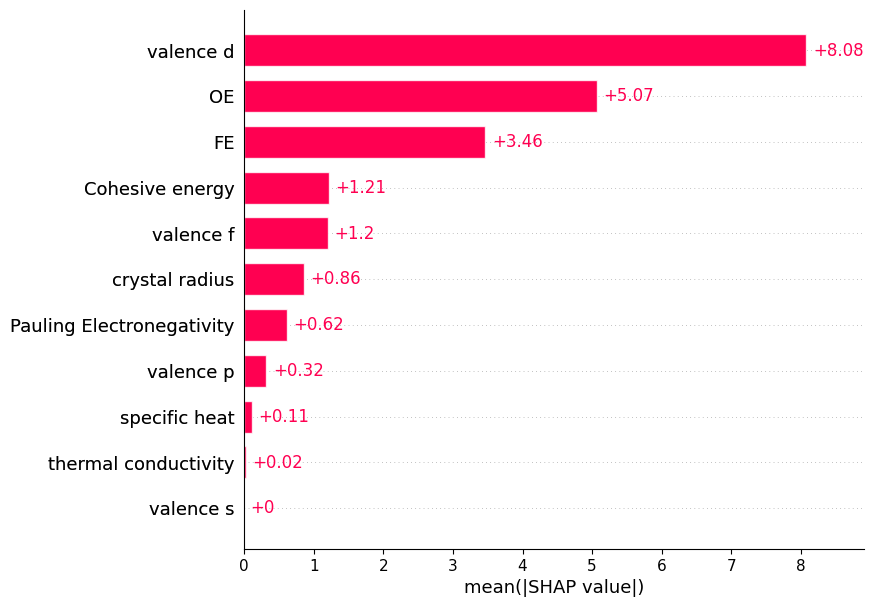

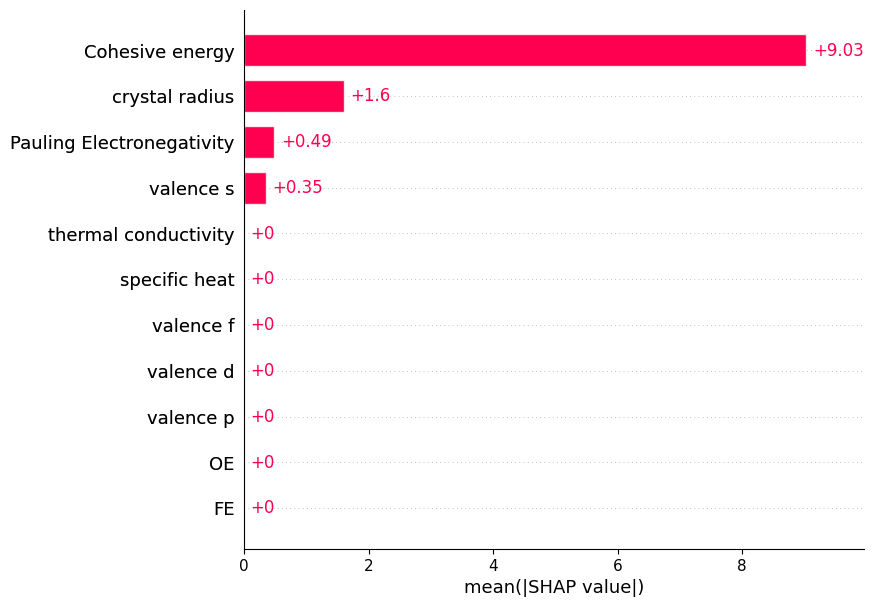

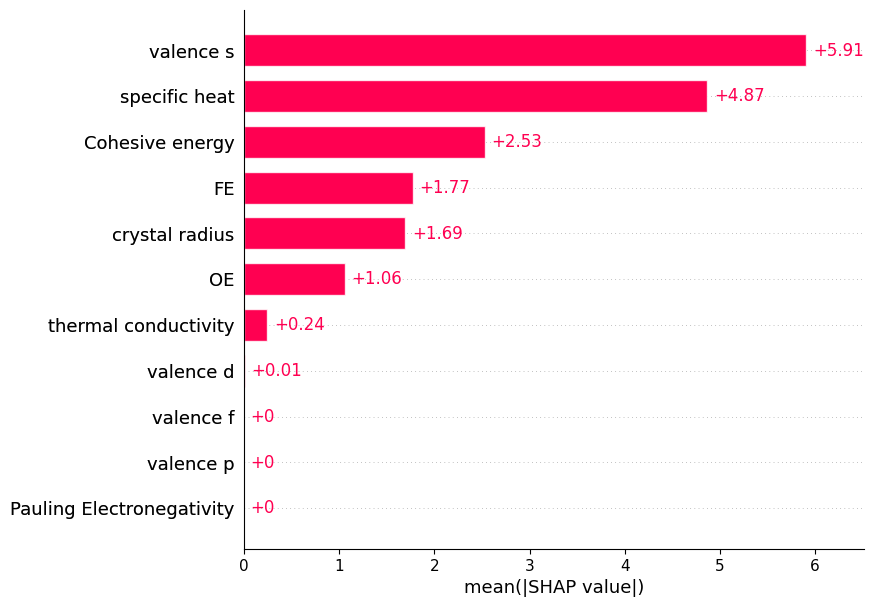

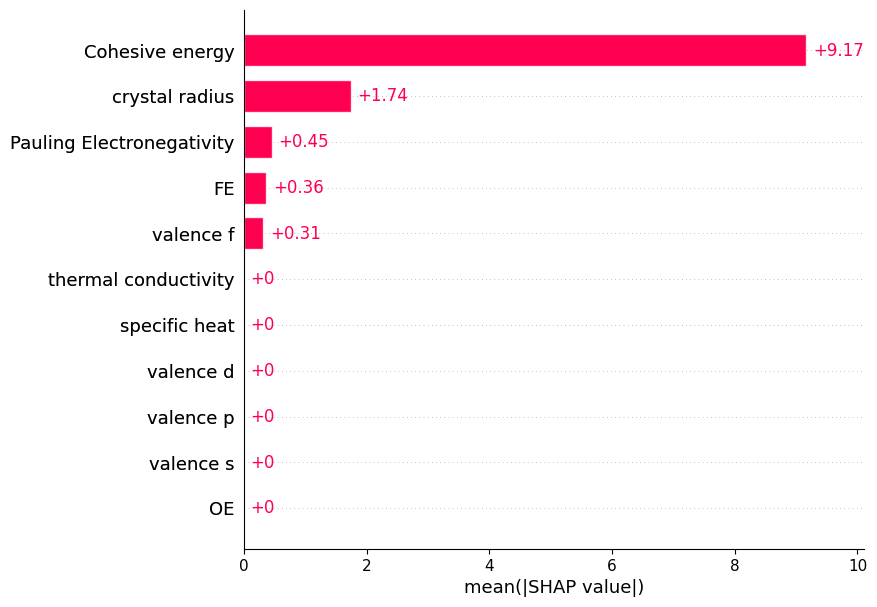

In [ ]:
model_DT.plot_SHAP('all')

### Random Forest


In [ ]:
random_seeds = np.arange(0,10)

model_RF = ModelEvaluatorBayes(X_des, y_nor, random_seeds, RandomForestRegressor, param_space_RF, results_dict=results_sub, IIS_dict=IIS_sub, model_dict=models_sub)
model_RF.evaluate_model()

Random seed 0 finished



The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.


Random seed 1 finished



The objective has been evaluated at this point before.


Random seed 2 finished



The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.


Random seed 3 finished

Random seed 4 finished



The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.


Random seed 5 finished



The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.


Random seed 6 finished



The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.


Random seed 7 finished



The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.


Random seed 8 finished

Random seed 9 finished



In [ ]:
model_RF.show_IIS()

,Feature,Mean Rank,Non-Zero Frequency (%),IIS
6,valence d,2.4,100.0,0.807500
10,Cohesive energy,3.1,100.0,0.776452
8,specific heat,3.2,100.0,0.773125
2,FE,3.9,100.0,0.754615
0,crystal radius,5.1,100.0,0.734706
3,OE,5.6,100.0,0.728929
4,valence s,6.7,100.0,0.719254
1,Pauling Electronegativity,7.5,100.0,0.714000
9,thermal conductivity,7.5,100.0,0.714000
5,valence p,10.3,100.0,0.702039


In [ ]:
model_RF.show_shap_ranks()

{'crystal radius': [6, 7, 4, 5, 4, 5, 9, 2, 4, 5],
 'Pauling Electronegativity': [8, 4, 9, 9, 9, 6, 7, 7, 8, 8],
 'FE': [5, 3, 5, 3, 5, 8, 1, 5, 1, 3],
 'OE': [3, 8, 3, 4, 6, 7, 5, 6, 7, 7],
 'valence s': [9, 5, 8, 7, 7, 3, 4, 9, 9, 6],
 'valence p': [10, 10, 10, 10, 10, 11, 11, 10, 10, 11],
 'valence d': [2, 1, 1, 8, 2, 2, 2, 3, 2, 1],
 'valence f': [11, 11, 11, 11, 11, 10, 10, 11, 11, 10],
 'specific heat': [4, 2, 6, 2, 1, 1, 8, 1, 5, 2],
 'thermal conductivity': [7, 9, 7, 6, 8, 9, 6, 8, 6, 9],
 'Cohesive energy': [1, 6, 2, 1, 3, 4, 3, 4, 3, 4]}

In [ ]:
model_RF.show_parameters()

{0: OrderedDict([('max_depth', 9),
              ('max_features', 5),
              ('min_samples_leaf', 1),
              ('min_samples_split', 0.01)]),
 1: OrderedDict([('max_depth', 6),
              ('max_features', 1),
              ('min_samples_leaf', 4),
              ('min_samples_split', 0.01)]),
 2: OrderedDict([('max_depth', 9),
              ('max_features', 5),
              ('min_samples_leaf', 1),
              ('min_samples_split', 0.01)]),
 3: OrderedDict([('max_depth', 4),
              ('max_features', 1),
              ('min_samples_leaf', 1),
              ('min_samples_split', 0.01)]),
 4: OrderedDict([('max_depth', 7),
              ('max_features', 8),
              ('min_samples_leaf', 2),
              ('min_samples_split', 0.0363772863980244)]),
 5: OrderedDict([('max_depth', 3),
              ('max_features', 1),
              ('min_samples_leaf', 1),
              ('min_samples_split', 0.02106915188321918)]),
 6: OrderedDict([('max_depth', 5),
            

In [ ]:
model_RF.show_performance()

,random_seed,training R2,test R2,training RMSE,test RMSE,cv_score
0,0,0.750479,0.371593,7.372048,12.921377,0.652003
1,1,0.617791,0.504141,8.760094,11.787958,0.426132
2,2,0.785879,0.181939,6.715353,15.101577,0.675363
3,3,0.651269,0.664599,9.136848,7.584433,0.591465
4,4,0.662426,0.686445,8.618236,8.939487,0.488761
5,5,0.641338,0.271054,8.979354,12.974582,0.498824
6,6,0.673593,0.576558,8.777286,8.642199,0.600005
7,7,0.676822,0.537238,8.335687,11.232275,0.440846
8,8,0.651733,0.701374,8.722645,8.698135,0.507968
9,9,0.649334,0.693430,8.231407,10.587262,0.580725


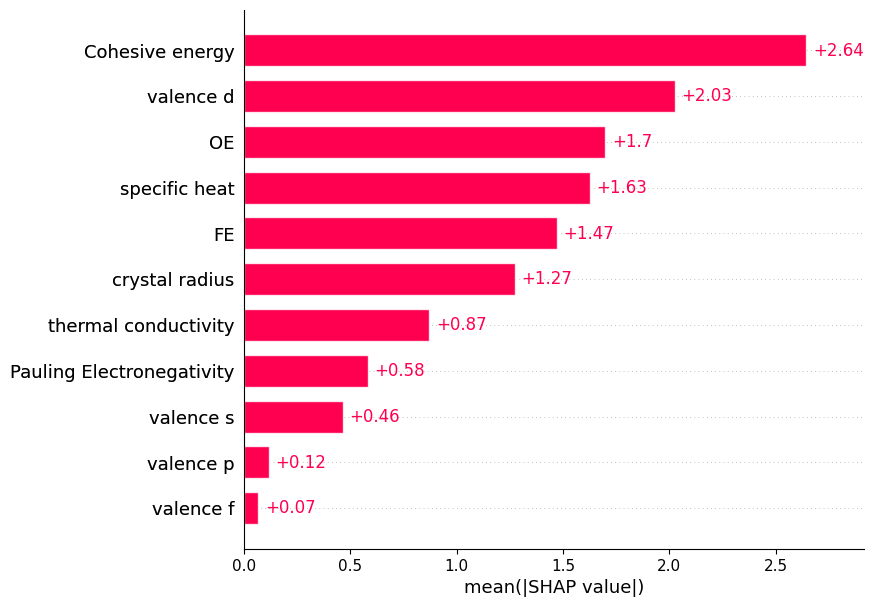

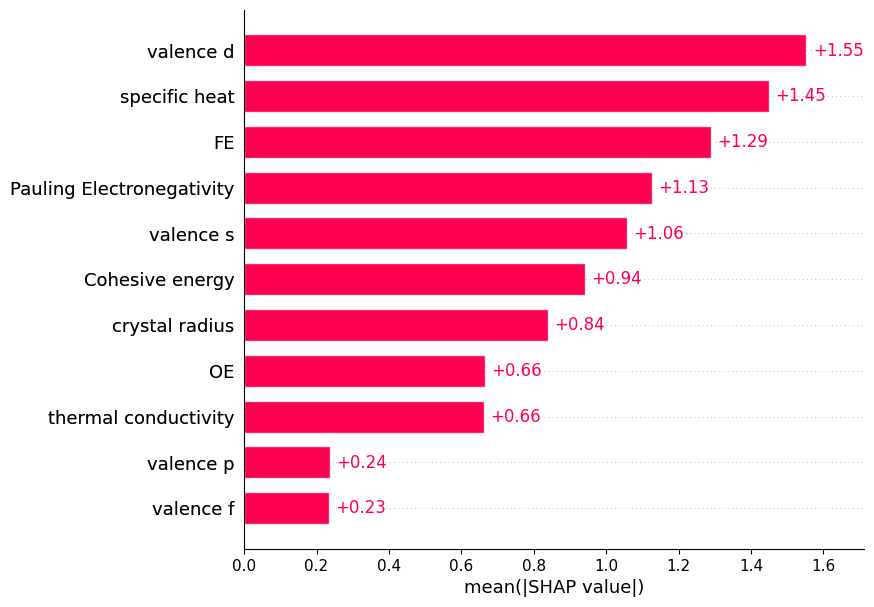

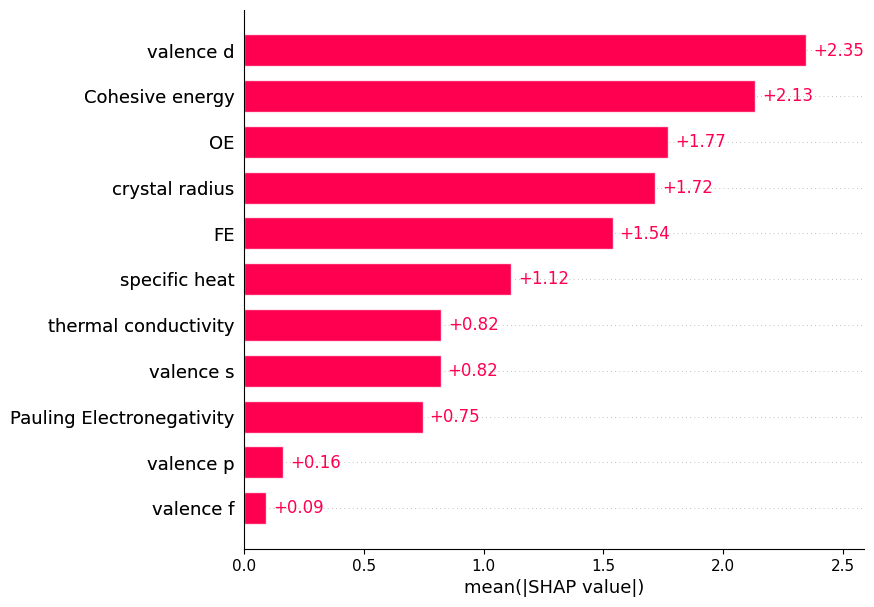

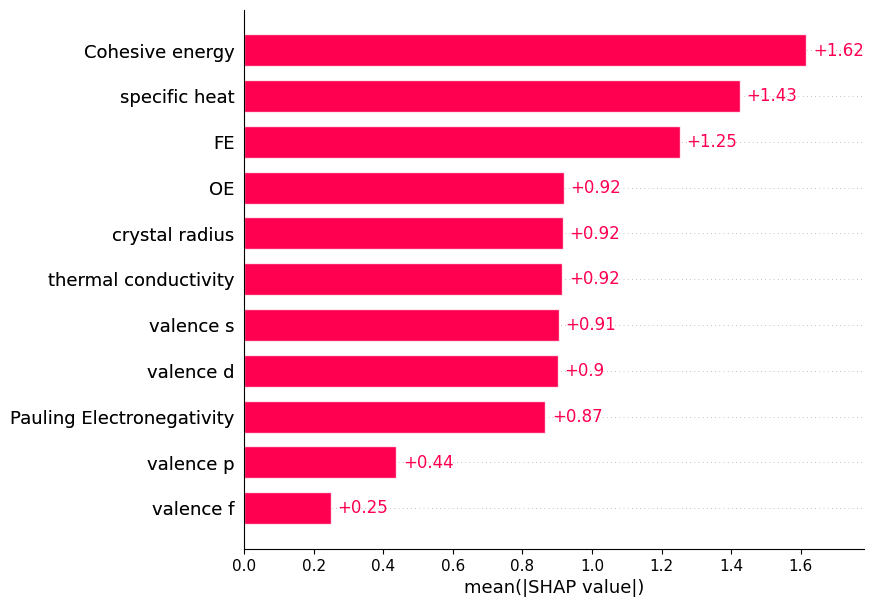

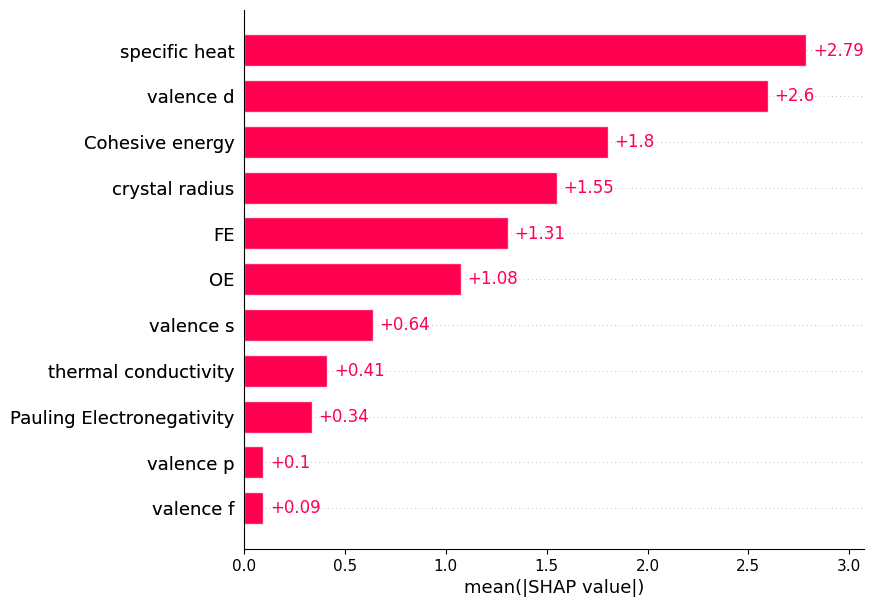

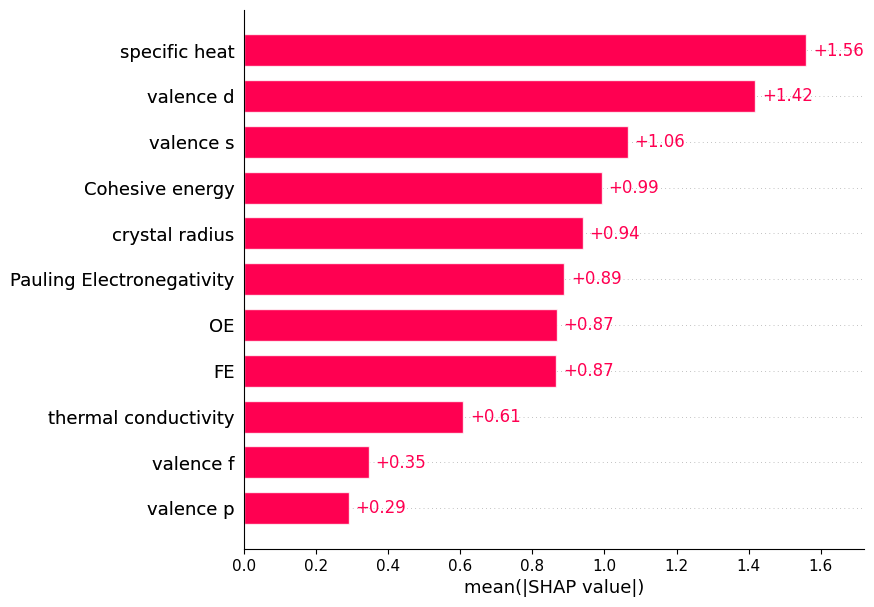

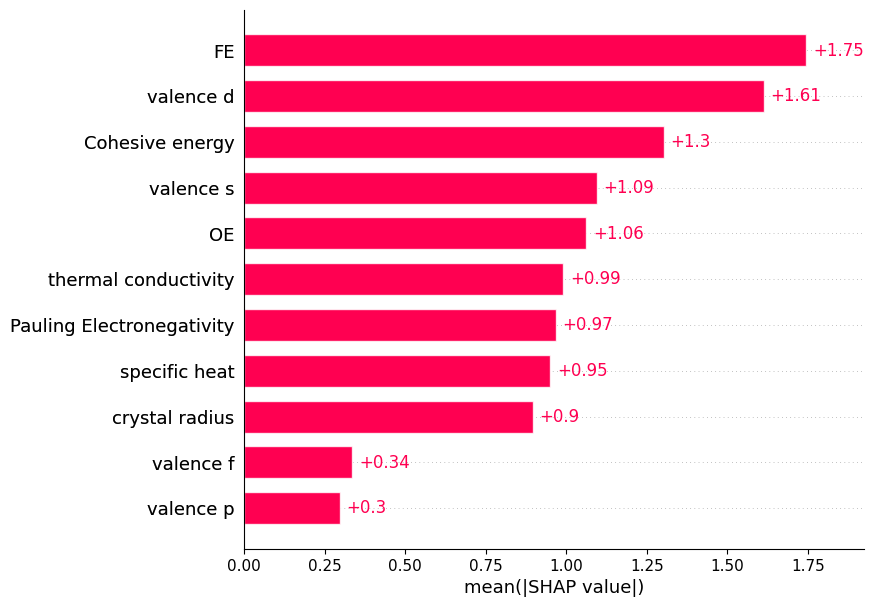

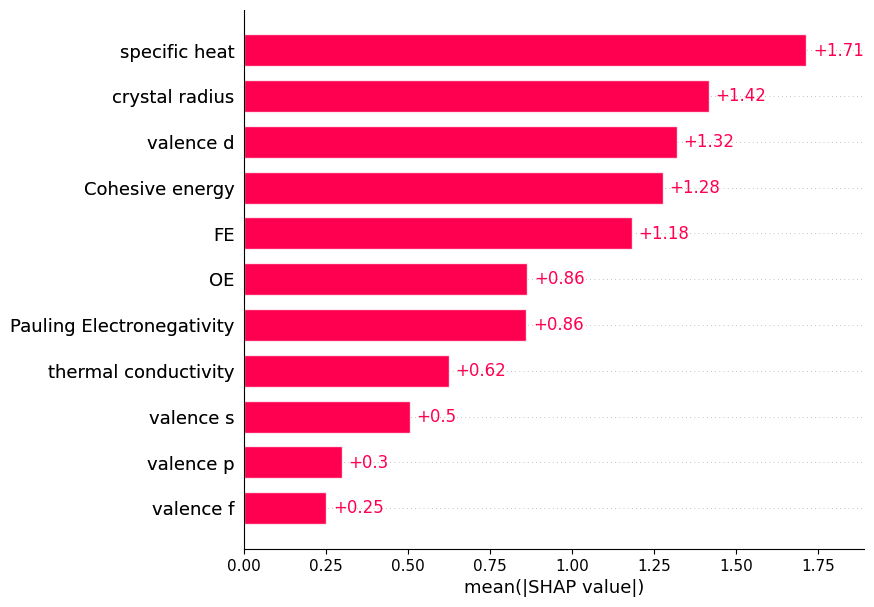

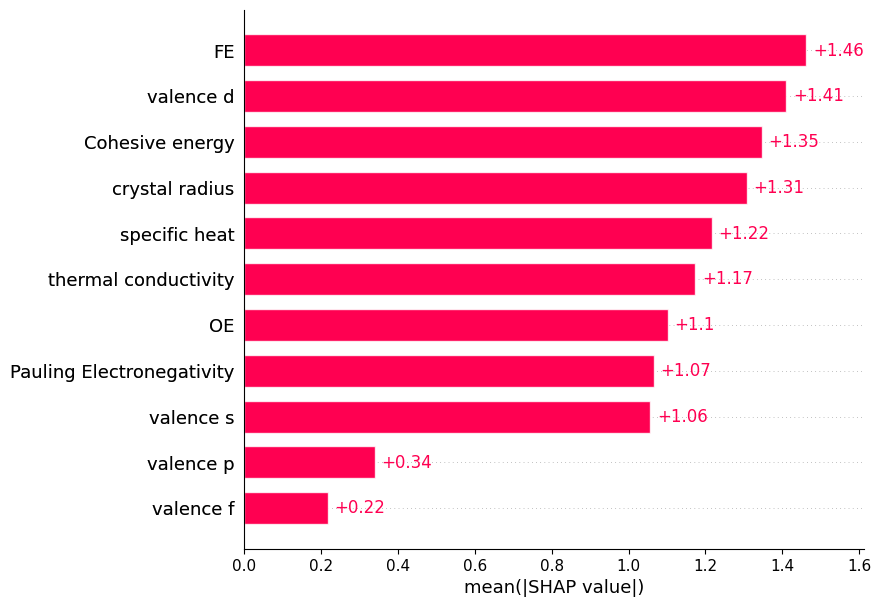

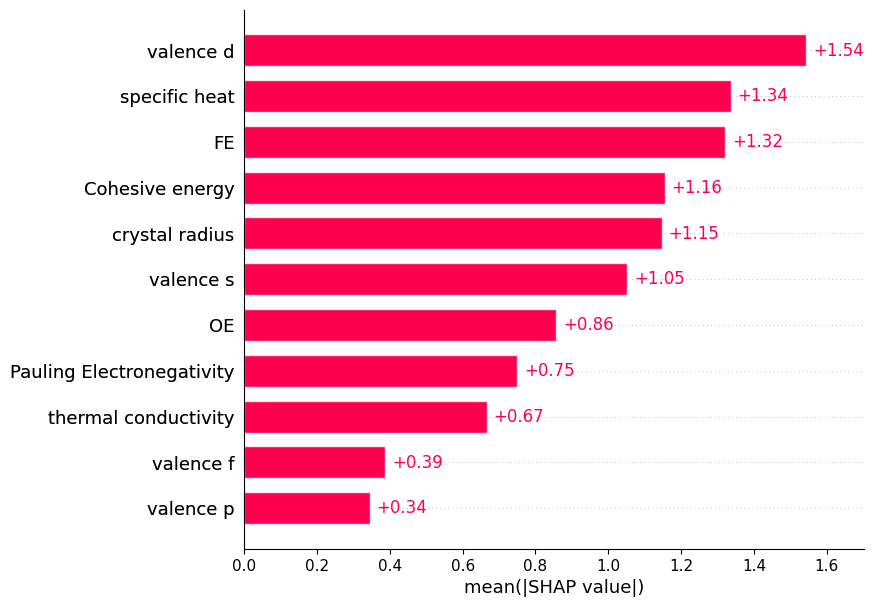

In [ ]:
model_RF.plot_SHAP('all')

### Gradient boost trees

In [ ]:
random_seeds = np.arange(0,10)
model_GB = ModelEvaluatorBayes(X_des, y_nor, random_seeds, GradientBoostingRegressor, param_space_GB, results_dict=results_sub, IIS_dict=IIS_sub, model_dict=models_sub)
model_GB.evaluate_model()

Random seed 0 finished

Random seed 1 finished

Random seed 2 finished

Random seed 3 finished

Random seed 4 finished

Random seed 5 finished

Random seed 6 finished

Random seed 7 finished

Random seed 8 finished

Random seed 9 finished



In [ ]:
model_GB.show_IIS()

,Feature,Mean Rank,Non-Zero Frequency (%),IIS
10,Cohesive energy,1.500,100.0,0.890000
0,crystal radius,3.300,100.0,0.770000
8,specific heat,4.300,100.0,0.746744
9,thermal conductivity,5.000,100.0,0.736000
2,FE,5.600,100.0,0.728929
6,valence d,6.100,100.0,0.724098
1,Pauling Electronegativity,6.400,100.0,0.721562
3,OE,6.700,100.0,0.719254
4,valence s,8.000,100.0,0.711250
5,valence p,10.000,90.0,0.636000


In [ ]:
model_GB.show_shap_ranks()

{'crystal radius': [3, 1, 4, 4, 5, 1, 5, 2, 4, 4],
 'Pauling Electronegativity': [10, 7, 6, 5, 6, 3, 6, 9, 5, 7],
 'FE': [7, 3, 7, 8, 9, 7, 3, 3, 6, 3],
 'OE': [5, 6, 9, 6, 2, 6, 7, 8, 9, 9],
 'valence s': [8, 9, 10, 7, 4, 9, 8, 7, 8, 10],
 'valence p': [11, 11, 11, 8, 10, 10, 10, 11, 8],
 'valence d': [6, 5, 8, 9, 1, 8, 1, 11, 10, 2],
 'valence f': [9, 5, 10, 11, 11, 5, 7, 11],
 'specific heat': [4, 4, 3, 3, 7, 4, 4, 6, 3, 5],
 'thermal conductivity': [2, 8, 2, 2, 10, 5, 9, 4, 2, 6],
 'Cohesive energy': [1, 2, 1, 1, 3, 2, 2, 1, 1, 1]}

In [ ]:
model_GB.show_performance()

,random_seed,training R2,test R2,training RMSE,test RMSE,cv_score
0,0,0.750635,0.367124,7.369743,12.967248,0.645432
1,1,0.582488,0.496737,9.155722,11.875635,0.399072
2,2,0.773750,0.239140,6.902925,14.564045,0.676663
3,3,0.650945,0.659372,9.141092,7.643310,0.597439
4,4,0.662280,0.676282,8.620091,9.083196,0.494699
5,5,0.649834,0.376778,8.872373,11.996846,0.416359
6,6,0.670690,0.589487,8.816240,8.509237,0.590201
7,7,0.657360,0.520124,8.583002,11.438077,0.438756
8,8,0.651488,0.707095,8.725709,8.614418,0.525703
9,9,0.642142,0.653181,8.315381,11.260818,0.593664


In [ ]:
model_GB.show_parameters()

{0: OrderedDict([('learning_rate', 0.029290240528648617),
              ('max_depth', 10),
              ('min_samples_leaf', 1),
              ('min_samples_split', 2),
              ('n_estimators', 128)]),
 1: OrderedDict([('learning_rate', 0.011846369373047795),
              ('max_depth', 2),
              ('min_samples_leaf', 8),
              ('min_samples_split', 6),
              ('n_estimators', 148)]),
 2: OrderedDict([('learning_rate', 0.011587506581687489),
              ('max_depth', 10),
              ('min_samples_leaf', 1),
              ('min_samples_split', 10),
              ('n_estimators', 176)]),
 3: OrderedDict([('learning_rate', 0.012579871655640472),
              ('max_depth', 10),
              ('min_samples_leaf', 1),
              ('min_samples_split', 10),
              ('n_estimators', 142)]),
 4: OrderedDict([('learning_rate', 0.02530238320800544),
              ('max_depth', 5),
              ('min_samples_leaf', 9),
              ('min_samples_split',

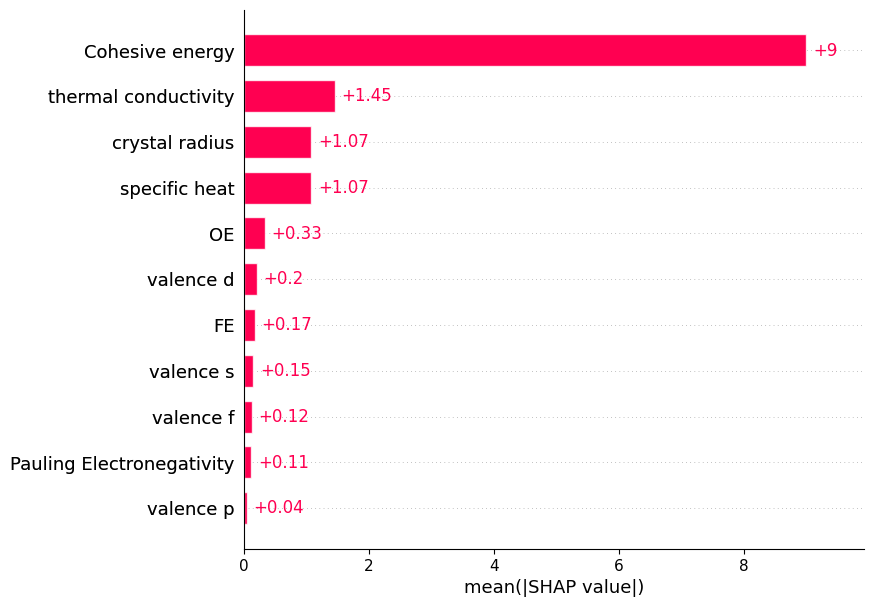

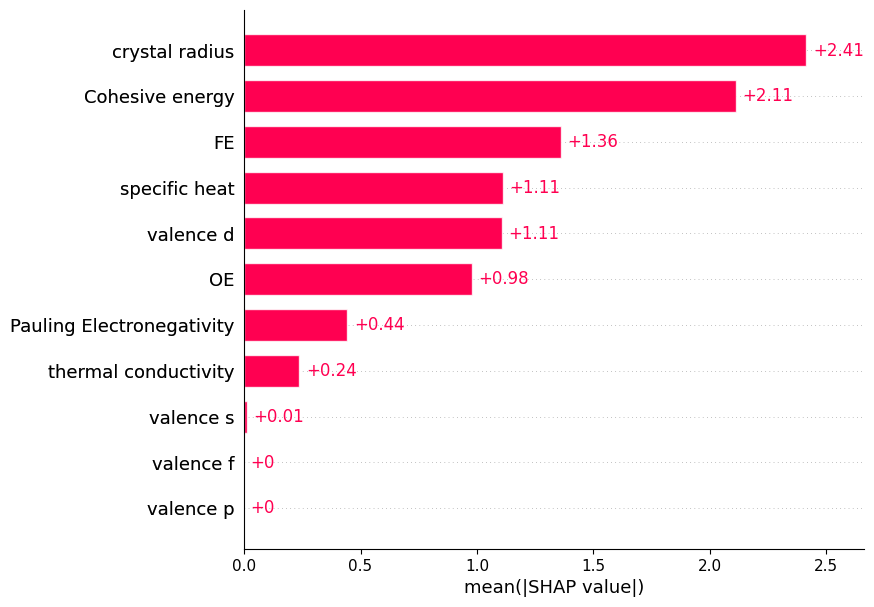

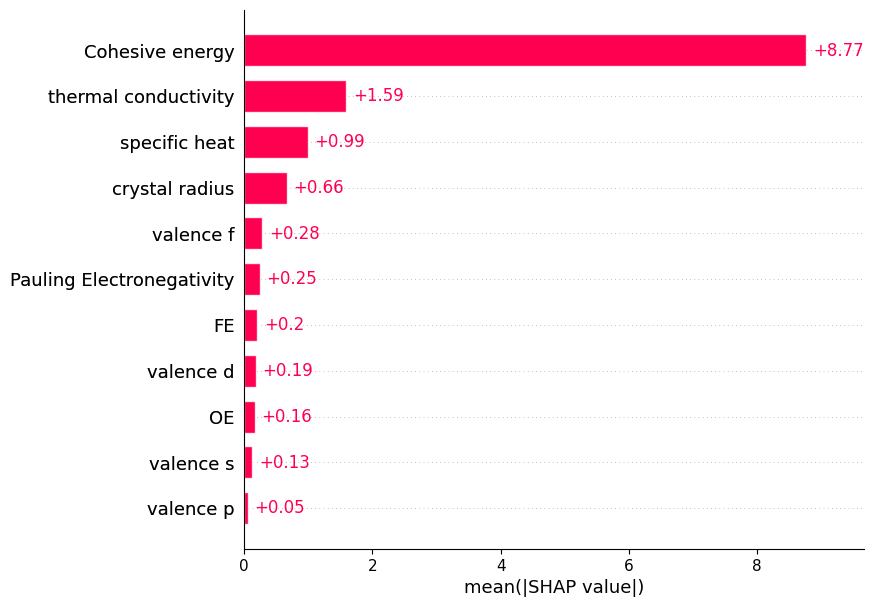

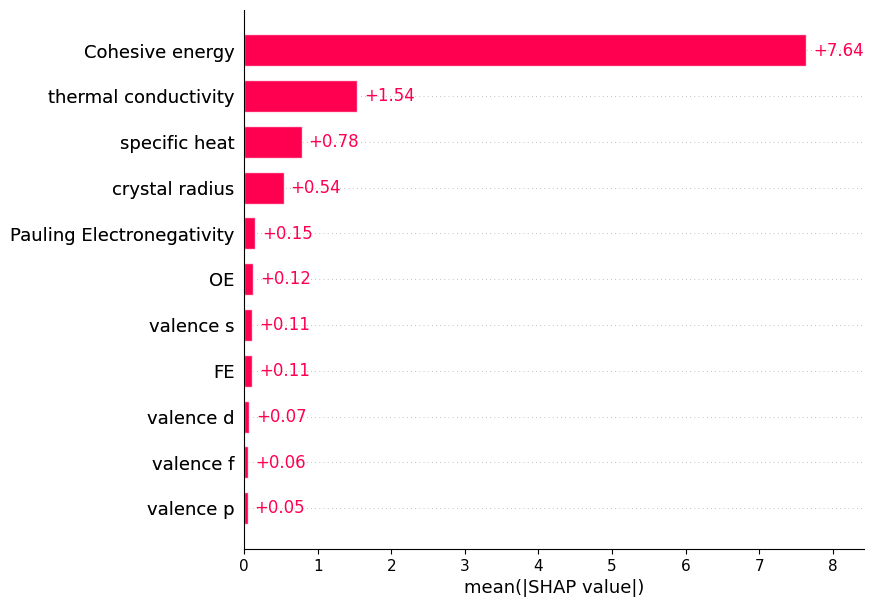

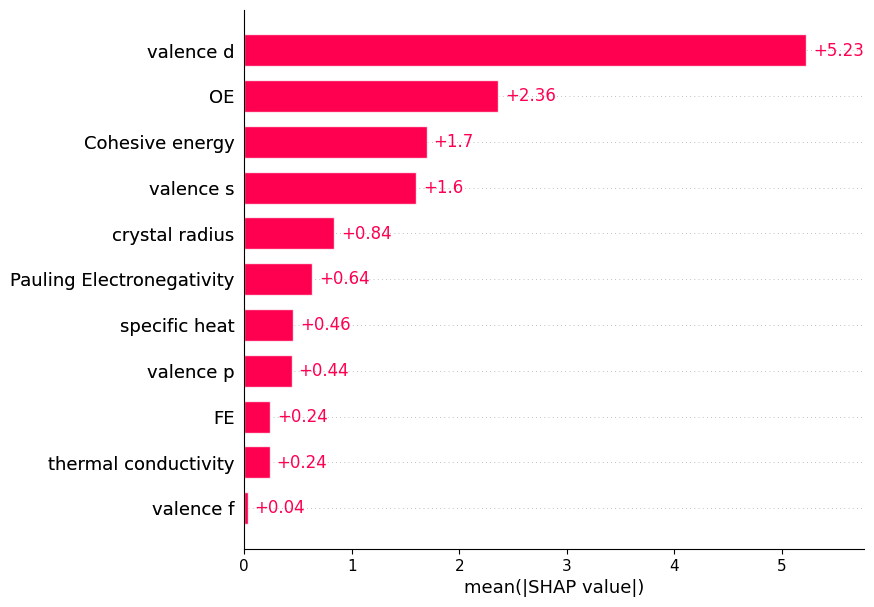

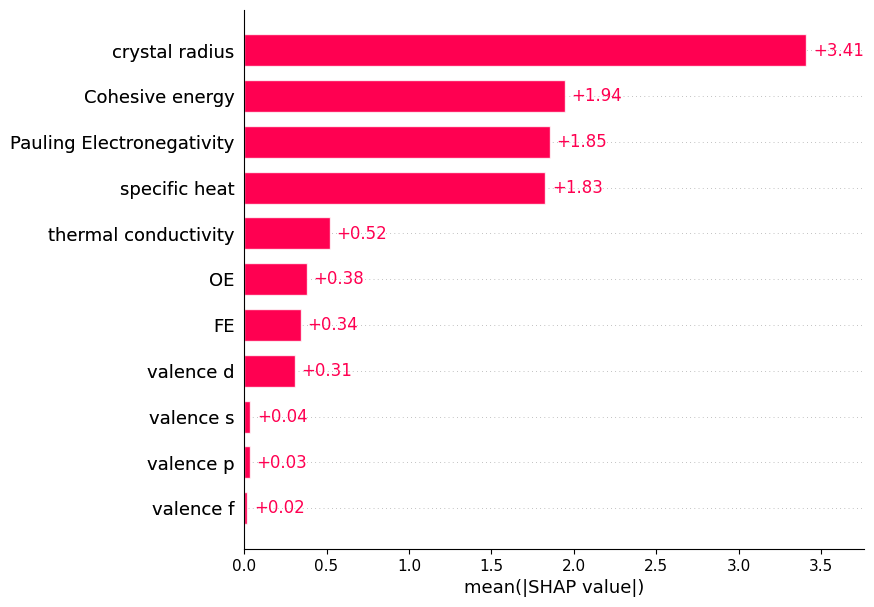

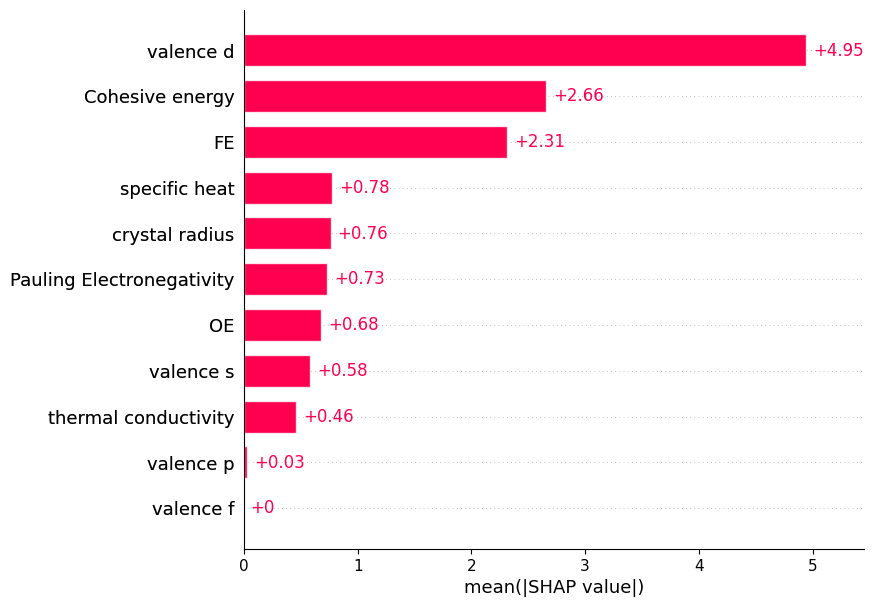

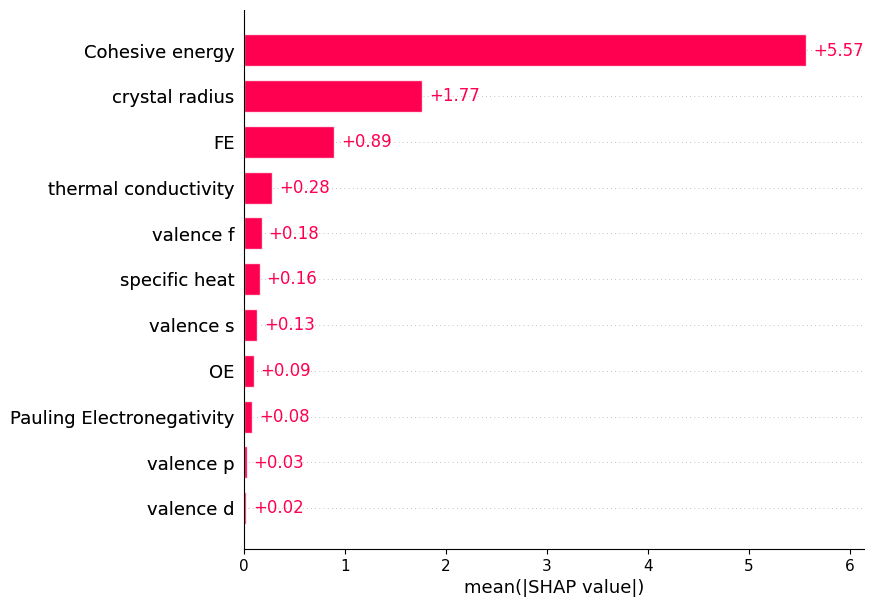

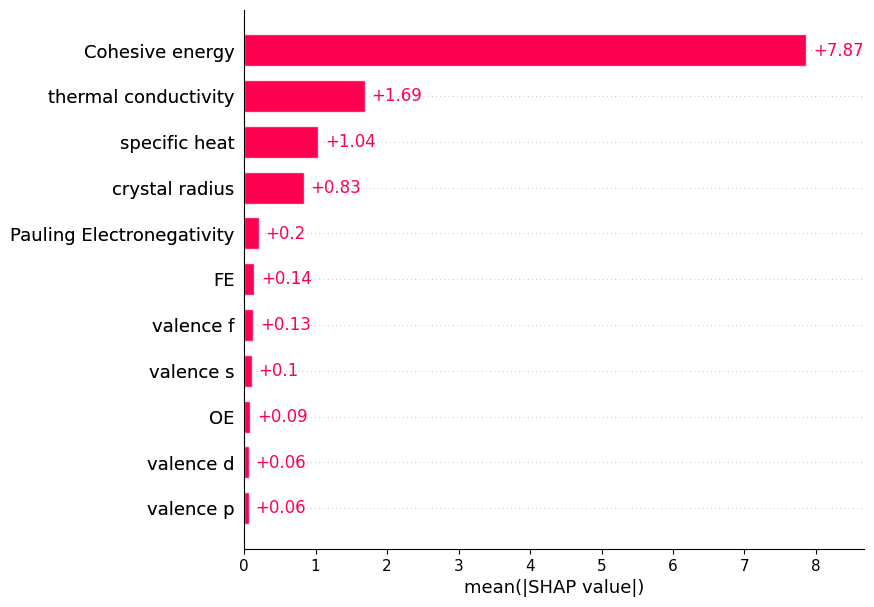

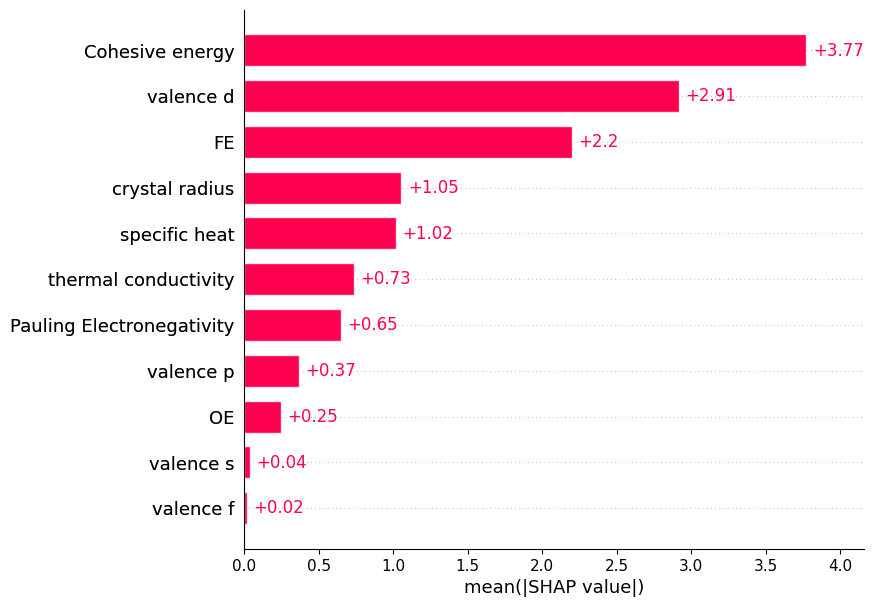

In [ ]:
model_GB.plot_SHAP('all')

### XGboost

In [ ]:
random_seeds = np.arange(0,10)

model_XGB = ModelEvaluatorBayes(X_des, y_nor, random_seeds, XGBRegressor, param_space_XGB, results_dict=results_sub, IIS_dict=IIS_sub, model_dict=models_sub)
model_XGB.evaluate_model()

Random seed 0 finished

Random seed 1 finished

Random seed 2 finished

Random seed 3 finished

Random seed 4 finished



The objective has been evaluated at this point before.


Random seed 5 finished

Random seed 6 finished

Random seed 7 finished

Random seed 8 finished

Random seed 9 finished



In [ ]:
model_XGB.show_IIS()

,Feature,Mean Rank,Non-Zero Frequency (%),IIS
10,Cohesive energy,2.700000,100.0,0.792222
8,specific heat,2.111111,90.0,0.759316
0,crystal radius,4.300000,100.0,0.746744
2,FE,4.300000,100.0,0.746744
1,Pauling Electronegativity,6.444444,90.0,0.654207
9,thermal conductivity,6.444444,90.0,0.654207
6,valence d,3.875000,80.0,0.621161
3,OE,5.125000,80.0,0.600390
4,valence s,7.333333,60.0,0.447000
7,valence f,9.000000,10.0,0.103667


In [ ]:
model_XGB.show_shap_ranks()

{'crystal radius': [6, 1, 3, 3, 7, 8, 4, 3, 5, 3],
 'Pauling Electronegativity': [8, 3, 7, 6, 7, 9, 4, 9, 5],
 'FE': [4, 5, 4, 4, 3, 5, 2, 6, 6, 4],
 'OE': [5, 6, 5, 2, 3, 7, 7, 6],
 'valence s': [8, 9, 3, 8, 8, 8],
 'valence p': [10],
 'valence d': [1, 6, 2, 6, 1, 5, 3, 7],
 'valence f': [9],
 'specific heat': [2, 4, 2, 1, 1, 5, 1, 2, 1],
 'thermal conductivity': [7, 5, 2, 8, 9, 6, 8, 4, 9],
 'Cohesive energy': [3, 2, 1, 1, 4, 4, 7, 2, 1, 2]}

In [ ]:
model_XGB.show_parameters()

{0: OrderedDict([('learning_rate', 0.039164491742617644),
              ('max_depth', 7),
              ('n_estimators', 128),
              ('reg_alpha', 0.1490869151475826),
              ('reg_lambda', 7.412260146273903)]),
 1: OrderedDict([('learning_rate', 0.11637347621908395),
              ('max_depth', 3),
              ('n_estimators', 10),
              ('reg_alpha', 1e-06),
              ('reg_lambda', 1.0113588665845312)]),
 2: OrderedDict([('learning_rate', 0.09150144709926208),
              ('max_depth', 3),
              ('n_estimators', 183),
              ('reg_alpha', 1e-06),
              ('reg_lambda', 100.0)]),
 3: OrderedDict([('learning_rate', 0.04550338790860213),
              ('max_depth', 10),
              ('n_estimators', 54),
              ('reg_alpha', 0.000523864155963807),
              ('reg_lambda', 0.3432888379619141)]),
 4: OrderedDict([('learning_rate', 0.28812213508129303),
              ('max_depth', 10),
              ('n_estimators', 141),
   

In [ ]:
model_XGB.show_performance()

,random_seed,training R2,test R2,training RMSE,test RMSE,cv_score
0,0,0.749047,0.386499,7.393171,12.767212,0.659659
1,1,0.567622,0.469384,9.317297,12.194102,0.382794
2,2,0.764726,0.224458,7.039244,14.703888,0.675701
3,3,0.663871,0.664700,8.970240,7.583295,0.600617
4,4,0.664512,0.688886,8.591568,8.904611,0.492402
5,5,0.674032,0.314872,8.560326,12.578577,0.409716
6,6,0.668141,0.617444,8.850287,8.214380,0.597811
7,7,0.669390,0.562687,8.430981,10.919044,0.476705
8,8,0.651041,0.701089,8.731304,8.702288,0.527405
9,9,0.646325,0.679352,8.266637,10.827626,0.599362


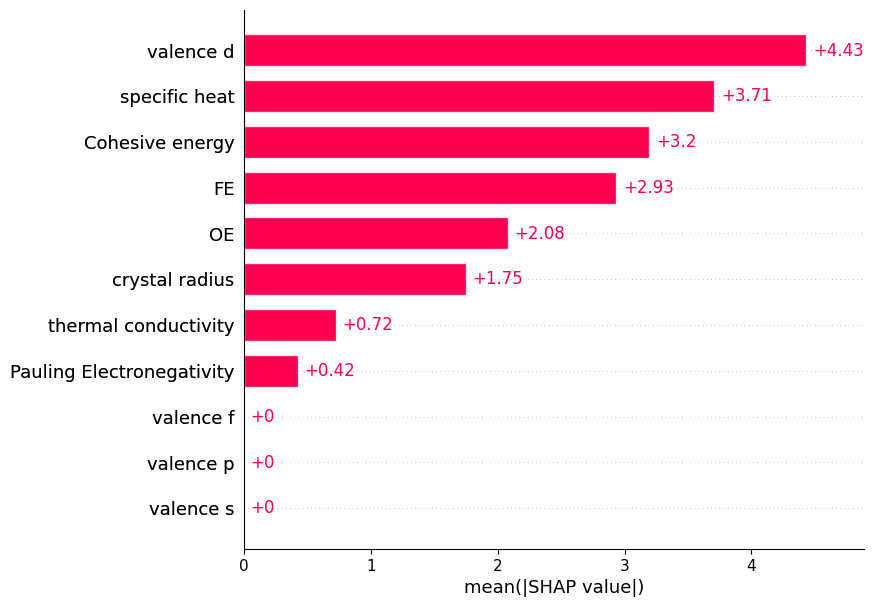

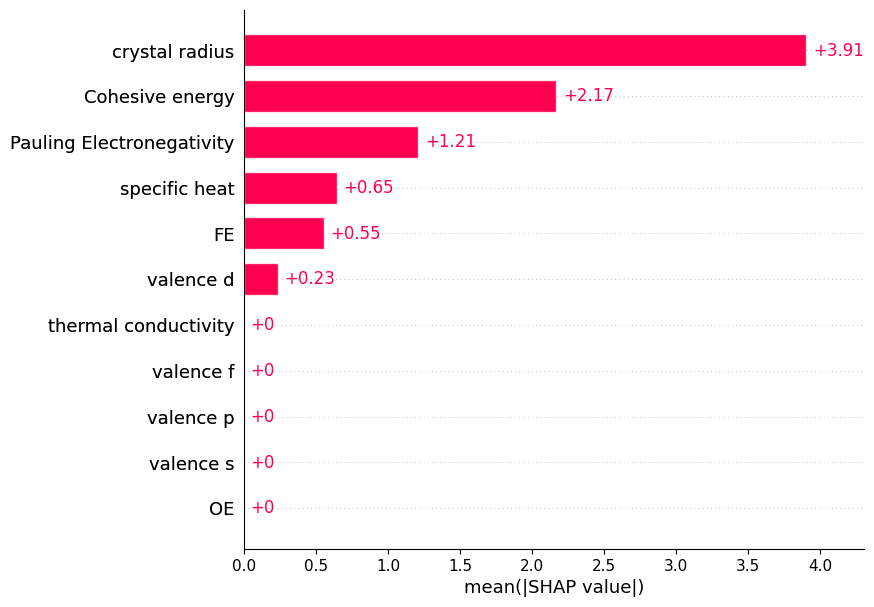

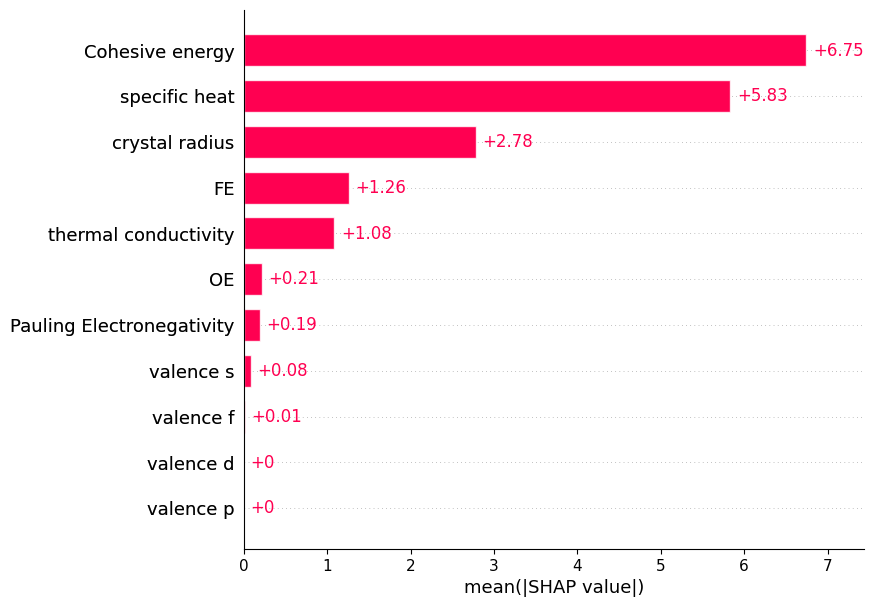

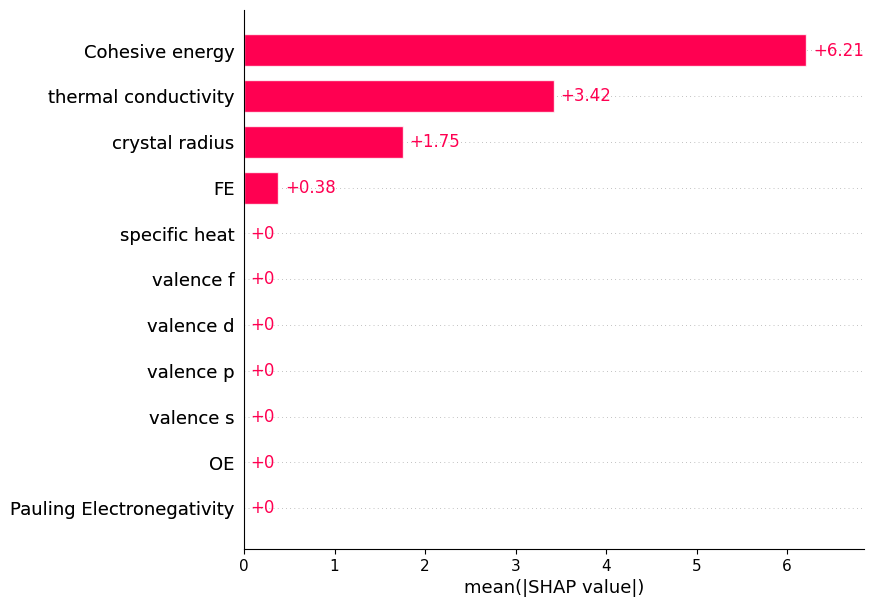

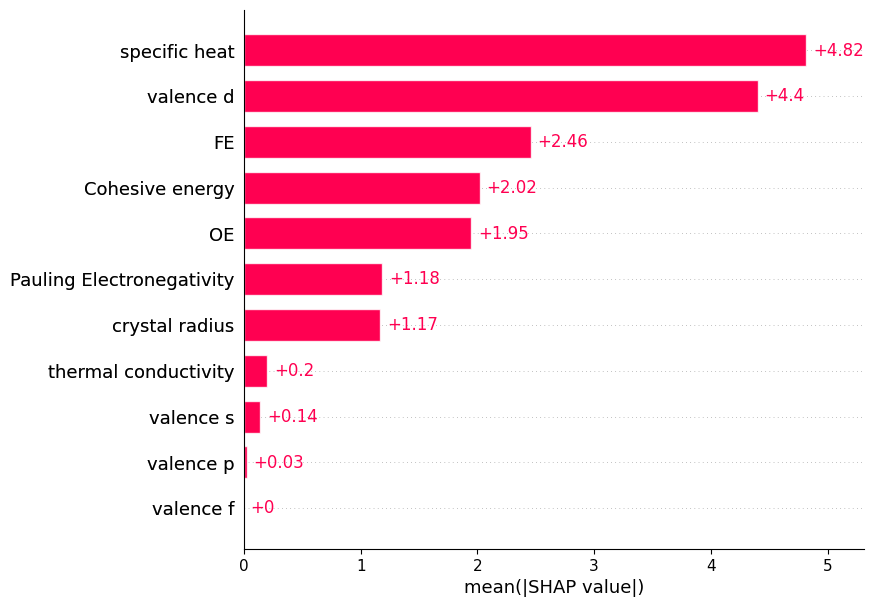

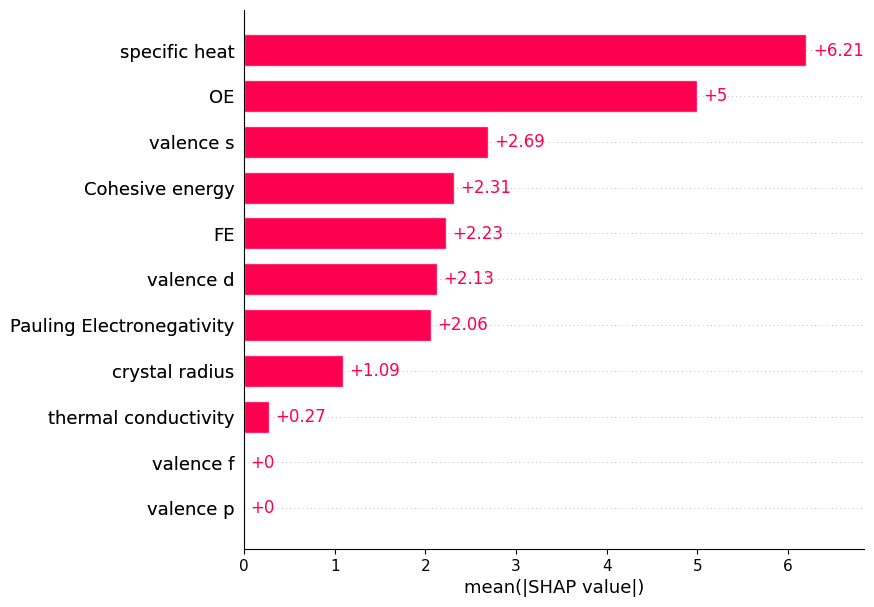

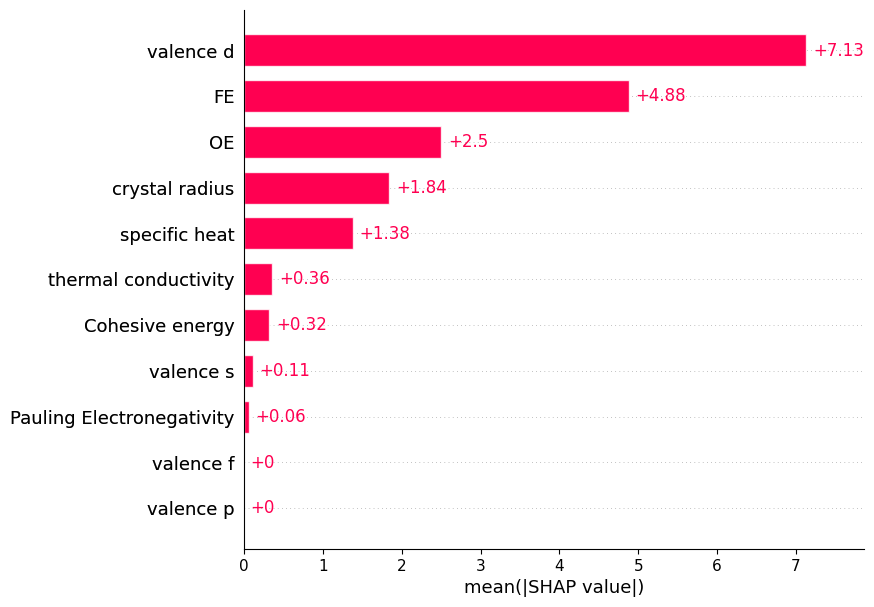

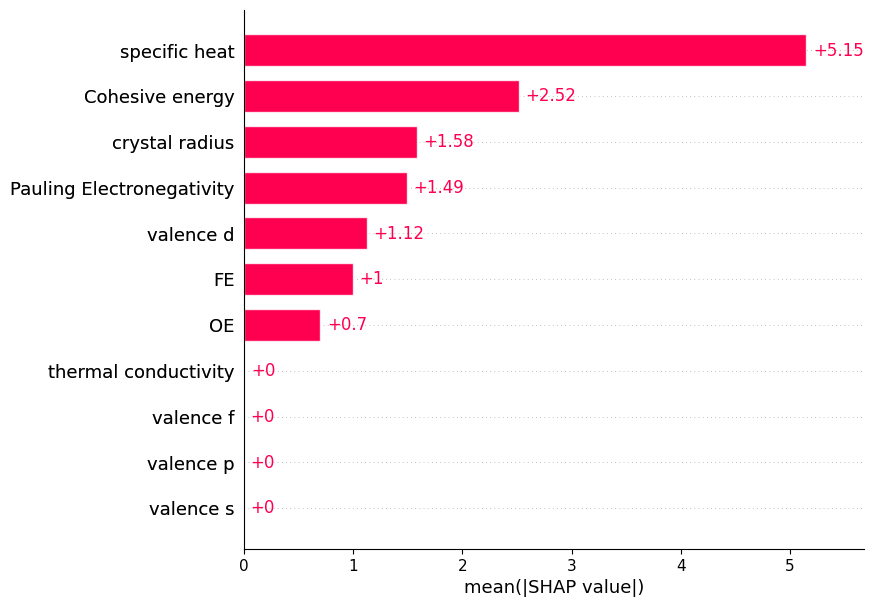

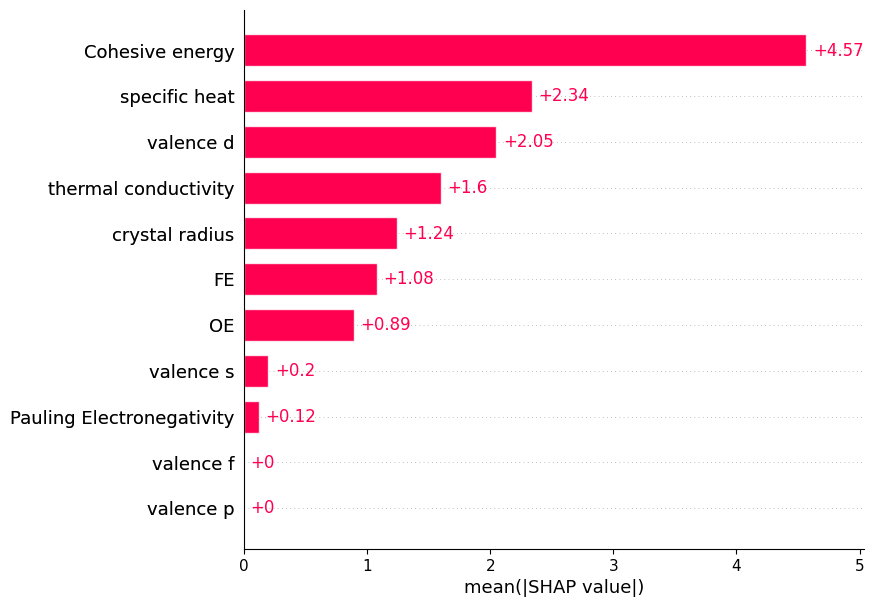

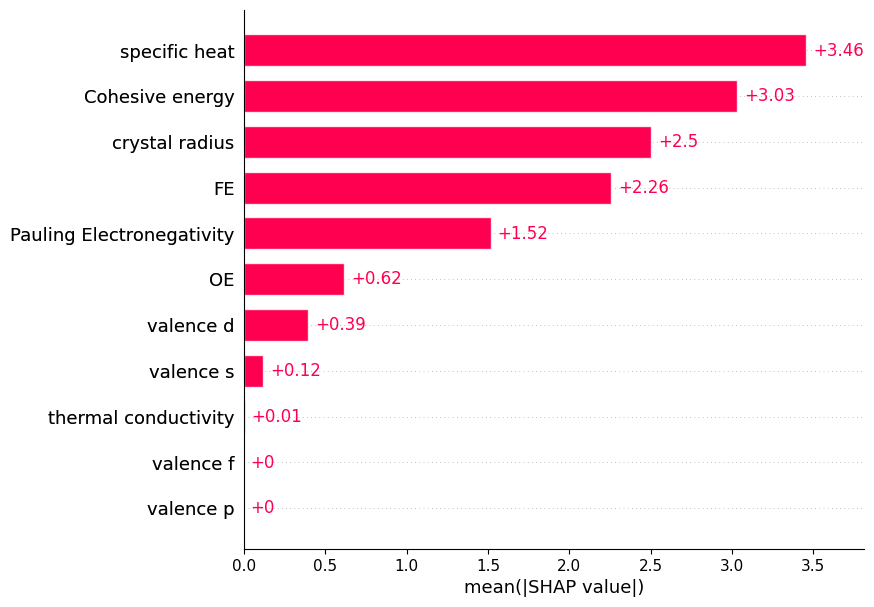

In [ ]:
model_XGB.plot_SHAP('all')

### Supprt Vector Regression

In [ ]:
random_seeds = np.arange(0,10)

model_SVR = ModelEvaluatorBayes(X_des, y_nor, random_seeds, SVR, param_space_SVR, results_dict=results_sub, IIS_dict=IIS_sub, model_dict=models_sub)
model_SVR.evaluate_model()

Permutation explainer: 113it [00:27,  2.87it/s]


Random seed 0 finished



Permutation explainer: 113it [00:25,  2.68it/s]


Random seed 1 finished



The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The object

Random seed 2 finished



Permutation explainer: 113it [00:26,  2.54it/s]


Random seed 3 finished



The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
Permutation explainer: 113it [00:25,  2.59it/s]


Random seed 4 finished



Permutation explainer: 113it [00:26,  2.49it/s]


Random seed 5 finished



Permutation explainer: 113it [00:25,  2.55it/s]


Random seed 6 finished



Permutation explainer: 113it [00:26,  2.48it/s]


Random seed 7 finished



Permutation explainer: 113it [00:25,  2.70it/s]


Random seed 8 finished



Permutation explainer: 113it [00:24,  2.67it/s]

Random seed 9 finished



In [ ]:
model_SVR.show_IIS()

,Feature,Mean Rank,Non-Zero Frequency (%),IIS
9,thermal conductivity,1.0,100.0,1.000000
6,valence d,2.0,100.0,0.835000
10,Cohesive energy,3.4,100.0,0.767059
7,valence f,3.6,100.0,0.761667
8,specific heat,5.4,100.0,0.731111
3,OE,5.6,100.0,0.728929
4,valence s,7.3,100.0,0.715205
5,valence p,7.8,100.0,0.712308
1,Pauling Electronegativity,8.9,100.0,0.707079
2,FE,10.0,100.0,0.703000


In [ ]:
model_SVR.show_shap_ranks()

{'crystal radius': [11, 11, 11, 11, 11, 11, 11, 11, 11, 11],
 'Pauling Electronegativity': [9, 9, 9, 9, 9, 9, 8, 9, 9, 9],
 'FE': [10, 10, 10, 10, 10, 10, 10, 10, 10, 10],
 'OE': [5, 6, 6, 6, 5, 6, 5, 5, 6, 6],
 'valence s': [7, 7, 7, 8, 8, 7, 7, 8, 7, 7],
 'valence p': [8, 8, 8, 7, 7, 8, 9, 7, 8, 8],
 'valence d': [2, 2, 2, 2, 2, 2, 2, 2, 2, 2],
 'valence f': [4, 3, 4, 4, 4, 3, 4, 3, 4, 3],
 'specific heat': [6, 5, 5, 5, 6, 5, 6, 6, 5, 5],
 'thermal conductivity': [1, 1, 1, 1, 1, 1, 1, 1, 1, 1],
 'Cohesive energy': [3, 4, 3, 3, 3, 4, 3, 4, 3, 4]}

In [ ]:
model_SVR.show_performance()

,random_seed,training R2,test R2,training RMSE,test RMSE,cv_score
0,0,0.727900,0.351028,7.698366,13.131104,0.650040
1,1,0.614198,0.519485,8.801171,11.604139,0.425484
2,2,0.724468,0.224321,7.617725,14.705185,0.611252
3,3,0.631587,0.598604,9.391140,8.297124,0.569658
4,4,0.627693,0.621951,9.050747,9.815879,0.457406
5,5,0.612620,0.412693,9.331921,11.646039,0.458536
6,6,0.649450,0.521009,9.096108,9.191597,0.615753
7,7,0.652742,0.578495,8.640656,10.719879,0.433288
8,8,0.613383,0.695385,9.190352,8.784926,0.519522
9,9,0.614159,0.640718,8.634383,11.461367,0.585624


In [ ]:
model_SVR.show_parameters()

{0: OrderedDict([('C', 15.333574817083097),
              ('epsilon', 0.5),
              ('gamma', 'auto'),
              ('kernel', 'rbf')]),
 1: OrderedDict([('C', 5.619821270057846),
              ('epsilon', 0.5),
              ('gamma', 'auto'),
              ('kernel', 'rbf')]),
 2: OrderedDict([('C', 6.348445243151049),
              ('epsilon', 0.5),
              ('gamma', 'auto'),
              ('kernel', 'rbf')]),
 3: OrderedDict([('C', 31.4908971513221),
              ('epsilon', 0.1),
              ('gamma', 'auto'),
              ('kernel', 'rbf')]),
 4: OrderedDict([('C', 404.1656476082087),
              ('epsilon', 0.5),
              ('gamma', 'auto'),
              ('kernel', 'rbf')]),
 5: OrderedDict([('C', 3.942440985439784),
              ('epsilon', 0.1),
              ('gamma', 'auto'),
              ('kernel', 'rbf')]),
 6: OrderedDict([('C', 1000.0),
              ('epsilon', 0.45432058204891235),
              ('gamma', 'auto'),
              ('kernel', 'rbf

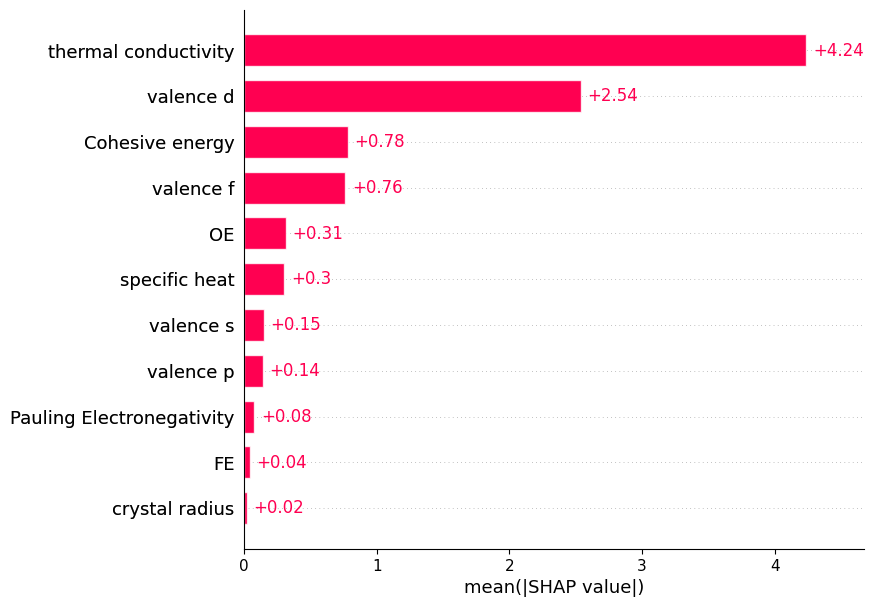

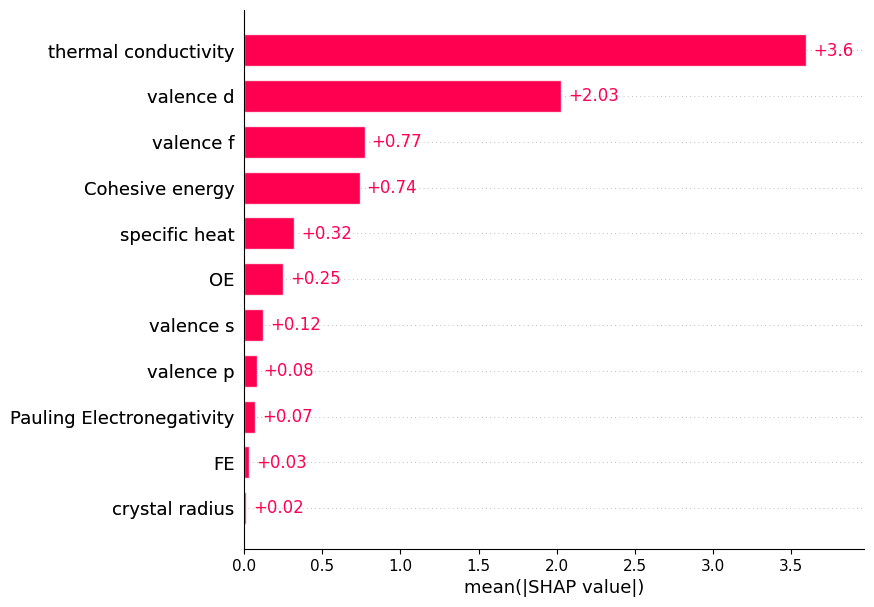

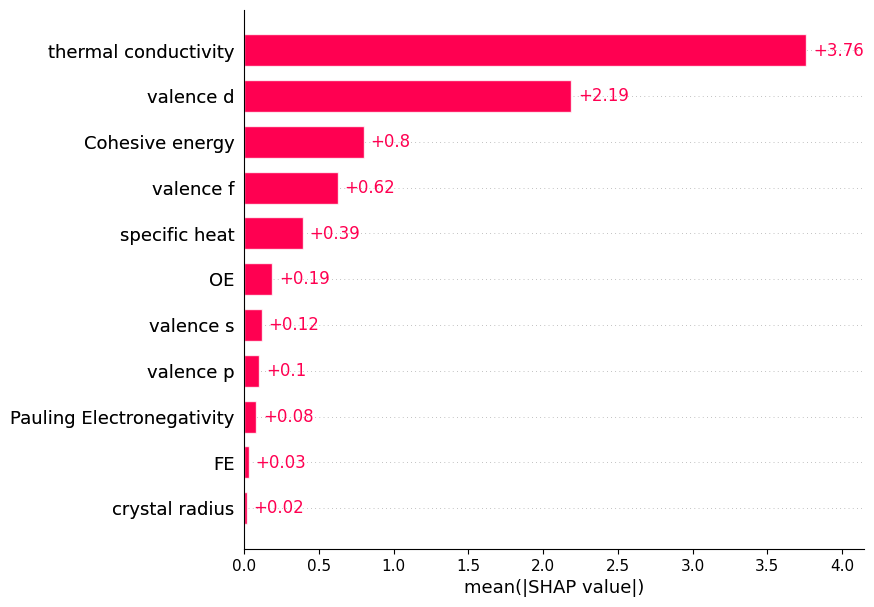

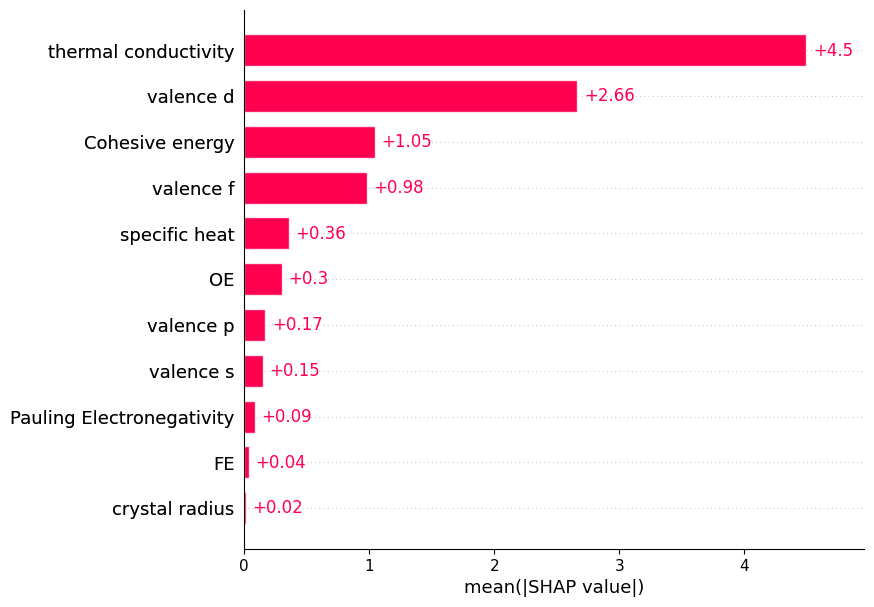

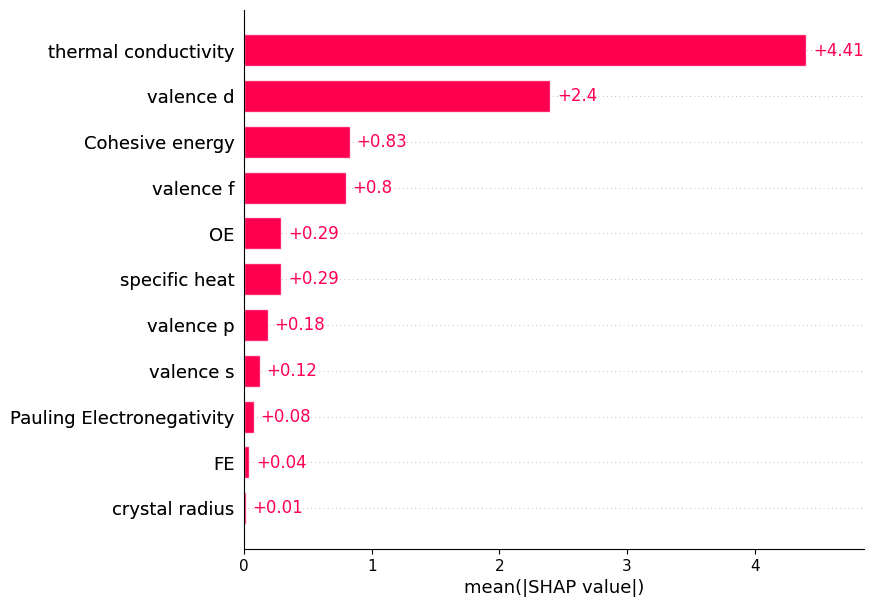

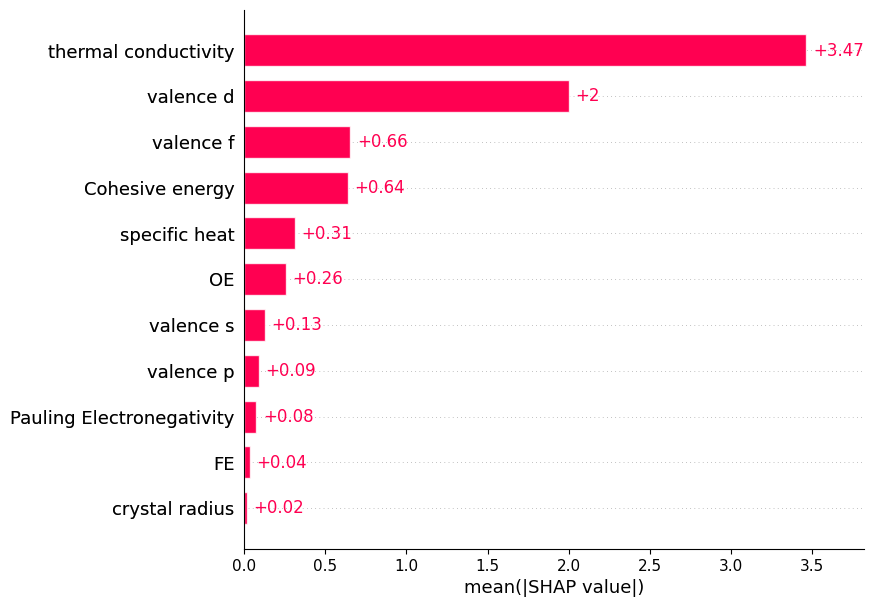

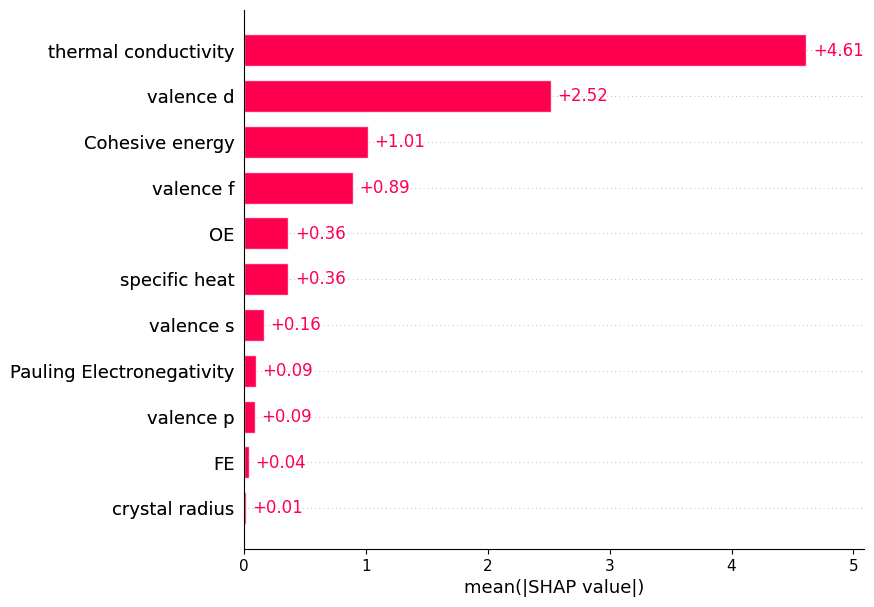

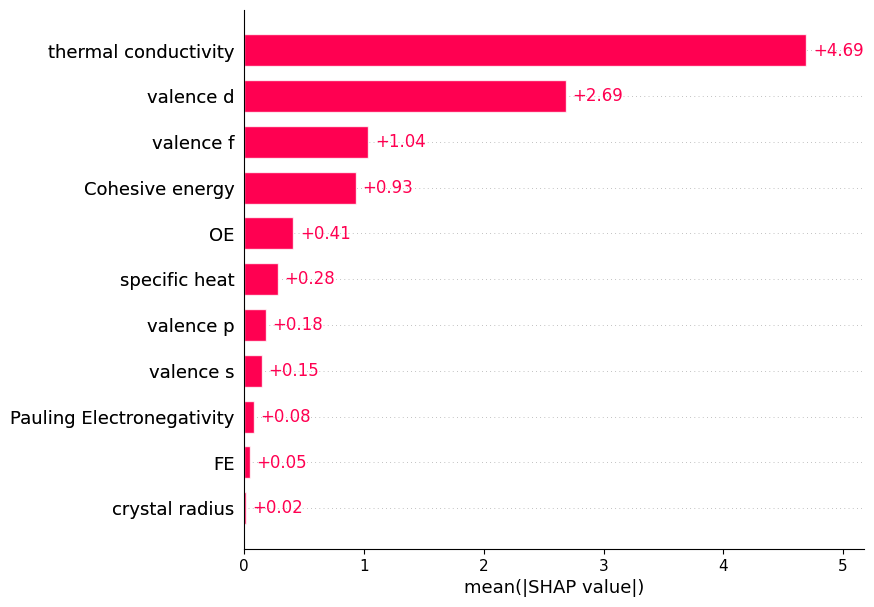

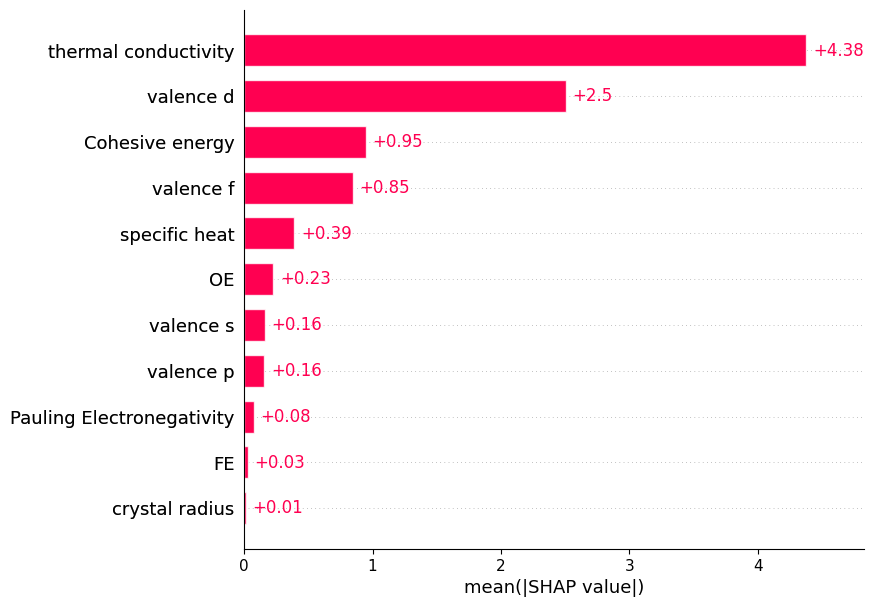

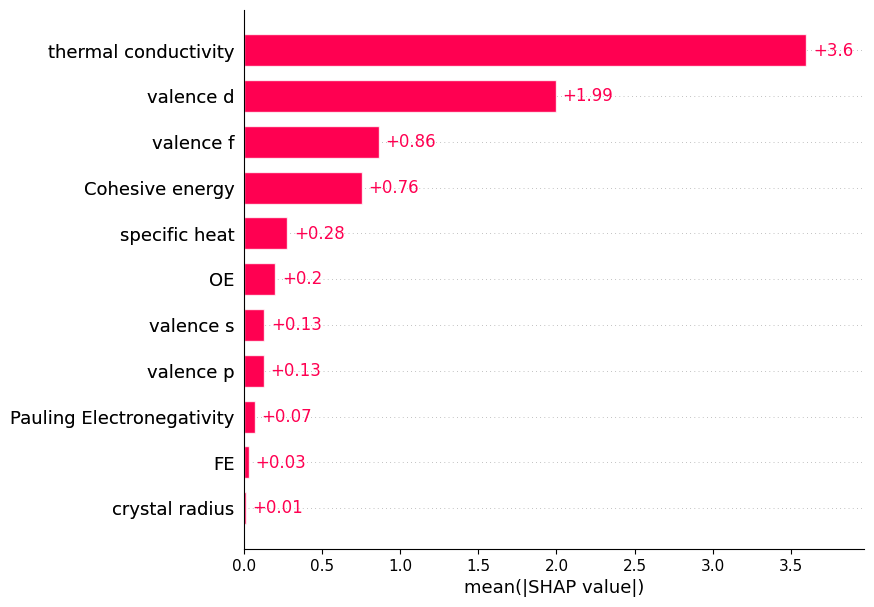

In [ ]:
model_SVR.plot_SHAP('all') # plot the shap values of the model with last seed by default

### KNN

In [ ]:
random_seeds = np.arange(0,10)

model_KNN = ModelEvaluatorBayes(X_des, y_nor, random_seeds, KNeighborsRegressor, param_space_KNN, results_dict=results_sub, IIS_dict=IIS_sub, model_dict=models_sub)
model_KNN.evaluate_model()

The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
Permutation explainer: 113it [00:10,  1.34s/it]                         


Random seed 0 finished



The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.


Random seed 1 finished



The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
Permutatio

Random seed 2 finished



The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
Permutation explainer: 113it [00:12,  2.09it/s]


Random seed 3 finished



The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The object

Random seed 4 finished



The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The object

Random seed 5 finished



The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The object

Random seed 6 finished



The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.


Random seed 7 finished



The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
Permutation explainer: 113it [00:11,  1.00s/it]


Random seed 8 finished



The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
Permutation explainer: 113it [00:11,  1.02it/s]

Random seed 9 finished



In [ ]:
model_KNN.show_IIS()

,Feature,Mean Rank,Non-Zero Frequency (%),IIS
9,thermal conductivity,1.0,100.0,1.000000
6,valence d,2.3,100.0,0.813478
7,valence f,2.7,100.0,0.792222
10,Cohesive energy,4.3,100.0,0.746744
8,specific heat,4.7,100.0,0.740213
3,OE,7.6,100.0,0.713421
4,valence s,7.6,100.0,0.713421
1,Pauling Electronegativity,8.0,100.0,0.711250
2,FE,8.6,100.0,0.708372
0,crystal radius,10.6,100.0,0.701132


In [ ]:
model_KNN.show_shap_ranks()

{'crystal radius': [11, 10, 11, 11, 11, 10, 11, 10, 10, 11],
 'Pauling Electronegativity': [8, 8, 9, 8, 9, 8, 8, 7, 6, 9],
 'FE': [10, 6, 10, 10, 10, 6, 6, 9, 9, 10],
 'OE': [6, 9, 8, 7, 7, 9, 7, 8, 8, 7],
 'valence s': [9, 7, 6, 9, 8, 7, 9, 6, 7, 8],
 'valence p': [7, 11, 7, 6, 6, 10, 11, 6],
 'valence d': [3, 2, 2, 3, 2, 2, 2, 2, 3, 2],
 'valence f': [2, 3, 3, 2, 3, 3, 3, 3, 2, 3],
 'specific heat': [5, 5, 5, 4, 5, 5, 5, 4, 4, 5],
 'thermal conductivity': [1, 1, 1, 1, 1, 1, 1, 1, 1, 1],
 'Cohesive energy': [4, 4, 4, 5, 4, 4, 4, 5, 5, 4]}

In [ ]:
model_KNN.show_performance()

,random_seed,training R2,test R2,training RMSE,test RMSE,cv_score
0,0,0.749873,0.362287,7.380997,13.016704,0.636298
1,1,0.610679,0.513726,8.841220,11.673475,0.405084
2,2,0.786748,0.160474,6.701711,15.298422,0.674776
3,3,0.666371,0.648813,8.936824,7.760874,0.582243
4,4,0.665367,0.689761,8.580606,8.892087,0.449286
5,5,0.605797,0.578966,9.413755,9.860620,0.502700
6,6,0.676263,0.477195,8.741316,9.602785,0.599052
7,7,0.629014,0.513173,8.930979,11.520618,0.417285
8,8,0.631024,0.653168,8.978230,9.373937,0.472544
9,9,0.649715,0.686203,8.226935,10.711324,0.577558


In [ ]:
model_KNN.show_parameters()

{0: OrderedDict([('n_neighbors', 12), ('p', 2), ('weights', 'distance')]),
 1: OrderedDict([('n_neighbors', 8), ('p', 2), ('weights', 'uniform')]),
 2: OrderedDict([('n_neighbors', 18), ('p', 2), ('weights', 'distance')]),
 3: OrderedDict([('n_neighbors', 13), ('p', 1), ('weights', 'distance')]),
 4: OrderedDict([('n_neighbors', 18), ('p', 2), ('weights', 'distance')]),
 5: OrderedDict([('n_neighbors', 8), ('p', 2), ('weights', 'uniform')]),
 6: OrderedDict([('n_neighbors', 6), ('p', 2), ('weights', 'distance')]),
 7: OrderedDict([('n_neighbors', 8), ('p', 2), ('weights', 'uniform')]),
 8: OrderedDict([('n_neighbors', 5), ('p', 1), ('weights', 'distance')]),
 9: OrderedDict([('n_neighbors', 19), ('p', 2), ('weights', 'distance')])}

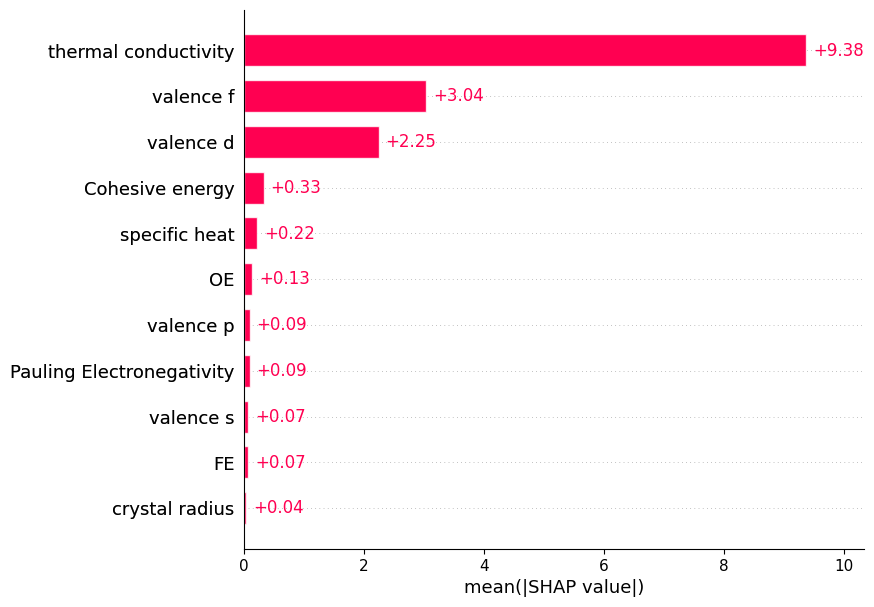

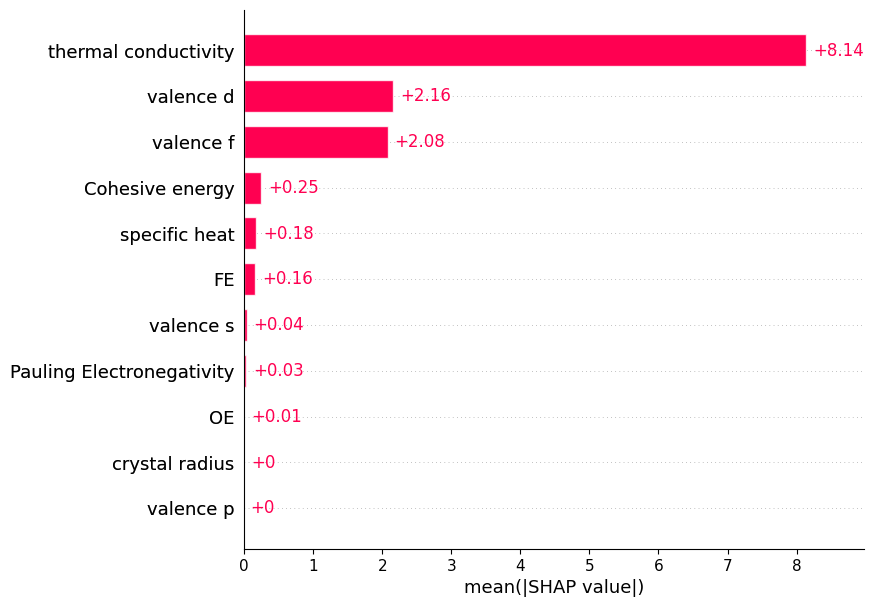

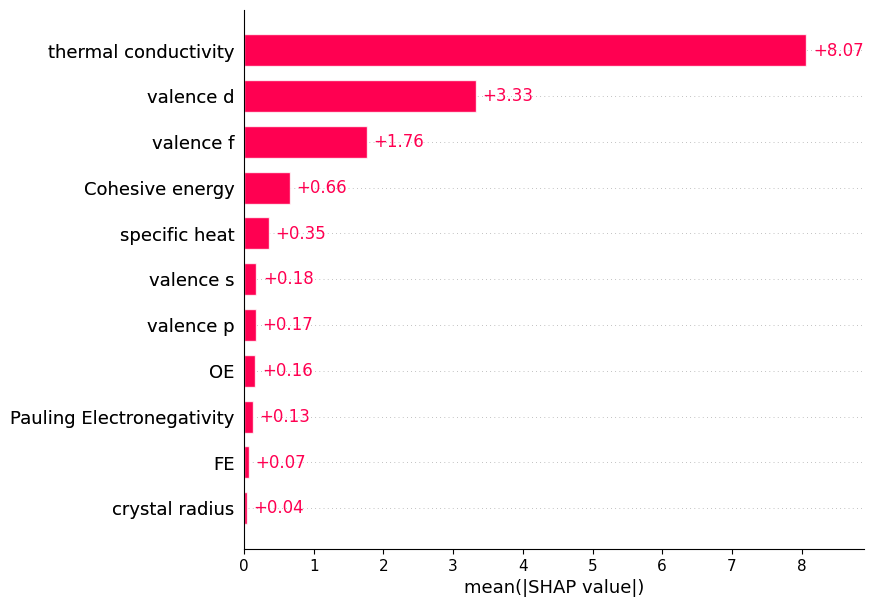

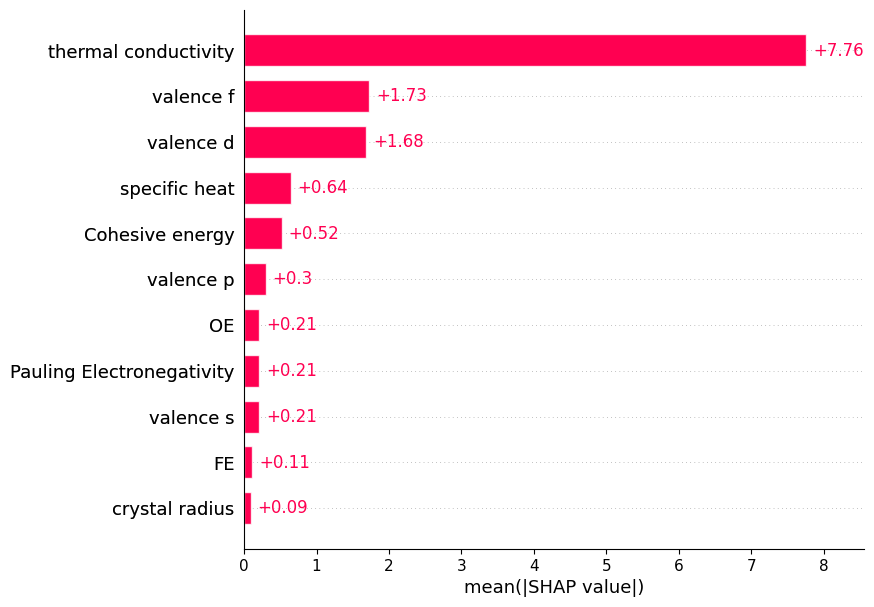

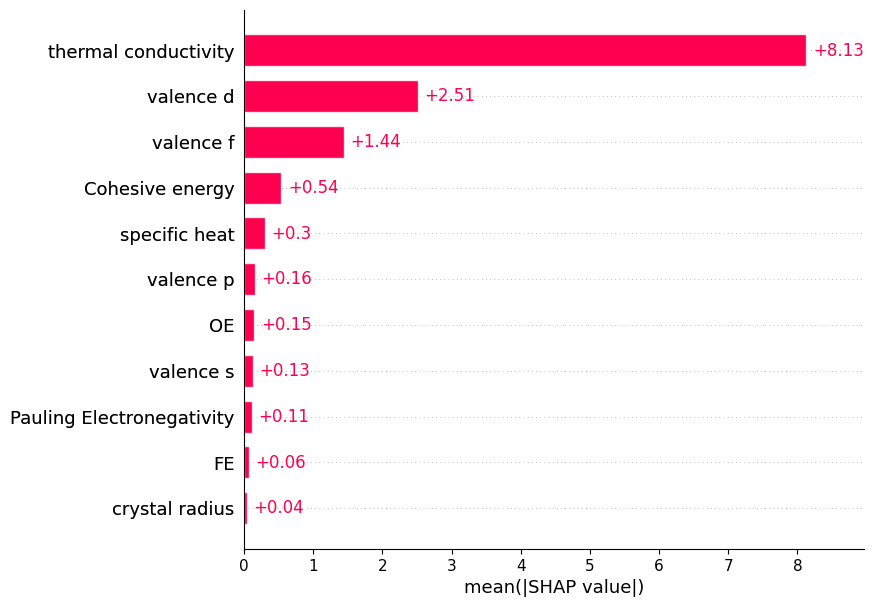

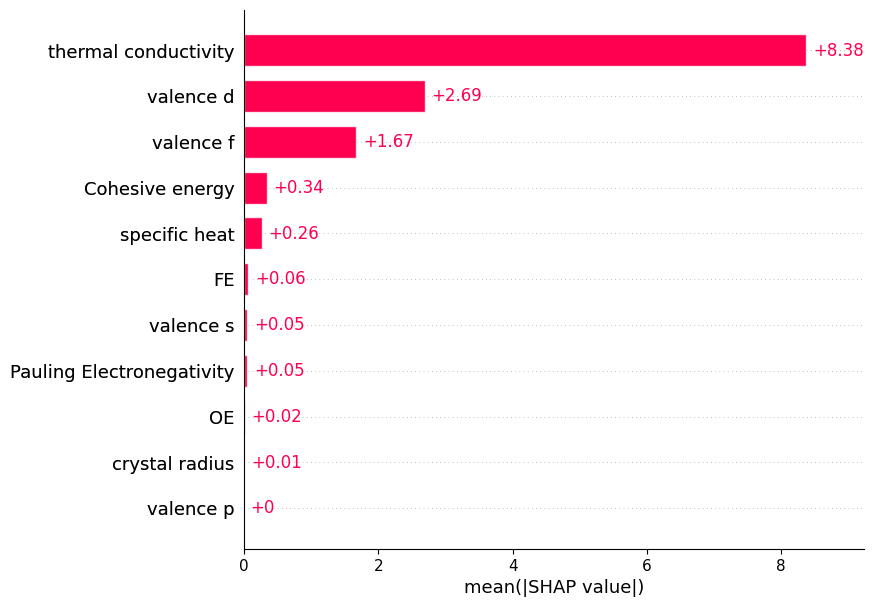

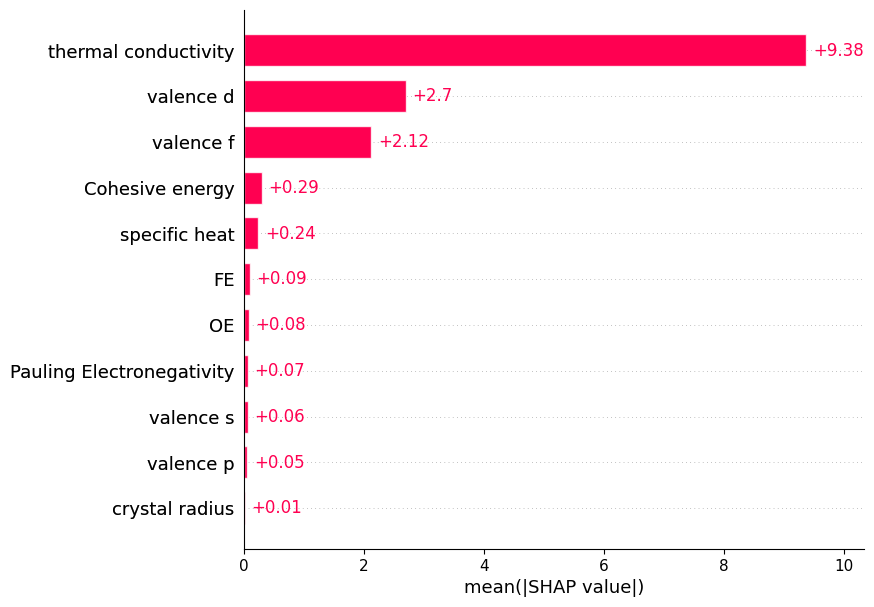

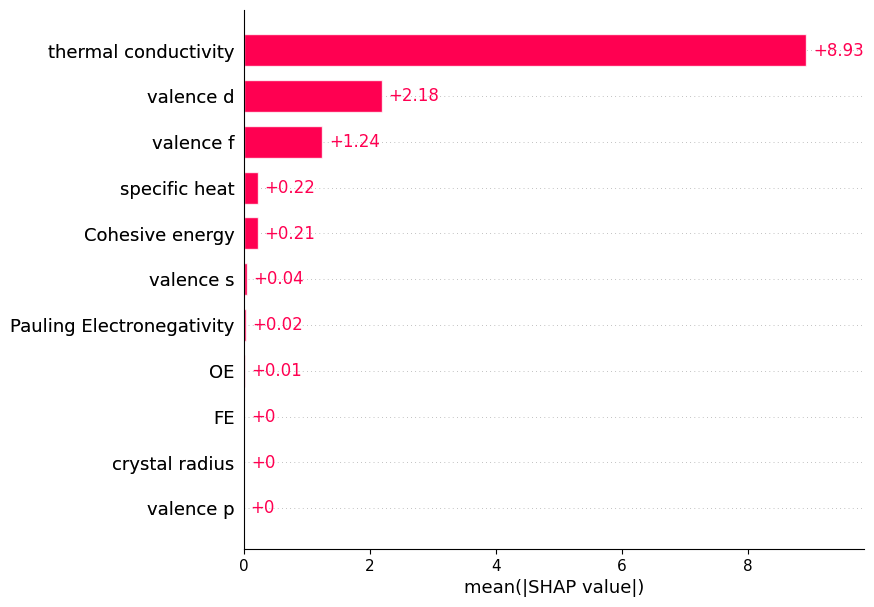

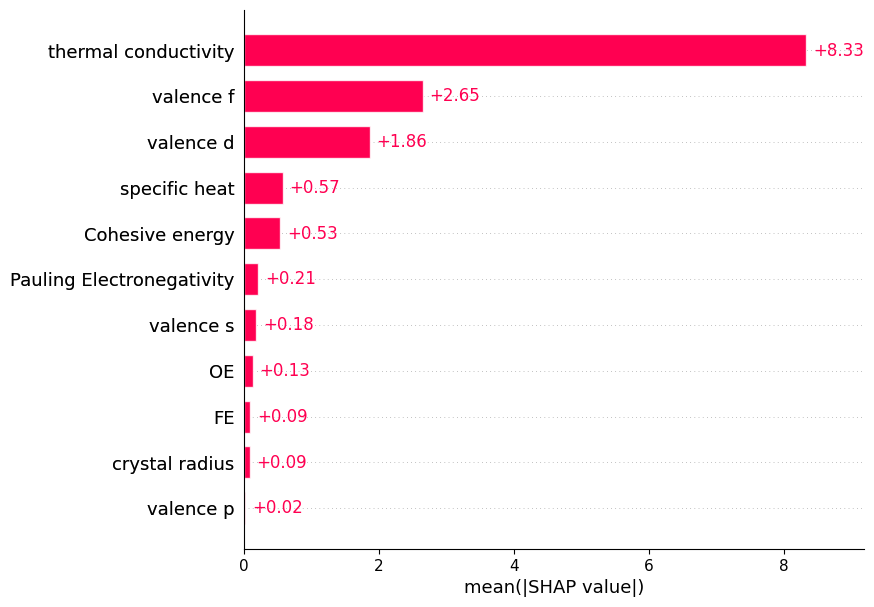

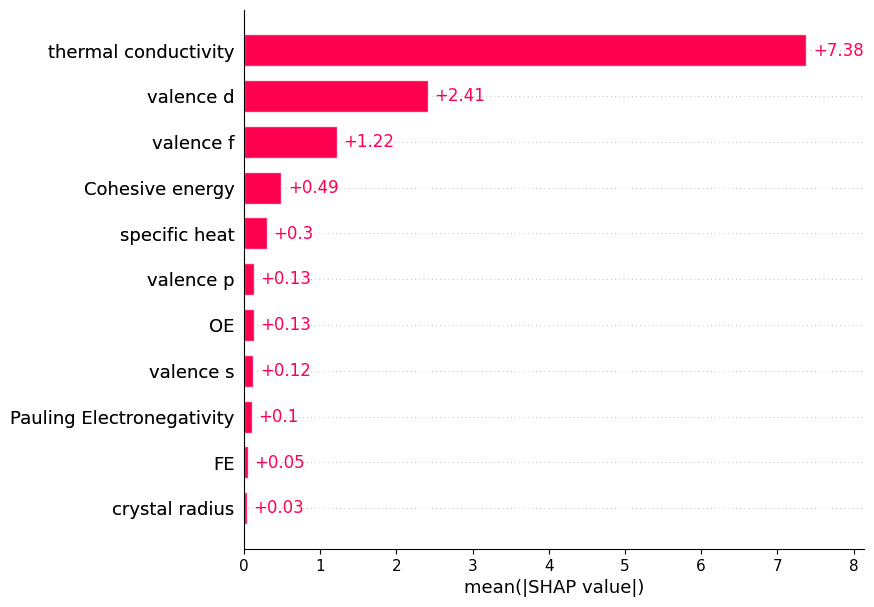

In [ ]:
model_KNN.plot_SHAP('all')

### Gaussian Process

In [ ]:
kernels = [
    ConstantKernel(1.0, (1e-3, 1e3)) * RBF(1, (1e-2, 1e2)) + WhiteKernel(noise_level=1, noise_level_bounds=(1e-10, 1e+6)),
    ConstantKernel(1.0, (1e-3, 1e3)) * Matern(length_scale=1.0, length_scale_bounds=(1e-2, 1e2), nu=1.5) + WhiteKernel(noise_level=1, noise_level_bounds=(1e-10, 1e+6)),
    ConstantKernel(1.0, (1e-3, 1e3)) * RationalQuadratic(length_scale=1.0, alpha=0.1) + WhiteKernel(noise_level=1, noise_level_bounds=(1e-10, 1e+6)),
    ConstantKernel(1.0, (1e-3, 1e3)) * ExpSineSquared() + WhiteKernel(noise_level=1, noise_level_bounds=(1e-10, 1e+6)),
    ConstantKernel(1.0, (1e-3, 1e3)) * DotProduct() + WhiteKernel(noise_level=1, noise_level_bounds=(1e-10, 1e+6)),

    Matern(length_scale=1.0, length_scale_bounds=(1e-2, 1e2), nu=1.5) + WhiteKernel(noise_level=1, noise_level_bounds=(1e-10, 1e+6)),
    RationalQuadratic(length_scale=1.0, alpha=0.1) + WhiteKernel(noise_level=1, noise_level_bounds=(1e-10, 1e+6)),
    RBF(1, (1e-2, 1e2)) + WhiteKernel(noise_level=1, noise_level_bounds=(1e-10, 1e+6)),
    DotProduct() + WhiteKernel(noise_level=1, noise_level_bounds=(1e-10, 1e+6)),
    ExpSineSquared() + WhiteKernel(noise_level=1, noise_level_bounds=(1e-10, 1e+6)),

    RBF(1, (1e-2, 1e2)) * RationalQuadratic(length_scale=1.0, alpha=0.1) + WhiteKernel(noise_level=1, noise_level_bounds=(1e-10, 1e+6)),
    RBF(1, (1e-2, 1e2)) * Matern(length_scale=1.0, length_scale_bounds=(1e-2, 1e2), nu=1.5) + WhiteKernel(noise_level=1, noise_level_bounds=(1e-10, 1e+6)),
    RBF(1, (1e-2, 1e2)) * DotProduct() + WhiteKernel(noise_level=1, noise_level_bounds=(1e-10, 1e+6)),

    DotProduct() * Matern(length_scale=1.0, length_scale_bounds=(1e-2, 1e2), nu=1.5) + WhiteKernel(noise_level=1, noise_level_bounds=(1e-10, 1e+6)),
    DotProduct() * RationalQuadratic(length_scale=1.0, alpha=0.1) + WhiteKernel(noise_level=1, noise_level_bounds=(1e-10, 1e+6)),
    DotProduct() * ExpSineSquared() + WhiteKernel(noise_level=1, noise_level_bounds=(1e-10, 1e+6)),

    RationalQuadratic(length_scale=1.0, alpha=0.1) * Matern(length_scale=1.0, length_scale_bounds=(1e-2, 1e2), nu=1.5) + WhiteKernel(noise_level=1, noise_level_bounds=(1e-10, 1e+6)),
    RationalQuadratic(length_scale=1.0, alpha=0.1) * DotProduct() + WhiteKernel(noise_level=1, noise_level_bounds=(1e-10, 1e+6)),
]

rmse_values = []

for kernel in kernels:
    gpr = GaussianProcessRegressor(kernel=kernel, n_restarts_optimizer=10, random_state=0)
    gpr.fit(X_train, y_train)
    y_pred = gpr.predict(X_test)
    rmse = np.sqrt(mean_squared_error(y_test, y_pred))
    rmse_values.append(rmse)

rmse_values

The optimal value found for dimension 0 of parameter k1__k1__constant_value is close to the specified upper bound 1000.0. Increasing the bound and calling fit again may find a better value.
The optimal value found for dimension 0 of parameter k1__k2__length_scale is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
The optimal value found for dimension 0 of parameter k1__k2__length_scale is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
The optimal value found for dimension 0 of parameter k1__k1__length_scale is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.


[12.764509510057248,
 12.762941357682793,
 12.758538075466493,
 12.764508147701013,
 13.23255857949609,
 15.803821164139247,
 15.80461068138911,
 15.801868762962334,
 15.16694983327722,
 15.801874395835013,
 15.801868901817626,
 15.801868059693703,
 13.156482180127892,
 13.153563867248936,
 12.967362859533155,
 13.032399955754988,
 15.801878417535786,
 12.967362859516468]

  Based on the smallest RMSE, `kernel = ConstantKernel(1.0, (1e-3, 1e3)) * RationalQuadratic(length_scale=1.0, alpha=0.1) + WhiteKernel(noise_level=1, noise_level_bounds=(1e-10, 1e+6))` is choosen


In [ ]:
random_seeds = np.arange(0,10)

kernel = ConstantKernel(1.0, (1e-3, 1e3)) * RationalQuadratic(length_scale=1.0, alpha=0.1) + WhiteKernel(noise_level=1, noise_level_bounds=(1e-10, 1e+1))

model_GP = ModelEvaluatorBayes(X_des, y_nor, random_seeds, GaussianProcessRegressor, param_space_GP, kernel, results_dict=results_sub, IIS_dict=IIS_sub, model_dict=models_sub)
model_GP.evaluate_model()

The optimal value found for dimension 0 of parameter k2__noise_level is close to the specified upper bound 10.0. Increasing the bound and calling fit again may find a better value.
Permutation explainer: 113it [00:55,  1.63it/s]


Random seed 0 finished



The optimal value found for dimension 0 of parameter k1__k2__alpha is close to the specified upper bound 100000.0. Increasing the bound and calling fit again may find a better value.
The optimal value found for dimension 0 of parameter k2__noise_level is close to the specified lower bound 1e-10. Decreasing the bound and calling fit again may find a better value.
The optimal value found for dimension 0 of parameter k1__k2__alpha is close to the specified upper bound 100000.0. Increasing the bound and calling fit again may find a better value.
The optimal value found for dimension 0 of parameter k1__k2__alpha is close to the specified upper bound 100000.0. Increasing the bound and calling fit again may find a better value.
The optimal value found for dimension 0 of parameter k1__k2__alpha is close to the specified upper bound 100000.0. Increasing the bound and calling fit again may find a better value.
The optimal value found for dimension 0 of parameter k2__noise_level is close to the s

Random seed 1 finished



The optimal value found for dimension 0 of parameter k1__k2__length_scale is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
The optimal value found for dimension 0 of parameter k1__k2__alpha is close to the specified upper bound 100000.0. Increasing the bound and calling fit again may find a better value.
The optimal value found for dimension 0 of parameter k1__k2__alpha is close to the specified upper bound 100000.0. Increasing the bound and calling fit again may find a better value.
The optimal value found for dimension 0 of parameter k2__noise_level is close to the specified lower bound 1e-10. Decreasing the bound and calling fit again may find a better value.
The optimal value found for dimension 0 of parameter k1__k2__alpha is close to the specified upper bound 100000.0. Increasing the bound and calling fit again may find a better value.
The optimal value found for dimension 0 of parameter k2__noise_level is close to t

Random seed 2 finished



The optimal value found for dimension 0 of parameter k1__k2__alpha is close to the specified upper bound 100000.0. Increasing the bound and calling fit again may find a better value.
Permutation explainer: 113it [00:47,  1.88it/s]


Random seed 3 finished



The optimal value found for dimension 0 of parameter k1__k2__alpha is close to the specified upper bound 100000.0. Increasing the bound and calling fit again may find a better value.
The optimal value found for dimension 0 of parameter k1__k2__alpha is close to the specified upper bound 100000.0. Increasing the bound and calling fit again may find a better value.
The optimal value found for dimension 0 of parameter k1__k2__alpha is close to the specified upper bound 100000.0. Increasing the bound and calling fit again may find a better value.
Permutation explainer: 113it [00:45,  1.92it/s]


Random seed 4 finished



The optimal value found for dimension 0 of parameter k1__k2__length_scale is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
The optimal value found for dimension 0 of parameter k2__noise_level is close to the specified lower bound 1e-10. Decreasing the bound and calling fit again may find a better value.
Permutation explainer: 113it [00:47,  1.86it/s]


Random seed 5 finished



The optimal value found for dimension 0 of parameter k1__k2__alpha is close to the specified upper bound 100000.0. Increasing the bound and calling fit again may find a better value.
The optimal value found for dimension 0 of parameter k1__k2__length_scale is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
The optimal value found for dimension 0 of parameter k2__noise_level is close to the specified upper bound 10.0. Increasing the bound and calling fit again may find a better value.
The optimal value found for dimension 0 of parameter k2__noise_level is close to the specified upper bound 10.0. Increasing the bound and calling fit again may find a better value.
The optimal value found for dimension 0 of parameter k2__noise_level is close to the specified upper bound 10.0. Increasing the bound and calling fit again may find a better value.
The optimal value found for dimension 0 of parameter k2__noise_level is close to the sp

Random seed 6 finished



The optimal value found for dimension 0 of parameter k1__k2__alpha is close to the specified upper bound 100000.0. Increasing the bound and calling fit again may find a better value.
The optimal value found for dimension 0 of parameter k1__k2__alpha is close to the specified upper bound 100000.0. Increasing the bound and calling fit again may find a better value.
The optimal value found for dimension 0 of parameter k1__k2__alpha is close to the specified upper bound 100000.0. Increasing the bound and calling fit again may find a better value.
The optimal value found for dimension 0 of parameter k1__k2__alpha is close to the specified upper bound 100000.0. Increasing the bound and calling fit again may find a better value.
Permutation explainer: 113it [00:47,  1.88it/s]


Random seed 7 finished



The optimal value found for dimension 0 of parameter k2__noise_level is close to the specified upper bound 10.0. Increasing the bound and calling fit again may find a better value.
The optimal value found for dimension 0 of parameter k1__k2__alpha is close to the specified upper bound 100000.0. Increasing the bound and calling fit again may find a better value.
The optimal value found for dimension 0 of parameter k2__noise_level is close to the specified upper bound 10.0. Increasing the bound and calling fit again may find a better value.
The optimal value found for dimension 0 of parameter k2__noise_level is close to the specified upper bound 10.0. Increasing the bound and calling fit again may find a better value.
The optimal value found for dimension 0 of parameter k2__noise_level is close to the specified upper bound 10.0. Increasing the bound and calling fit again may find a better value.
The optimal value found for dimension 0 of parameter k2__noise_level is close to the specifie

Random seed 8 finished



The optimal value found for dimension 0 of parameter k1__k2__alpha is close to the specified upper bound 100000.0. Increasing the bound and calling fit again may find a better value.
The optimal value found for dimension 0 of parameter k1__k2__length_scale is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
The optimal value found for dimension 0 of parameter k1__k2__alpha is close to the specified upper bound 100000.0. Increasing the bound and calling fit again may find a better value.
The optimal value found for dimension 0 of parameter k1__k2__alpha is close to the specified upper bound 100000.0. Increasing the bound and calling fit again may find a better value.
The optimal value found for dimension 0 of parameter k1__k2__alpha is close to the specified upper bound 100000.0. Increasing the bound and calling fit again may find a better value.
The optimal value found for dimension 0 of parameter k1__k2__alpha is close to th

Random seed 9 finished



In [ ]:
model_GP.show_IIS()

,Feature,Mean Rank,Non-Zero Frequency (%),IIS
9,thermal conductivity,1.0,100.0,1.000000
6,valence d,2.0,100.0,0.835000
7,valence f,3.6,100.0,0.761667
10,Cohesive energy,3.7,100.0,0.759189
8,specific heat,5.3,100.0,0.732264
3,OE,5.8,100.0,0.726897
4,valence s,6.9,100.0,0.717826
5,valence p,8.3,100.0,0.709759
1,Pauling Electronegativity,8.5,100.0,0.708824
2,FE,9.9,100.0,0.703333


In [ ]:
model_GP.show_shap_ranks()

{'crystal radius': [11, 11, 11, 11, 11, 11, 11, 11, 11, 11],
 'Pauling Electronegativity': [6, 8, 9, 9, 9, 9, 8, 9, 9, 9],
 'FE': [9, 10, 10, 10, 10, 10, 10, 10, 10, 10],
 'OE': [4, 6, 6, 6, 6, 6, 6, 6, 6, 6],
 'valence s': [5, 7, 7, 7, 8, 7, 7, 7, 7, 7],
 'valence p': [10, 9, 8, 8, 7, 8, 9, 8, 8, 8],
 'valence d': [2, 2, 2, 2, 2, 2, 2, 2, 2, 2],
 'valence f': [7, 3, 3, 3, 3, 3, 4, 3, 4, 3],
 'specific heat': [8, 5, 5, 5, 5, 5, 5, 5, 5, 5],
 'thermal conductivity': [1, 1, 1, 1, 1, 1, 1, 1, 1, 1],
 'Cohesive energy': [3, 4, 4, 4, 4, 4, 3, 4, 3, 4]}

In [ ]:
model_GP.show_performance()

,random_seed,training R2,test R2,training RMSE,test RMSE,cv_score
0,0,0.748790,0.387337,7.396954,12.758485,0.651705
1,1,0.589948,0.469395,9.073554,12.193975,0.404760
2,2,0.779466,0.235914,6.815163,14.594886,0.675554
3,3,0.663702,0.681013,8.972493,7.396526,0.598236
4,4,0.658315,0.658487,8.670544,9.329509,0.470984
5,5,0.661605,0.406089,8.721975,11.711330,0.489002
6,6,0.680189,0.539980,8.688155,9.007731,0.584398
7,7,0.654266,0.517540,8.621666,11.468830,0.462903
8,8,0.651015,0.705148,8.731630,8.643008,0.522314
9,9,0.643414,0.644807,8.300590,11.395958,0.592444


In [ ]:
model_GP.show_parameters()

{0: OrderedDict([('alpha', 55.83679465560657),
              ('kernel__k1__k1__constant_value', 1000.0),
              ('kernel__k1__k2__alpha', 0.1),
              ('kernel__k1__k2__length_scale', 0.1),
              ('kernel__k2__noise_level', 1000.0)]),
 1: OrderedDict([('alpha', 335.3731439540852),
              ('kernel__k1__k1__constant_value', 38.733419616695876),
              ('kernel__k1__k2__alpha', 0.1),
              ('kernel__k1__k2__length_scale', 0.1),
              ('kernel__k2__noise_level', 1000.0)]),
 2: OrderedDict([('alpha', 96.30450295703048),
              ('kernel__k1__k1__constant_value', 0.1),
              ('kernel__k1__k2__alpha', 0.1),
              ('kernel__k1__k2__length_scale', 1e-06),
              ('kernel__k2__noise_level', 1000.0)]),
 3: OrderedDict([('alpha', 93.69711766778532),
              ('kernel__k1__k1__constant_value', 1000.0),
              ('kernel__k1__k2__alpha', 0.1),
              ('kernel__k1__k2__length_scale', 1e-06),
            

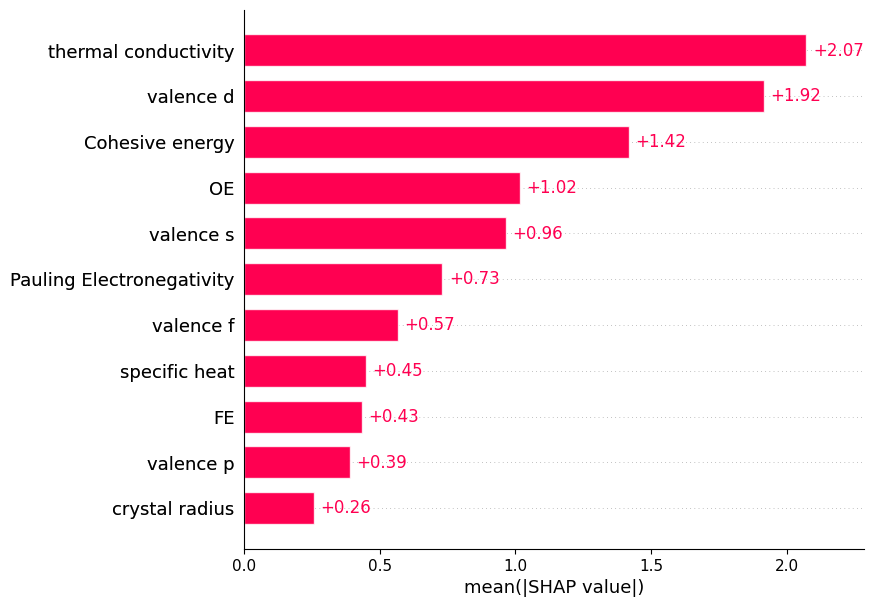

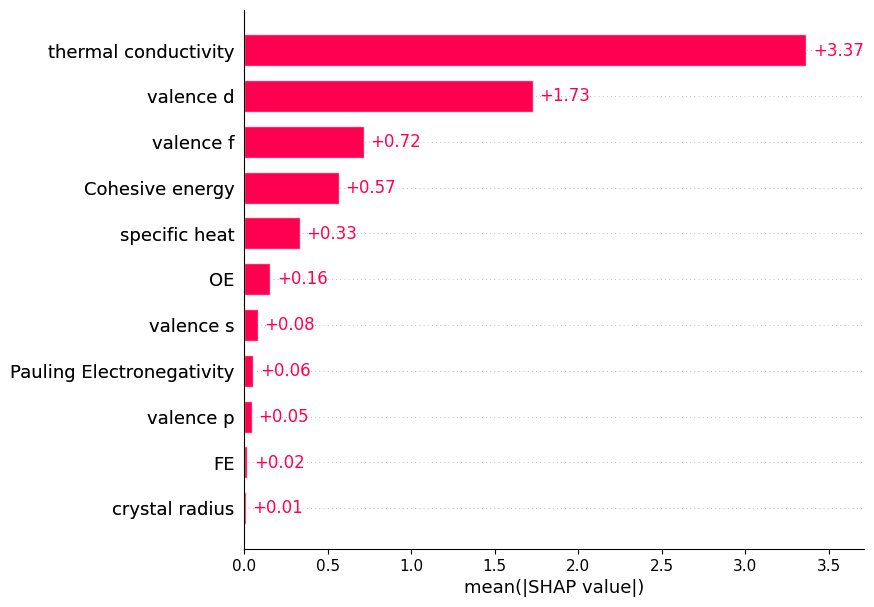

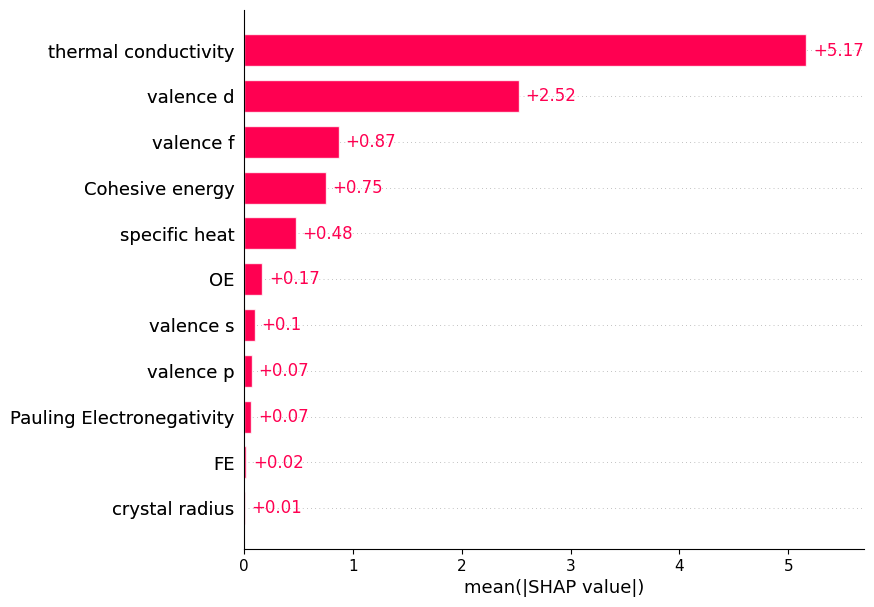

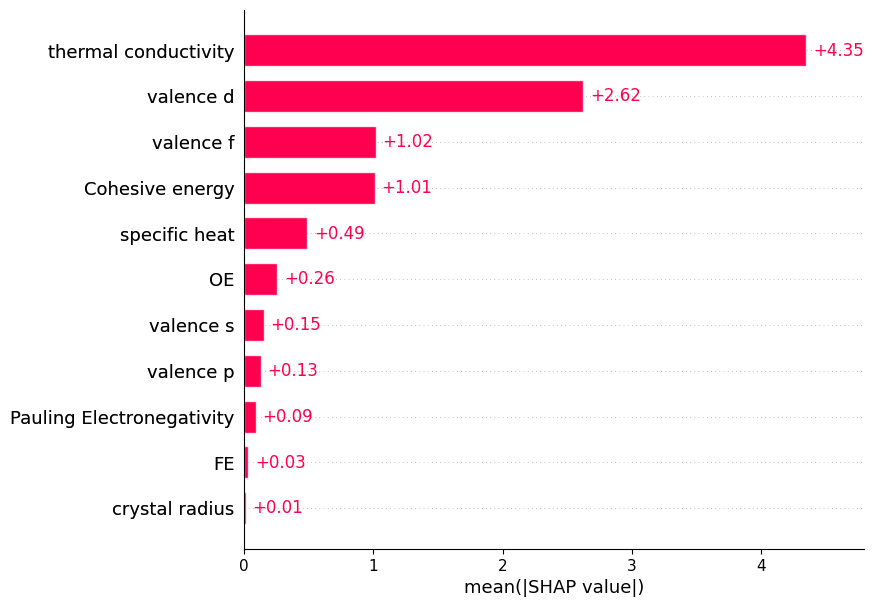

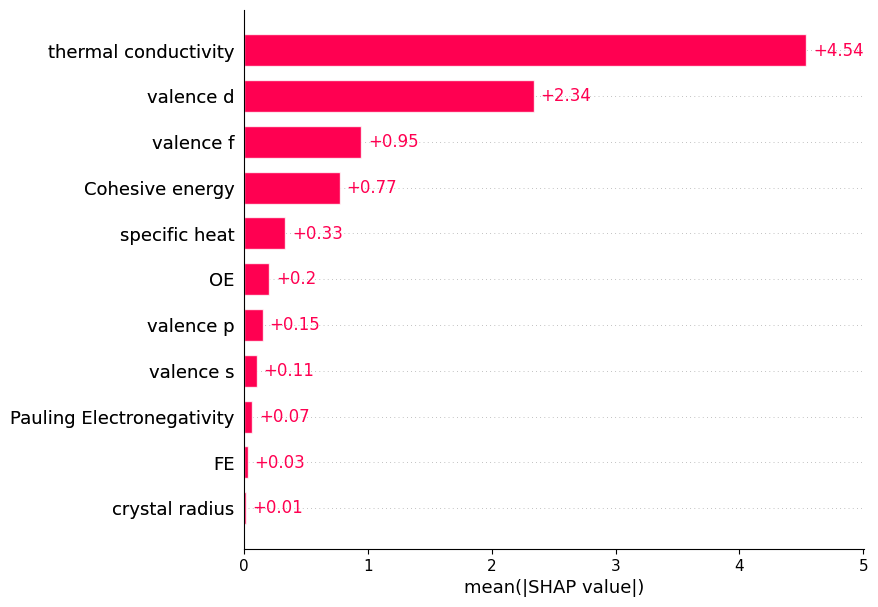

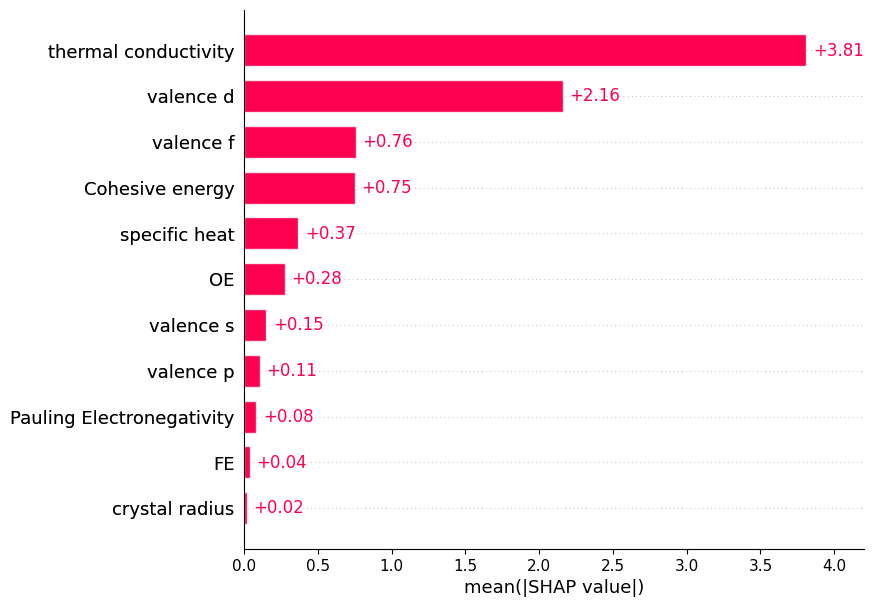

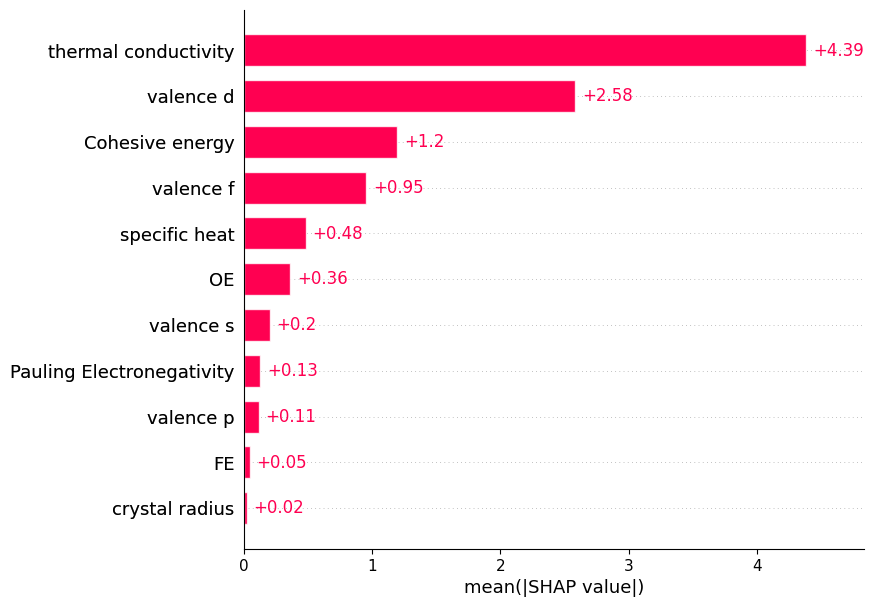

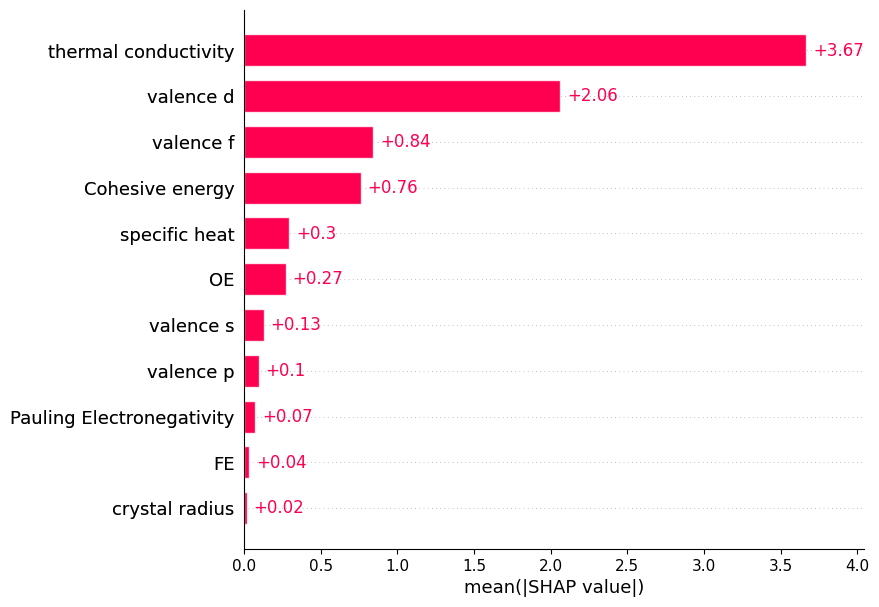

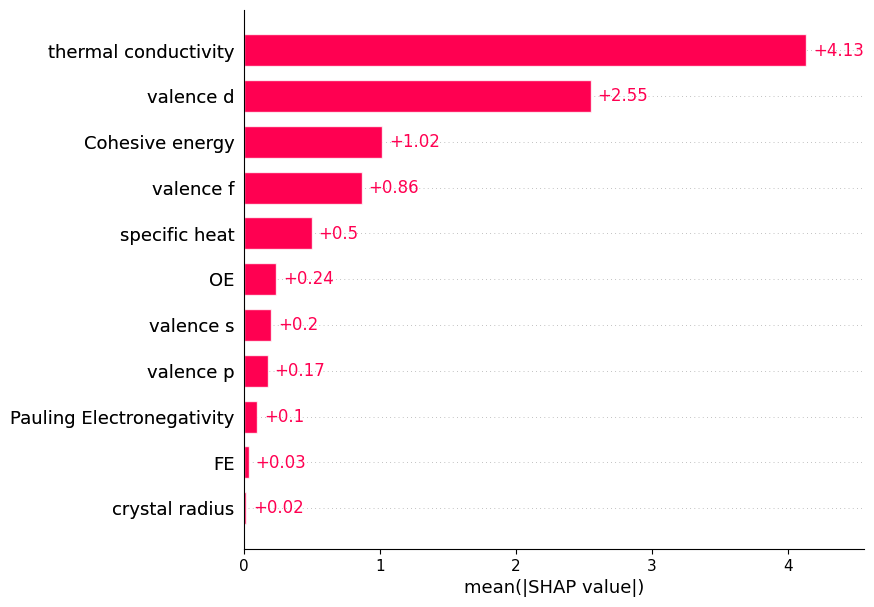

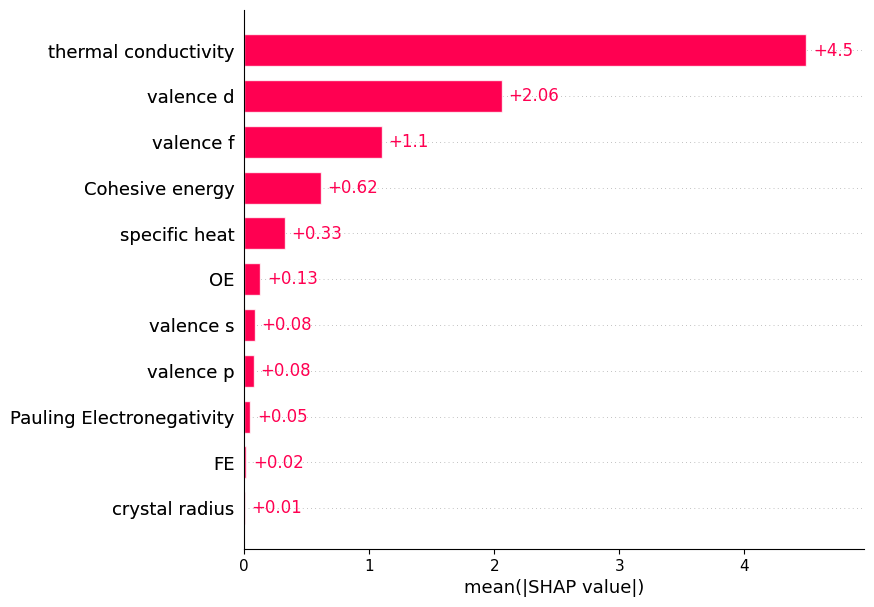

In [ ]:
model_GP.plot_SHAP('all')

## IIS ranking

In [ ]:
IIS_data_sub = IISDataAnalysis(results=results_sub,
                           IIS=IIS_sub,
                           models=models_sub,
                           results_csv_name='df_results_sub.csv',
                           models_joblib_name='models_sub.joblib',
                           iis_full_csv_name='df_IIS_full_sub.csv',
                           iis_csv_name='df_IIS_sub.csv')

In [ ]:
IIS_data_sub.show_model_performance()

,train_r2,test_r2,train_rmse,test_rmse,cv_r2
DecisionTreeRegressor,0.678759,0.506659,8.320314,10.962502,0.503814
RandomForestRegressor,0.676066,0.518837,8.364896,10.846928,0.546209
GradientBoostingRegressor,0.669161,0.528532,8.450228,10.795283,0.537799
XGBRegressor,0.671871,0.530937,8.415106,10.739502,0.542217
SVR,0.646820,0.516369,8.745257,10.935724,0.532656
KNeighborsRegressor,0.667085,0.528377,8.473257,10.771085,0.531683
GaussianProcessRegressor,0.673071,0.524571,8.399273,10.850024,0.545230


In [ ]:
IIS_data_sub.show_IIS_values()

,crystal radius,Pauling Electronegativity,FE,OE,valence s,valence p,valence d,valence f,specific heat,thermal conductivity,Cohesive energy
DecisionTreeRegressor,0.637538,0.557846,0.554556,0.341333,0.369538,0.181143,0.341333,0.271714,0.633778,0.396111,0.792222
RandomForestRegressor,0.734706,0.714000,0.754615,0.728929,0.719254,0.702039,0.807500,0.700841,0.773125,0.714000,0.776452
GradientBoostingRegressor,0.770000,0.721562,0.728929,0.719254,0.711250,0.636000,0.724098,0.574261,0.746744,0.736000,0.890000
XGBRegressor,0.746744,0.654207,0.746744,0.600390,0.447000,0.100000,0.621161,0.103667,0.759316,0.654207,0.792222
SVR,0.700000,0.707079,0.703000,0.728929,0.715205,0.712308,0.835000,0.761667,0.731111,1.000000,0.767059
KNeighborsRegressor,0.701132,0.711250,0.708372,0.713421,0.713421,0.577250,0.813478,0.792222,0.740213,1.000000,0.746744
GaussianProcessRegressor,0.700000,0.708824,0.703333,0.726897,0.717826,0.709759,0.835000,0.761667,0.732264,1.000000,0.759189


In [ ]:
IIS_data_sub.show_IIS_details()

crystal radius  \
DecisionTreeRegressor     Mean Rank                    3.250000   
                          Non-Zero Frequency(%)       80.000000   
                          IIS                          0.637538   
RandomForestRegressor     Mean Rank                    5.100000   
                          Non-Zero Frequency(%)      100.000000   
                          IIS                          0.734706   
GradientBoostingRegressor Mean Rank                    3.300000   
                          Non-Zero Frequency(%)      100.000000   
                          IIS                          0.770000   
XGBRegressor              Mean Rank                    4.300000   
                          Non-Zero Frequency(%)      100.000000   
                          IIS                          0.746744   
SVR                       Mean Rank                   11.000000   
                          Non-Zero Frequency(%)      100.000000   
                          IIS                          0.700000   
KNeighborsRegressor       Mean Rank                   10.600000   
                          Non-Zero Frequency(%)      100.000000   
                          IIS                          0.701132   
GaussianProcessRegressor  Mean Rank                   11.000000   
                          Non-Zero Frequency(%)      100.000000   
                          IIS                          0.700000   

                                                 Pauling Electronegativity  \
DecisionTreeRegressor     Mean Rank                               3.714286   
                          Non-Zero Frequency(%)                  70.000000   
                          IIS                                     0.557846   
RandomForestRegressor     Mean Rank                               7.500000   
                          Non-Zero Frequency(%)                 100.000000   
                          IIS                                     0.714000   
GradientBoostingRegressor Mean Rank                               6.400000   
                          Non-Zero Frequency(%)                 100.000000   
                          IIS                                     0.721562   
XGBRegressor              Mean Rank                               6.444444   
                          Non-Zero Frequency(%)                  90.000000   
                          IIS                                     0.654207   
SVR                       Mean Rank                               8.900000   
                          Non-Zero Frequency(%)                 100.000000   
                          IIS                                     0.707079   
KNeighborsRegressor       Mean Rank                               8.000000   
                          Non-Zero Frequency(%)                 100.000000   
                          IIS                                     0.711250   
GaussianProcessRegressor  Mean Rank                               8.500000   
                          Non-Zero Frequency(%)                 100.000000   
                          IIS                                     0.708824   

                                                         FE          OE  \
DecisionTreeRegressor     Mean Rank                3.857143    4.500000   
                          Non-Zero Frequency(%)   70.000000   40.000000   
                          IIS                      0.554556    0.341333   
RandomForestRegressor     Mean Rank                3.900000    5.600000   
                          Non-Zero Frequency(%)  100.000000  100.000000   
                          IIS                      0.754615    0.728929   
GradientBoostingRegressor Mean Rank                5.600000    6.700000   
                          Non-Zero Frequency(%)  100.000000  100.000000   
                          IIS                      0.728929    0.719254   
XGBRegressor              Mean Rank                4.300000    5.125000   
                          Non-Ze

In [ ]:
IIS_data_sub.show_IIS_ranks()

,crystal radius,Pauling Electronegativity,FE,OE,valence s,valence p,valence d,valence f,specific heat,thermal conductivity,Cohesive energy
DecisionTreeRegressor,2,4,5,8,7,11,8,10,3,6,1
RandomForestRegressor,5,8,4,6,7,10,1,11,3,8,2
GradientBoostingRegressor,2,7,5,8,9,10,6,11,3,4,1
XGBRegressor,3,5,3,8,9,11,7,10,2,5,1
SVR,11,9,10,6,7,8,2,4,5,1,3
KNeighborsRegressor,10,8,9,6,6,11,2,3,5,1,4
GaussianProcessRegressor,11,9,10,6,7,8,2,3,5,1,4


In [ ]:
IIS_data_sub.get_IIS_mean_rank()

,Feature,Mean Rank,Standard Deviation
0,Cohesive energy,2.286,1.380
1,specific heat,3.714,1.254
2,thermal conductivity,3.714,2.812
3,valence d,4.000,2.887
4,crystal radius,6.286,4.231
5,FE,6.571,2.992
6,OE,6.857,1.069
7,Pauling Electronegativity,7.143,1.952
8,valence s,7.429,1.134
9,valence f,7.429,3.867


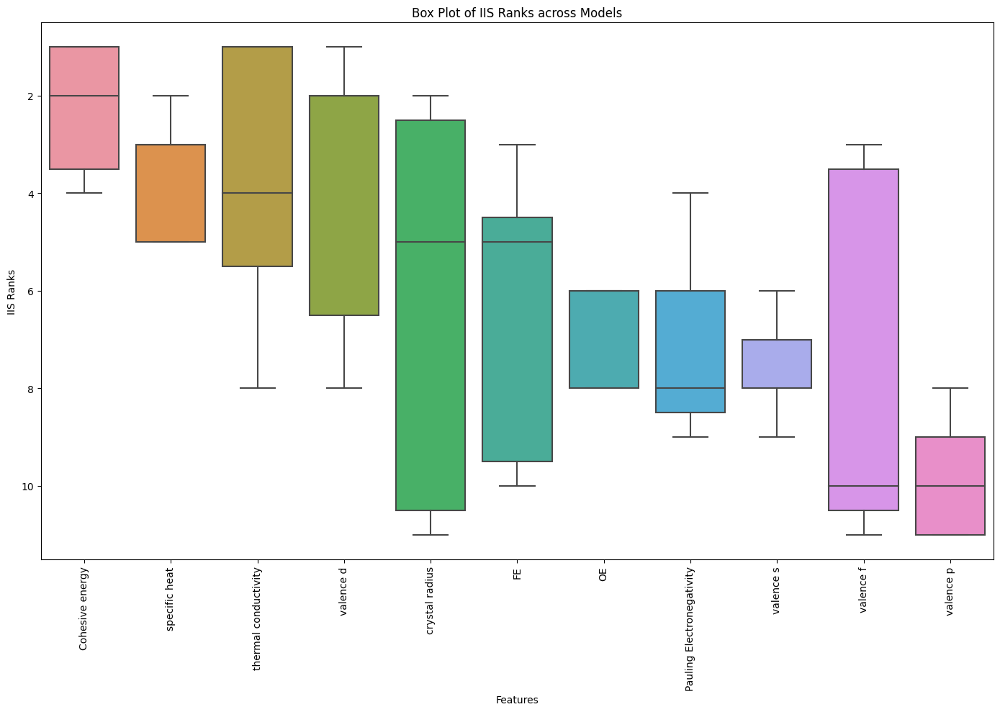

In [ ]:
IIS_data_sub.plot_IIS_mean_rank()

# D. Approach 2

In [ ]:
# Extract reference rows
data_ref = data[0:17]

In [ ]:
X_ref = data_ref[['Temp', 'GHSV', 'H2CO']]
y_ref = data_ref['F_STY']
X_ref

,Temp,GHSV,H2CO
0,255,3300,2.0
1,280,3300,2.0
2,305,3300,2.0
3,255,3300,2.1
4,280,3300,1.8
5,305,3300,2.0
6,256,7500,1.8
7,277,7500,1.8
8,300,11000,1.8
9,317,11000,1.8


In [ ]:
# Check variable correlation
corr_matrix = X_ref.corr()
print(corr_matrix)

          Temp      GHSV      H2CO
Temp  1.000000  0.622954 -0.373430
GHSV  0.622954  1.000000 -0.733952
H2CO -0.373430 -0.733952  1.000000


Since the input features are highly correlated which indicates the problem of multicollinearity. To deal with this, there are two ways:
1. PCA
2. Regularization techniques: lasso and ridge

### Option 1: PCA

## 1.fit the target variable with reation conditions on reference rows


In [ ]:
# Split the data into training and test sets
X_train, X_test, y_train, y_test = train_test_split(X_ref, y_ref, test_size=0.2, random_state=42)

# Standardize the features
scaler = StandardScaler()

X_train_std = scaler.fit_transform(X_train)
X_test_std = scaler.transform(X_test)

# Apply PCA
pca = PCA(n_components=2)

X_train = pca.fit_transform(X_train_std)
X_test = pca.transform(X_test_std)

explained_variance_ratio = pca.explained_variance_ratio_
print(explained_variance_ratio)

[0.68609629 0.22792537]


In [ ]:
print(len(X_train))
print(len(X_test))
# extremely small dataset -> simple model would be better

13
4


In [ ]:
X_train

array([[-1.12892639,  0.49587018],
       [-1.26159933, -0.05386147],
       [-0.60308738, -0.14137483],
       [-1.54642879,  0.2913129 ],
       [ 1.62166582,  1.53117617],
       [-0.97555668,  0.31000705],
       [ 0.89880633, -1.33976574],
       [ 1.01839394, -0.73865082],
       [ 0.43869719, -0.78217636],
       [-0.90982681,  0.23035143],
       [-1.74361842,  0.53027978],
       [ 3.29267418,  1.00659746],
       [ 0.89880633, -1.33976574]])

### Simple linear regression

In [ ]:
model_linear1 = LinearRegression()
model_linear1.fit(X_train, y_train)

# R2
train_r2 = model_linear1.score(X_train, y_train)
test_r2 = model_linear1.score(X_test, y_test)
print("training R2:%.3f"% train_r2)
print("test R2:%.3f"% test_r2)

# RMSE
y_predicted_train = model_linear1.predict(X_train)
y_predicted_test = model_linear1.predict(X_test)

train_rmse = sqrt(mean_squared_error(y_train, y_predicted_train))
test_rmse = sqrt(mean_squared_error(y_test, y_predicted_test))

print("training RMSE %.3f"% train_rmse)
print("test RMSE: %.3f"% test_rmse)

# k-cross validation
accuracies = cross_val_score(estimator=model_linear1, X=X_train, y=y_train, cv=5)
cv_r2 = accuracies.mean()
print("mean CV R2: %.3f"% cv_r2)

training R2:0.866
test R2:0.464
training RMSE 4.677
test RMSE: 3.639
mean CV R2: 0.397


## 2.fit the target variable with reaction condition on metal rows, using the model trained on reference rows

### Prepare input features

In [ ]:
# Extract metal rows
data_metal = data[17:]
len(data_metal)

172

In [ ]:
X_metal = data_metal[['Temp', 'GHSV', 'H2CO']]
y_metal = data_metal['F_STY']

# Split the data into training and test sets
X_train, X_test, y_train, y_test = train_test_split(X_metal, y_metal, test_size=0.2, random_state=42)

In [ ]:
print(len(X_train))
print(len(X_test))

X_train

137
35


,Temp,GHSV,H2CO
118,323,11000,1.8
73,325,11000,1.9
59,326,11000,2.0
99,326,11000,1.8
82,354,15000,2.4
...,...,...,...
88,275,7500,2.4
123,276,7500,1.8
31,323,11000,1.8
109,303,11000,1.9


In [ ]:
# Standardize the features
scaler = StandardScaler()

X_train_std = scaler.fit_transform(X_train)
X_test_std = scaler.transform(X_test)

# Apply PCA
pca = PCA(n_components=2)

X_train = pca.fit_transform(X_train_std)
X_test = pca.transform(X_test_std)

In [ ]:
print(len(X_train))
X_train[0:10]

137


array([[ 0.69714938, -0.63405271],
       [ 0.79488497, -0.15294164],
       [ 0.87060528,  0.32932681],
       [ 0.76319526, -0.63752486],
       [ 2.87125982,  2.03228454],
       [ 3.92799388,  1.97673015],
       [ 0.21281294, -0.60859029],
       [ 0.80722584, -0.63983963],
       [ 0.19079764, -0.6074329 ],
       [ 0.28853324, -0.12632183]])

### Prepare target variable



In [ ]:
# Concatenate X_train and X_test
X_full = np.concatenate((X_train, X_test), axis=0)
len(X_full)

172

In [ ]:
y_pred_linear = model_linear1.predict(X_full)

In [ ]:
print(np.mean(y_metal)) # <- reaction conditions + catalytic descriptors
print(np.mean(y_pred_linear)) # <- reaction conditions

28.928443649373875
21.197621620756987


In [ ]:
# target variable
res = y_metal - y_pred_linear
np.mean(res)

7.730822028616896

## 3.fit the residuals with catalytic descriptors on metal rows

In [ ]:
X_metal_des = data_metal[["crystal radius",'Pauling Electronegativity','FE','OE',
          'valence s','valence p',"valence d",'valence f','specific heat',
          "thermal conductivity","Cohesive energy"]]

X_metal_des

,crystal radius,Pauling Electronegativity,FE,OE,valence s,valence p,valence d,valence f,specific heat,thermal conductivity,Cohesive energy
17,1.15,1.12,-0.771,-3.938,2,0,1,1,0.190,11.4,4.32
18,1.15,1.12,-0.771,-3.938,2,0,1,1,0.190,11.4,4.32
19,1.15,1.12,-0.771,-3.938,2,0,1,1,0.190,11.4,4.32
20,1.15,1.12,-0.771,-3.938,2,0,1,1,0.190,11.4,4.32
21,1.15,1.12,-0.771,-3.938,2,0,1,1,0.190,11.4,4.32
...,...,...,...,...,...,...,...,...,...,...,...
184,0.69,1.96,-0.463,-1.646,2,2,10,0,0.227,66.6,3.14
185,0.69,1.96,-0.463,-1.646,2,2,10,0,0.227,66.6,3.14
186,0.69,1.96,-0.463,-1.646,2,2,10,0,0.227,66.6,3.14
187,0.69,1.96,-0.463,-1.646,2,2,10,0,0.227,66.6,3.14


In [ ]:
# Split the data into training and test sets
X_train, X_test, y_train, y_test = train_test_split(X_metal_des, res, test_size=0.2, random_state=0)

# define search space with X_train
param_space_DT, param_space_RF, param_space_GB, param_space_XGB, param_space_SVR, param_space_GP, param_space_KNN = define_search_space(X_train)

In [ ]:
# initialize an empty dictionary to store the evaluation results
results_fit = {}

# Initialize an empty dictionary to store the IIS
IIS_fit = {}

# initialize an empty dictionary to store models
models_fit = {}

### Decision Tree

In [ ]:
random_seeds = np.arange(0,10)

model_DT2 = ModelEvaluatorBayes(X_metal_des, res, random_seeds, DecisionTreeRegressor, param_space_DT, results_dict=results_fit, IIS_dict=IIS_fit, model_dict=models_fit)
model_DT2.evaluate_model()

Random seed 0 finished

Random seed 1 finished

Random seed 2 finished

Random seed 3 finished

Random seed 4 finished

Random seed 5 finished

Random seed 6 finished



The objective has been evaluated at this point before.
The objective has been evaluated at this point before.


Random seed 7 finished

Random seed 8 finished

Random seed 9 finished



In [ ]:
model_DT2.show_IIS()

,Feature,Mean Rank,Non-Zero Frequency (%),IIS
10,Cohesive energy,1.714286,70.0,0.661500
0,crystal radius,2.428571,70.0,0.604882
2,FE,2.714286,70.0,0.590579
1,Pauling Electronegativity,3.714286,70.0,0.557846
6,valence d,1.333333,30.0,0.448500
8,specific heat,3.800000,50.0,0.421842
9,thermal conductivity,3.250000,40.0,0.369538
3,OE,3.500000,20.0,0.228286
4,valence s,6.000000,10.0,0.122000
5,valence p,NaN,0.0,0.000000


In [ ]:
model_DT2.show_shap_ranks()

{'crystal radius': [4, 1, 4, 3, 1, 2, 2],
 'Pauling Electronegativity': [5, 2, 5, 3, 3, 4, 4],
 'FE': [3, 1, 2, 5, 3, 2, 3],
 'OE': [5, 2],
 'valence s': [6],
 'valence p': [],
 'valence d': [1, 2, 1],
 'valence f': [],
 'specific heat': [2, 4, 4, 4, 5],
 'thermal conductivity': [3, 3, 4, 3],
 'Cohesive energy': [1, 2, 1, 5, 1, 1, 1]}

In [ ]:
model_DT2.show_performance()

,random_seed,training R2,test R2,training RMSE,test RMSE,cv_score
0,0,0.180033,0.051472,22.221864,21.444259,-0.022928
1,1,0.191068,0.150174,20.645701,26.325800,0.006174
2,2,0.159711,0.193421,22.103178,22.056565,-0.072376
3,3,0.170269,-0.059902,22.198096,23.868890,0.060599
4,4,0.173857,-0.034057,22.226175,23.228282,0.044253
5,5,0.164141,0.122969,21.255870,25.886264,-0.117094
6,6,0.069526,-0.220795,23.851822,23.664019,-0.054446
7,7,0.217000,-0.115373,21.523368,25.033366,0.100027
8,8,0.134449,0.123228,22.774213,21.615309,0.027689
9,9,0.173600,0.018547,22.377245,21.805354,-0.049328


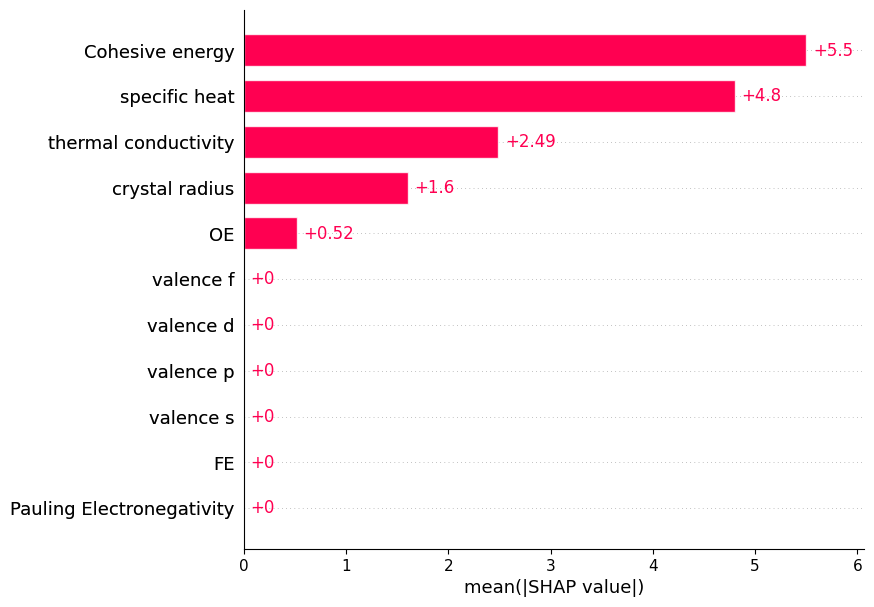

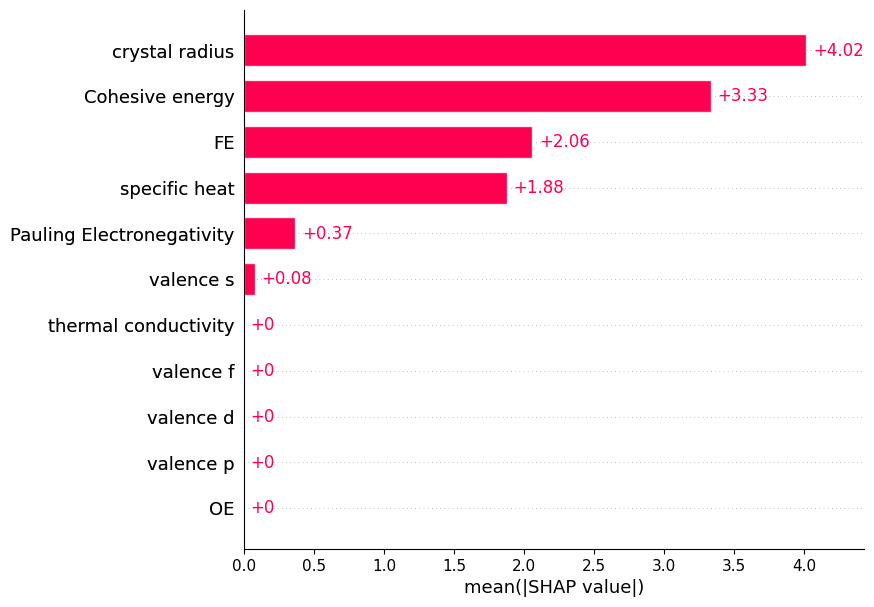

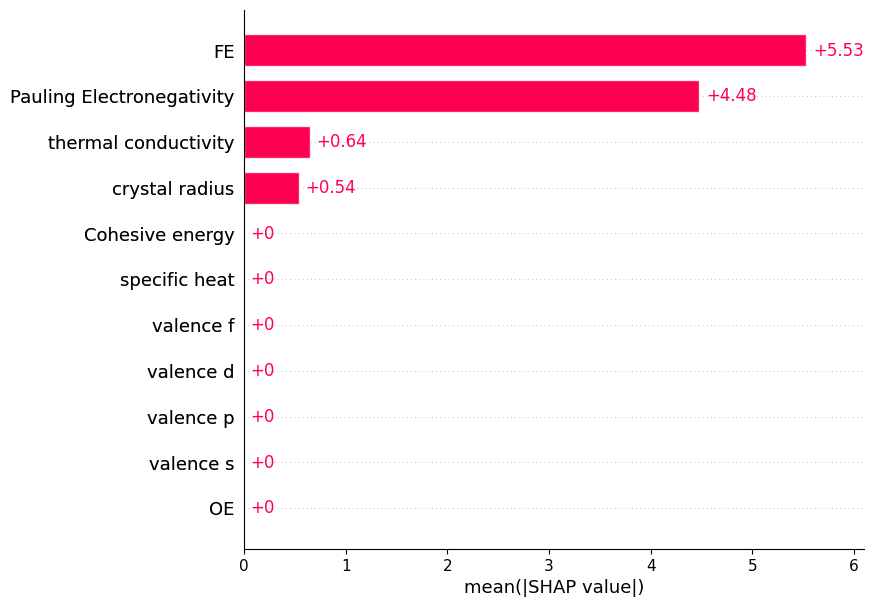

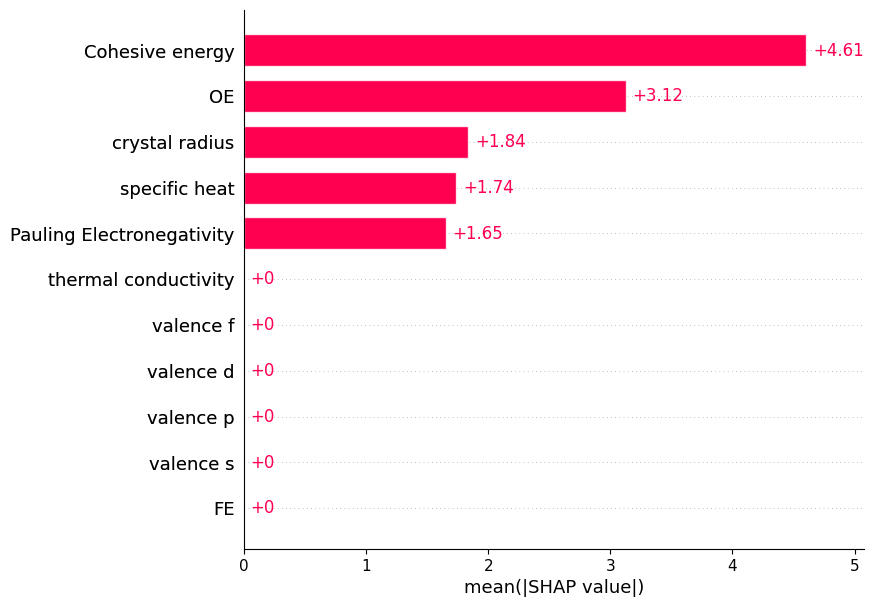

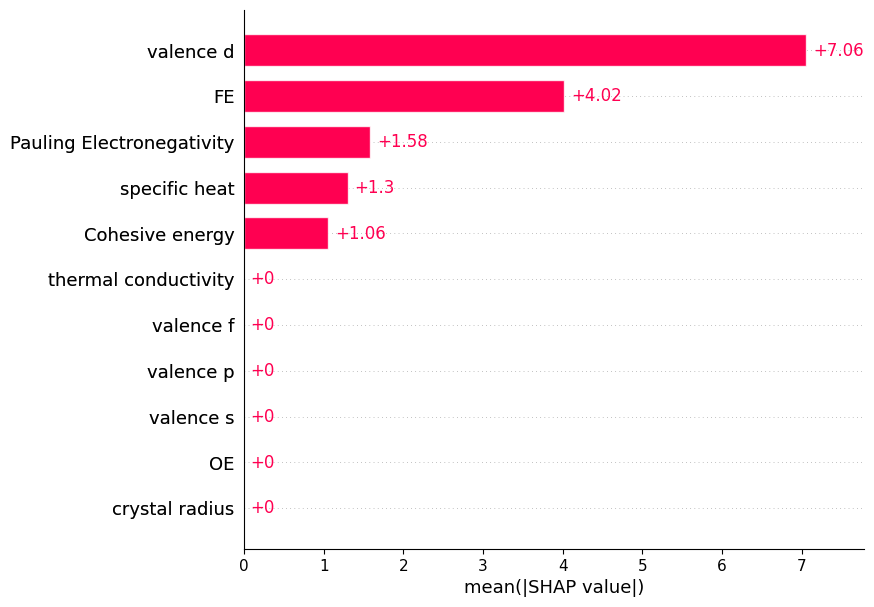

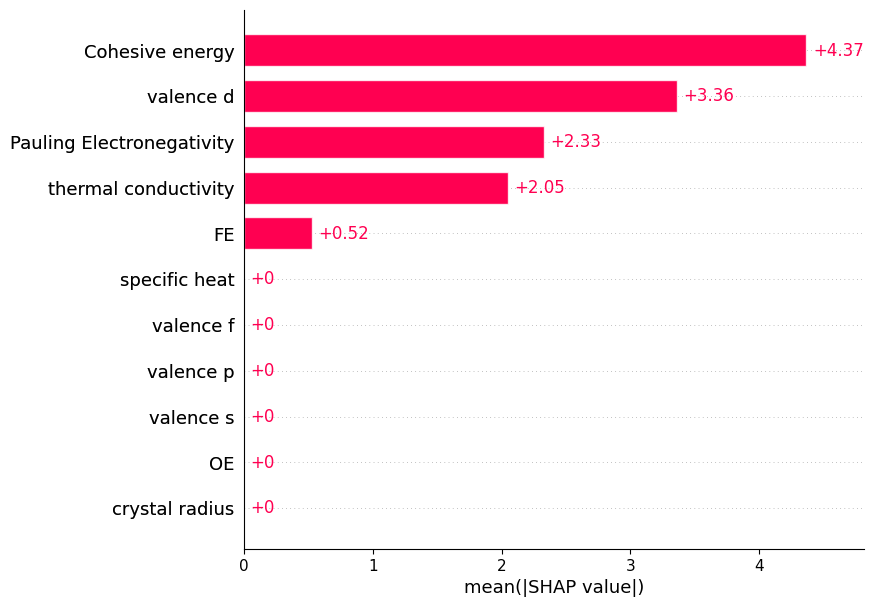

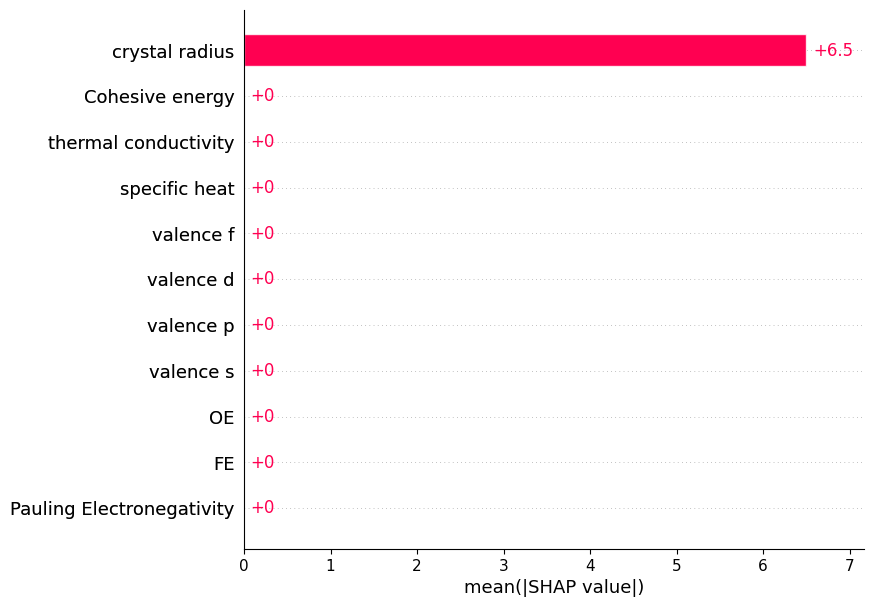

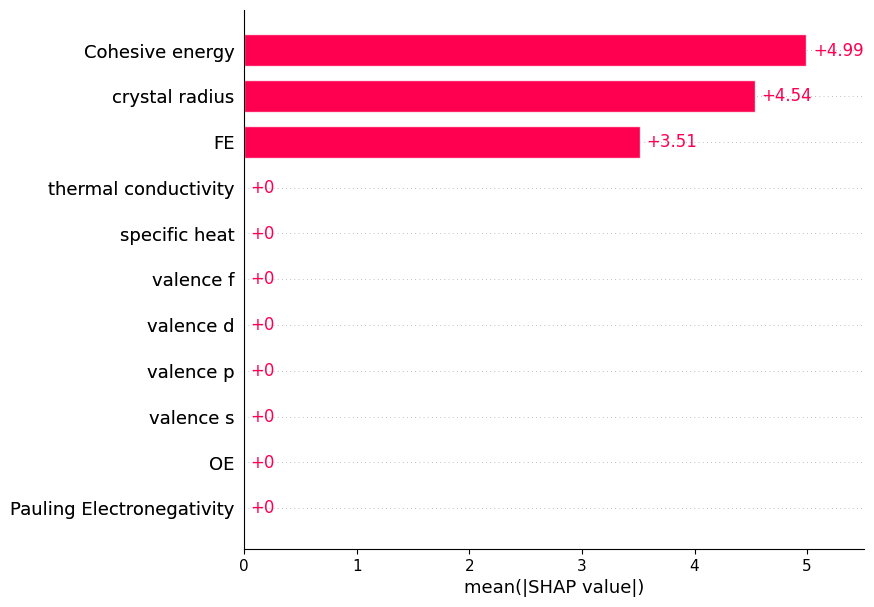

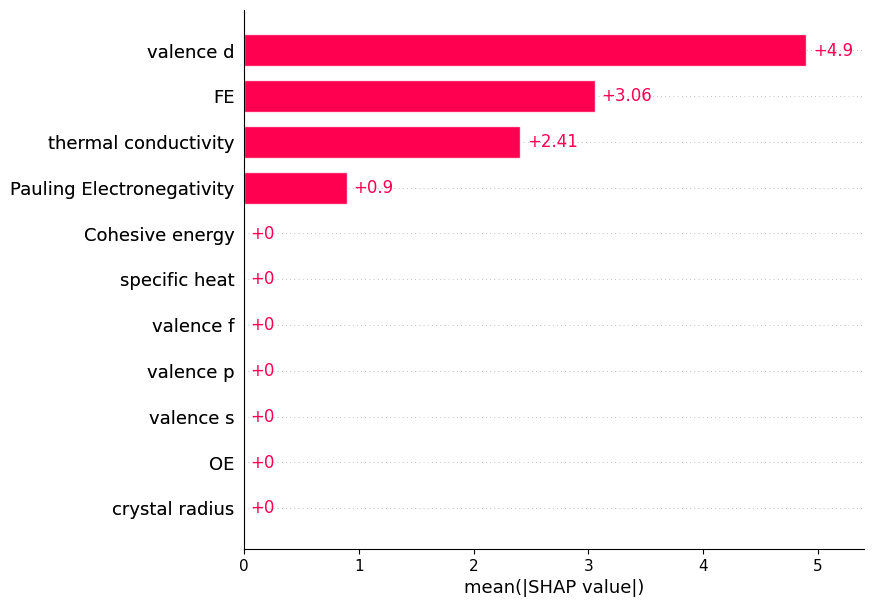

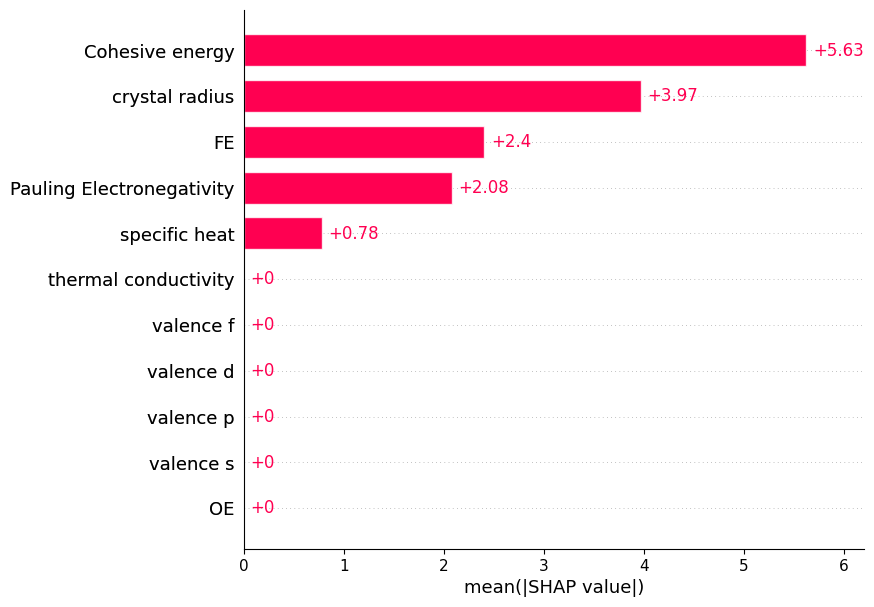

In [ ]:
model_DT2.plot_SHAP("all")

### Random Forest

In [ ]:
random_seeds = np.arange(0,10)
model_RF2 = ModelEvaluatorBayes(X_metal_des, res, random_seeds, RandomForestRegressor, param_space_RF, results_dict=results_fit, IIS_dict=IIS_fit, model_dict=models_fit)
model_RF2.evaluate_model()

Random seed 0 finished

Random seed 1 finished

Random seed 2 finished

Random seed 3 finished



The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.


Random seed 4 finished



The objective has been evaluated at this point before.


Random seed 5 finished



The objective has been evaluated at this point before.


Random seed 6 finished

Random seed 7 finished

Random seed 8 finished

Random seed 9 finished



In [ ]:
model_RF2.show_IIS()

,Feature,Mean Rank,Non-Zero Frequency (%),IIS
10,Cohesive energy,1.800000,100.0,0.853333
6,valence d,1.900000,100.0,0.843684
2,FE,3.300000,100.0,0.770000
0,crystal radius,4.600000,100.0,0.741739
3,OE,5.300000,100.0,0.732264
4,valence s,6.100000,100.0,0.724098
1,Pauling Electronegativity,6.800000,100.0,0.718529
8,specific heat,6.800000,100.0,0.718529
9,thermal conductivity,8.400000,100.0,0.709286
5,valence p,10.700000,100.0,0.700841


In [ ]:
model_RF2.show_shap_ranks()

{'crystal radius': [5, 6, 2, 6, 5, 4, 2, 7, 5, 4],
 'Pauling Electronegativity': [8, 5, 9, 3, 9, 5, 9, 5, 8, 7],
 'FE': [3, 2, 3, 4, 3, 3, 8, 3, 2, 2],
 'OE': [6, 4, 4, 5, 4, 8, 6, 6, 4, 6],
 'valence s': [4, 7, 7, 7, 7, 6, 4, 8, 6, 5],
 'valence p': [11, 11, 11, 11, 10, 11, 10, 11, 10, 11],
 'valence d': [2, 1, 1, 2, 2, 2, 3, 2, 3, 1],
 'valence f': [10, 10, 10, 10, 11, 10, 11, 10, 10],
 'specific heat': [7, 8, 6, 8, 6, 7, 7, 4, 7, 8],
 'thermal conductivity': [9, 9, 8, 9, 8, 9, 5, 9, 9, 9],
 'Cohesive energy': [1, 3, 5, 1, 1, 1, 1, 1, 1, 3]}

In [ ]:
model_RF2.show_parameters()

{0: OrderedDict([('max_depth', 8),
              ('max_features', 3),
              ('min_samples_leaf', 10),
              ('min_samples_split', 0.1)]),
 1: OrderedDict([('max_depth', 4),
              ('max_features', 4),
              ('min_samples_leaf', 10),
              ('min_samples_split', 0.01)]),
 2: OrderedDict([('max_depth', 5),
              ('max_features', 3),
              ('min_samples_leaf', 10),
              ('min_samples_split', 0.09882539272164746)]),
 3: OrderedDict([('max_depth', 9),
              ('max_features', 2),
              ('min_samples_leaf', 10),
              ('min_samples_split', 0.04347476962421396)]),
 4: OrderedDict([('max_depth', 2),
              ('max_features', 8),
              ('min_samples_leaf', 1),
              ('min_samples_split', 0.01)]),
 5: OrderedDict([('max_depth', 10),
              ('max_features', 4),
              ('min_samples_leaf', 10),
              ('min_samples_split', 0.06750154373098105)]),
 6: OrderedDict([('max_dep

In [ ]:
model_RF2.show_performance()

,random_seed,training R2,test R2,training RMSE,test RMSE,cv_score
0,0,0.163033,0.050937,22.451050,21.450303,0.006743
1,1,0.171654,0.122639,20.891972,26.748888,0.000728
2,2,0.145713,0.176803,22.286530,22.282617,0.013893
3,3,0.179964,0.005544,22.068021,23.120233,0.059152
4,4,0.171583,0.052002,22.256739,22.240712,0.053890
5,5,0.145136,0.142029,21.496166,25.603441,-0.042357
6,6,0.130382,0.002106,23.058633,21.394856,-0.105841
7,7,0.201020,-0.071503,21.741880,24.536122,0.108766
8,8,0.125473,0.238050,22.892000,20.150287,0.046450
9,9,0.168329,0.057983,22.448502,21.362780,-0.007872


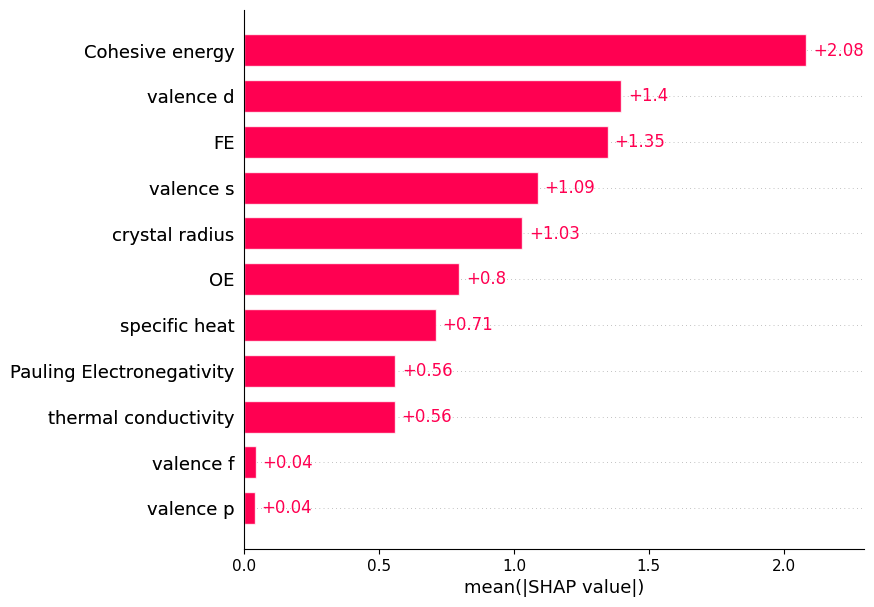

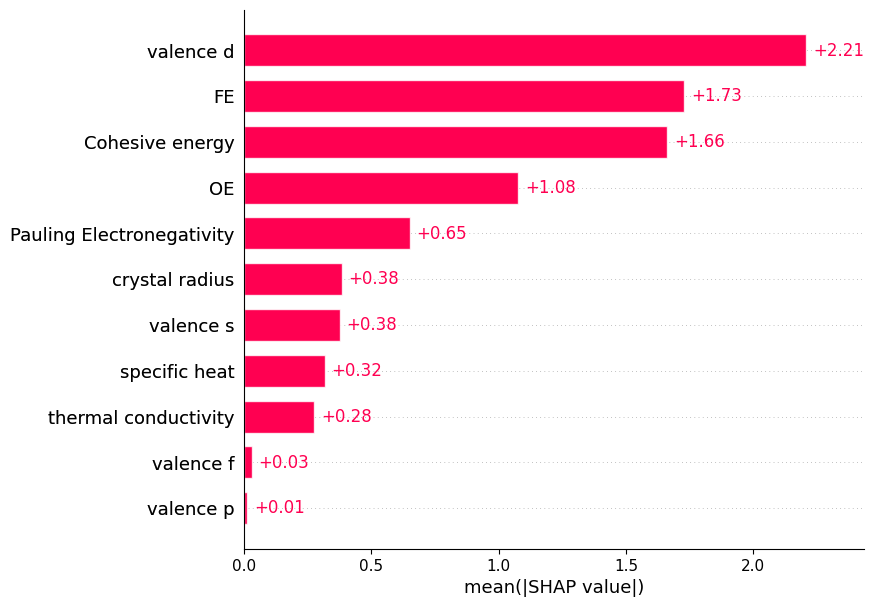

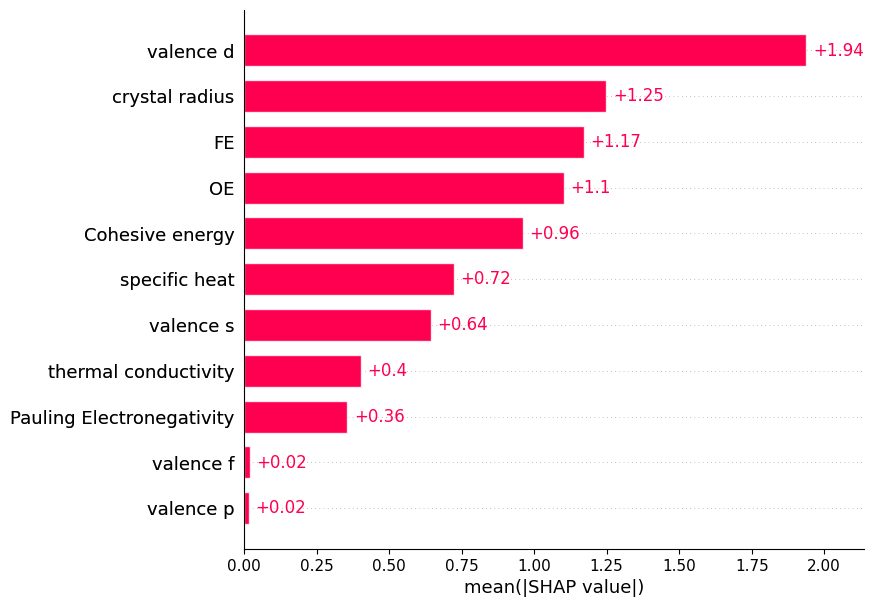

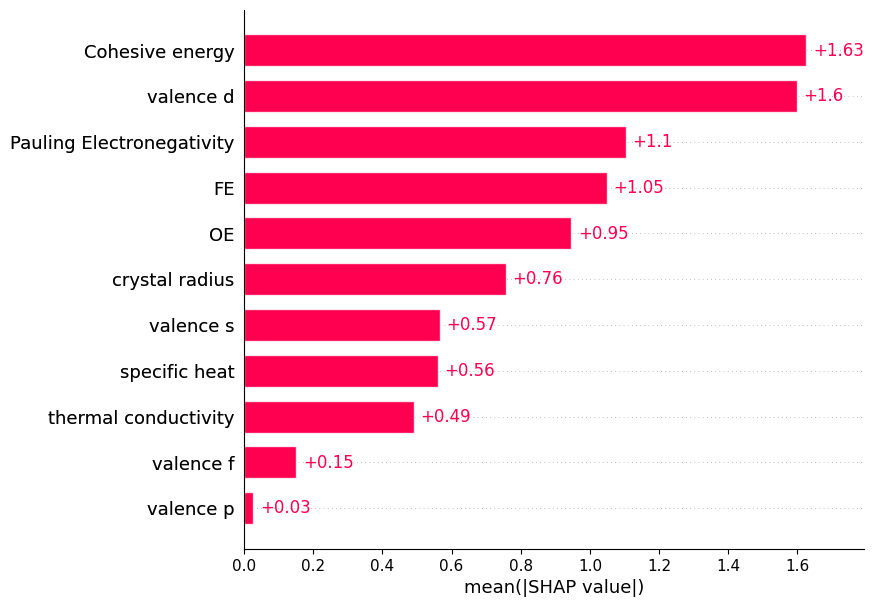

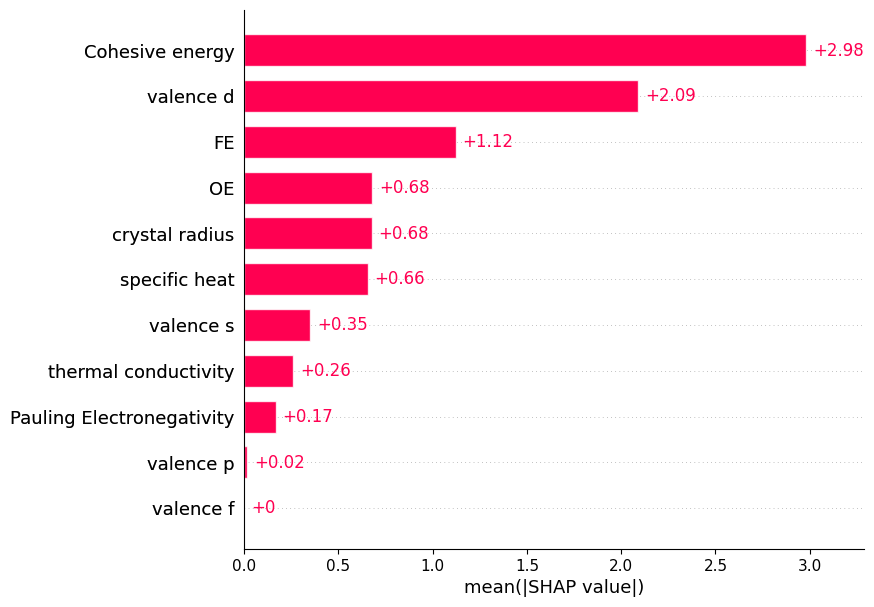

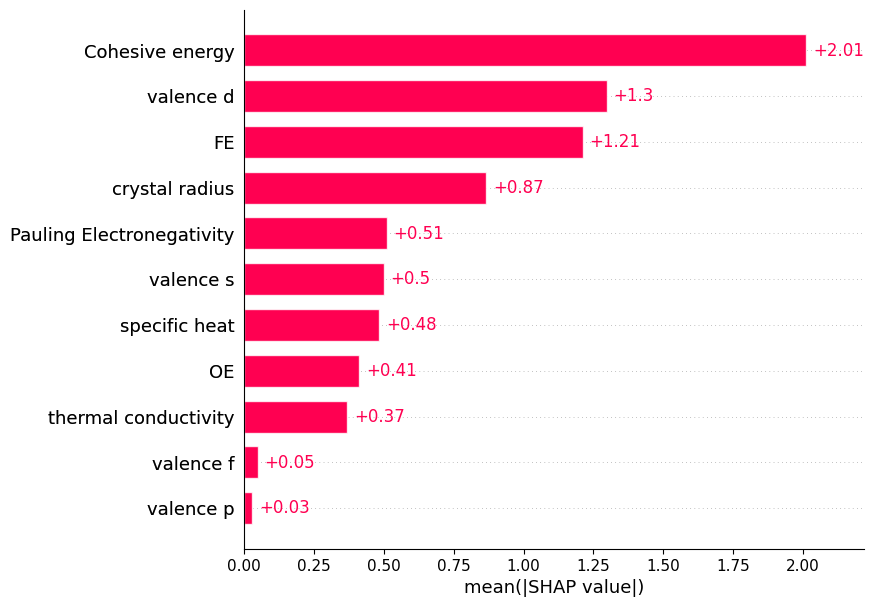

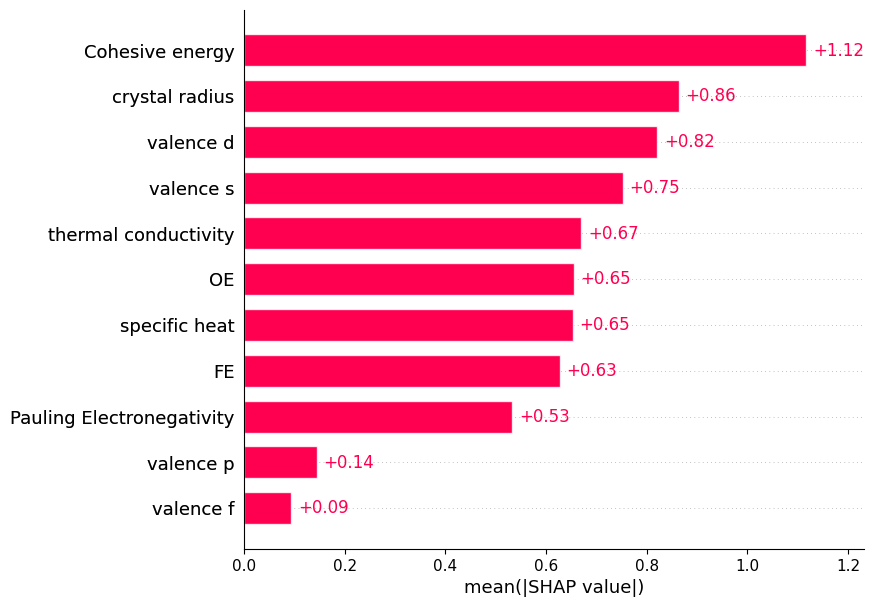

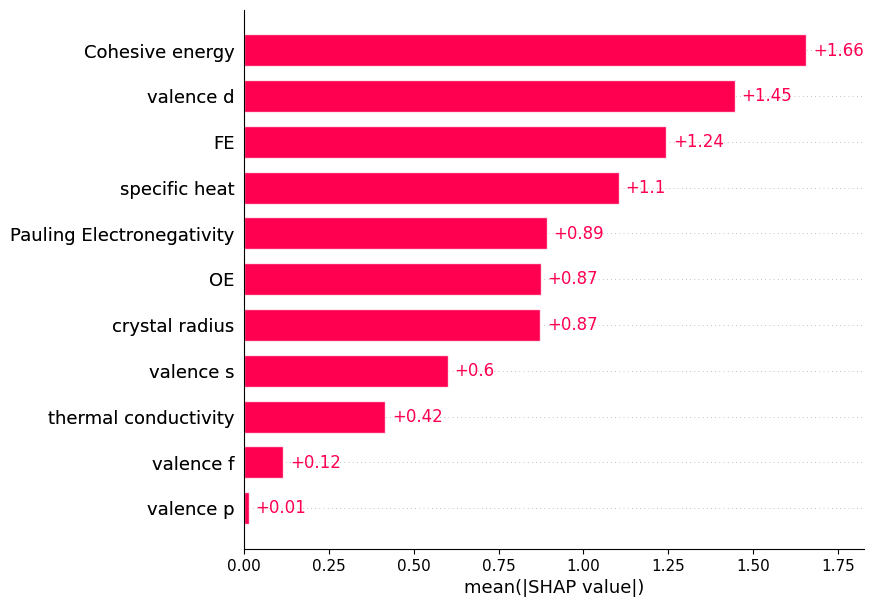

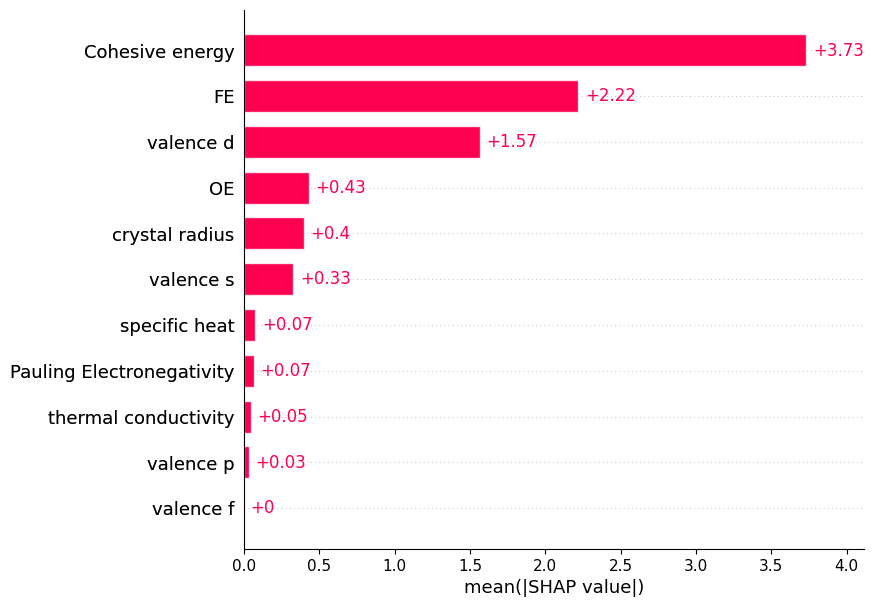

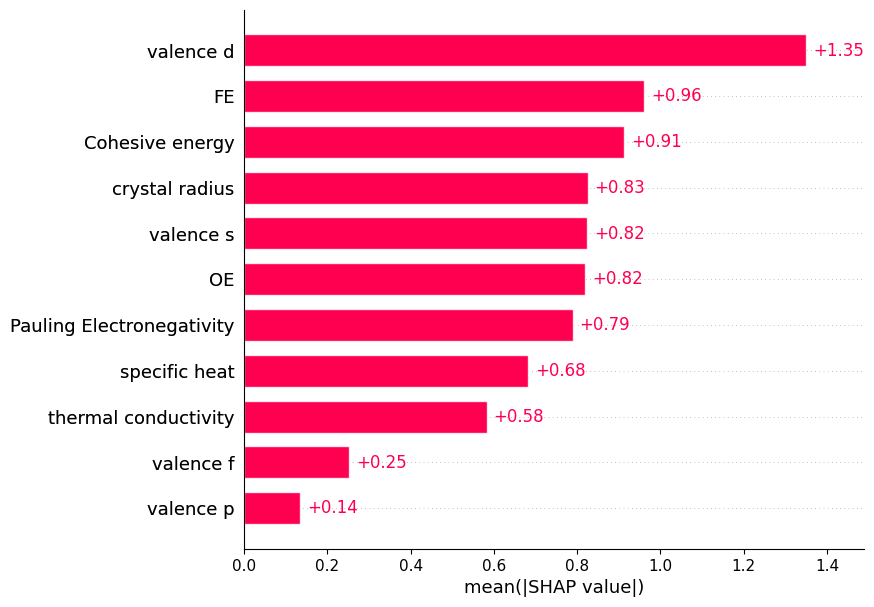

In [ ]:
model_RF2.plot_SHAP("all")

### Gradient boost regressor

In [ ]:
random_seeds = np.arange(0,10)
model_GB2 = ModelEvaluatorBayes(X_metal_des, res, random_seeds, GradientBoostingRegressor, param_space_GB, results_dict=results_fit, IIS_dict=IIS_fit, model_dict=models_fit)
model_GB2.evaluate_model()

Random seed 0 finished

Random seed 1 finished

Random seed 2 finished

Random seed 3 finished

Random seed 4 finished

Random seed 5 finished

Random seed 6 finished

Random seed 7 finished

Random seed 8 finished

Random seed 9 finished



In [ ]:
model_GB2.show_IIS()

,Feature,Mean Rank,Non-Zero Frequency (%),IIS
10,Cohesive energy,1.800000,100.0,0.853333
0,crystal radius,3.400000,100.0,0.767059
2,FE,3.500000,100.0,0.764286
6,valence d,6.700000,100.0,0.719254
3,OE,8.000000,100.0,0.711250
8,specific heat,4.111111,90.0,0.683270
4,valence s,5.888889,90.0,0.659038
1,Pauling Electronegativity,6.222222,90.0,0.656036
9,thermal conductivity,6.777778,90.0,0.651689
7,valence f,8.444444,90.0,0.642079


In [ ]:
model_GB2.show_shap_ranks()

{'crystal radius': [3, 5, 4, 2, 4, 4, 3, 3, 4, 2],
 'Pauling Electronegativity': [6, 6, 7, 7, 5, 6, 7, 7, 5],
 'FE': [9, 2, 2, 3, 2, 6, 4, 2, 2, 3],
 'OE': [5, 9, 5, 9, 9, 11, 11, 8, 6, 7],
 'valence s': [10, 3, 5, 5, 2, 5, 10, 3, 10],
 'valence p': [11, 10, 10, 7, 11, 10, 11],
 'valence d': [7, 1, 1, 11, 6, 8, 9, 9, 9, 6],
 'valence f': [8, 10, 6, 10, 7, 10, 5, 11, 9],
 'specific heat': [2, 8, 4, 3, 3, 2, 6, 5, 4],
 'thermal conductivity': [4, 4, 8, 8, 9, 8, 4, 8, 8],
 'Cohesive energy': [1, 7, 3, 1, 1, 1, 1, 1, 1, 1]}

In [ ]:
model_GB2.show_parameters()

{0: OrderedDict([('learning_rate', 0.033999077954387856),
              ('max_depth', 6),
              ('min_samples_leaf', 7),
              ('min_samples_split', 2),
              ('n_estimators', 20)]),
 1: OrderedDict([('learning_rate', 0.02457985904083643),
              ('max_depth', 9),
              ('min_samples_leaf', 5),
              ('min_samples_split', 2),
              ('n_estimators', 116)]),
 2: OrderedDict([('learning_rate', 0.05548597320460611),
              ('max_depth', 1),
              ('min_samples_leaf', 10),
              ('min_samples_split', 2),
              ('n_estimators', 55)]),
 3: OrderedDict([('learning_rate', 0.011320529689555393),
              ('max_depth', 9),
              ('min_samples_leaf', 1),
              ('min_samples_split', 10),
              ('n_estimators', 76)]),
 4: OrderedDict([('learning_rate', 0.005039154872578303),
              ('max_depth', 7),
              ('min_samples_leaf', 5),
              ('min_samples_split', 10),
 

In [ ]:
model_GB2.show_performance()

,random_seed,training R2,test R2,training RMSE,test RMSE,cv_score
0,0,0.138822,0.030863,22.773450,21.675971,0.017492
1,1,0.193535,0.142375,20.614188,26.446314,0.005476
2,2,0.131195,0.150077,22.475099,22.641445,0.018941
3,3,0.182229,0.027929,22.037524,22.858536,0.087333
4,4,0.164397,0.083296,22.353067,21.870537,0.063847
5,5,0.136546,0.093238,21.603890,26.321375,-0.019195
6,6,0.122195,0.035433,23.166924,21.034554,-0.111583
7,7,0.202311,-0.021705,21.724316,23.959183,0.102792
8,8,0.149887,0.210232,22.570203,20.514833,0.058675
9,9,0.149771,0.097560,22.697571,20.909203,0.002908


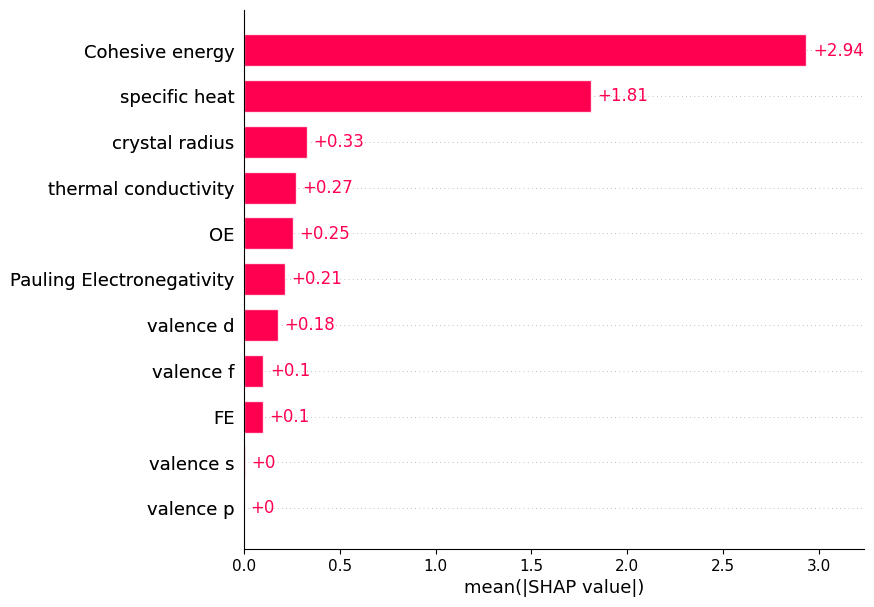

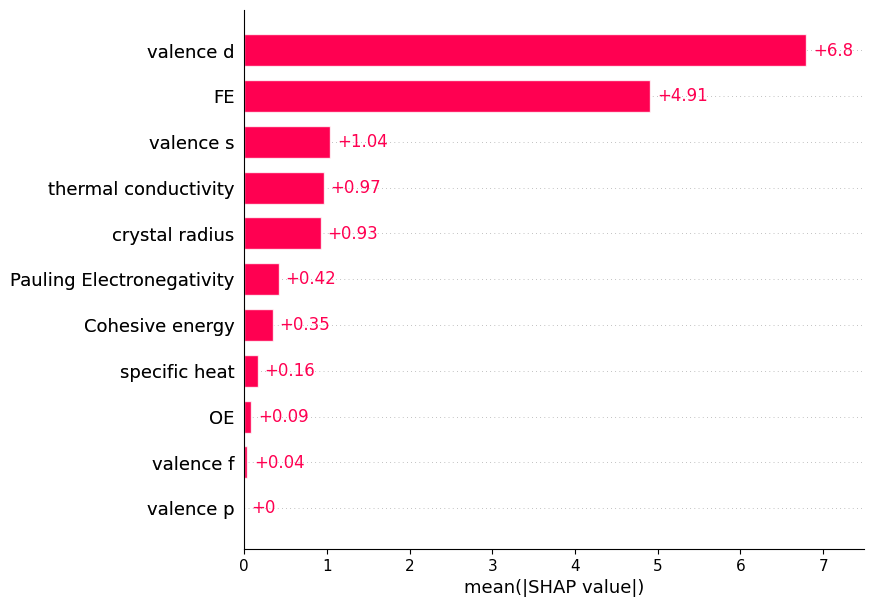

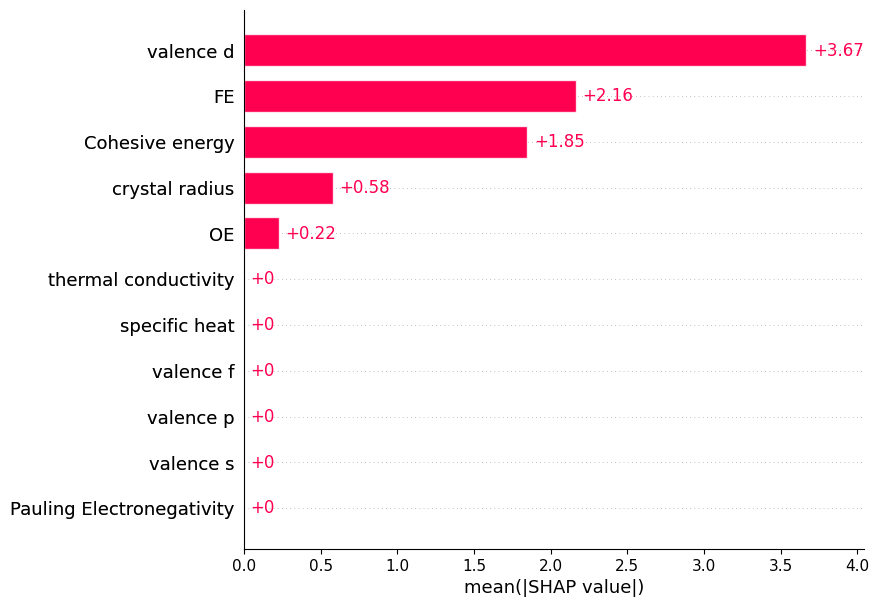

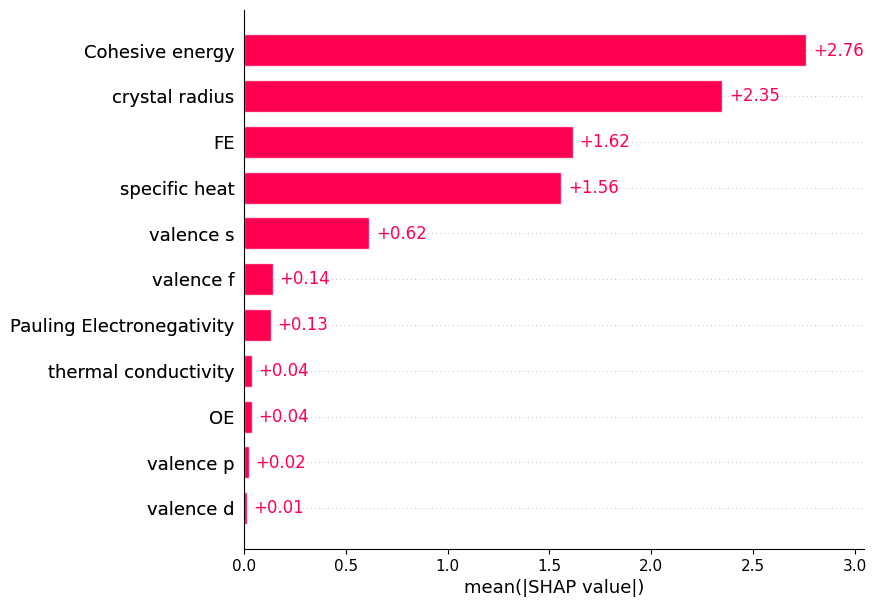

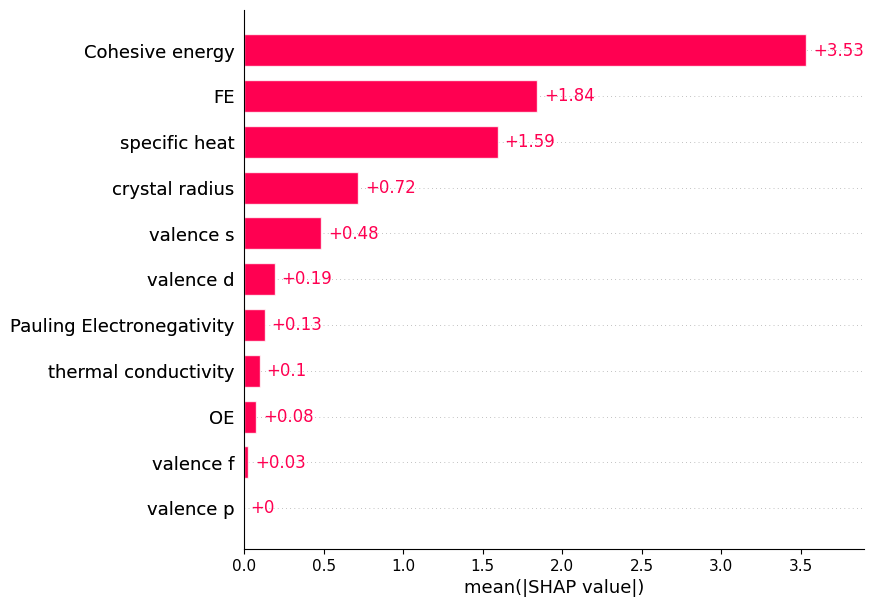

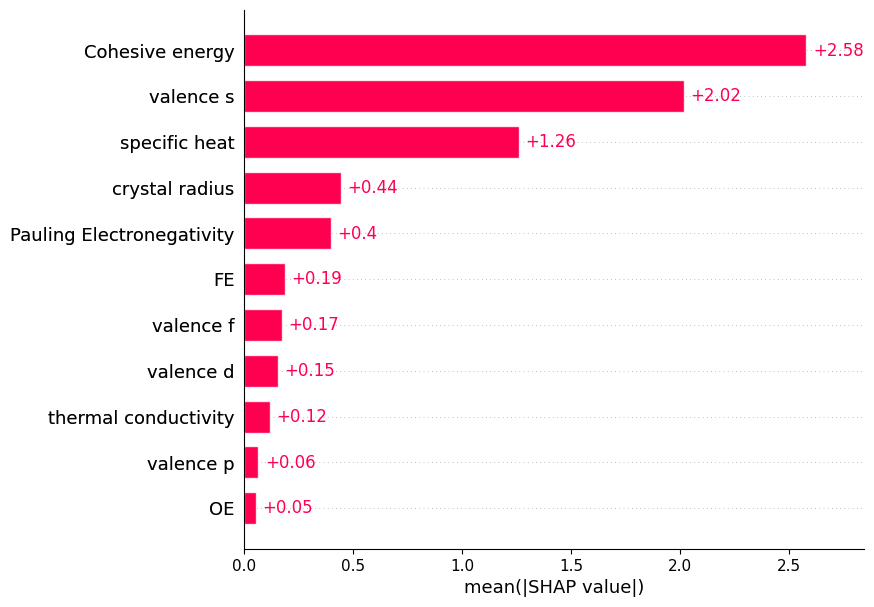

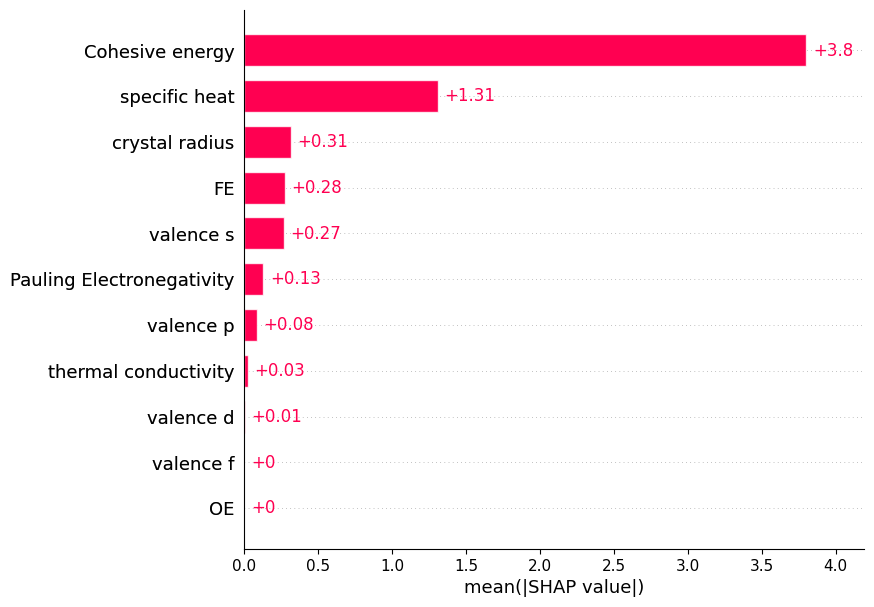

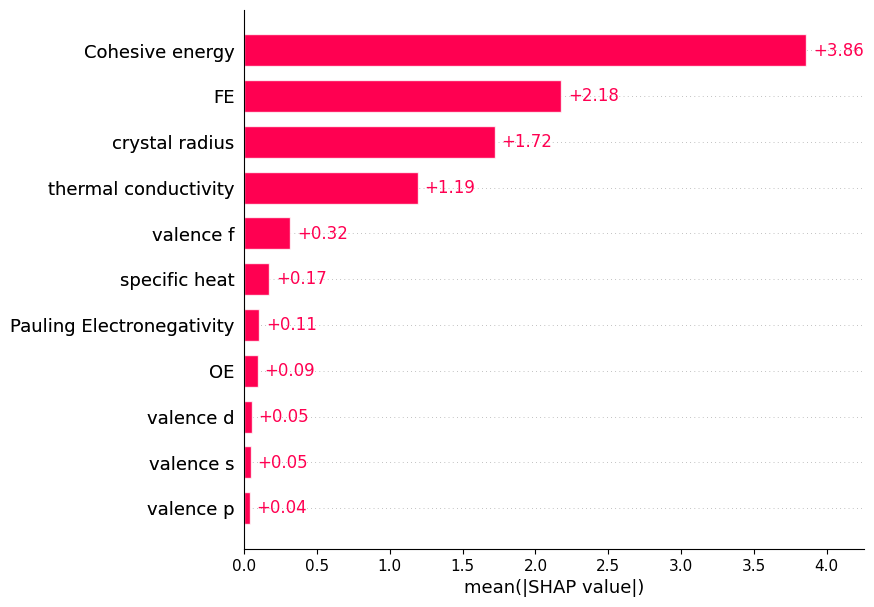

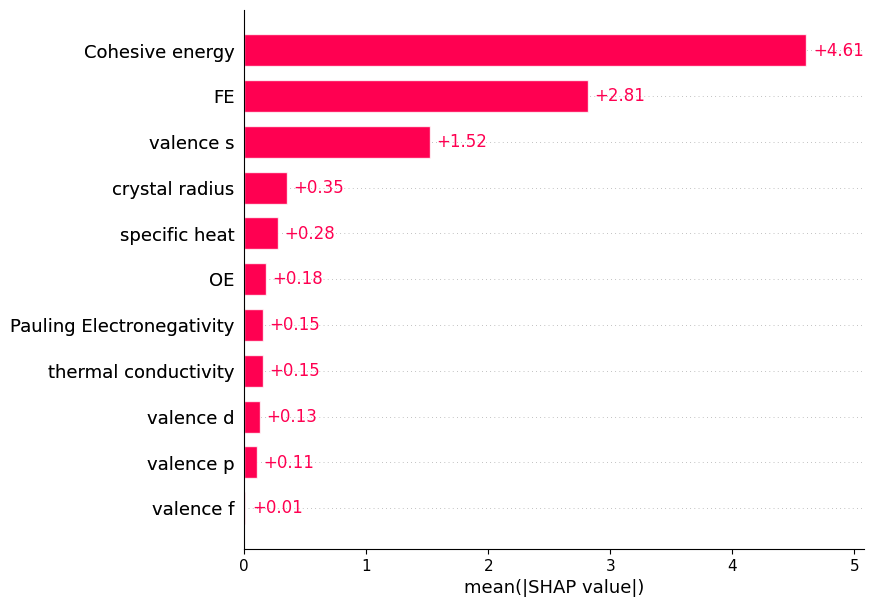

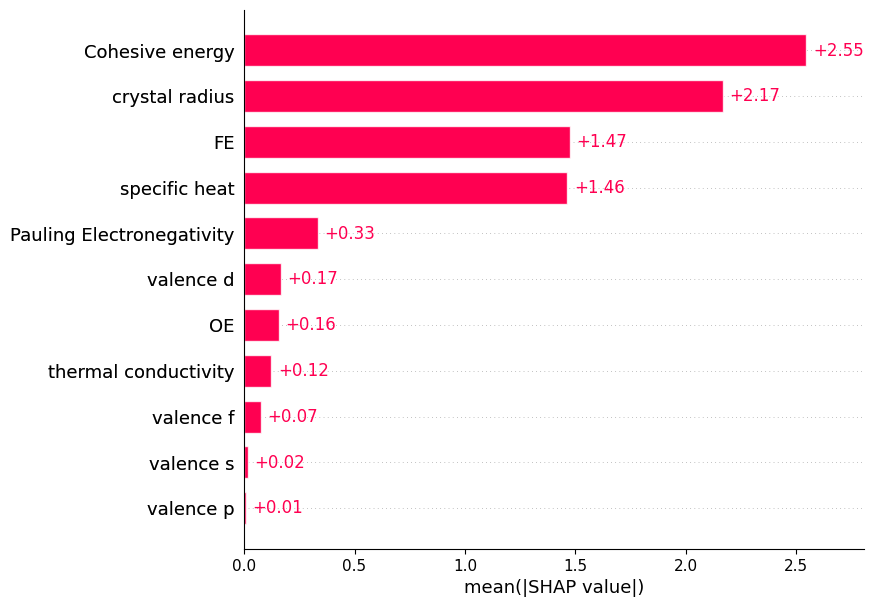

In [ ]:
model_GB2.plot_SHAP("all")

### XGBoost regressor

In [ ]:
random_seeds = np.arange(0,10)
model_XGB2 = ModelEvaluatorBayes(X_metal_des, res, random_seeds, XGBRegressor, param_space_XGB, results_dict=results_fit, IIS_dict=IIS_fit, model_dict=models_fit)
model_XGB2.evaluate_model()

Random seed 0 finished

Random seed 1 finished

Random seed 2 finished

Random seed 3 finished

Random seed 4 finished

Random seed 5 finished

Random seed 6 finished

Random seed 7 finished

Random seed 8 finished

Random seed 9 finished



In [ ]:
model_XGB2.show_IIS()

,Feature,Mean Rank,Non-Zero Frequency (%),IIS
10,Cohesive energy,1.100000,100.0,0.970000
2,FE,3.000000,100.0,0.780000
0,crystal radius,3.111111,90.0,0.709071
8,specific heat,4.333333,90.0,0.679154
6,valence d,3.000000,50.0,0.445000
9,thermal conductivity,6.500000,40.0,0.318769
1,Pauling Electronegativity,6.000000,30.0,0.256000
4,valence s,4.500000,20.0,0.207333
3,OE,5.000000,10.0,0.133000
5,valence p,5.000000,10.0,0.133000


In [ ]:
model_XGB2.show_shap_ranks()

{'crystal radius': [3, 3, 4, 2, 5, 3, 3, 3, 2],
 'Pauling Electronegativity': [7, 6, 5],
 'FE': [2, 2, 3, 3, 3, 6, 4, 2, 2, 3],
 'OE': [5],
 'valence s': [8, 1],
 'valence p': [5],
 'valence d': [4, 4, 2, 2, 3],
 'valence f': [7],
 'specific heat': [5, 5, 6, 4, 4, 4, 2, 5, 4],
 'thermal conductivity': [6, 7, 9, 4],
 'Cohesive energy': [1, 1, 1, 1, 1, 2, 1, 1, 1, 1]}

In [ ]:
model_XGB2.show_parameters()

{0: OrderedDict([('learning_rate', 0.013563551029265257),
              ('max_depth', 8),
              ('n_estimators', 179),
              ('reg_alpha', 3.261666904766087e-06),
              ('reg_lambda', 100.0)]),
 1: OrderedDict([('learning_rate', 0.07551784291931832),
              ('max_depth', 10),
              ('n_estimators', 26),
              ('reg_alpha', 100.0),
              ('reg_lambda', 0.0057241252179409015)]),
 2: OrderedDict([('learning_rate', 0.017491376279902708),
              ('max_depth', 2),
              ('n_estimators', 153),
              ('reg_alpha', 1e-06),
              ('reg_lambda', 42.98152651914437)]),
 3: OrderedDict([('learning_rate', 0.011105310882130896),
              ('max_depth', 7),
              ('n_estimators', 87),
              ('reg_alpha', 4.557957748921416e-06),
              ('reg_lambda', 1.9196407263608543e-05)]),
 4: OrderedDict([('learning_rate', 0.006409597825002904),
              ('max_depth', 2),
              ('n_estimator

In [ ]:
model_XGB2.show_performance()

,random_seed,training R2,test R2,training RMSE,test RMSE,cv_score
0,0,0.127598,0.002782,22.921380,21.987760,0.042637
1,1,0.154503,0.110458,21.107144,26.933928,0.024561
2,2,0.141188,0.163020,22.345469,22.468382,0.042729
3,3,0.180293,-0.019279,22.063607,23.407011,0.071878
4,4,0.146215,0.077350,22.594947,21.941359,0.067809
5,5,0.129135,0.079649,21.696404,26.517879,-0.007690
6,6,0.121492,0.014609,23.176194,21.260397,-0.088785
7,7,0.156950,-0.025028,22.333449,23.998115,0.088250
8,8,0.120433,0.190498,22.957870,20.769545,0.062289
9,9,0.127925,0.021571,22.987325,21.771735,0.013712


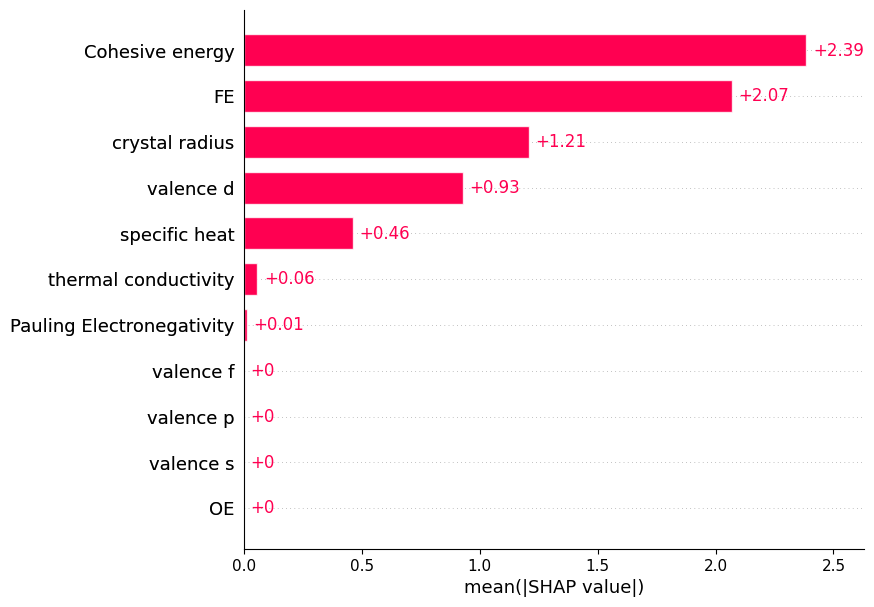

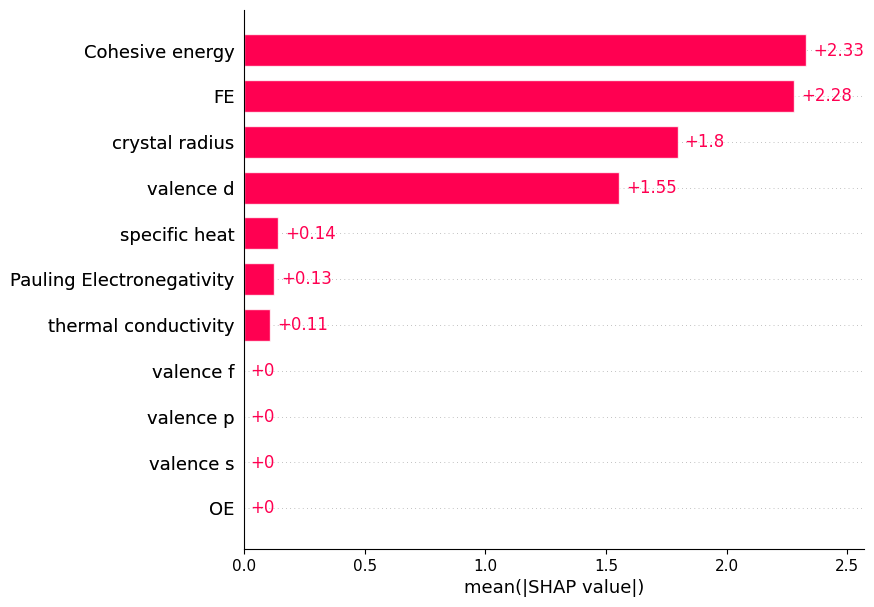

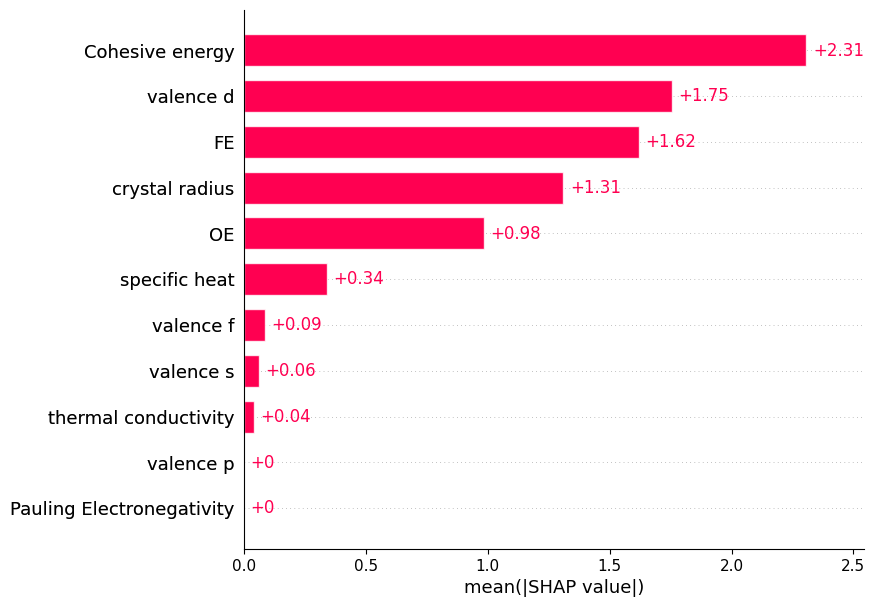

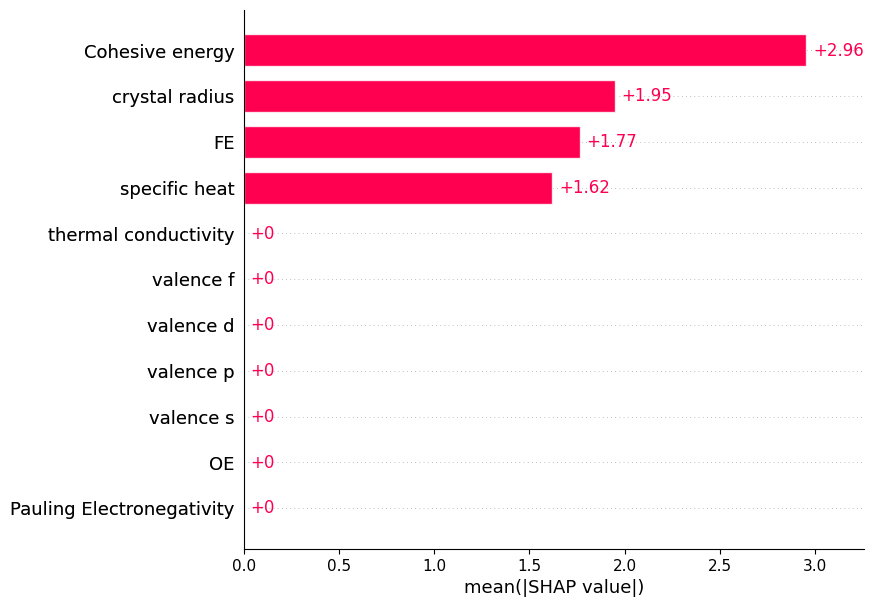

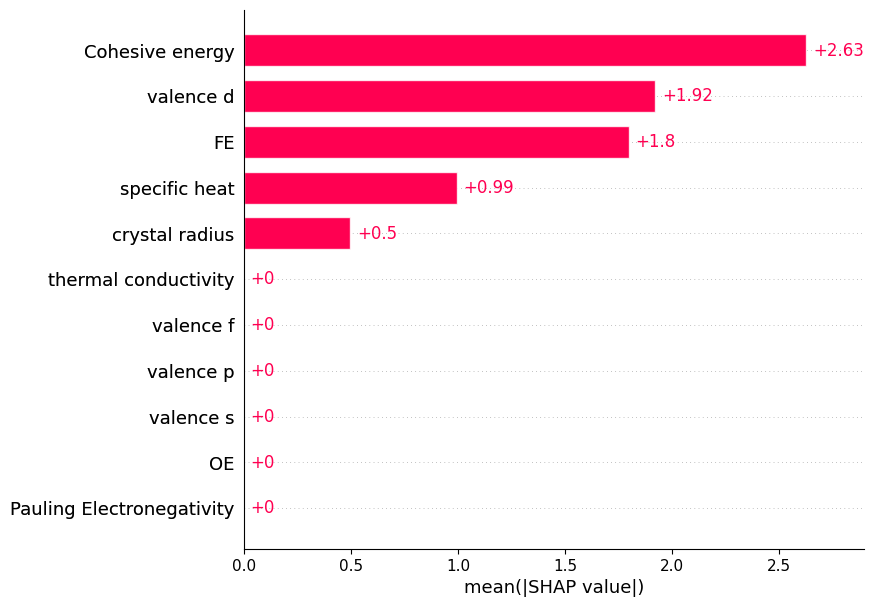

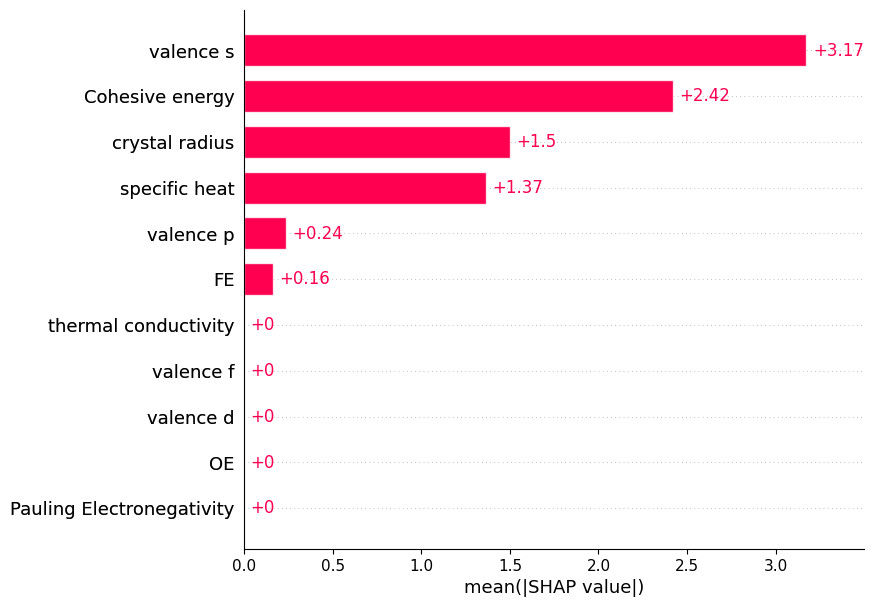

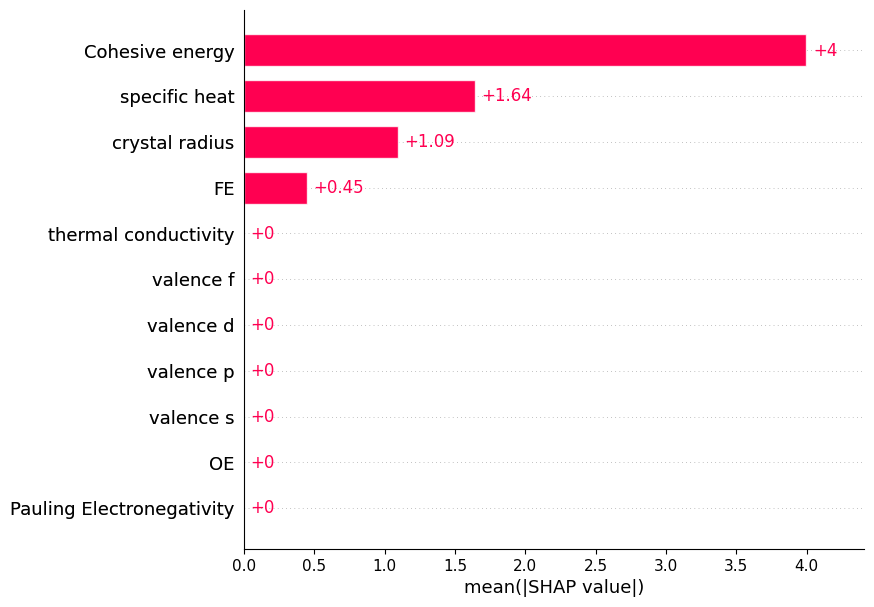

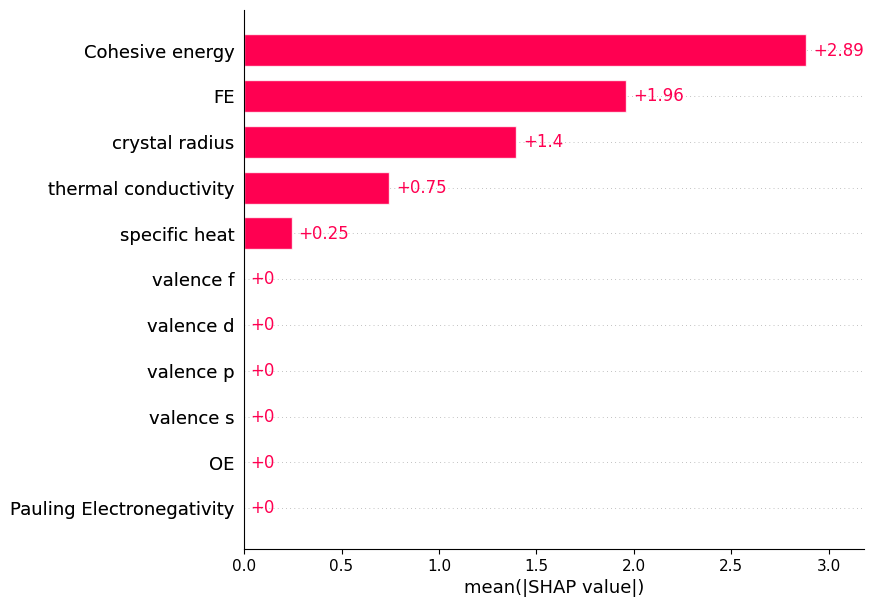

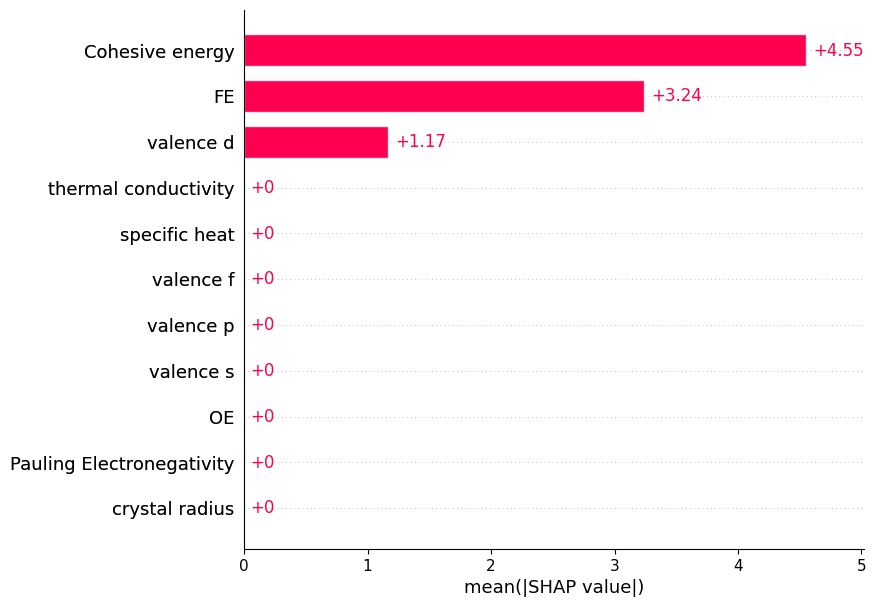

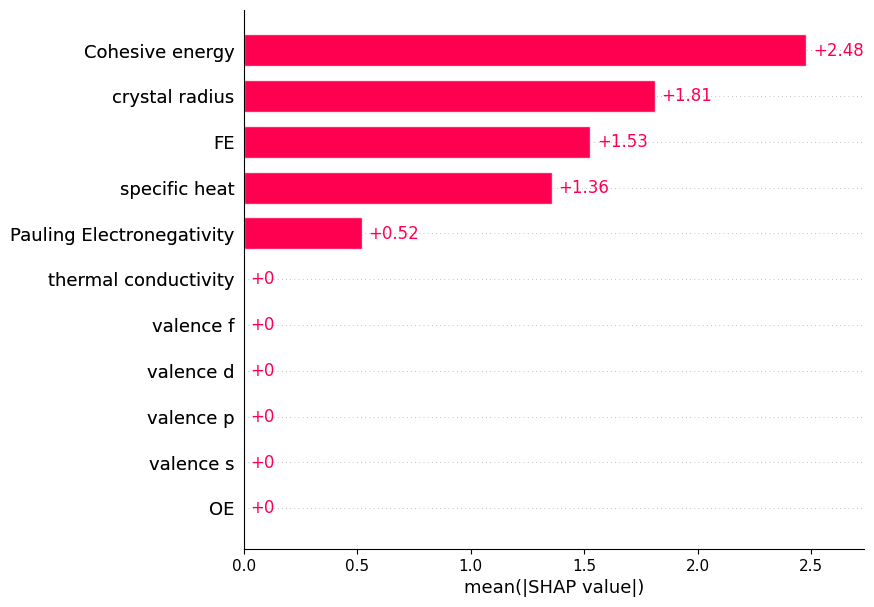

In [ ]:
model_XGB2.plot_SHAP("all")

### Support vector regression

In [ ]:
random_seeds = np.arange(0,10)
model_SVR2 = ModelEvaluatorBayes(X_metal_des, res, random_seeds, SVR, param_space_SVR, results_dict=results_fit, IIS_dict=IIS_fit, model_dict=models_fit)
model_SVR2.evaluate_model()

Permutation explainer: 138it [00:33,  2.87it/s]


Random seed 0 finished



Permutation explainer: 138it [00:36,  2.65it/s]


Random seed 1 finished



The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The object

Random seed 2 finished



Permutation explainer: 138it [00:38,  2.62it/s]


Random seed 3 finished



The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The object

Random seed 4 finished



Permutation explainer: 138it [00:33,  2.87it/s]


Random seed 5 finished



The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The object

Random seed 6 finished



Permutation explainer: 138it [00:37,  2.68it/s]


Random seed 7 finished



Permutation explainer: 138it [00:37,  2.69it/s]


Random seed 8 finished



Permutation explainer: 138it [00:37,  2.61it/s]

Random seed 9 finished



In [ ]:
model_SVR2.show_IIS()

,Feature,Mean Rank,Non-Zero Frequency (%),IIS
9,thermal conductivity,1.0,100.0,1.000000
6,valence d,2.0,100.0,0.835000
10,Cohesive energy,3.6,100.0,0.761667
7,valence f,3.7,100.0,0.759189
8,specific heat,4.7,100.0,0.740213
3,OE,6.6,100.0,0.720000
4,valence s,7.1,100.0,0.716479
5,valence p,8.1,100.0,0.710741
1,Pauling Electronegativity,8.5,100.0,0.708824
2,FE,9.9,100.0,0.703333


In [ ]:
model_SVR2.show_shap_ranks()

{'crystal radius': [9, 11, 11, 11, 11, 11, 11, 11, 11, 11],
 'Pauling Electronegativity': [7, 9, 9, 8, 10, 7, 9, 8, 9, 9],
 'FE': [10, 10, 10, 10, 9, 10, 10, 10, 10, 10],
 'OE': [8, 6, 8, 6, 8, 6, 6, 6, 6, 6],
 'valence s': [6, 7, 7, 7, 7, 9, 7, 7, 7, 7],
 'valence p': [11, 8, 6, 9, 6, 8, 8, 9, 8, 8],
 'valence d': [2, 2, 2, 2, 2, 2, 2, 2, 2, 2],
 'valence f': [3, 4, 3, 4, 3, 3, 5, 4, 4, 4],
 'specific heat': [4, 5, 4, 5, 5, 5, 4, 5, 5, 5],
 'thermal conductivity': [1, 1, 1, 1, 1, 1, 1, 1, 1, 1],
 'Cohesive energy': [5, 3, 5, 3, 4, 4, 3, 3, 3, 3]}

In [ ]:
model_SVR2.show_performance()

,random_seed,training R2,test R2,training RMSE,test RMSE,cv_score
0,0,0.075613,-0.053137,23.594419,22.595833,0.049388
1,1,0.167764,0.120997,20.940972,26.773892,0.015532
2,2,0.113312,0.119565,22.705230,23.044270,0.004703
3,3,0.187787,0.035469,21.962512,22.769706,0.078407
4,4,0.129563,0.003659,22.814225,22.800740,0.069947
5,5,0.003582,0.002008,23.207755,27.613754,-0.085195
6,6,0.146158,0.011267,22.848530,21.296421,-0.178320
7,7,0.210238,-0.038509,21.616100,24.155404,0.073489
8,8,0.129713,0.232773,22.836435,20.219949,0.055592
9,9,0.166259,0.137512,22.476425,20.441129,-0.035262


In [ ]:
model_SVR2.show_parameters()

{0: OrderedDict([('C', 174.53016941021355),
              ('epsilon', 0.1),
              ('gamma', 'scale'),
              ('kernel', 'rbf')]),
 1: OrderedDict([('C', 611.3273042289532),
              ('epsilon', 0.5),
              ('gamma', 'auto'),
              ('kernel', 'rbf')]),
 2: OrderedDict([('C', 1000.0),
              ('epsilon', 0.1),
              ('gamma', 'scale'),
              ('kernel', 'rbf')]),
 3: OrderedDict([('C', 3.381913974302678),
              ('epsilon', 0.5),
              ('gamma', 'auto'),
              ('kernel', 'rbf')]),
 4: OrderedDict([('C', 1000.0),
              ('epsilon', 0.5),
              ('gamma', 'scale'),
              ('kernel', 'rbf')]),
 5: OrderedDict([('C', 0.10804710795220844),
              ('epsilon', 0.1),
              ('gamma', 'scale'),
              ('kernel', 'rbf')]),
 6: OrderedDict([('C', 22.064440676302826),
              ('epsilon', 0.18219868070290207),
              ('gamma', 'auto'),
              ('kernel', 'rbf')]

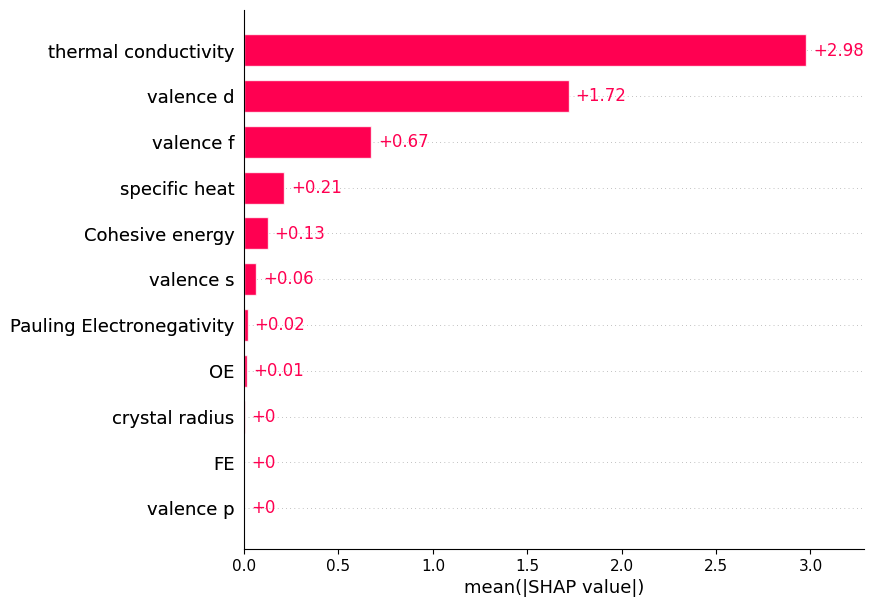

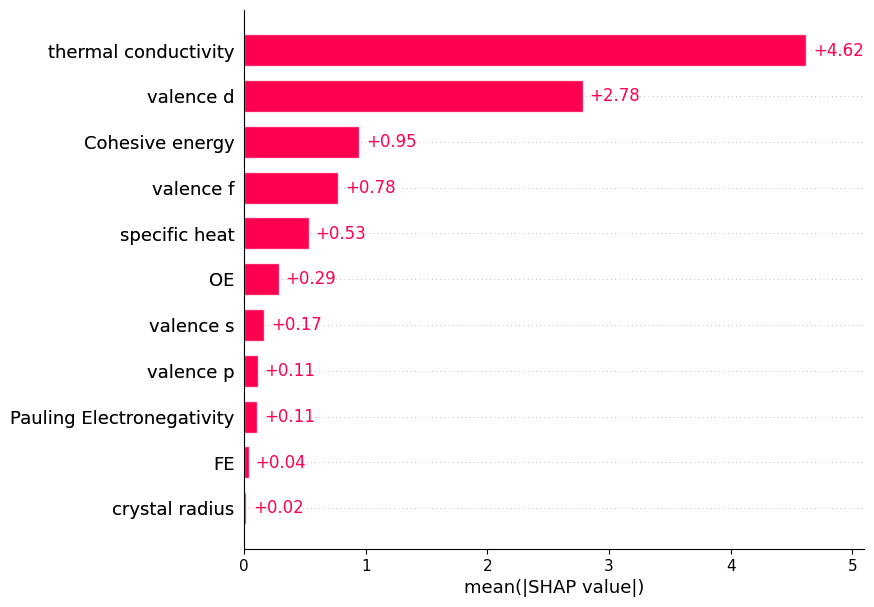

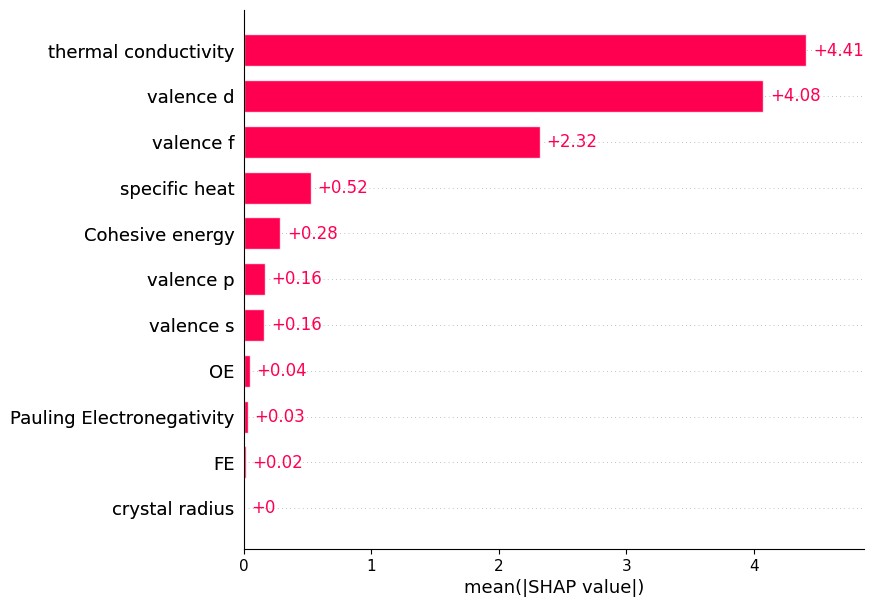

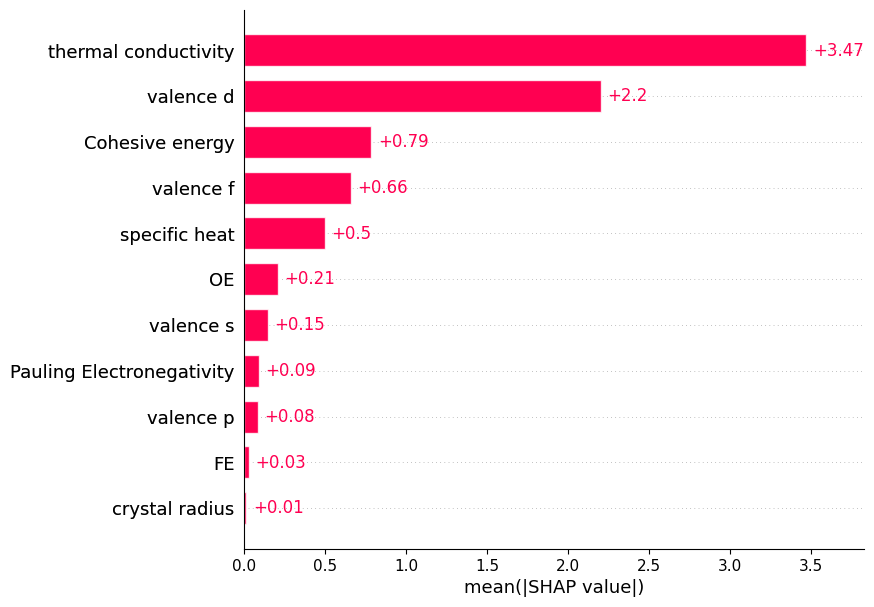

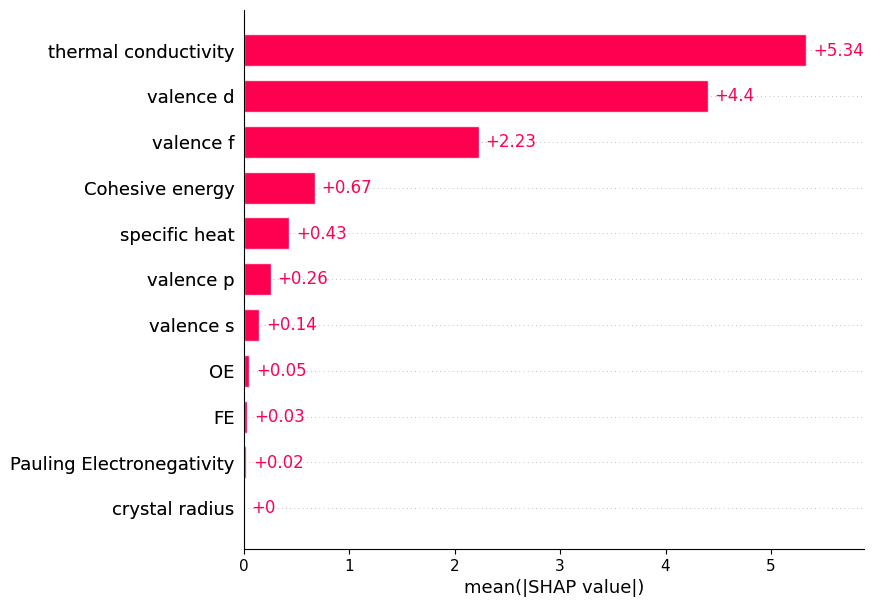

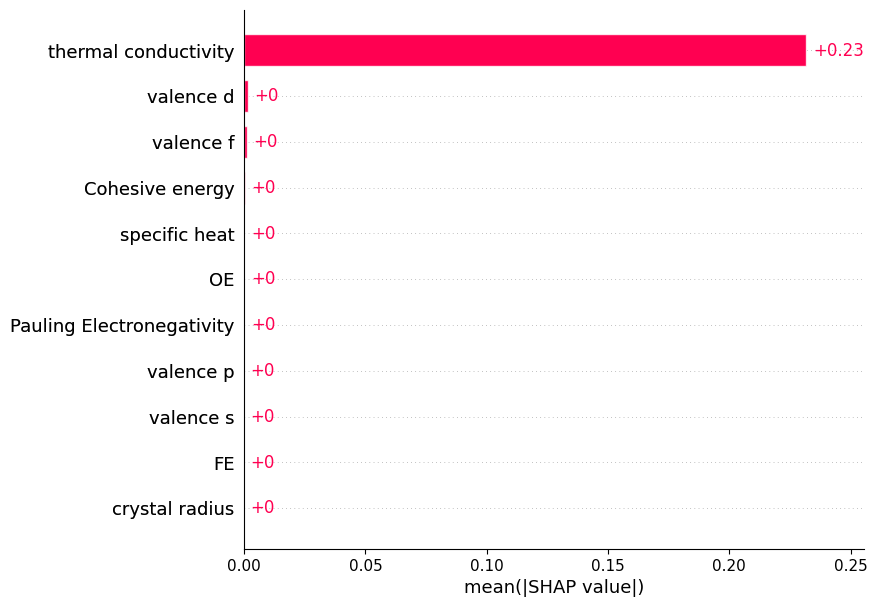

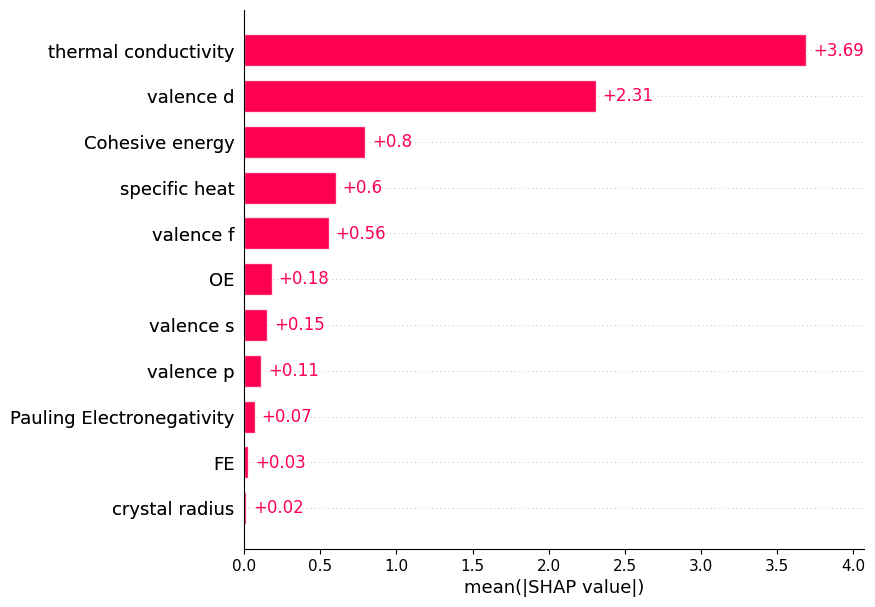

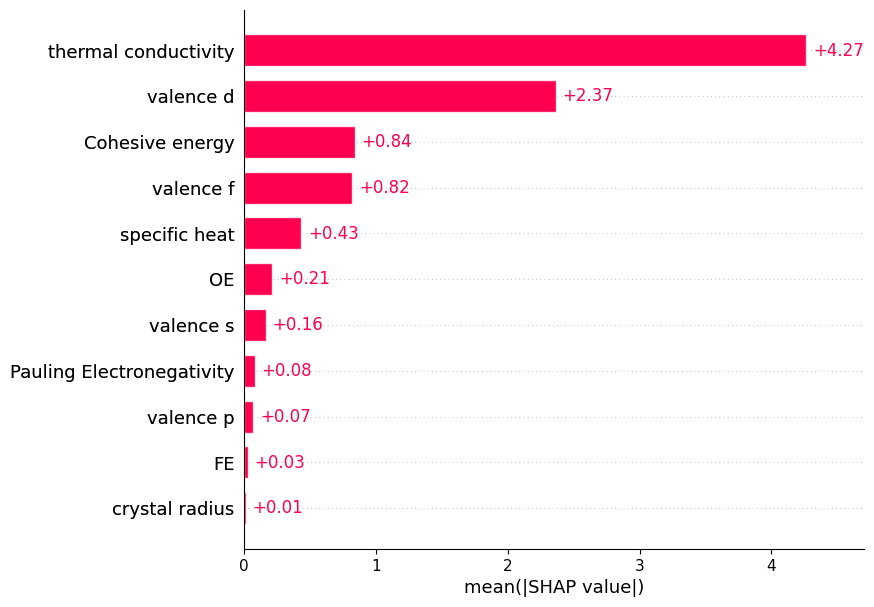

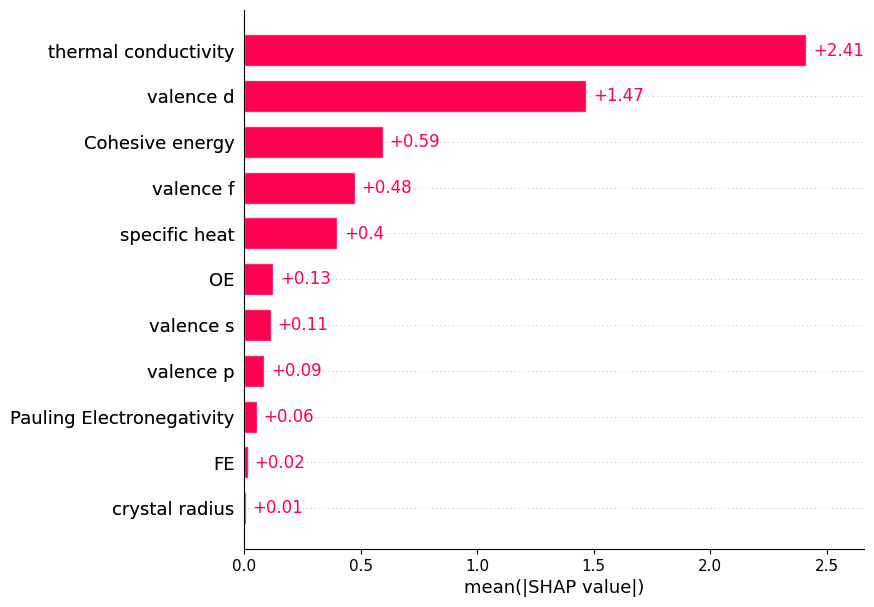

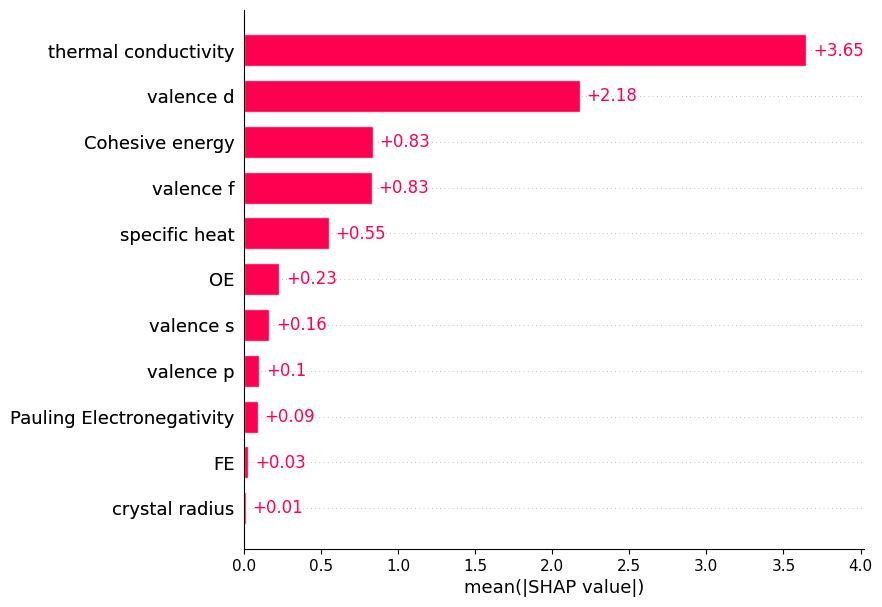

In [ ]:
model_SVR2.plot_SHAP("all")

### Gaussian process

In [ ]:
random_seeds = np.arange(0,10)
kernel = ConstantKernel(1.0, (1e-3, 1e3)) * RationalQuadratic(length_scale=1.0, alpha=0.1) + WhiteKernel(noise_level=1, noise_level_bounds=(1e-10, 1e+1))

model_GP2 = ModelEvaluatorBayes(X_metal_des, res, random_seeds, GaussianProcessRegressor, param_space_GP, kernel, results_dict=results_fit, IIS_dict=IIS_fit, model_dict=models_fit)
model_GP2.evaluate_model()

The optimal value found for dimension 0 of parameter k1__k2__length_scale is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
The optimal value found for dimension 0 of parameter k2__noise_level is close to the specified upper bound 10.0. Increasing the bound and calling fit again may find a better value.
The optimal value found for dimension 0 of parameter k2__noise_level is close to the specified upper bound 10.0. Increasing the bound and calling fit again may find a better value.
The optimal value found for dimension 0 of parameter k1__k2__length_scale is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
The optimal value found for dimension 0 of parameter k2__noise_level is close to the specified upper bound 10.0. Increasing the bound and calling fit again may find a better value.
The optimal value found for dimension 0 of parameter k2__noise_level is close to th

Random seed 0 finished



The optimal value found for dimension 0 of parameter k2__noise_level is close to the specified upper bound 10.0. Increasing the bound and calling fit again may find a better value.
The optimal value found for dimension 0 of parameter k2__noise_level is close to the specified upper bound 10.0. Increasing the bound and calling fit again may find a better value.
The optimal value found for dimension 0 of parameter k2__noise_level is close to the specified upper bound 10.0. Increasing the bound and calling fit again may find a better value.
The optimal value found for dimension 0 of parameter k2__noise_level is close to the specified upper bound 10.0. Increasing the bound and calling fit again may find a better value.
The optimal value found for dimension 0 of parameter k2__noise_level is close to the specified upper bound 10.0. Increasing the bound and calling fit again may find a better value.
The optimal value found for dimension 0 of parameter k2__noise_level is close to the specified 

Random seed 1 finished



The optimal value found for dimension 0 of parameter k1__k2__alpha is close to the specified upper bound 100000.0. Increasing the bound and calling fit again may find a better value.
The optimal value found for dimension 0 of parameter k1__k2__length_scale is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
The optimal value found for dimension 0 of parameter k2__noise_level is close to the specified upper bound 10.0. Increasing the bound and calling fit again may find a better value.
The optimal value found for dimension 0 of parameter k2__noise_level is close to the specified upper bound 10.0. Increasing the bound and calling fit again may find a better value.
The optimal value found for dimension 0 of parameter k2__noise_level is close to the specified upper bound 10.0. Increasing the bound and calling fit again may find a better value.
The optimal value found for dimension 0 of parameter k1__k2__length_scale is close to t

Random seed 2 finished



The optimal value found for dimension 0 of parameter k1__k2__alpha is close to the specified upper bound 100000.0. Increasing the bound and calling fit again may find a better value.
The optimal value found for dimension 0 of parameter k2__noise_level is close to the specified upper bound 10.0. Increasing the bound and calling fit again may find a better value.
The optimal value found for dimension 0 of parameter k2__noise_level is close to the specified upper bound 10.0. Increasing the bound and calling fit again may find a better value.
The optimal value found for dimension 0 of parameter k2__noise_level is close to the specified upper bound 10.0. Increasing the bound and calling fit again may find a better value.
The optimal value found for dimension 0 of parameter k2__noise_level is close to the specified upper bound 10.0. Increasing the bound and calling fit again may find a better value.
The optimal value found for dimension 0 of parameter k2__noise_level is close to the specifie

Random seed 3 finished



The optimal value found for dimension 0 of parameter k1__k2__alpha is close to the specified upper bound 100000.0. Increasing the bound and calling fit again may find a better value.
The optimal value found for dimension 0 of parameter k1__k2__length_scale is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
The optimal value found for dimension 0 of parameter k2__noise_level is close to the specified upper bound 10.0. Increasing the bound and calling fit again may find a better value.
The optimal value found for dimension 0 of parameter k1__k2__length_scale is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
The optimal value found for dimension 0 of parameter k2__noise_level is close to the specified upper bound 10.0. Increasing the bound and calling fit again may find a better value.
The optimal value found for dimension 0 of parameter k2__noise_level is close to 

Random seed 4 finished



The optimal value found for dimension 0 of parameter k1__k2__alpha is close to the specified upper bound 100000.0. Increasing the bound and calling fit again may find a better value.
The optimal value found for dimension 0 of parameter k1__k2__alpha is close to the specified upper bound 100000.0. Increasing the bound and calling fit again may find a better value.
The optimal value found for dimension 0 of parameter k1__k2__length_scale is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
The optimal value found for dimension 0 of parameter k1__k2__alpha is close to the specified upper bound 100000.0. Increasing the bound and calling fit again may find a better value.
The optimal value found for dimension 0 of parameter k2__noise_level is close to the specified lower bound 1e-10. Decreasing the bound and calling fit again may find a better value.
The optimal value found for dimension 0 of parameter k2__noise_level is close to t

Random seed 5 finished



The optimal value found for dimension 0 of parameter k1__k2__length_scale is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
The optimal value found for dimension 0 of parameter k1__k2__length_scale is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
The optimal value found for dimension 0 of parameter k1__k2__length_scale is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
Permutation explainer: 138it [01:03,  1.82it/s]


Random seed 6 finished



The optimal value found for dimension 0 of parameter k1__k2__alpha is close to the specified upper bound 100000.0. Increasing the bound and calling fit again may find a better value.
The optimal value found for dimension 0 of parameter k1__k2__length_scale is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
The optimal value found for dimension 0 of parameter k1__k2__alpha is close to the specified upper bound 100000.0. Increasing the bound and calling fit again may find a better value.
The optimal value found for dimension 0 of parameter k1__k2__length_scale is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
Permutation explainer: 138it [01:01,  1.88it/s]


Random seed 7 finished



The optimal value found for dimension 0 of parameter k1__k2__alpha is close to the specified upper bound 100000.0. Increasing the bound and calling fit again may find a better value.
The optimal value found for dimension 0 of parameter k2__noise_level is close to the specified upper bound 10.0. Increasing the bound and calling fit again may find a better value.
The optimal value found for dimension 0 of parameter k2__noise_level is close to the specified upper bound 10.0. Increasing the bound and calling fit again may find a better value.
The optimal value found for dimension 0 of parameter k2__noise_level is close to the specified upper bound 10.0. Increasing the bound and calling fit again may find a better value.
The optimal value found for dimension 0 of parameter k1__k2__length_scale is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
The optimal value found for dimension 0 of parameter k2__noise_level is close to the sp

Random seed 8 finished



The optimal value found for dimension 0 of parameter k1__k2__alpha is close to the specified upper bound 100000.0. Increasing the bound and calling fit again may find a better value.
The optimal value found for dimension 0 of parameter k2__noise_level is close to the specified upper bound 10.0. Increasing the bound and calling fit again may find a better value.
The optimal value found for dimension 0 of parameter k2__noise_level is close to the specified upper bound 10.0. Increasing the bound and calling fit again may find a better value.
The optimal value found for dimension 0 of parameter k2__noise_level is close to the specified upper bound 10.0. Increasing the bound and calling fit again may find a better value.
The optimal value found for dimension 0 of parameter k2__noise_level is close to the specified upper bound 10.0. Increasing the bound and calling fit again may find a better value.
The optimal value found for dimension 0 of parameter k2__noise_level is close to the specifie

Random seed 9 finished



In [ ]:
model_GP2.show_IIS()

,Feature,Mean Rank,Non-Zero Frequency (%),IIS
9,thermal conductivity,1.0,100.0,1.000000
6,valence d,2.0,100.0,0.835000
10,Cohesive energy,3.1,100.0,0.776452
3,OE,4.5,100.0,0.743333
8,specific heat,5.5,100.0,0.730000
1,Pauling Electronegativity,6.3,100.0,0.722381
4,valence s,7.0,100.0,0.717143
2,FE,8.1,100.0,0.710741
7,valence f,8.8,100.0,0.707500
0,crystal radius,9.0,100.0,0.706667


In [ ]:
model_GP2.show_shap_ranks()

{'crystal radius': [9, 10, 8, 10, 7, 11, 8, 10, 8, 9],
 'Pauling Electronegativity': [6, 7, 5, 7, 5, 7, 6, 7, 6, 7],
 'FE': [8, 9, 7, 9, 8, 10, 7, 8, 7, 8],
 'OE': [4, 4, 4, 4, 4, 9, 4, 4, 4, 4],
 'valence s': [7, 5, 9, 5, 9, 6, 9, 6, 9, 5],
 'valence p': [11, 11, 11, 11, 11, 8, 11, 11, 11, 11],
 'valence d': [2, 2, 2, 2, 2, 2, 2, 2, 2, 2],
 'valence f': [10, 8, 10, 8, 10, 3, 10, 9, 10, 10],
 'specific heat': [5, 6, 6, 6, 6, 5, 5, 5, 5, 6],
 'thermal conductivity': [1, 1, 1, 1, 1, 1, 1, 1, 1, 1],
 'Cohesive energy': [3, 3, 3, 3, 3, 4, 3, 3, 3, 3]}

In [ ]:
model_GP2.show_performance()

,random_seed,training R2,test R2,training RMSE,test RMSE,cv_score
0,0,0.158221,0.042285,22.515490,21.547852,-0.024246
1,1,0.182155,0.136015,20.759123,26.544195,-0.011474
2,2,0.145914,0.185357,22.283898,22.166552,-0.010351
3,3,0.192516,0.027951,21.898486,22.858273,0.061011
4,4,0.171438,0.109979,22.258687,21.549889,0.052213
5,5,0.074923,-0.000642,22.361528,27.650394,-0.095977
6,6,0.133899,0.008574,23.011956,21.325400,-0.110357
7,7,0.182112,-0.032446,21.997650,24.084793,0.029275
8,8,0.154092,0.250578,22.514306,19.983952,0.051409
9,9,0.157930,0.062309,22.588414,21.313667,-0.021265


In [ ]:
model_GP2.show_parameters()

{0: OrderedDict([('alpha', 478.4129023483593),
              ('kernel__k1__k1__constant_value', 0.1),
              ('kernel__k1__k2__alpha', 806.0923753825505),
              ('kernel__k1__k2__length_scale', 1e-06),
              ('kernel__k2__noise_level', 1000.0)]),
 1: OrderedDict([('alpha', 238.01429281254119),
              ('kernel__k1__k1__constant_value', 1000.0),
              ('kernel__k1__k2__alpha', 4.89284721265519),
              ('kernel__k1__k2__length_scale', 0.1),
              ('kernel__k2__noise_level', 1000.0)]),
 2: OrderedDict([('alpha', 378.1654989588927),
              ('kernel__k1__k1__constant_value', 0.1),
              ('kernel__k1__k2__alpha', 1000000.0),
              ('kernel__k1__k2__length_scale', 1e-06),
              ('kernel__k2__noise_level', 0.1)]),
 3: OrderedDict([('alpha', 445.436820834278),
              ('kernel__k1__k1__constant_value', 0.1),
              ('kernel__k1__k2__alpha', 1000000.0),
              ('kernel__k1__k2__length_scale', 

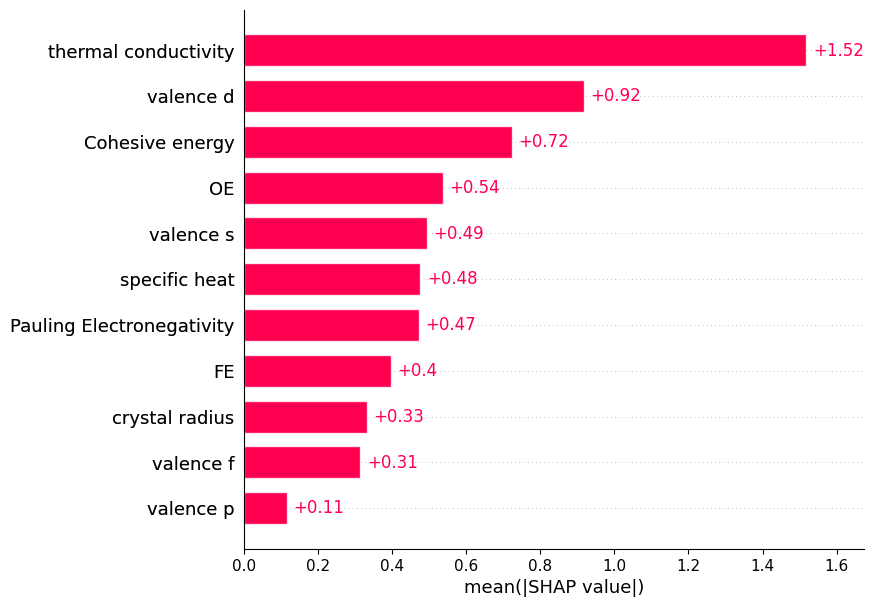

In [ ]:
model_GP2.plot_SHAP()

### KNN

In [ ]:
random_seeds = np.arange(0,10)

model_KNN2 = ModelEvaluatorBayes(X_metal_des, res, random_seeds, KNeighborsRegressor, param_space_KNN, results_dict=results_fit, IIS_dict=IIS_fit, model_dict=models_fit)
model_KNN2.evaluate_model()

The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
Permutation explainer: 138it [00:13,  2.26it/s]


Random seed 0 finished



The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
Permutation explainer: 138it [00:12,  2.64it/s]                         


Random seed 1 finished



The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
Permutation explainer: 138it [00:15,  3.12it/s]


Random seed 2 finished



The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
Permutation explainer: 138it [00:12,  2.30it/s]


Random seed 3 finished



The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
Permutation explainer: 138it [00:14,  3.06it/s]


Random seed 4 finished



The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
Permutation explainer: 138it [00:17,  3.23it/s]


Random seed 5 finished



The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The object

Random seed 6 finished



The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
Permutation explainer: 138it [00:13,  2.66it/s]


Random seed 7 finished



The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The object

Random seed 8 finished



The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The object

Random seed 9 finished



In [ ]:
model_KNN2.show_IIS()

,Feature,Mean Rank,Non-Zero Frequency (%),IIS
9,thermal conductivity,1.000000,100.0,1.000000
6,valence d,2.000000,100.0,0.835000
7,valence f,3.300000,100.0,0.770000
10,Cohesive energy,3.800000,100.0,0.756842
8,specific heat,5.300000,100.0,0.732264
2,FE,6.900000,100.0,0.717826
3,OE,7.500000,100.0,0.714000
1,Pauling Electronegativity,7.600000,100.0,0.713421
4,valence s,7.900000,100.0,0.711772
0,crystal radius,10.700000,100.0,0.700841


In [ ]:
model_KNN2.show_shap_ranks()

{'crystal radius': [10, 11, 11, 10, 11, 11, 10, 11, 11, 11],
 'Pauling Electronegativity': [7, 7, 10, 8, 7, 7, 6, 7, 10, 7],
 'FE': [5, 10, 6, 6, 6, 8, 4, 9, 6, 9],
 'OE': [9, 6, 8, 9, 8, 6, 8, 8, 7, 6],
 'valence s': [8, 8, 7, 7, 9, 9, 9, 6, 8, 8],
 'valence p': [11, 9, 9, 11, 10, 10, 10, 9, 10],
 'valence d': [2, 2, 2, 2, 2, 2, 2, 2, 2, 2],
 'valence f': [4, 3, 3, 3, 3, 3, 5, 3, 3, 3],
 'specific heat': [6, 5, 5, 5, 5, 5, 7, 5, 5, 5],
 'thermal conductivity': [1, 1, 1, 1, 1, 1, 1, 1, 1, 1],
 'Cohesive energy': [3, 4, 4, 4, 4, 4, 3, 4, 4, 4]}

In [ ]:
model_KNN2.show_performance()

,random_seed,training R2,test R2,training RMSE,test RMSE,cv_score
0,0,0.138872,0.078703,22.772791,21.134202,-0.081319
1,1,0.114862,0.073172,21.596286,27.492619,-0.049372
2,2,0.165725,0.199783,22.023943,21.969397,-0.026113
3,3,0.138097,0.019996,22.624361,22.951613,-0.029430
4,4,0.145524,0.069518,22.604082,22.034280,-0.013309
5,5,0.179051,0.045681,21.065438,27.002804,-0.114205
6,6,0.030390,-0.051580,24.348265,21.962830,-0.275287
7,7,0.174461,-0.011571,22.100297,23.840070,0.004030
8,8,0.147474,0.255547,22.602217,19.917587,0.004770
9,9,0.183367,0.083088,22.244621,21.076194,-0.089685


In [ ]:
model_KNN2.show_parameters()

{0: OrderedDict([('n_neighbors', 17), ('p', 2), ('weights', 'uniform')]),
 1: OrderedDict([('n_neighbors', 7), ('p', 2), ('weights', 'distance')]),
 2: OrderedDict([('n_neighbors', 21), ('p', 2), ('weights', 'distance')]),
 3: OrderedDict([('n_neighbors', 12), ('p', 2), ('weights', 'uniform')]),
 4: OrderedDict([('n_neighbors', 19), ('p', 2), ('weights', 'distance')]),
 5: OrderedDict([('n_neighbors', 15), ('p', 1), ('weights', 'distance')]),
 6: OrderedDict([('n_neighbors', 6), ('p', 2), ('weights', 'uniform')]),
 7: OrderedDict([('n_neighbors', 15), ('p', 2), ('weights', 'uniform')]),
 8: OrderedDict([('n_neighbors', 21), ('p', 2), ('weights', 'distance')]),
 9: OrderedDict([('n_neighbors', 18), ('p', 2), ('weights', 'distance')])}

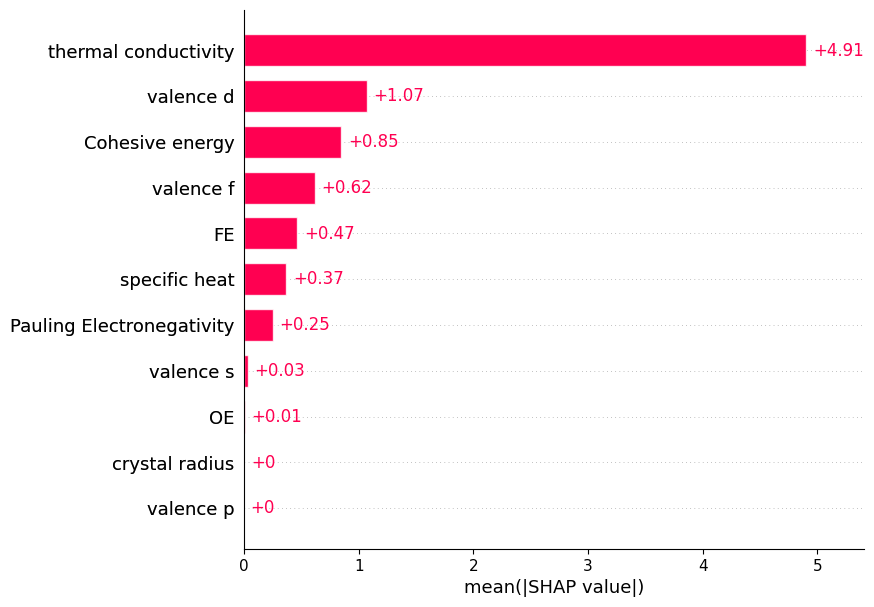

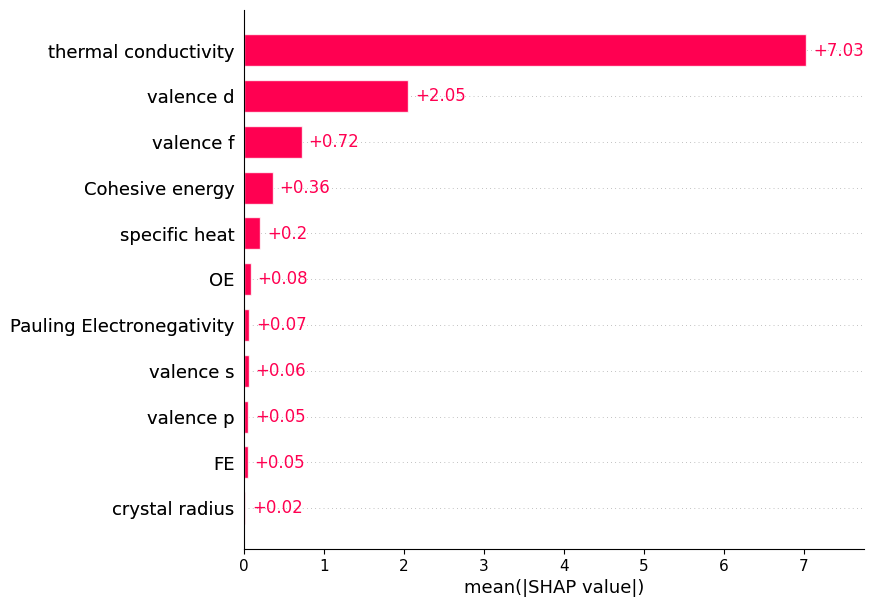

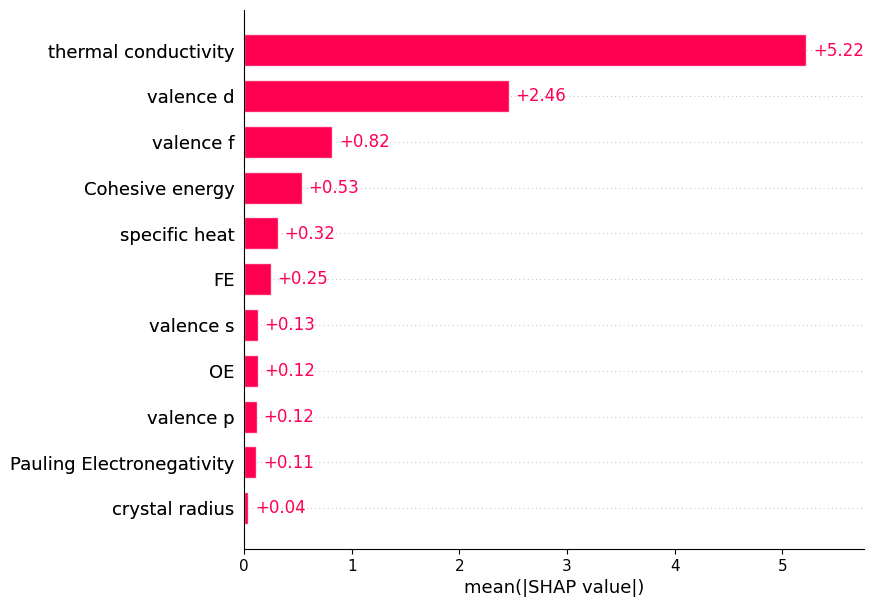

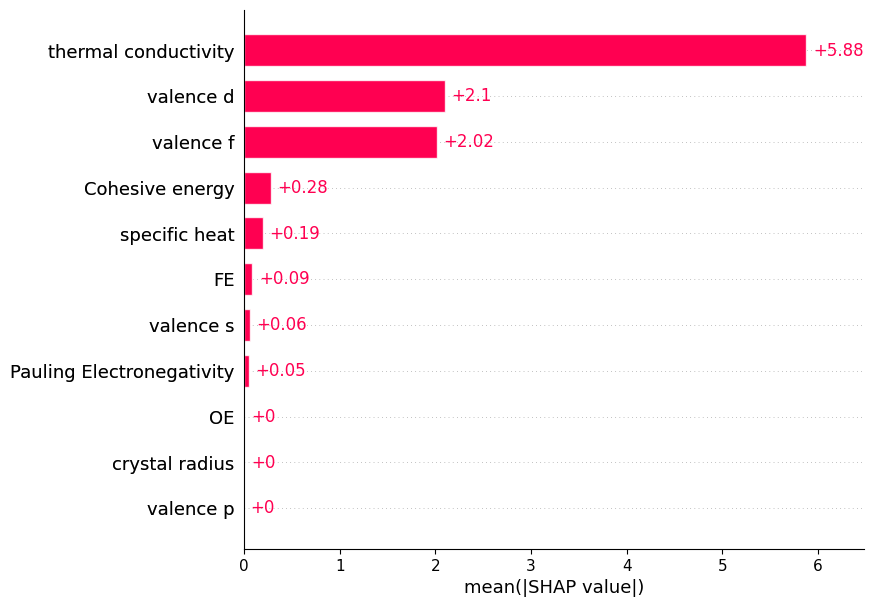

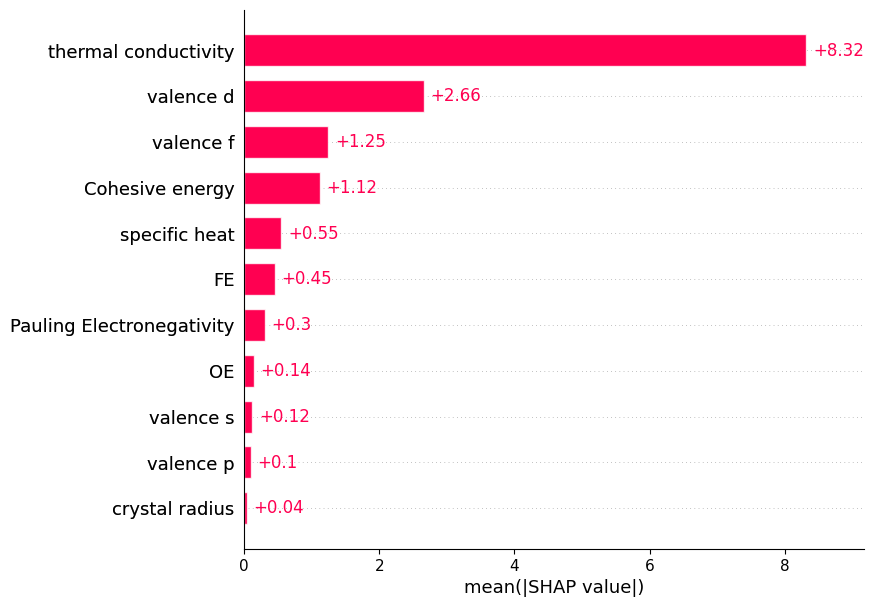

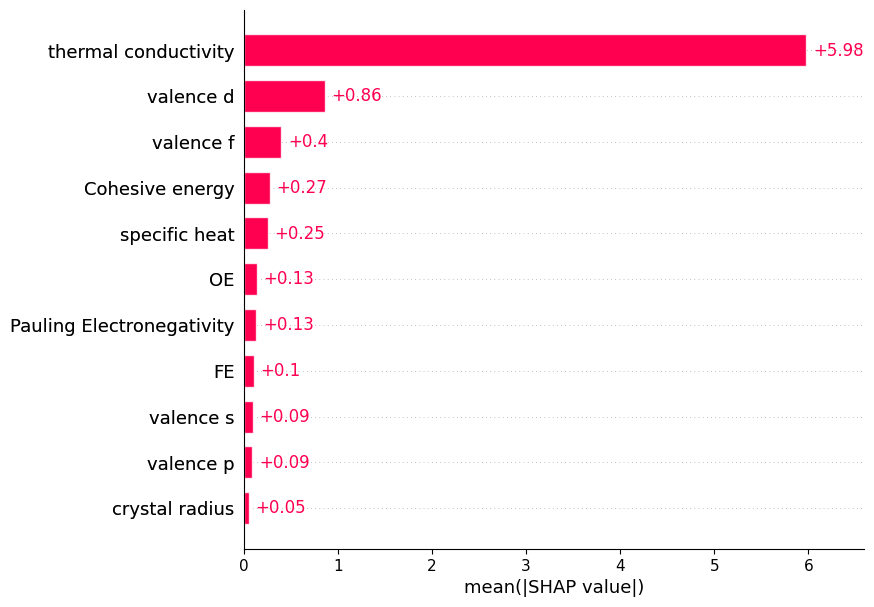

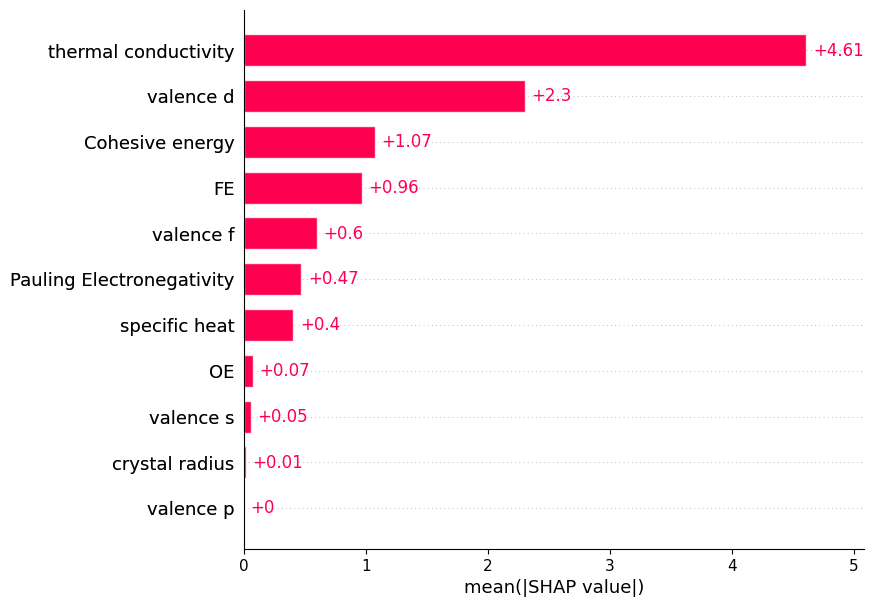

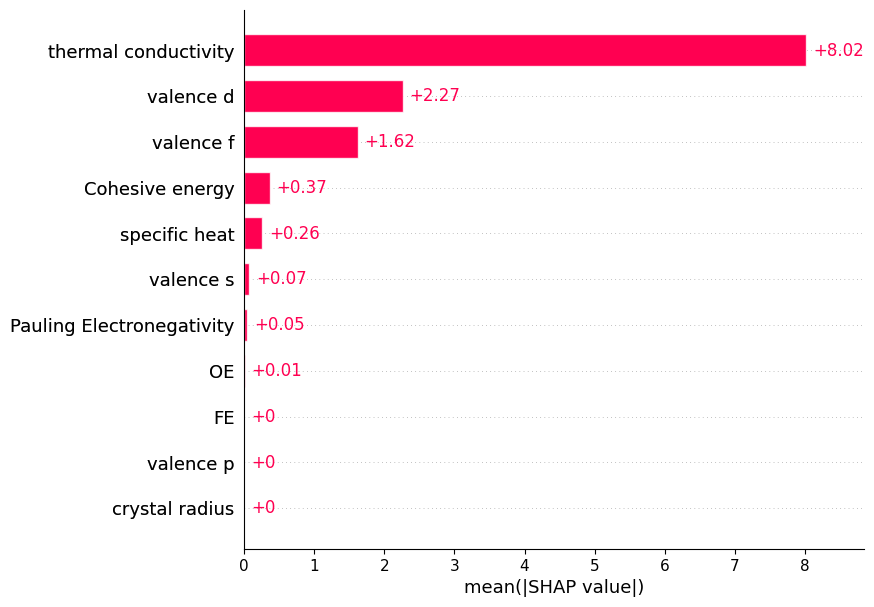

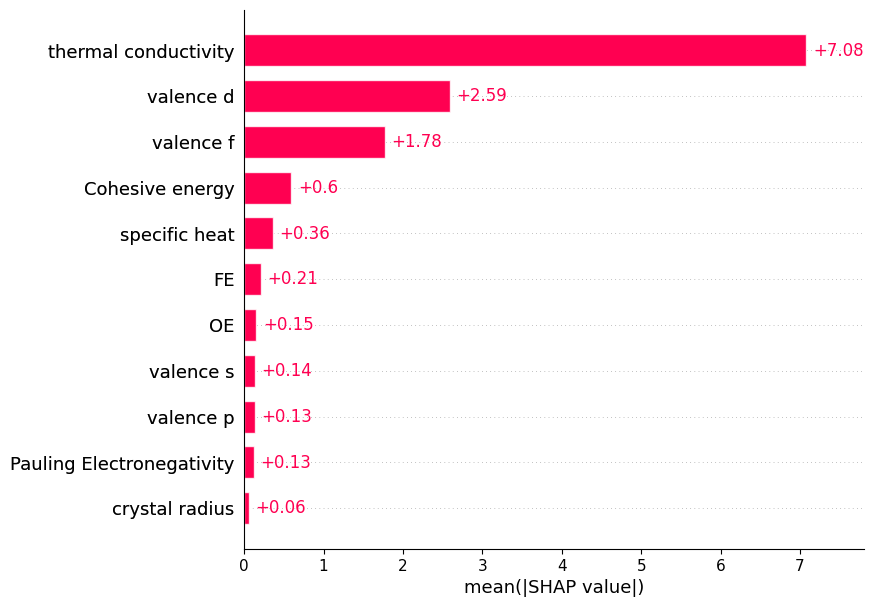

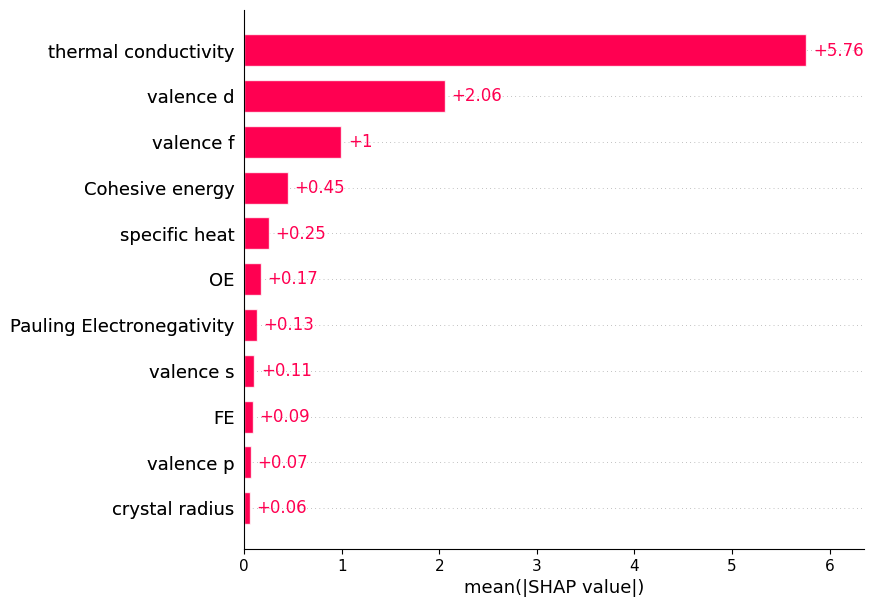

In [ ]:
model_KNN2.plot_SHAP('all')

## 4.IIS ranking

In [ ]:
IIS_data_fitPCA = IISDataAnalysis(results=results_fit,
                           IIS=IIS_fit,
                           models=models_fit,
                           results_csv_name='df_results_fit_PCA.csv',
                           models_joblib_name='models_fit_PCA.joblib',
                           iis_full_csv_name='df_IIS_full_fit_PCA.csv',
                           iis_csv_name='df_IIS_fit_PCA.csv')

In [ ]:
IIS_data_fitPCA.show_model_performance()

,train_r2,test_r2,train_rmse,test_rmse,cv_r2
DecisionTreeRegressor,0.163365,0.022968,22.117753,23.492811,-0.007743
RandomForestRegressor,0.160229,0.077659,22.159149,22.889024,0.013355
GradientBoostingRegressor,0.157089,0.084930,22.201623,22.823195,0.022669
XGBRegressor,0.140573,0.061563,22.418379,23.105611,0.031739
SVR,0.132999,0.057161,22.500260,23.171110,0.004828
KNeighborsRegressor,0.141782,0.076234,22.398230,22.938160,-0.066992
GaussianProcessRegressor,0.155320,0.078996,22.218954,22.902497,-0.007976


In [ ]:
IIS_data_fitPCA.show_IIS_values()

,crystal radius,Pauling Electronegativity,FE,OE,valence s,valence p,valence d,valence f,specific heat,thermal conductivity,Cohesive energy
DecisionTreeRegressor,0.604882,0.557846,0.590579,0.228286,0.122000,0.000000,0.448500,0.000000,0.421842,0.369538,0.661500
RandomForestRegressor,0.741739,0.718529,0.770000,0.732264,0.724098,0.700841,0.843684,0.635283,0.718529,0.709286,0.853333
GradientBoostingRegressor,0.767059,0.656036,0.764286,0.711250,0.659038,0.502000,0.719254,0.642079,0.683270,0.651689,0.853333
XGBRegressor,0.709071,0.256000,0.780000,0.133000,0.207333,0.133000,0.445000,0.114143,0.679154,0.318769,0.970000
SVR,0.700556,0.708824,0.703333,0.720000,0.716479,0.710741,0.835000,0.759189,0.740213,1.000000,0.761667
KNeighborsRegressor,0.700841,0.713421,0.717826,0.714000,0.711772,0.636371,0.835000,0.770000,0.732264,1.000000,0.756842
GaussianProcessRegressor,0.706667,0.722381,0.710741,0.743333,0.717143,0.700841,0.835000,0.707500,0.730000,1.000000,0.776452


In [ ]:
IIS_data_fitPCA.show_IIS_details()

crystal radius  \
DecisionTreeRegressor     Mean Rank                    2.428571   
                          Non-Zero Frequency(%)       70.000000   
                          IIS                          0.604882   
RandomForestRegressor     Mean Rank                    4.600000   
                          Non-Zero Frequency(%)      100.000000   
                          IIS                          0.741739   
GradientBoostingRegressor Mean Rank                    3.400000   
                          Non-Zero Frequency(%)      100.000000   
                          IIS                          0.767059   
XGBRegressor              Mean Rank                    3.111111   
                          Non-Zero Frequency(%)       90.000000   
                          IIS                          0.709071   
SVR                       Mean Rank                   10.800000   
                          Non-Zero Frequency(%)      100.000000   
                          IIS                          0.700556   
KNeighborsRegressor       Mean Rank                   10.700000   
                          Non-Zero Frequency(%)      100.000000   
                          IIS                          0.700841   
GaussianProcessRegressor  Mean Rank                    9.000000   
                          Non-Zero Frequency(%)      100.000000   
                          IIS                          0.706667   

                                                 Pauling Electronegativity  \
DecisionTreeRegressor     Mean Rank                               3.714286   
                          Non-Zero Frequency(%)                  70.000000   
                          IIS                                     0.557846   
RandomForestRegressor     Mean Rank                               6.800000   
                          Non-Zero Frequency(%)                 100.000000   
                          IIS                                     0.718529   
GradientBoostingRegressor Mean Rank                               6.222222   
                          Non-Zero Frequency(%)                  90.000000   
                          IIS                                     0.656036   
XGBRegressor              Mean Rank                               6.000000   
                          Non-Zero Frequency(%)                  30.000000   
                          IIS                                     0.256000   
SVR                       Mean Rank                               8.500000   
                          Non-Zero Frequency(%)                 100.000000   
                          IIS                                     0.708824   
KNeighborsRegressor       Mean Rank                               7.600000   
                          Non-Zero Frequency(%)                 100.000000   
                          IIS                                     0.713421   
GaussianProcessRegressor  Mean Rank                               6.300000   
                          Non-Zero Frequency(%)                 100.000000   
                          IIS                                     0.722381   

                                                         FE          OE  \
DecisionTreeRegressor     Mean Rank                2.714286    3.500000   
                          Non-Zero Frequency(%)   70.000000   20.000000   
                          IIS                      0.590579    0.228286   
RandomForestRegressor     Mean Rank                3.300000    5.300000   
                          Non-Zero Frequency(%)  100.000000  100.000000   
                          IIS                      0.770000    0.732264   
GradientBoostingRegressor Mean Rank                3.500000    8.000000   
                          Non-Zero Frequency(%)  100.000000  100.000000   
                          IIS                      0.764286    0.711250   
XGBRegressor              Mean Rank                3.000000    5.000000   
                          Non-Ze

In [ ]:
IIS_data_fitPCA.show_IIS_ranks()

,crystal radius,Pauling Electronegativity,FE,OE,valence s,valence p,valence d,valence f,specific heat,thermal conductivity,Cohesive energy
DecisionTreeRegressor,2,4,3,8,9,10,5,10,6,7,1
RandomForestRegressor,4,7,3,5,6,10,2,11,7,9,1
GradientBoostingRegressor,2,8,3,5,7,11,4,10,6,9,1
XGBRegressor,3,7,2,9,8,9,5,11,4,6,1
SVR,11,9,10,6,7,8,2,4,5,1,3
KNeighborsRegressor,10,8,6,7,9,11,2,3,5,1,4
GaussianProcessRegressor,10,6,8,4,7,11,2,9,5,1,3


In [ ]:
IIS_data_fitPCA.get_IIS_mean_rank()

,Feature,Mean Rank,Standard Deviation
0,Cohesive energy,2.000,1.291
1,valence d,3.143,1.464
2,thermal conductivity,4.857,3.761
3,FE,5.000,3.055
4,specific heat,5.429,0.976
5,crystal radius,6.000,4.123
6,OE,6.286,1.799
7,Pauling Electronegativity,7.000,1.633
8,valence s,7.571,1.134
9,valence f,8.286,3.352


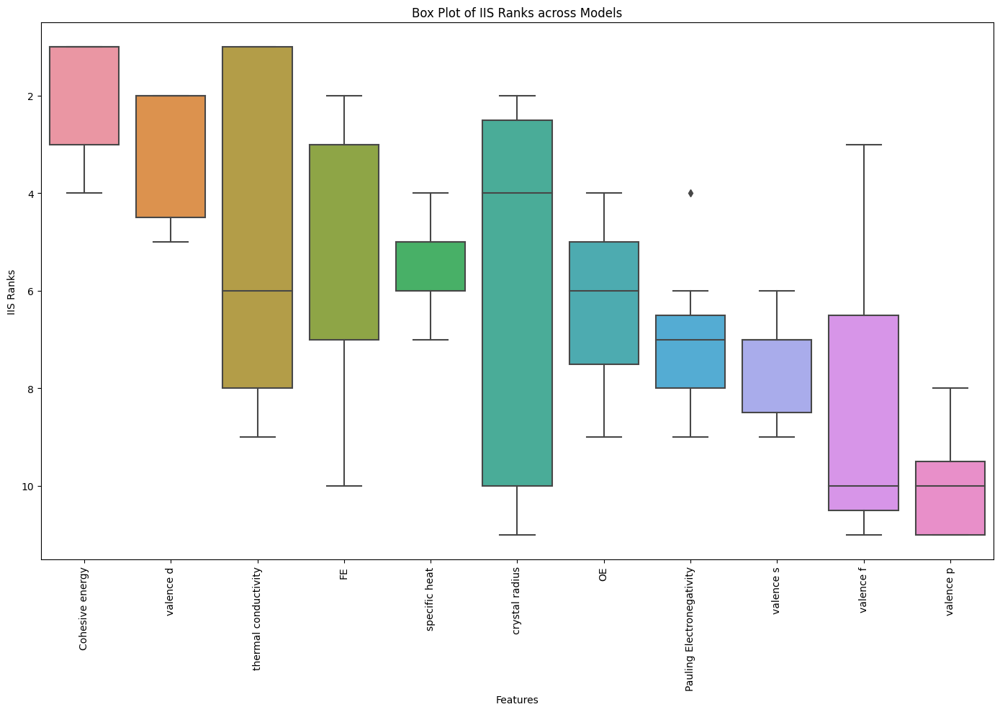

In [ ]:
IIS_data_fitPCA.plot_IIS_mean_rank()

## Option 2: Regularization techniques

Lasso and Ridge Regression

In [ ]:
# Extract reference rows
data_ref = data[0:17]

X_ref = data_ref[['Temp', 'GHSV', 'H2CO']]
y_ref = data_ref['F_STY']

X_train, X_test, y_train, y_test = train_test_split(X_ref, y_ref, test_size=0.2, random_state=42)

In [ ]:
X_train

,Temp,GHSV,H2CO
11,324,11000,1.8
14,302,15000,1.8
8,300,11000,1.8
13,315,15000,1.8
2,305,3300,2.0
9,317,11000,1.8
16,256,7500,1.8
4,280,3300,1.8
7,277,7500,1.8
10,314,11000,1.8


## 1.fit the target variable with reation conditions on reference rows

In [ ]:
# Standardize the features
scaler = StandardScaler().fit(X_train)
X_train_scaled = scaler.transform(X_train)
X_test_scaled = scaler.transform(X_test)

In [ ]:
X_train_scaled

array([[ 1.17926437,  0.39785685, -0.41666667],
       [ 0.30776667,  1.35566039, -0.41666667],
       [ 0.22853961,  0.39785685, -0.41666667],
       [ 0.82274259,  1.35566039, -0.41666667],
       [ 0.42660727, -1.44591496,  1.75      ],
       [ 0.90196965,  0.39785685, -0.41666667],
       [-1.5144558 , -0.44022124, -0.41666667],
       [-0.56373103, -1.44591496, -0.41666667],
       [-0.68257163, -0.44022124, -0.41666667],
       [ 0.78312905,  0.39785685, -0.41666667],
       [ 1.17926437,  1.35566039, -0.41666667],
       [-1.55406933, -1.44591496,  2.83333333],
       [-1.5144558 , -0.44022124, -0.41666667]])

### Lasso regression

In [ ]:
model_Lasso = Lasso()

param_grid={"alpha": [1e-3, 1e-2, 1e-1, 1, 10, 100]}

tuning = GridSearchCV(estimator=model_Lasso,
                      param_grid = param_grid,
                      cv=5)

tuning.fit(X_train_scaled, y_train)

print("Best parameters:")
print(tuning.best_params_)

Best parameters:
{'alpha': 1}


In [ ]:
model_Lasso3 = Lasso(alpha = tuning.best_params_['alpha'])
model_Lasso3.fit(X_train_scaled, y_train)

# R2
train_r2 = model_Lasso3.score(X_train_scaled, y_train)
test_r2 = model_Lasso3.score(X_test_scaled, y_test)
print("training R2:%.3f"% train_r2)
print("test R2:%.3f"% test_r2)

# RMSE
y_predicted_train = model_Lasso3.predict(X_train_scaled)
y_predicted_test = model_Lasso3.predict(X_test_scaled)

train_rmse = sqrt(mean_squared_error(y_train, y_predicted_train))
test_rmse = sqrt(mean_squared_error(y_test, y_predicted_test))

print("training RMSE %.3f"% train_rmse)
print("test RMSE: %.3f"% test_rmse)

# k-cross validation
accuracies = cross_val_score(estimator=model_Lasso3, X=X_train_scaled, y=y_train, cv=5)
cv_r2 = accuracies.mean()
print("mean CV R2: %.3f"% cv_r2)


training R2:0.890
test R2:0.066
training RMSE 4.238
test RMSE: 4.801
mean CV R2: -0.791


### Ridge regression

In [ ]:
model_Ridge = Ridge()

param_grid={"alpha": [1e-3, 1e-2, 1e-1, 1, 10, 100]}

tuning = GridSearchCV(estimator=model_Ridge,
                      param_grid = param_grid,
                      cv=5)

tuning.fit(X_train_scaled, y_train)

print("Best parameters:")
print(tuning.best_params_)

Best parameters:
{'alpha': 1}


In [ ]:
model_Ridge3 = Ridge(alpha = tuning.best_params_['alpha'])
model_Ridge3.fit(X_train_scaled, y_train)

# R2
train_r2 = model_Ridge3.score(X_train_scaled, y_train)
test_r2 = model_Ridge3.score(X_test_scaled, y_test)
print("training R2:%.3f"% train_r2)
print("test R2:%.3f"% test_r2)

# RMSE
y_predicted_train = model_Ridge3.predict(X_train_scaled)
y_predicted_test = model_Ridge3.predict(X_test_scaled)

train_rmse = sqrt(mean_squared_error(y_train, y_predicted_train))
test_rmse = sqrt(mean_squared_error(y_test, y_predicted_test))

print("training RMSE %.3f"% train_rmse)
print("test RMSE: %.3f"% test_rmse)

# k-cross validation
accuracies = cross_val_score(estimator=model_Ridge3, X=X_train_scaled, y=y_train, cv=5)
cv_r2 = accuracies.mean()
print("mean CV R2: %.3f"% cv_r2)


training R2:0.893
test R2:0.265
training RMSE 4.180
test RMSE: 4.260
mean CV R2: -2.286


## 2.fit with reaction condition on metal rows, using models trained on reference rows

**input features**

In [ ]:
data_metal = data[17:]
data_metal

X_metal = data_metal[['Temp', 'GHSV', 'H2CO']]
y_metal = data_metal['F_STY']

X_metal

,Temp,GHSV,H2CO
17,257,7500,1.8
18,276,7500,1.8
19,301,11000,1.8
20,315,11000,1.8
21,327,11000,1.8
...,...,...,...
184,299,11000,1.8
185,314,11000,1.8
186,325,11000,1.8
187,325,15000,1.8


In [ ]:
# Standardize the features
scaler = StandardScaler().fit(X_metal)
X_metal_scaled = scaler.transform(X_metal)

In [ ]:
y_pred_lasso = model_Lasso3.predict(X_metal_scaled)
y_pred_ridge = model_Ridge3.predict(X_metal_scaled)

y_pred_ensemble = (y_pred_lasso + y_pred_ridge) / 2

In [ ]:
# target variable
res = y_metal - y_pred_ensemble
np.mean(res)

7.153295720379801

## 3.fit the residuals with catalytic descriptors on metal rows

In [ ]:
X_metal_des = data_metal[["crystal radius",'Pauling Electronegativity','FE','OE',
          'valence s','valence p',"valence d",'valence f','specific heat',
          "thermal conductivity","Cohesive energy"]]

# Split the data into training and test sets
X_train, X_test, y_train, y_test = train_test_split(X_metal_des, res, test_size=0.2, random_state=0)

# define search space with X_train
param_space_DT, param_space_RF, param_space_GB, param_space_XGB, param_space_SVR, param_space_GP, param_space_KNN = define_search_space(X_train)

In [ ]:
X_train

,crystal radius,Pauling Electronegativity,FE,OE,valence s,valence p,valence d,valence f,specific heat,thermal conductivity,Cohesive energy
61,0.69,1.83,-0.0413,-1.907,2,0,6,0,0.440,80.2,4.28
97,0.53,2.01,-0.5450,-2.089,2,2,0,0,0.320,59.9,3.85
124,1.36,1.10,-0.7370,-3.212,2,0,1,0,0.190,13.5,4.47
115,0.77,2.20,-0.0130,-0.994,2,0,7,14,0.130,147.0,6.94
186,0.69,1.96,-0.4630,-1.646,2,2,10,0,0.227,66.6,3.14
...,...,...,...,...,...,...,...,...,...,...,...
26,0.54,1.88,0.0824,-1.410,2,0,7,0,0.420,100.0,4.39
120,0.77,2.20,-0.0130,-0.994,2,0,7,14,0.130,147.0,6.94
84,0.69,1.83,-0.0413,-1.907,2,0,6,0,0.440,80.2,4.28
134,0.90,0.98,-0.1890,-2.067,1,0,0,0,3.600,84.7,1.63


In [ ]:
# initialize an empty dictionary to store the evaluation results
results_fit1 = {} # for models trained with metal rows

# Initialize an empty dictionary to store the mean SHAP values
IIS_fit1 = {}

# initialize an empty dictionary to store models
models_fit1 = {}

### Decision Tree

In [ ]:
random_seeds = np.arange(0,10)
model_DT3 = ModelEvaluatorBayes(X_metal_des, res, random_seeds, DecisionTreeRegressor, param_space_DT, results_dict=results_fit1, IIS_dict=IIS_fit1, model_dict=models_fit1)
model_DT3.evaluate_model()

Random seed 0 finished

Random seed 1 finished

Random seed 2 finished



The objective has been evaluated at this point before.
The objective has been evaluated at this point before.


Random seed 3 finished

Random seed 4 finished

Random seed 5 finished



The objective has been evaluated at this point before.


Random seed 6 finished

Random seed 7 finished



The objective has been evaluated at this point before.


Random seed 8 finished



The objective has been evaluated at this point before.
The objective has been evaluated at this point before.


Random seed 9 finished



In [ ]:
model_DT3.show_IIS()

,Feature,Mean Rank,Non-Zero Frequency (%),IIS
0,crystal radius,3.000000,90.0,0.713000
10,Cohesive energy,1.875000,80.0,0.712000
2,FE,3.285714,70.0,0.569435
8,specific heat,2.666667,60.0,0.525750
4,valence s,2.833333,60.0,0.518471
6,valence d,4.666667,60.0,0.472714
9,thermal conductivity,5.000000,50.0,0.401000
1,Pauling Electronegativity,4.500000,40.0,0.341333
3,OE,4.750000,40.0,0.337474
7,valence f,5.333333,30.0,0.262875


In [ ]:
model_DT3.show_shap_ranks()

{'crystal radius': [3, 1, 3, 2, 1, 4, 2, 6, 5],
 'Pauling Electronegativity': [4, 5, 6, 3],
 'FE': [3, 3, 3, 1, 6, 4, 3],
 'OE': [6, 3, 3, 7],
 'valence s': [1, 4, 4, 5, 1, 2],
 'valence p': [6],
 'valence d': [5, 5, 5, 5, 7, 1],
 'valence f': [6, 4, 6],
 'specific heat': [2, 4, 2, 4, 2, 2],
 'thermal conductivity': [7, 6, 5, 3, 4],
 'Cohesive energy': [2, 1, 1, 2, 2, 1, 1, 5]}

In [ ]:
model_DT3.show_performance()

,random_seed,training R2,test R2,training RMSE,test RMSE,cv_score
0,0,0.392917,0.144103,12.865220,19.831893,0.211101
1,1,0.293830,0.399580,15.121754,12.507799,0.178975
2,2,0.346568,0.213038,13.963384,16.737929,0.219917
3,3,0.308802,0.252047,14.489722,15.755583,0.240585
4,4,0.337432,0.136329,14.568121,14.847885,0.218416
5,5,0.250464,0.354711,15.201168,14.349297,0.118723
6,6,0.265078,0.545019,15.509449,10.148172,0.158280
7,7,0.531397,-0.163977,10.737340,24.665614,0.457063
8,8,0.261282,0.692586,15.761979,7.949439,0.229815
9,9,0.199045,0.348762,15.985360,13.175523,0.146384


In [ ]:
model_DT3.show_parameters()

{0: OrderedDict([('max_depth', 5),
              ('max_features', 3),
              ('min_samples_leaf', 1),
              ('min_samples_split', 0.04601866867218175)]),
 1: OrderedDict([('max_depth', 6),
              ('max_features', 11),
              ('min_samples_leaf', 5),
              ('min_samples_split', 0.01)]),
 2: OrderedDict([('max_depth', 7),
              ('max_features', 9),
              ('min_samples_leaf', 4),
              ('min_samples_split', 0.01)]),
 3: OrderedDict([('max_depth', 4),
              ('max_features', 11),
              ('min_samples_leaf', 3),
              ('min_samples_split', 0.1)]),
 4: OrderedDict([('max_depth', 9),
              ('max_features', 11),
              ('min_samples_leaf', 7),
              ('min_samples_split', 0.02496422042020347)]),
 5: OrderedDict([('max_depth', 5),
              ('max_features', 2),
              ('min_samples_leaf', 1),
              ('min_samples_split', 0.01095553157748624)]),
 6: OrderedDict([('max_depth'

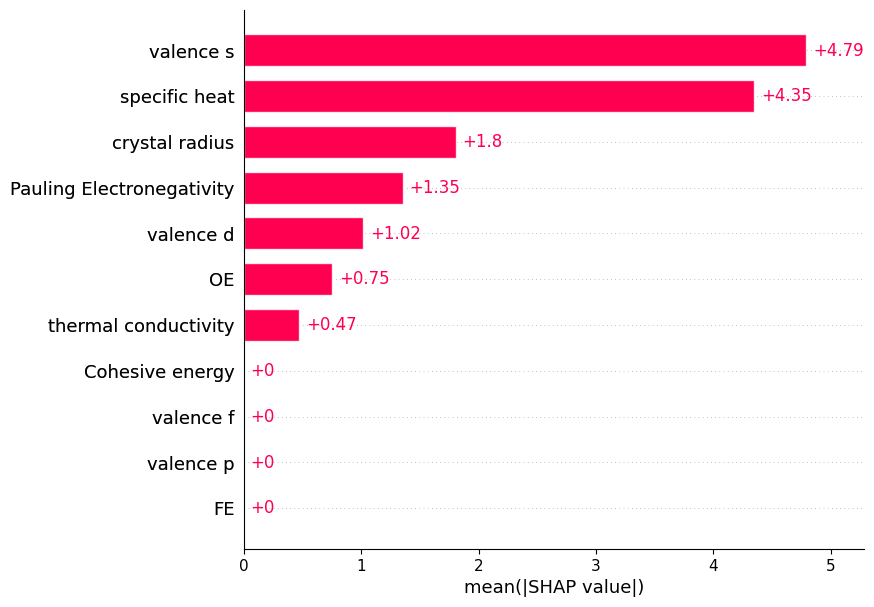

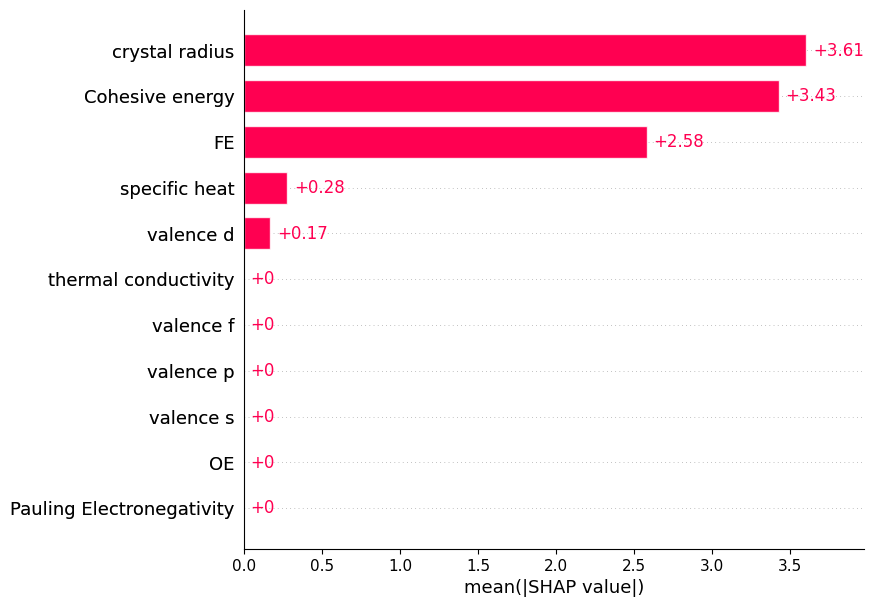

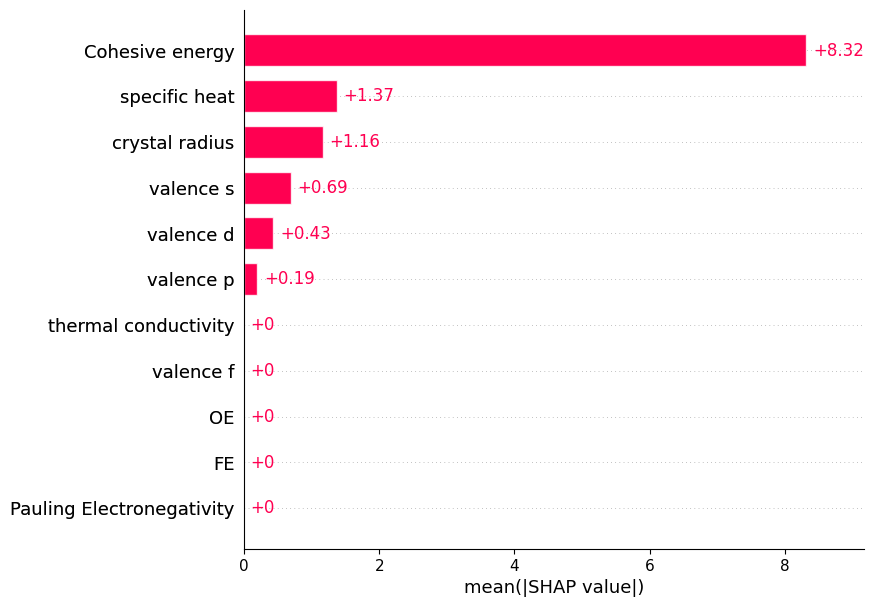

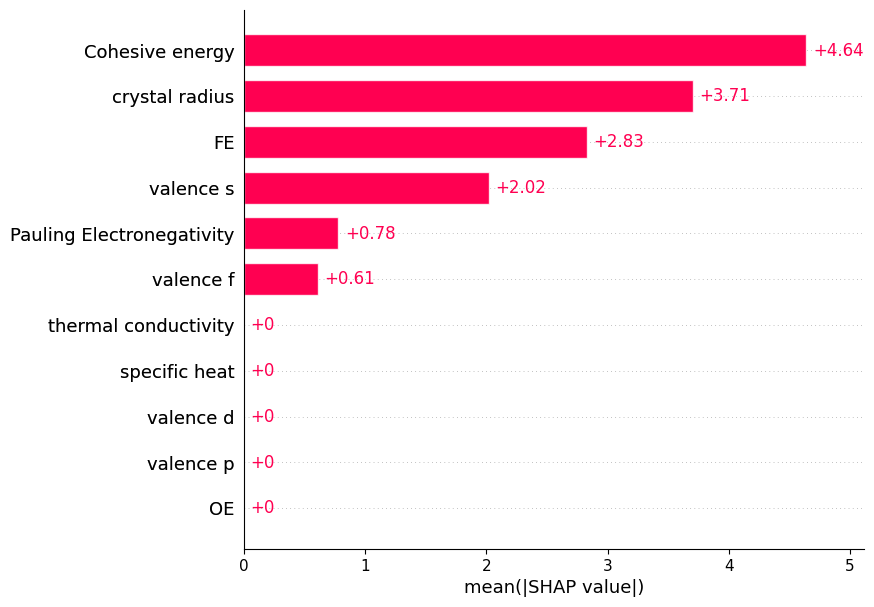

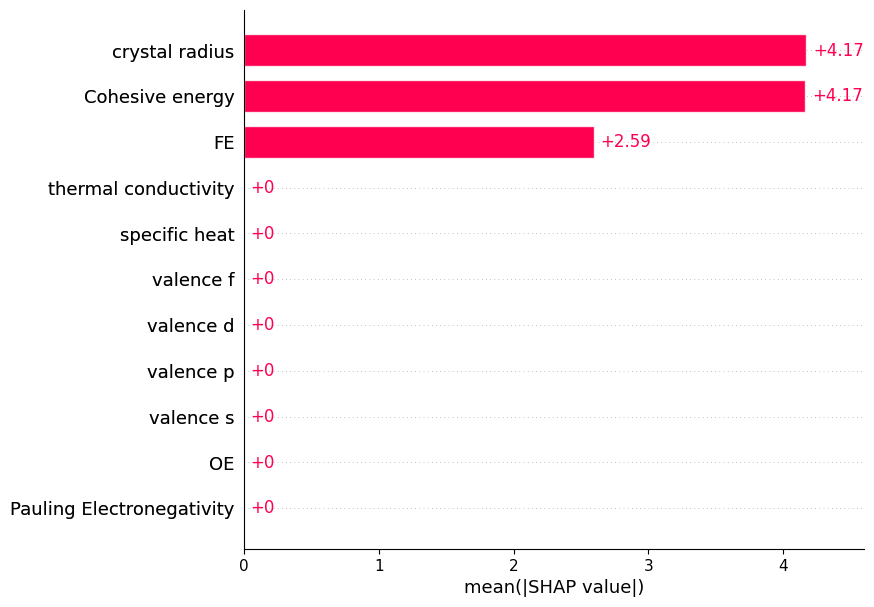

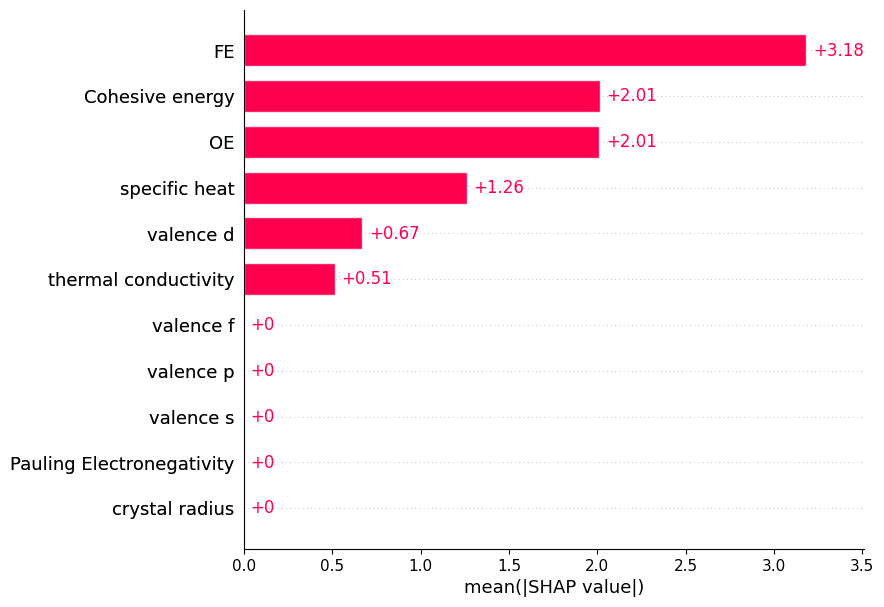

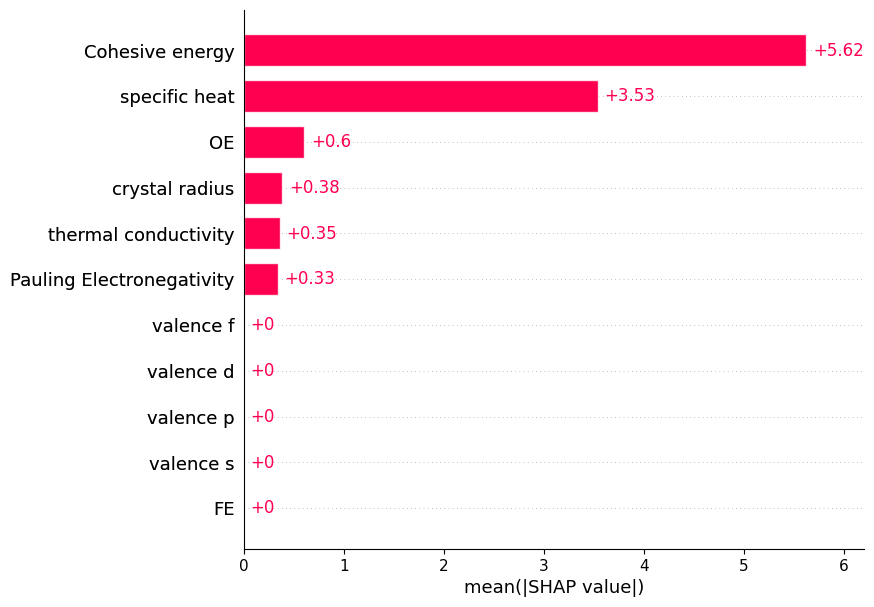

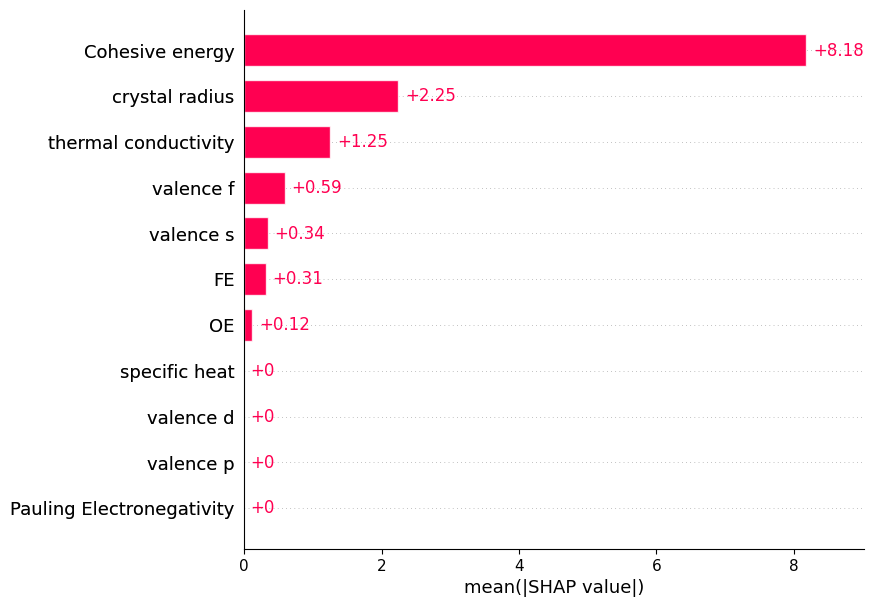

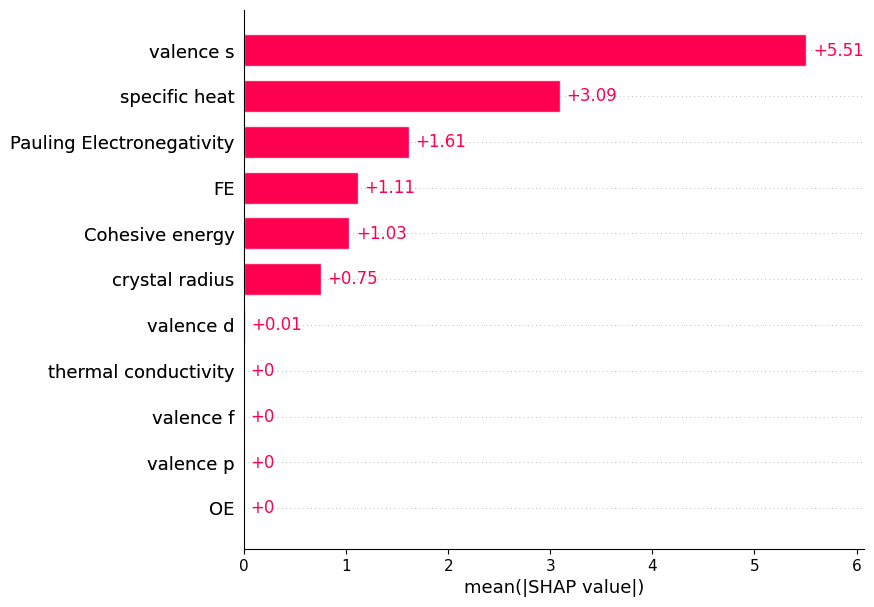

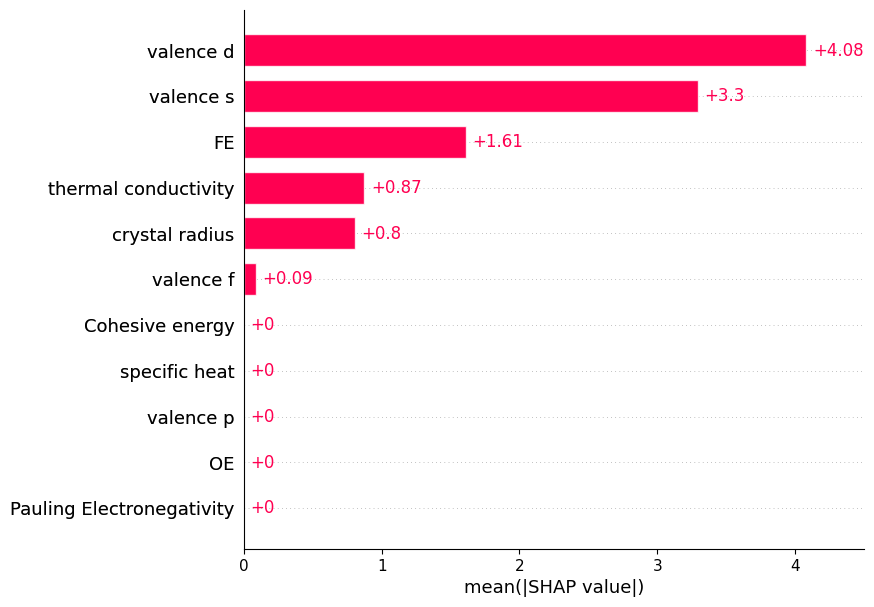

In [ ]:
model_DT3.plot_SHAP("all")

### Random forest

In [ ]:
random_seeds = np.arange(0,10)
model_RF3 = ModelEvaluatorBayes(X_metal_des, res, random_seeds, RandomForestRegressor, param_space_RF, results_dict=results_fit1, IIS_dict=IIS_fit1, model_dict=models_fit1)
model_RF3.evaluate_model()

The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.


Random seed 0 finished



The objective has been evaluated at this point before.


Random seed 1 finished



The objective has been evaluated at this point before.
The objective has been evaluated at this point before.


Random seed 2 finished



The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.


Random seed 3 finished

Random seed 4 finished

Random seed 5 finished

Random seed 6 finished



The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.


Random seed 7 finished

Random seed 8 finished

Random seed 9 finished



In [ ]:
model_RF3.show_IIS()

,Feature,Mean Rank,Non-Zero Frequency (%),IIS
10,Cohesive energy,1.5,100.0,0.890000
2,FE,2.6,100.0,0.796923
6,valence d,2.9,100.0,0.783793
0,crystal radius,4.3,100.0,0.746744
8,specific heat,4.9,100.0,0.737347
4,valence s,7.1,100.0,0.716479
9,thermal conductivity,7.2,100.0,0.715833
3,OE,7.3,100.0,0.715205
1,Pauling Electronegativity,7.4,100.0,0.714595
7,valence f,10.1,100.0,0.702673


In [ ]:
model_RF3.show_shap_ranks()

{'crystal radius': [4, 7, 5, 3, 4, 4, 3, 3, 5, 5],
 'Pauling Electronegativity': [9, 5, 8, 8, 7, 6, 9, 8, 7, 7],
 'FE': [3, 1, 3, 2, 3, 1, 4, 4, 2, 3],
 'OE': [6, 8, 9, 10, 5, 8, 7, 7, 4, 9],
 'valence s': [5, 4, 6, 7, 9, 9, 6, 10, 9, 6],
 'valence p': [10, 10, 11, 11, 11, 11, 11, 11, 10, 11],
 'valence d': [2, 2, 2, 4, 1, 3, 5, 5, 3, 2],
 'valence f': [11, 11, 10, 9, 10, 10, 10, 9, 11, 10],
 'specific heat': [8, 6, 4, 5, 8, 5, 2, 1, 6, 4],
 'thermal conductivity': [7, 9, 7, 6, 6, 7, 8, 6, 8, 8],
 'Cohesive energy': [1, 3, 1, 1, 2, 2, 1, 2, 1, 1]}

In [ ]:
model_RF3.show_performance()

,random_seed,training R2,test R2,training RMSE,test RMSE,cv_score
0,0,0.383698,0.125373,12.962543,20.047705,0.243695
1,1,0.288112,0.384637,15.182861,12.662484,0.187360
2,2,0.342880,0.212097,14.002736,16.747925,0.219347
3,3,0.309757,0.256365,14.479710,15.710041,0.254297
4,4,0.327645,0.151673,14.675321,14.715404,0.242388
5,5,0.268307,0.437961,15.019143,13.391735,0.133695
6,6,0.263315,0.527243,15.528036,10.344515,0.149071
7,7,0.529598,-0.169658,10.757932,24.725730,0.461819
8,8,0.261116,0.687812,15.763755,8.010925,0.227074
9,9,0.241286,0.526514,15.558128,11.234441,0.180573


In [ ]:
model_RF3.show_parameters()

{0: OrderedDict([('max_depth', 4),
              ('max_features', 1),
              ('min_samples_leaf', 1),
              ('min_samples_split', 0.01)]),
 1: OrderedDict([('max_depth', 4),
              ('max_features', 1),
              ('min_samples_leaf', 1),
              ('min_samples_split', 0.01)]),
 2: OrderedDict([('max_depth', 6),
              ('max_features', 11),
              ('min_samples_leaf', 1),
              ('min_samples_split', 0.1)]),
 3: OrderedDict([('max_depth', 4),
              ('max_features', 11),
              ('min_samples_leaf', 1),
              ('min_samples_split', 0.01)]),
 4: OrderedDict([('max_depth', 3),
              ('max_features', 3),
              ('min_samples_leaf', 1),
              ('min_samples_split', 0.1)]),
 5: OrderedDict([('max_depth', 4),
              ('max_features', 7),
              ('min_samples_leaf', 1),
              ('min_samples_split', 0.01)]),
 6: OrderedDict([('max_depth', 5),
              ('max_features', 11),
     

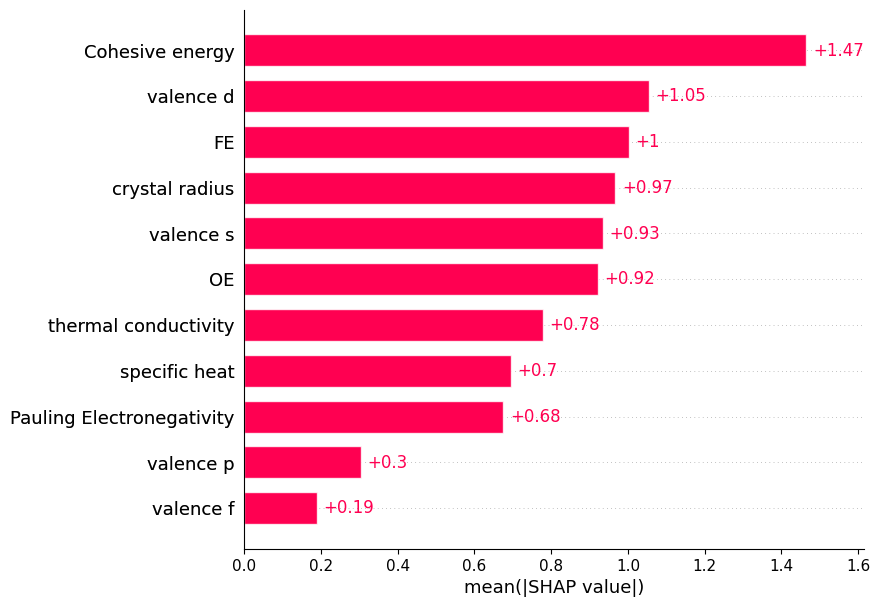

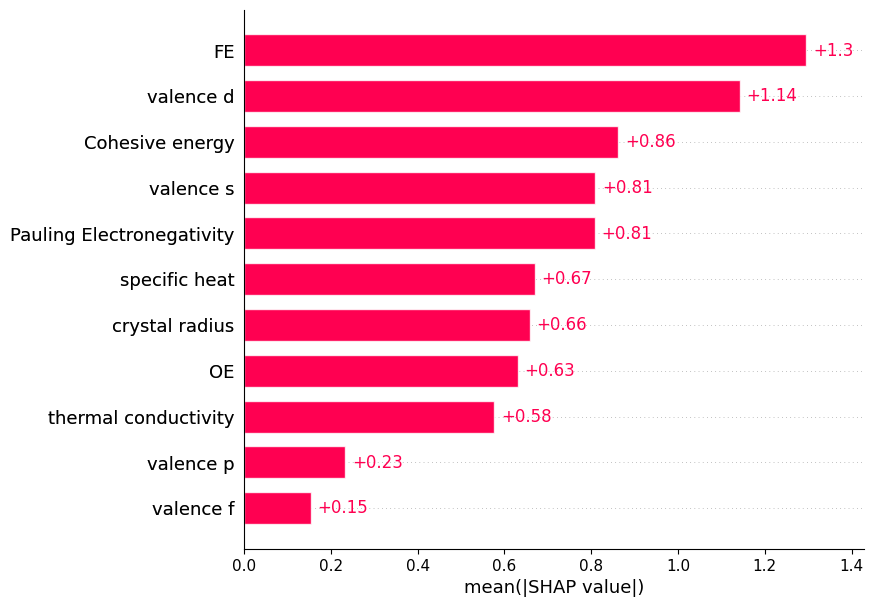

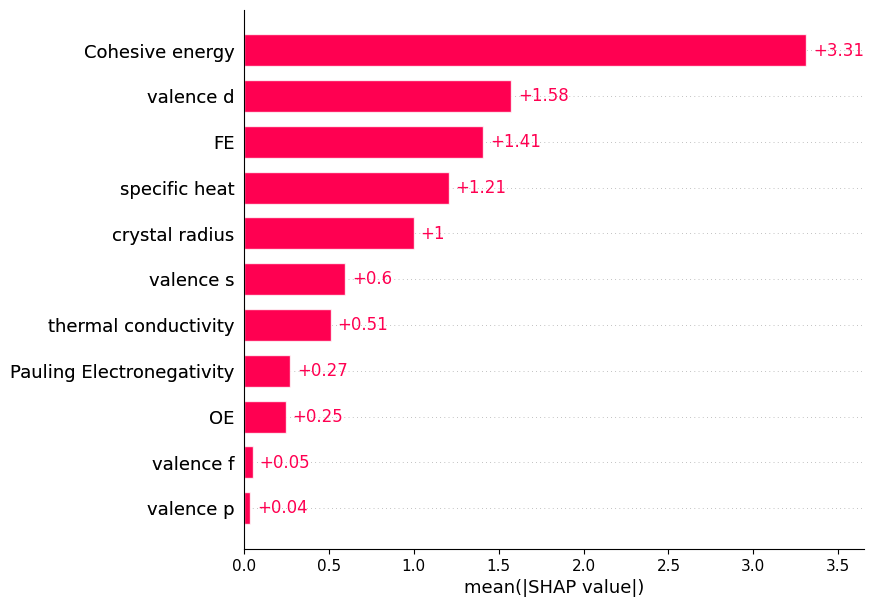

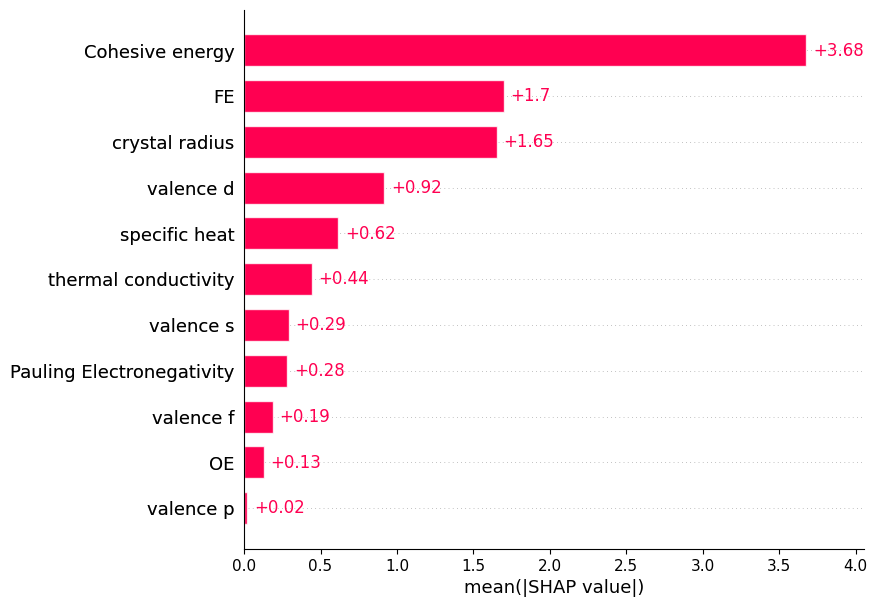

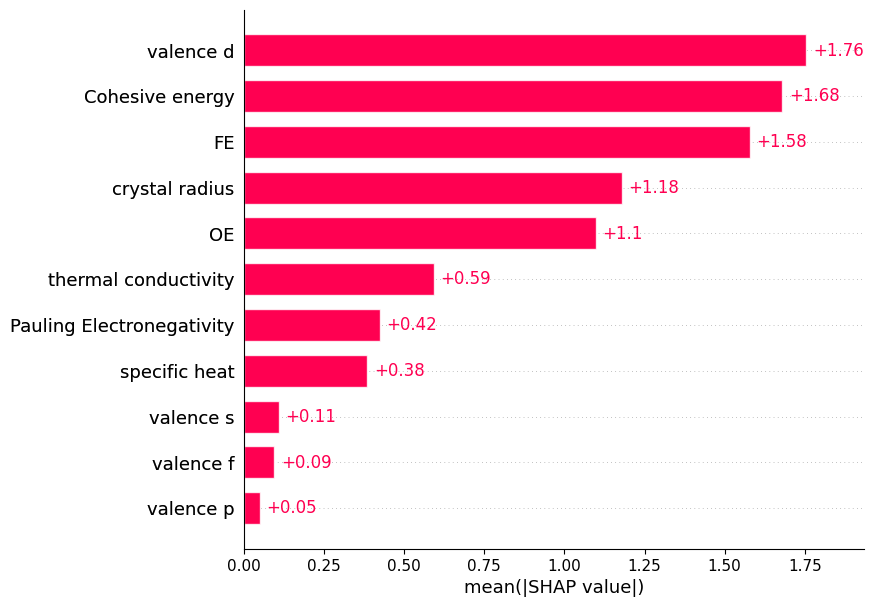

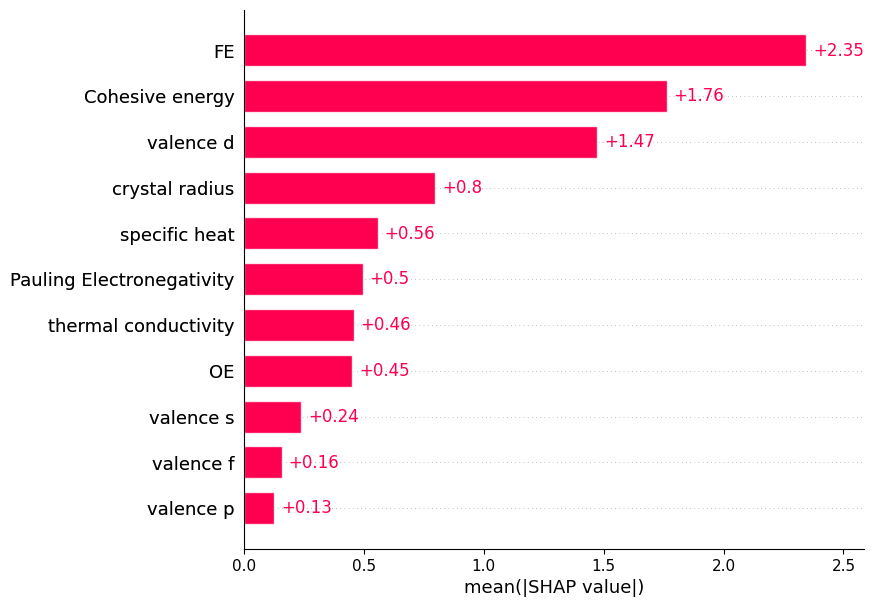

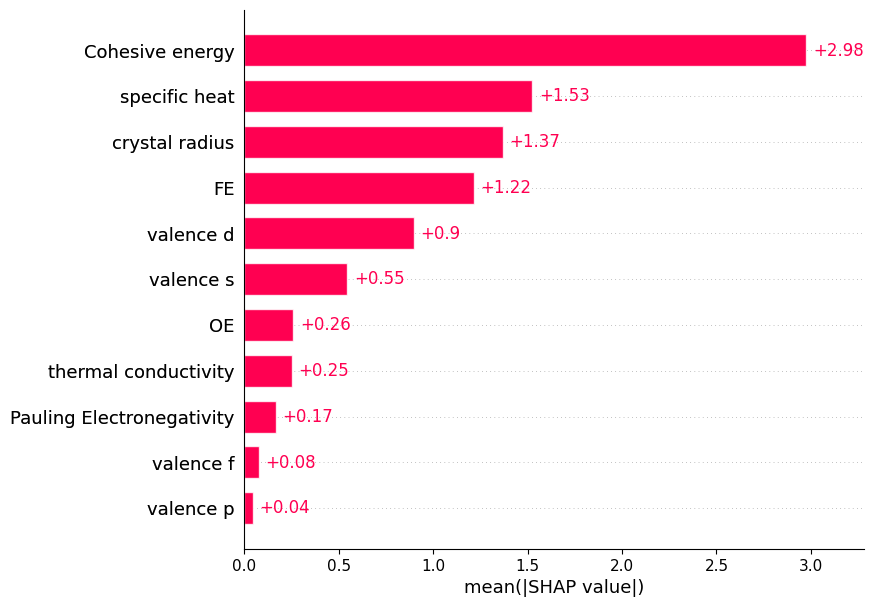

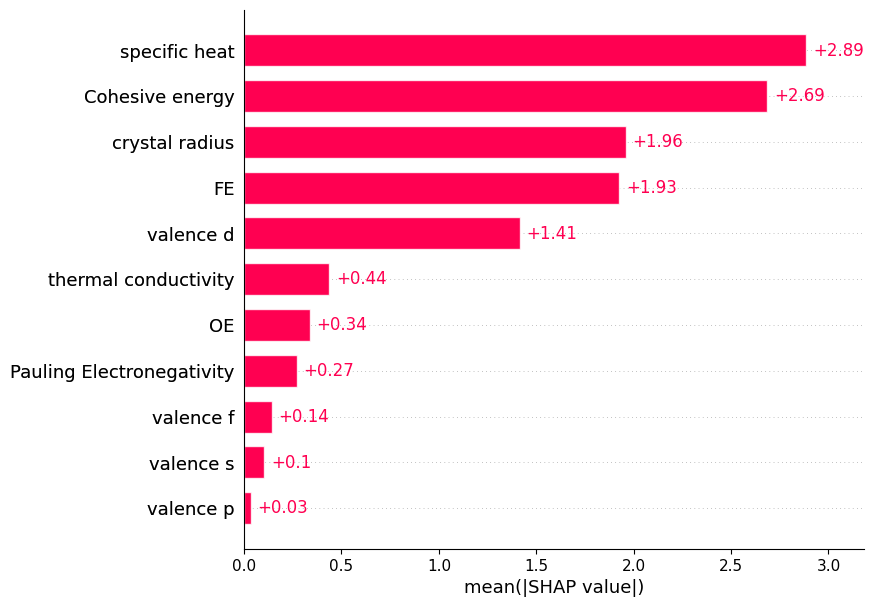

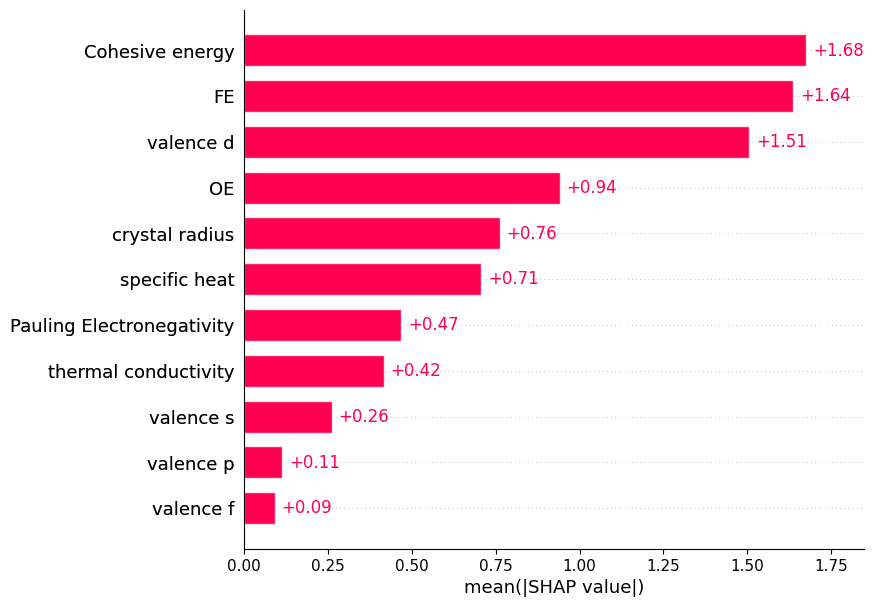

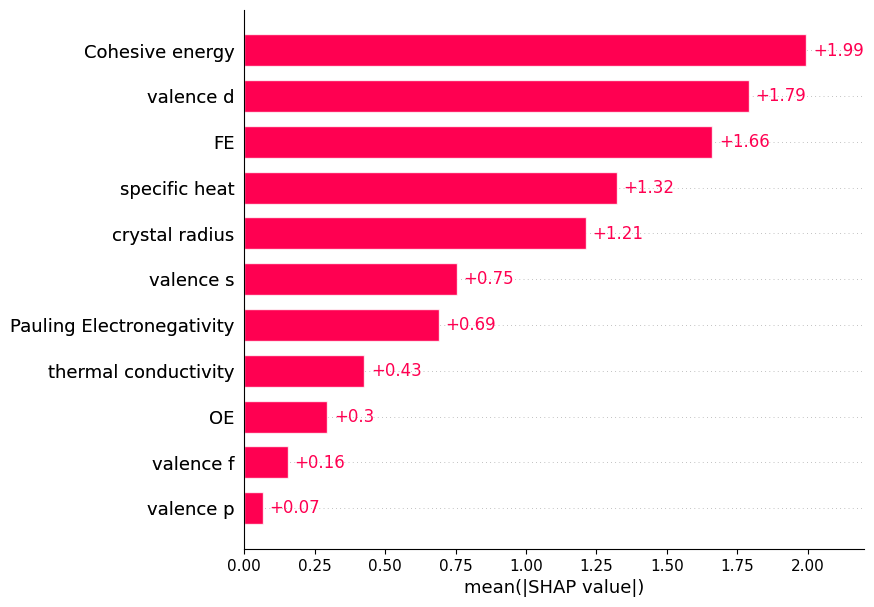

In [ ]:
model_RF3.plot_SHAP('all')

### Gradient boost

In [ ]:
random_seeds = np.arange(0,10)
model_GB3 = ModelEvaluatorBayes(X_metal_des, res, random_seeds, GradientBoostingRegressor, param_space_GB, results_dict=results_fit1, IIS_dict=IIS_fit1, model_dict=models_fit1)
model_GB3.evaluate_model()

Random seed 0 finished

Random seed 1 finished

Random seed 2 finished

Random seed 3 finished

Random seed 4 finished

Random seed 5 finished

Random seed 6 finished

Random seed 7 finished

Random seed 8 finished

Random seed 9 finished



In [ ]:
model_GB3.show_IIS()

,Feature,Mean Rank,Non-Zero Frequency (%),IIS
10,Cohesive energy,1.700,100.0,0.864118
2,FE,2.800,100.0,0.787857
0,crystal radius,4.400,100.0,0.745000
6,valence d,4.600,100.0,0.741739
8,specific heat,5.000,100.0,0.736000
9,thermal conductivity,6.100,100.0,0.724098
3,OE,7.700,100.0,0.712857
1,Pauling Electronegativity,6.000,80.0,0.591000
7,valence f,7.875,80.0,0.577905
4,valence s,8.625,80.0,0.574261


In [ ]:
model_GB3.show_shap_ranks()

{'crystal radius': [4, 2, 4, 2, 4, 5, 5, 10, 4, 4],
 'Pauling Electronegativity': [7, 6, 6, 5, 7, 7, 5, 5],
 'FE': [1, 3, 3, 4, 2, 4, 4, 4, 2, 1],
 'OE': [7, 8, 8, 7, 8, 6, 9, 8, 9, 7],
 'valence s': [4, 9, 10, 10, 10, 10, 6, 10],
 'valence p': [10, 11, 11, 9, 9, 11, 9, 11],
 'valence d': [2, 11, 1, 9, 1, 3, 3, 11, 3, 2],
 'valence f': [5, 10, 3, 11, 11, 8, 7, 8],
 'specific heat': [5, 6, 5, 8, 7, 2, 2, 3, 7, 5],
 'thermal conductivity': [6, 9, 7, 5, 6, 8, 6, 2, 6, 6],
 'Cohesive energy': [3, 1, 2, 1, 3, 1, 1, 1, 1, 3]}

In [ ]:
model_GB3.show_parameters()

{0: OrderedDict([('learning_rate', 0.10731120208493945),
              ('max_depth', 1),
              ('min_samples_leaf', 1),
              ('min_samples_split', 2),
              ('n_estimators', 73)]),
 1: OrderedDict([('learning_rate', 0.020377353089975965),
              ('max_depth', 10),
              ('min_samples_leaf', 1),
              ('min_samples_split', 2),
              ('n_estimators', 78)]),
 2: OrderedDict([('learning_rate', 0.02087071852929469),
              ('max_depth', 5),
              ('min_samples_leaf', 7),
              ('min_samples_split', 10),
              ('n_estimators', 200)]),
 3: OrderedDict([('learning_rate', 0.059715001538228056),
              ('max_depth', 8),
              ('min_samples_leaf', 10),
              ('min_samples_split', 10),
              ('n_estimators', 200)]),
 4: OrderedDict([('learning_rate', 0.017226070793960158),
              ('max_depth', 10),
              ('min_samples_leaf', 9),
              ('min_samples_split', 10

In [ ]:
model_GB3.show_performance()

,random_seed,training R2,test R2,training RMSE,test RMSE,cv_score
0,0,0.377004,0.123783,13.032748,20.065927,0.258598
1,1,0.289079,0.388295,15.172540,12.624798,0.213623
2,2,0.348109,0.224850,13.946904,16.611835,0.229932
3,3,0.310669,0.278898,14.470139,15.470192,0.248678
4,4,0.343748,0.155332,14.498514,14.683629,0.245774
5,5,0.269688,0.450588,15.004966,13.240448,0.141859
6,6,0.256108,0.461022,15.603804,11.045284,0.160470
7,7,0.527623,-0.141895,10.780489,24.430528,0.459299
8,8,0.261612,0.692569,15.758462,7.949659,0.230366
9,9,0.248400,0.496713,15.485019,11.582595,0.186322


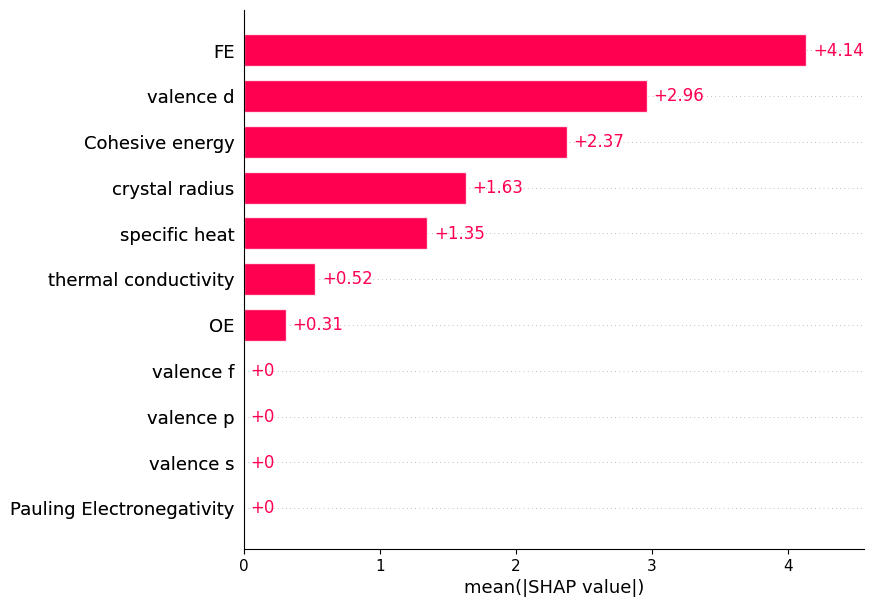

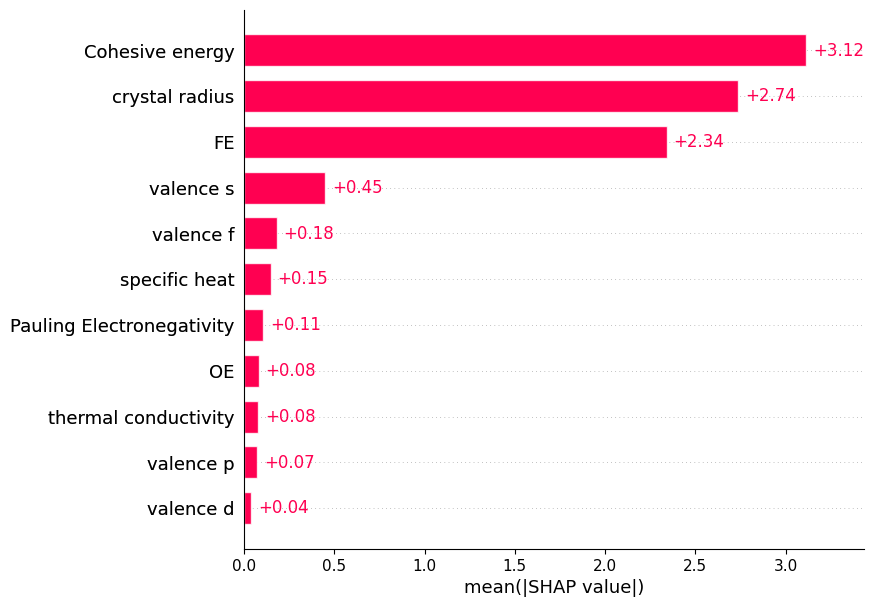

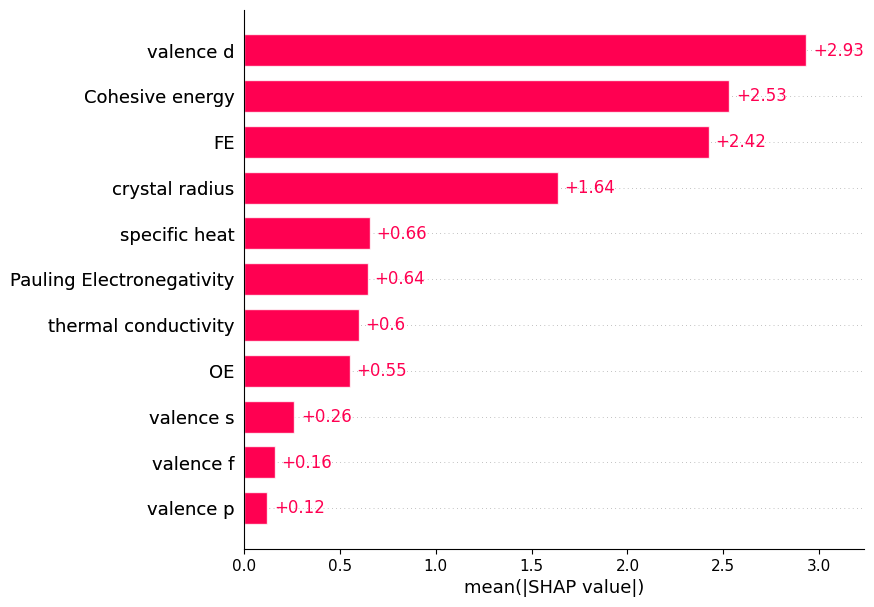

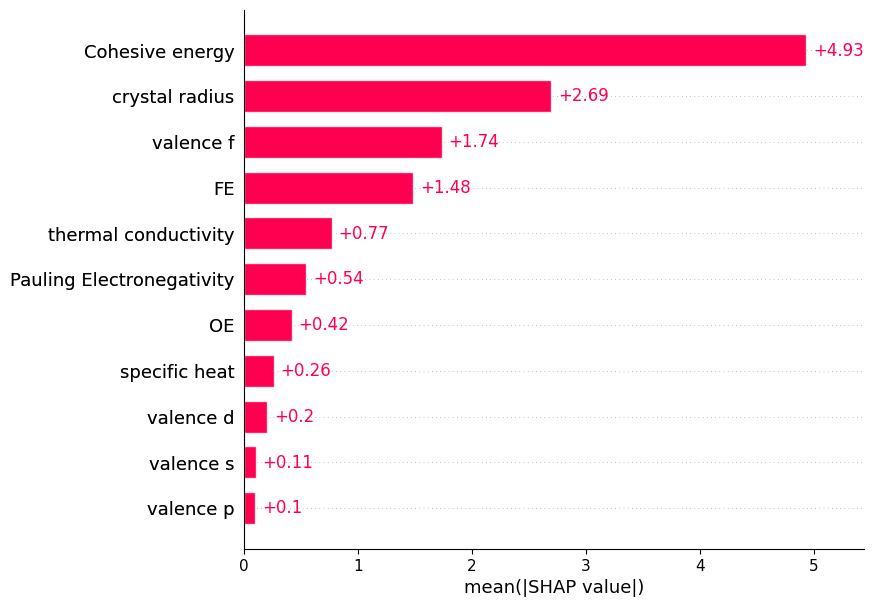

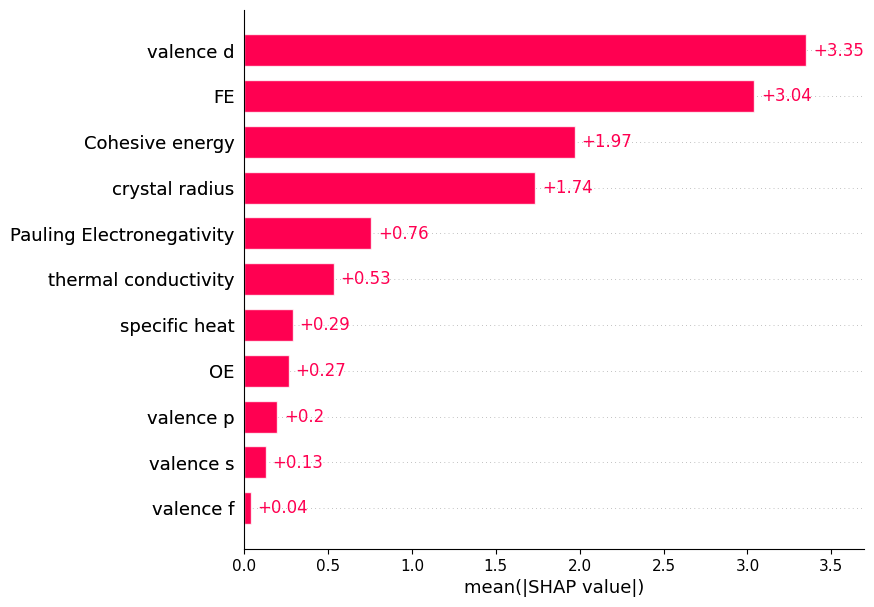

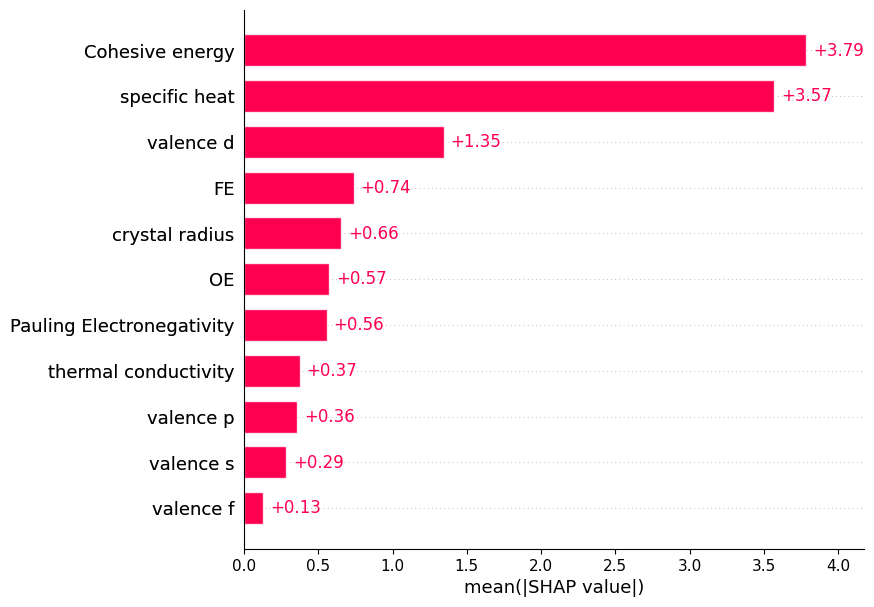

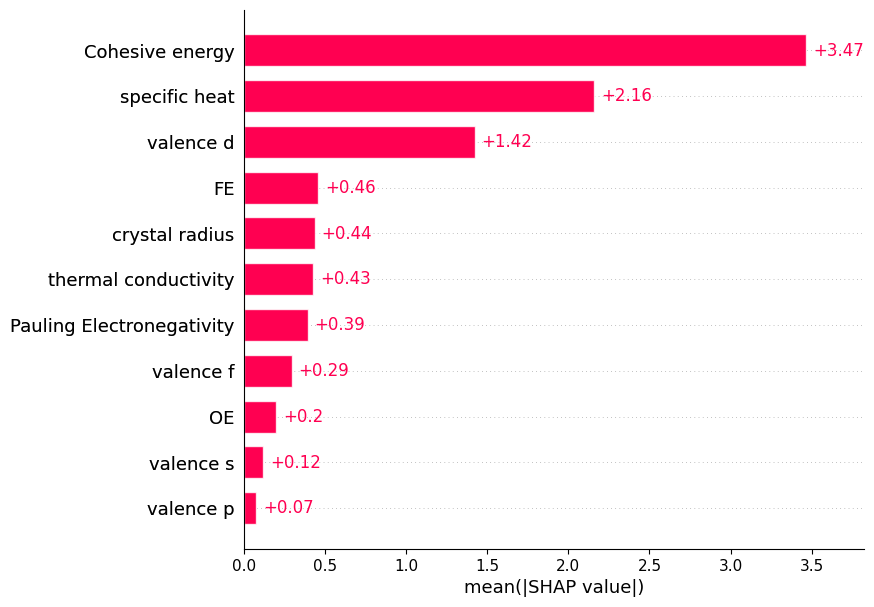

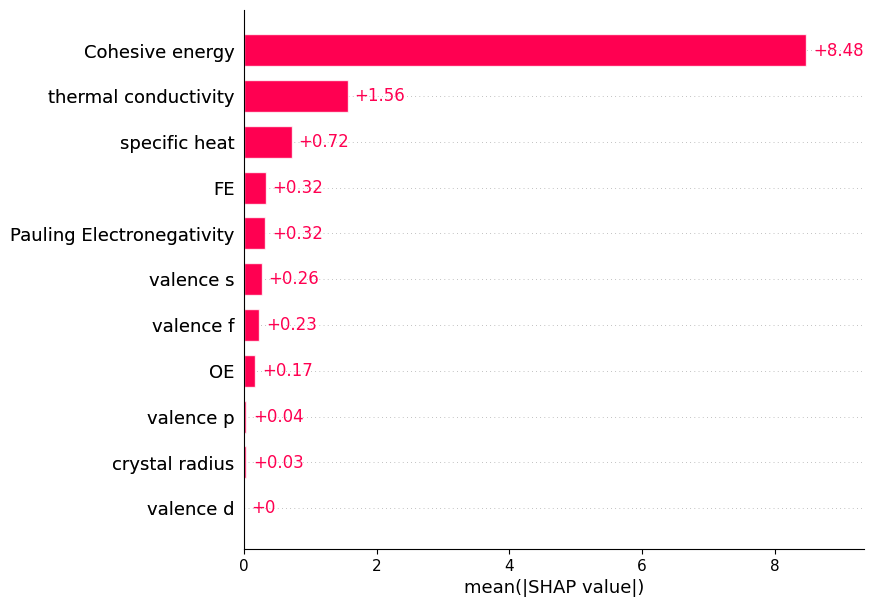

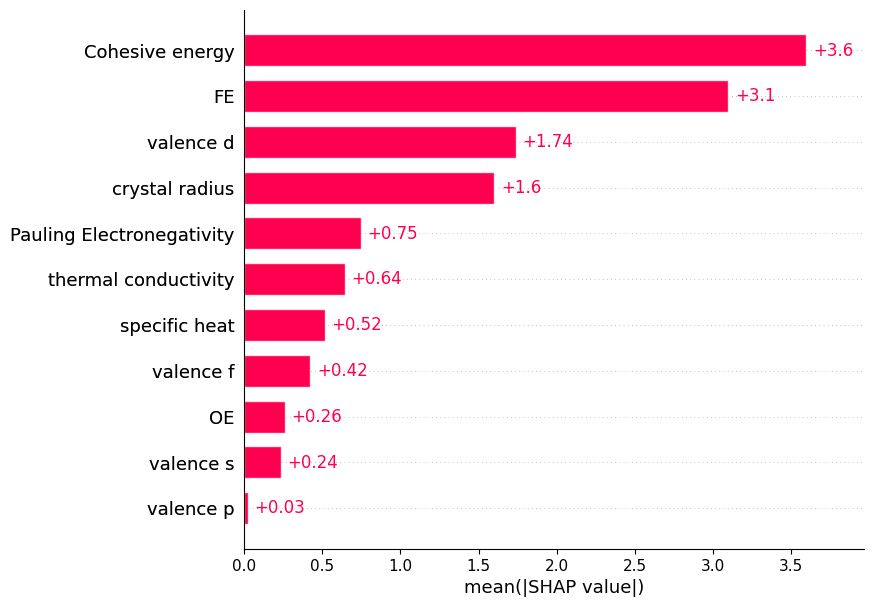

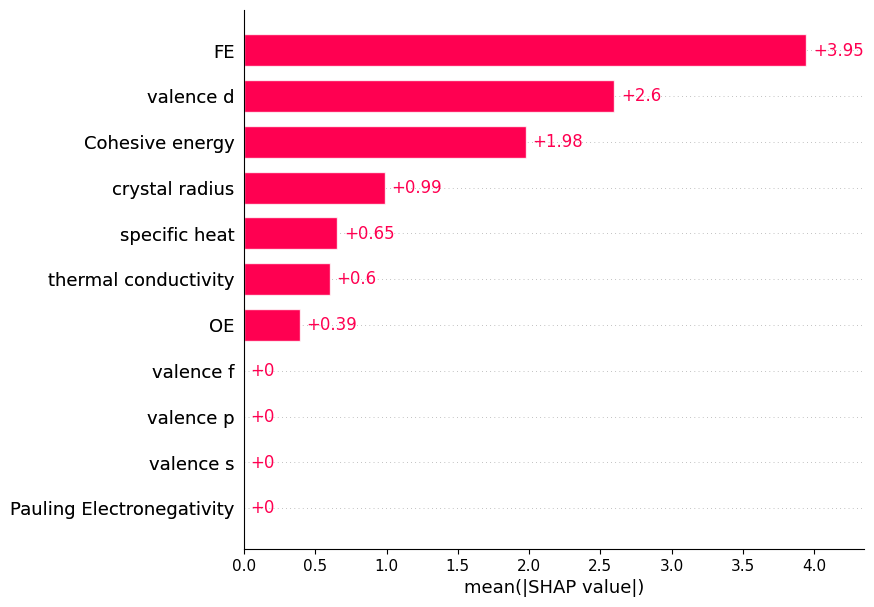

In [ ]:
model_GB3.plot_SHAP('all')

### XGBoost

In [ ]:
random_seeds = np.arange(0,10)
model_XGB3 = ModelEvaluatorBayes(X_metal_des, res, random_seeds, XGBRegressor, param_space_XGB, results_dict=results_fit1, IIS_dict=IIS_fit1, model_dict=models_fit1)
model_XGB3.evaluate_model()

Random seed 0 finished

Random seed 1 finished

Random seed 2 finished

Random seed 3 finished

Random seed 4 finished

Random seed 5 finished

Random seed 6 finished

Random seed 7 finished

Random seed 8 finished

Random seed 9 finished



In [ ]:
model_XGB3.show_IIS()

,Feature,Mean Rank,Non-Zero Frequency (%),IIS
10,Cohesive energy,1.500000,100.0,0.890000
2,FE,2.000000,100.0,0.835000
0,crystal radius,3.700000,100.0,0.759189
8,specific heat,5.000000,100.0,0.736000
6,valence d,3.888889,90.0,0.687857
9,thermal conductivity,6.777778,90.0,0.651689
3,OE,7.125000,80.0,0.582316
1,Pauling Electronegativity,6.000000,70.0,0.524000
7,valence f,7.000000,40.0,0.315143
4,valence s,8.000000,30.0,0.242250


In [ ]:
model_XGB3.show_shap_ranks()

{'crystal radius': [4, 3, 2, 4, 4, 5, 5, 3, 3, 4],
 'Pauling Electronegativity': [6, 5, 9, 6, 6, 5, 5],
 'FE': [1, 2, 3, 2, 1, 2, 2, 4, 2, 1],
 'OE': [5, 8, 8, 8, 5, 10, 8, 5],
 'valence s': [9, 9, 6],
 'valence p': [9],
 'valence d': [3, 5, 4, 3, 2, 4, 4, 8, 2],
 'valence f': [6, 8, 7, 7],
 'specific heat': [6, 4, 6, 5, 7, 3, 3, 6, 4, 6],
 'thermal conductivity': [7, 7, 7, 6, 7, 9, 2, 9, 7],
 'Cohesive energy': [2, 1, 1, 1, 3, 1, 1, 1, 1, 3]}

In [ ]:
model_XGB3.show_parameters()

{0: OrderedDict([('learning_rate', 0.038554513400070024),
              ('max_depth', 2),
              ('n_estimators', 75),
              ('reg_alpha', 3.401928141887209e-05),
              ('reg_lambda', 8.388903883202623e-05)]),
 1: OrderedDict([('learning_rate', 0.09138498202063693),
              ('max_depth', 10),
              ('n_estimators', 135),
              ('reg_alpha', 1e-06),
              ('reg_lambda', 53.29660158678347)]),
 2: OrderedDict([('learning_rate', 0.06576618759247604),
              ('max_depth', 10),
              ('n_estimators', 192),
              ('reg_alpha', 0.0027910378316687826),
              ('reg_lambda', 100.0)]),
 3: OrderedDict([('learning_rate', 1.0),
              ('max_depth', 1),
              ('n_estimators', 141),
              ('reg_alpha', 0.00016817447099991417),
              ('reg_lambda', 100.0)]),
 4: OrderedDict([('learning_rate', 0.07147356634627246),
              ('max_depth', 1),
              ('n_estimators', 84),
        

In [ ]:
model_XGB3.show_performance()

,random_seed,training R2,test R2,training RMSE,test RMSE,cv_score
0,0,0.379124,0.130526,13.010550,19.988565,0.252931
1,1,0.297686,0.417897,15.080414,12.315528,0.209285
2,2,0.339328,0.215851,14.040529,16.707985,0.230350
3,3,0.308055,0.274200,14.497545,15.520497,0.247688
4,4,0.316254,0.136416,14.799109,14.847138,0.253944
5,5,0.270108,0.451152,15.000649,13.233653,0.140033
6,6,0.265056,0.541719,15.509671,10.184914,0.153786
7,7,0.519172,-0.118563,10.876504,24.179647,0.455060
8,8,0.257637,0.708886,15.800823,7.735823,0.232299
9,9,0.252633,0.521809,15.441350,11.290126,0.188868


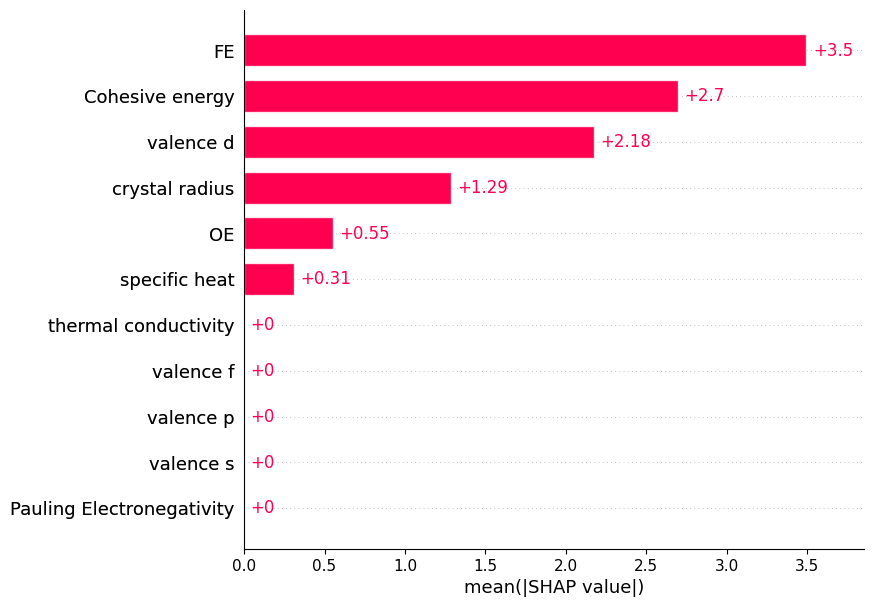

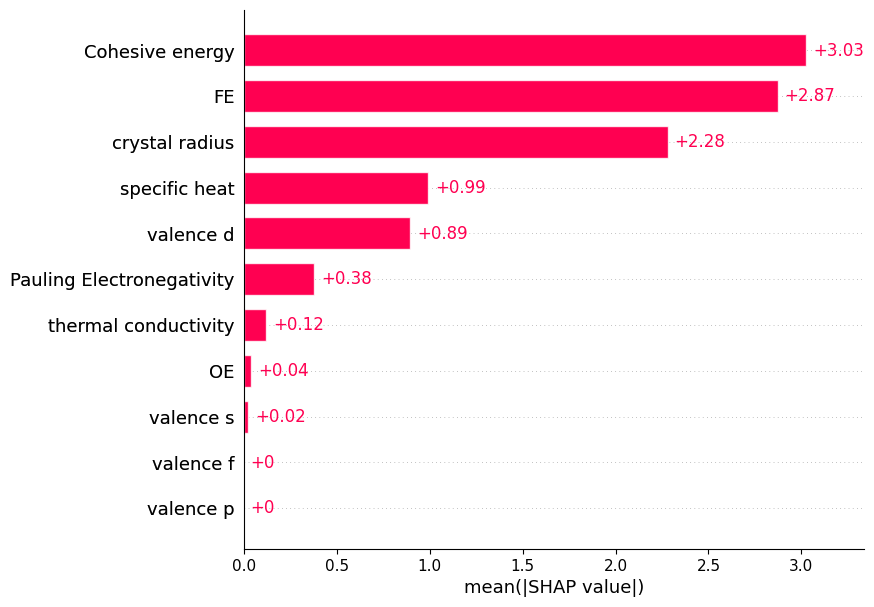

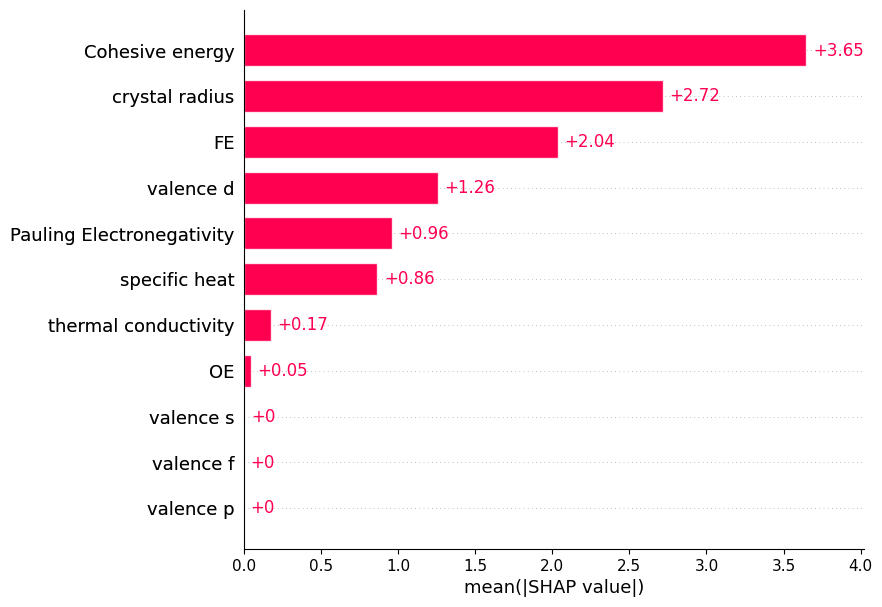

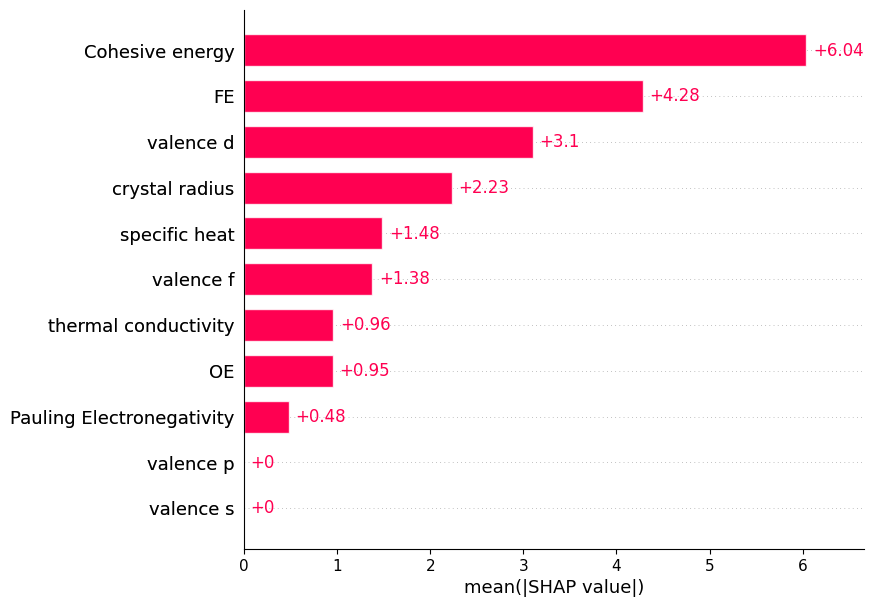

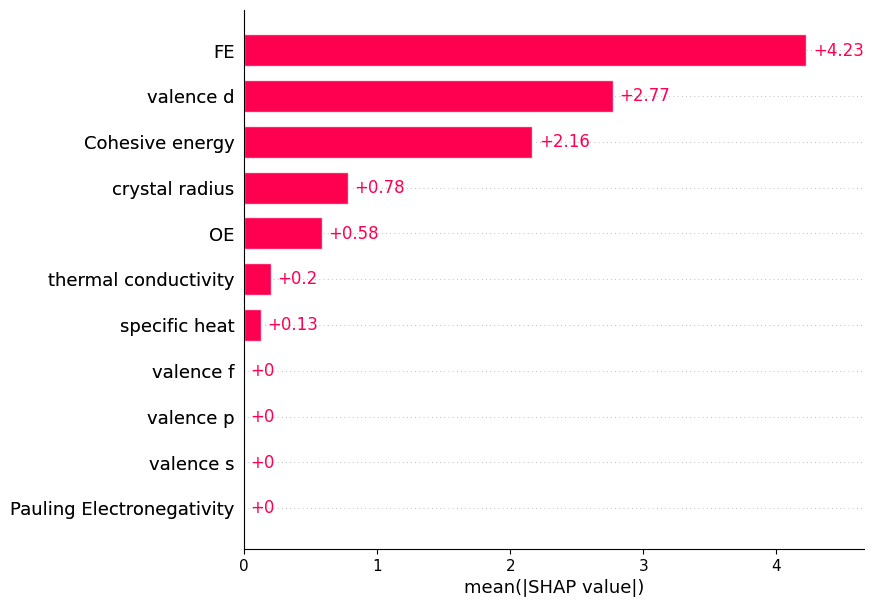

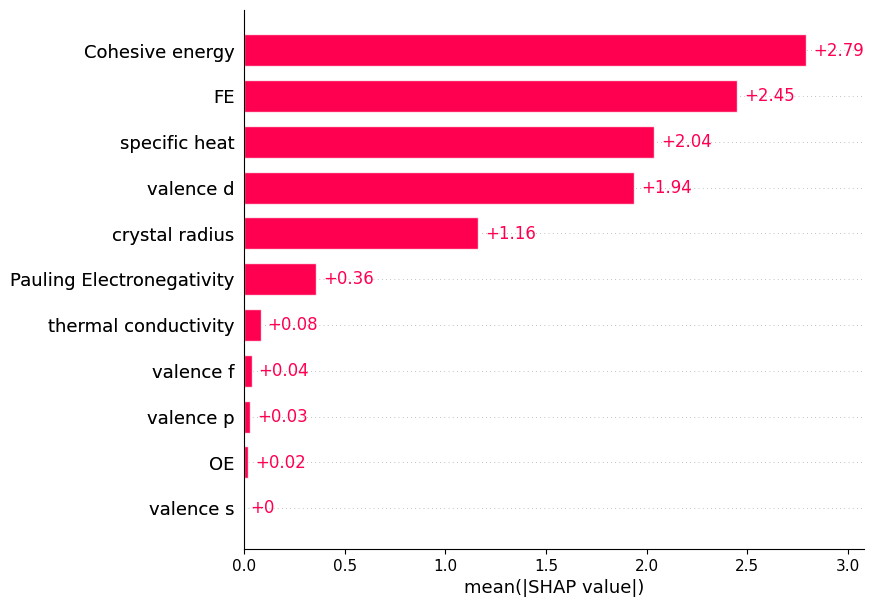

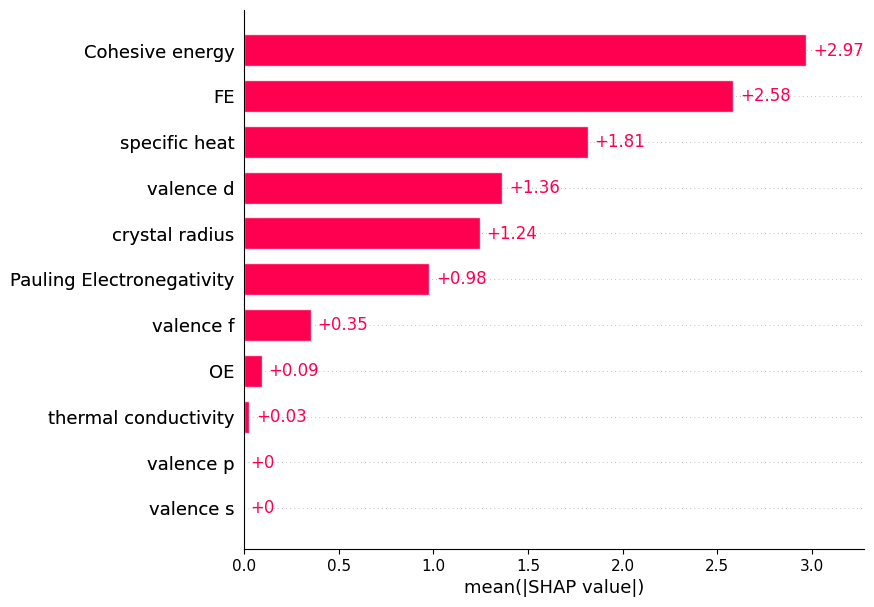

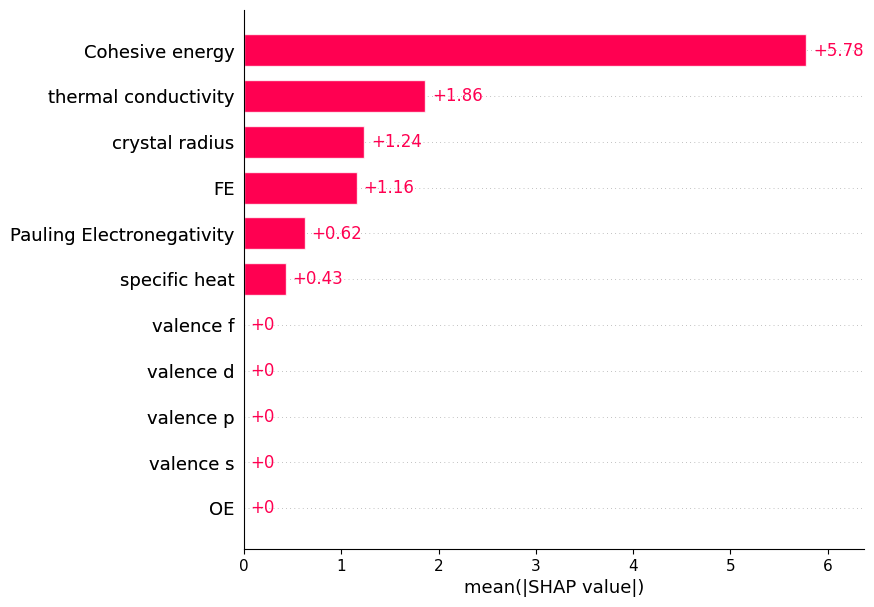

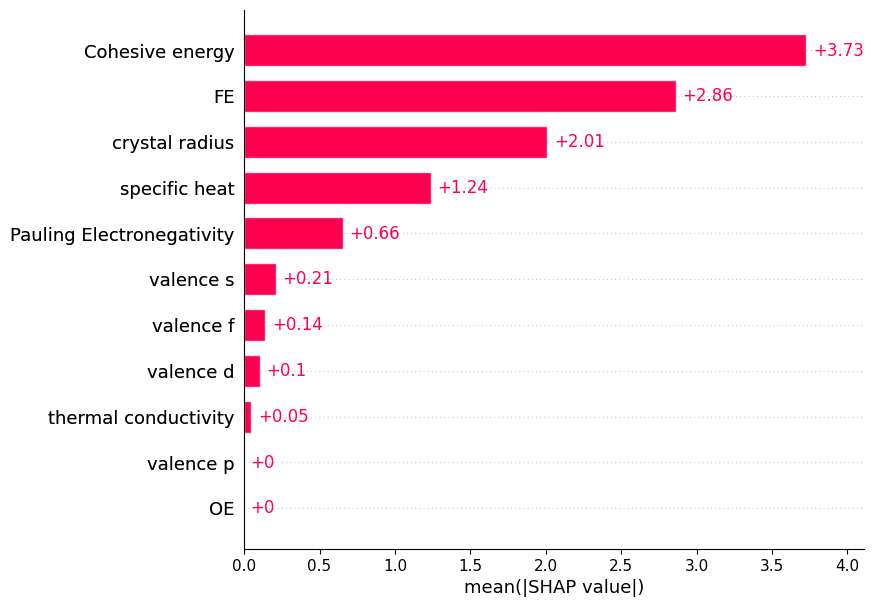

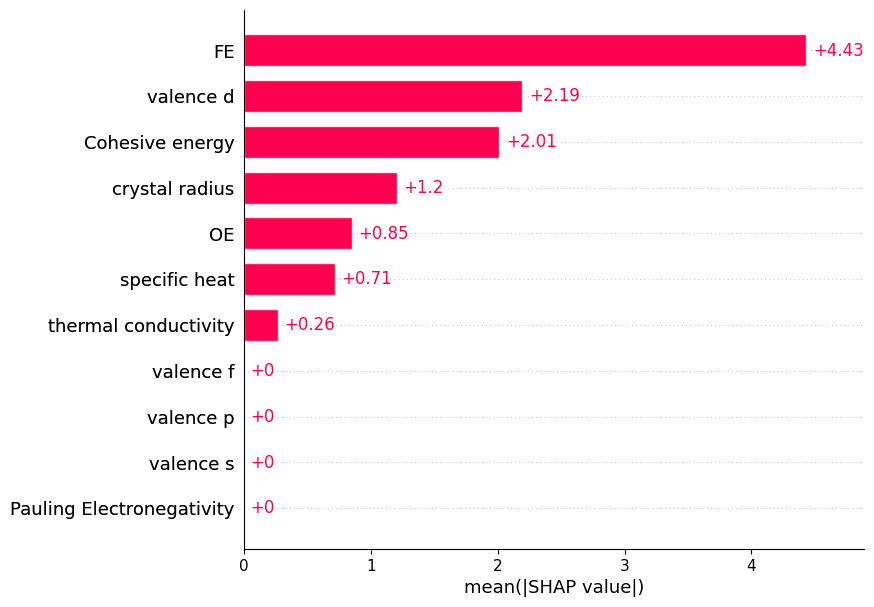

In [ ]:
model_XGB3.plot_SHAP('all')

### Support vector regression

In [ ]:
random_seeds = np.arange(0,10)
model_SVR3 = ModelEvaluatorBayes(X_metal_des, res, random_seeds, SVR, param_space_SVR, results_dict=results_fit1, IIS_dict=IIS_fit1, model_dict=models_fit1)
model_SVR3.evaluate_model()

Permutation explainer: 138it [00:36,  2.69it/s]


Random seed 0 finished



Permutation explainer: 138it [00:39,  2.54it/s]


Random seed 1 finished



The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The object

Random seed 2 finished



Permutation explainer: 138it [00:38,  2.58it/s]


Random seed 3 finished



The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The object

Random seed 4 finished



Permutation explainer: 138it [00:36,  2.63it/s]


Random seed 5 finished



The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
Permutation explainer: 138it [00:36,  2.70it/s]


Random seed 6 finished



Permutation explainer: 138it [00:34,  2.79it/s]


Random seed 7 finished



Permutation explainer: 138it [00:36,  2.73it/s]


Random seed 8 finished



Permutation explainer: 138it [00:36,  2.73it/s]

Random seed 9 finished



In [ ]:
model_SVR3.show_IIS()

,Feature,Mean Rank,Non-Zero Frequency (%),IIS
9,thermal conductivity,1.0,100.0,1.000000
6,valence d,2.0,100.0,0.835000
10,Cohesive energy,3.0,100.0,0.780000
7,valence f,4.0,100.0,0.752500
8,specific heat,5.1,100.0,0.734706
3,OE,5.9,100.0,0.725932
5,valence p,7.4,100.0,0.714595
4,valence s,7.6,100.0,0.713421
1,Pauling Electronegativity,9.0,100.0,0.706667
2,FE,10.0,100.0,0.703000


In [ ]:
model_SVR3.show_shap_ranks()

{'crystal radius': [11, 11, 11, 11, 11, 11, 11, 11, 11, 11],
 'Pauling Electronegativity': [9, 9, 9, 9, 9, 9, 9, 9, 9, 9],
 'FE': [10, 10, 10, 10, 10, 10, 10, 10, 10, 10],
 'OE': [6, 6, 6, 6, 6, 6, 6, 5, 6, 6],
 'valence s': [8, 7, 8, 7, 8, 8, 8, 7, 8, 7],
 'valence p': [7, 8, 7, 8, 7, 7, 7, 8, 7, 8],
 'valence d': [2, 2, 2, 2, 2, 2, 2, 2, 2, 2],
 'valence f': [4, 4, 4, 4, 4, 4, 4, 4, 4, 4],
 'specific heat': [5, 5, 5, 5, 5, 5, 5, 6, 5, 5],
 'thermal conductivity': [1, 1, 1, 1, 1, 1, 1, 1, 1, 1],
 'Cohesive energy': [3, 3, 3, 3, 3, 3, 3, 3, 3, 3]}

In [ ]:
model_SVR3.show_performance()

,random_seed,training R2,test R2,training RMSE,test RMSE,cv_score
0,0,0.350378,0.173197,13.308337,19.491903,0.202972
1,1,0.271593,0.400470,15.357996,12.498520,0.248834
2,2,0.313384,0.222627,14.313553,16.635638,0.249770
3,3,0.288965,0.305306,14.696172,15.184269,0.213266
4,4,0.317522,0.168545,14.785381,14.568332,0.223063
5,5,0.241123,0.529880,15.295591,12.247803,0.143273
6,6,0.246905,0.482293,15.700026,10.825130,0.179122
7,7,0.462180,-0.076606,11.503046,23.721824,0.424703
8,8,0.228894,0.635153,16.103808,8.660242,0.224077
9,9,0.206811,0.444192,15.907678,12.171957,0.169741


In [ ]:
model_SVR3.show_parameters()

{0: OrderedDict([('C', 23.097663980253614),
              ('epsilon', 0.5),
              ('gamma', 'auto'),
              ('kernel', 'rbf')]),
 1: OrderedDict([('C', 8.501350132932567),
              ('epsilon', 0.5),
              ('gamma', 'auto'),
              ('kernel', 'rbf')]),
 2: OrderedDict([('C', 1000.0),
              ('epsilon', 0.5),
              ('gamma', 'auto'),
              ('kernel', 'rbf')]),
 3: OrderedDict([('C', 210.37736817442612),
              ('epsilon', 0.1),
              ('gamma', 'auto'),
              ('kernel', 'rbf')]),
 4: OrderedDict([('C', 1000.0),
              ('epsilon', 0.5),
              ('gamma', 'auto'),
              ('kernel', 'rbf')]),
 5: OrderedDict([('C', 17.193062843019977),
              ('epsilon', 0.5),
              ('gamma', 'auto'),
              ('kernel', 'rbf')]),
 6: OrderedDict([('C', 22.064440676302826),
              ('epsilon', 0.18219868070290207),
              ('gamma', 'auto'),
              ('kernel', 'rbf')]),
 

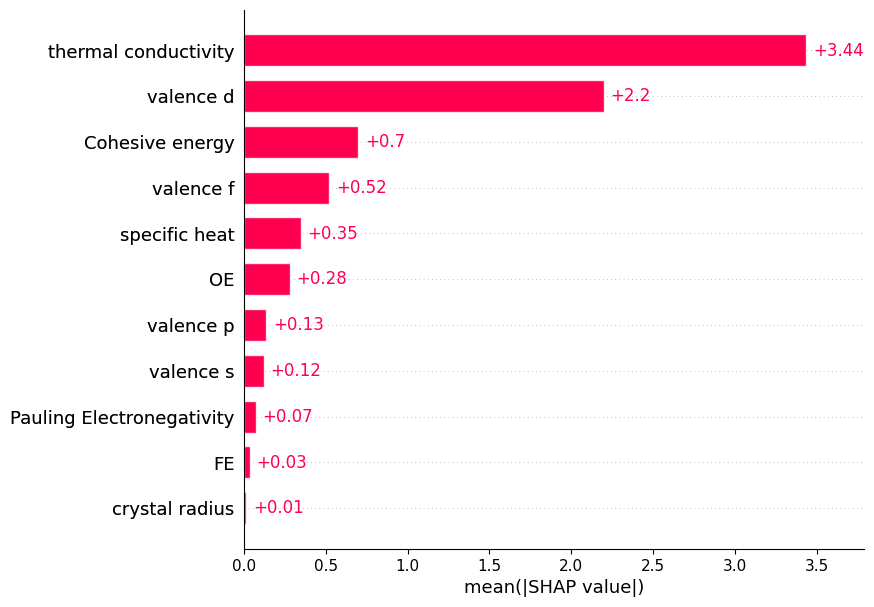

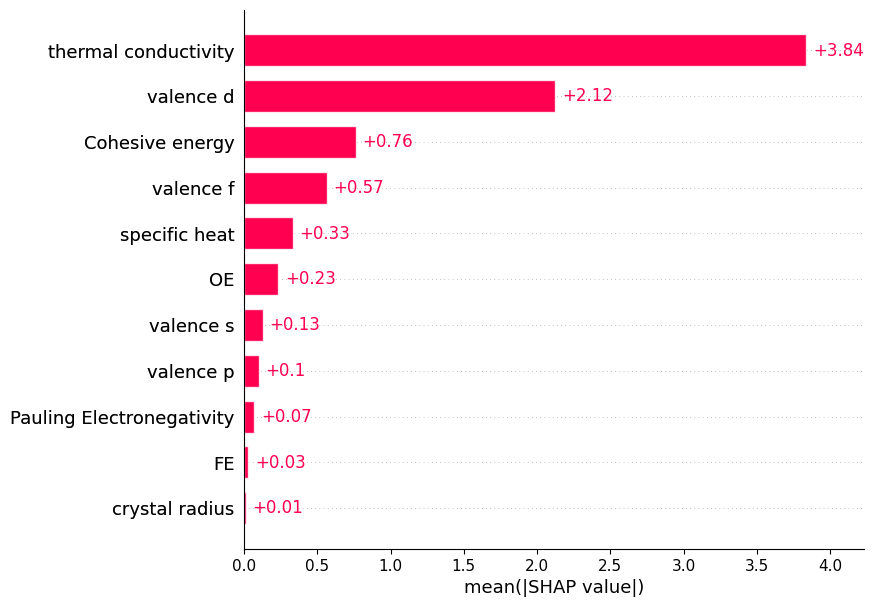

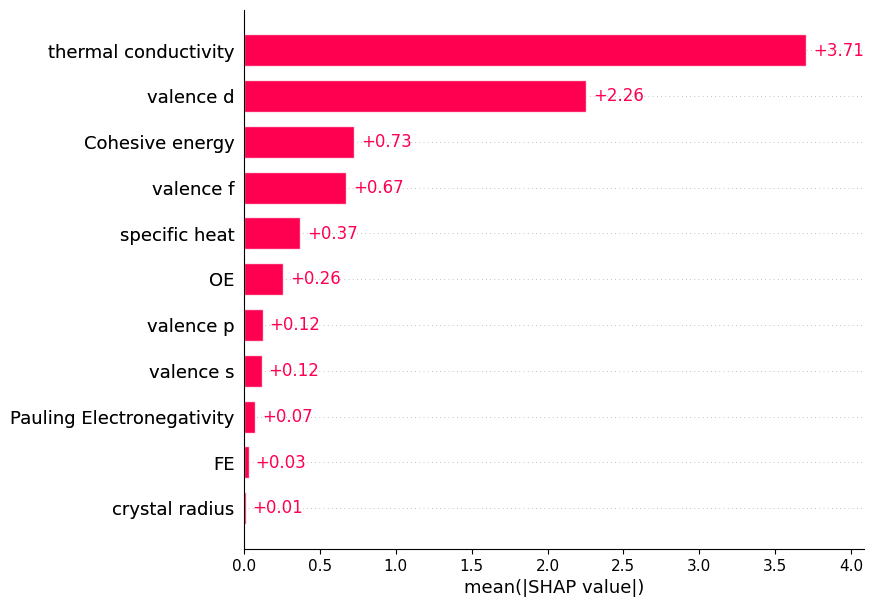

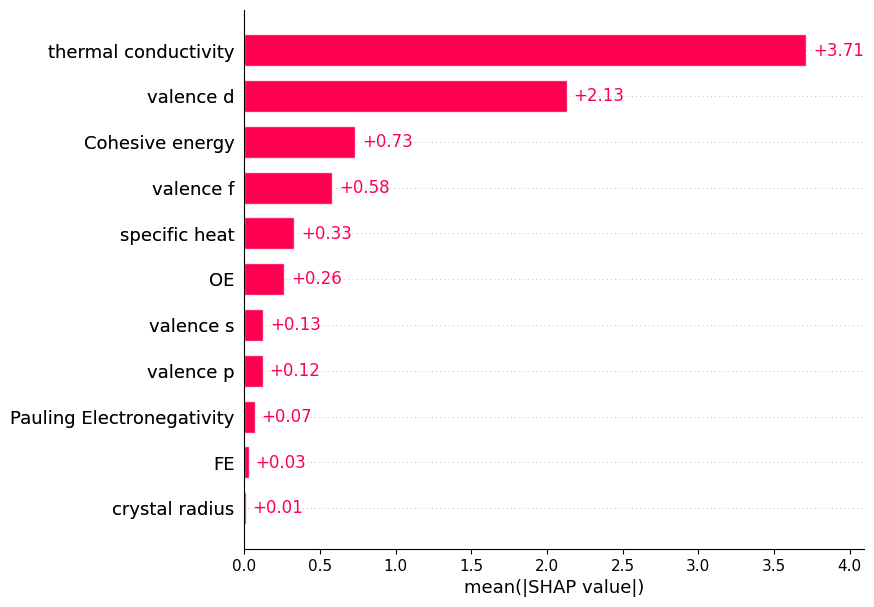

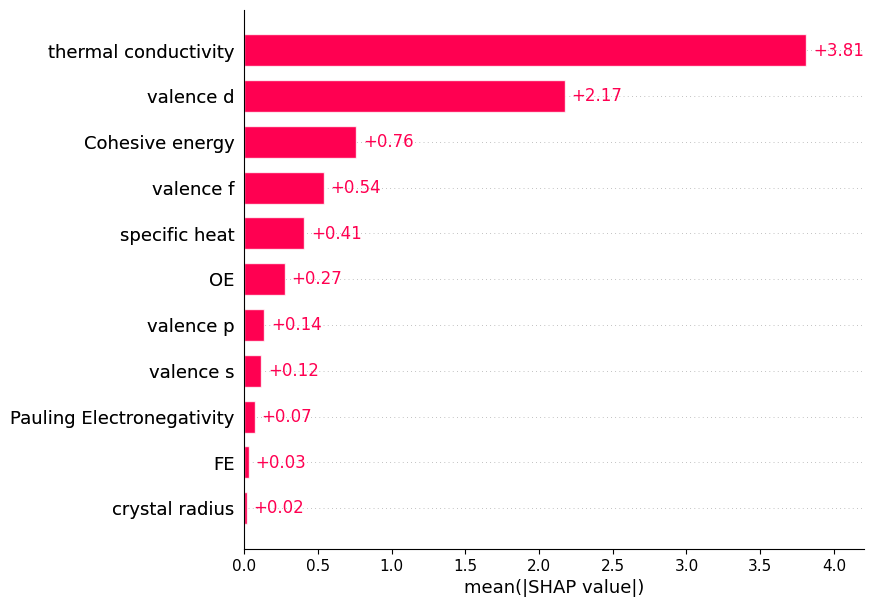

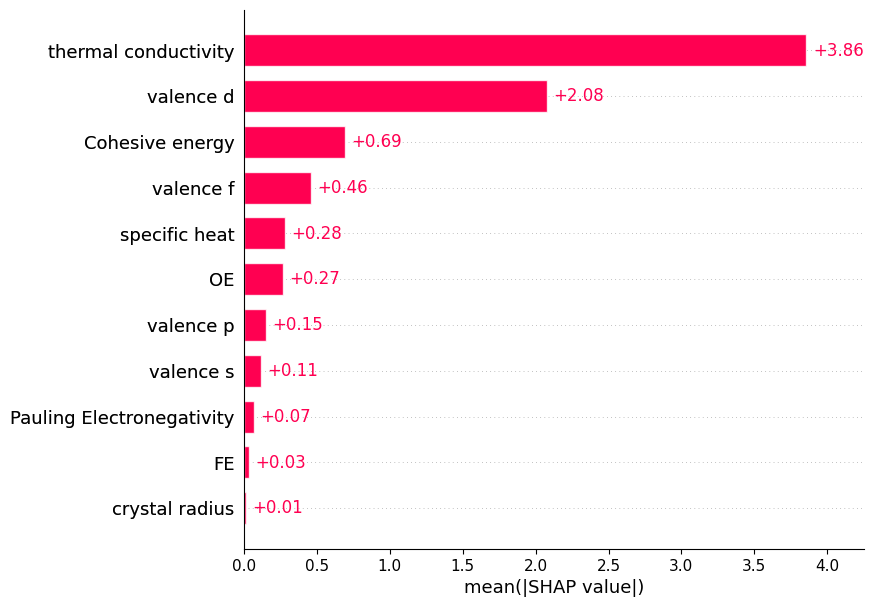

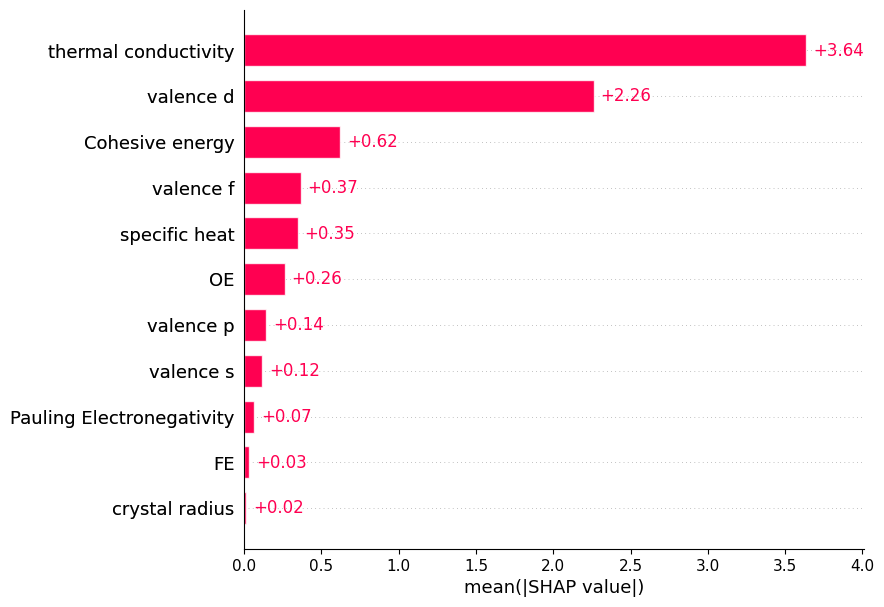

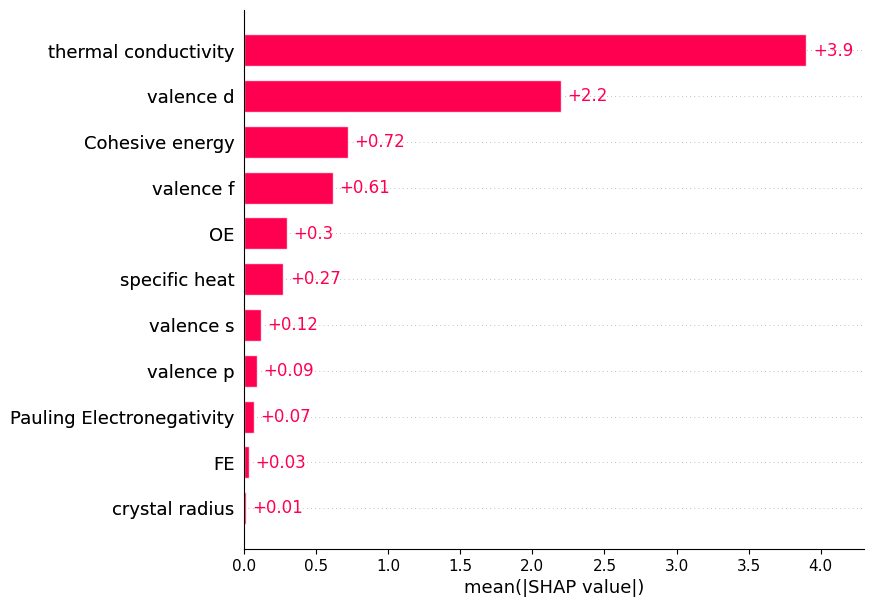

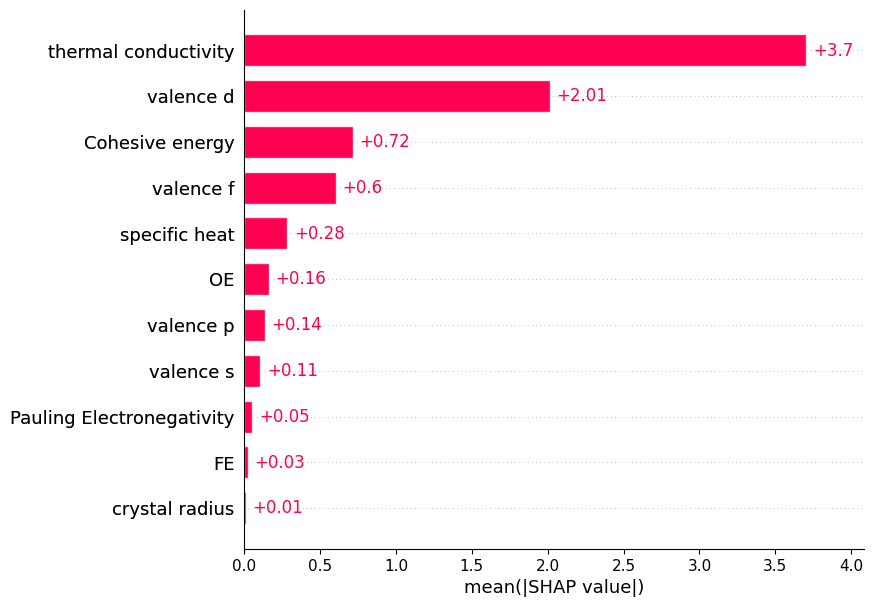

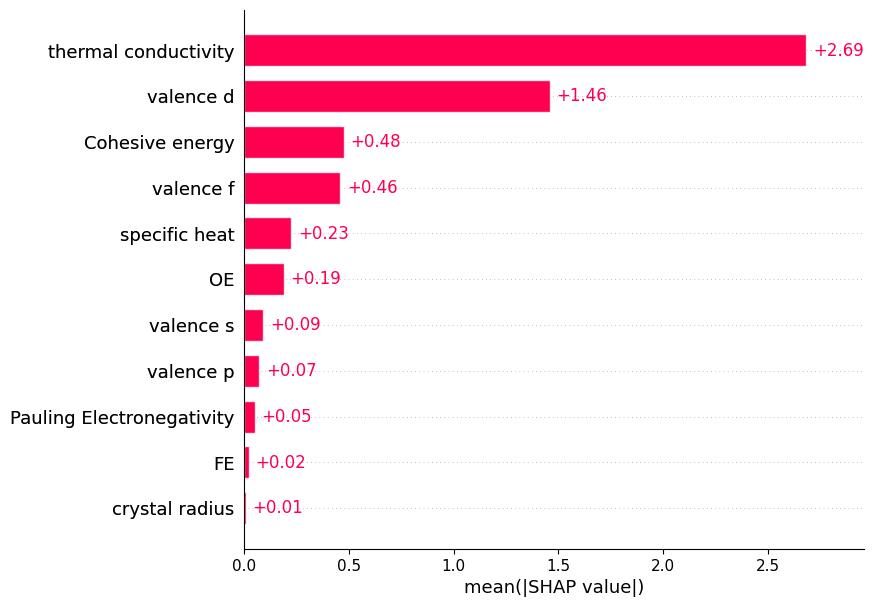

In [ ]:
model_SVR3.plot_SHAP('all')

### Gaussian process

In [ ]:
random_seeds = np.arange(0,10)
kernel = ConstantKernel(1.0, (1e-3, 1e3)) * RationalQuadratic(length_scale=1.0, alpha=0.1) + WhiteKernel(noise_level=1, noise_level_bounds=(1e-10, 1e+1))

model_GP3 = ModelEvaluatorBayes(X_metal_des, res, random_seeds, GaussianProcessRegressor, param_space_GP, kernel, results_fit1, IIS_fit1, models_fit1)
model_GP3.evaluate_model()

The optimal value found for dimension 0 of parameter k1__k2__alpha is close to the specified upper bound 100000.0. Increasing the bound and calling fit again may find a better value.
The optimal value found for dimension 0 of parameter k1__k2__length_scale is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
The optimal value found for dimension 0 of parameter k2__noise_level is close to the specified upper bound 10.0. Increasing the bound and calling fit again may find a better value.
Permutation explainer: 138it [00:59,  1.89it/s]


Random seed 0 finished



The optimal value found for dimension 0 of parameter k1__k2__alpha is close to the specified upper bound 100000.0. Increasing the bound and calling fit again may find a better value.
The optimal value found for dimension 0 of parameter k1__k2__length_scale is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
The optimal value found for dimension 0 of parameter k2__noise_level is close to the specified upper bound 10.0. Increasing the bound and calling fit again may find a better value.
The optimal value found for dimension 0 of parameter k2__noise_level is close to the specified upper bound 10.0. Increasing the bound and calling fit again may find a better value.
The optimal value found for dimension 0 of parameter k2__noise_level is close to the specified upper bound 10.0. Increasing the bound and calling fit again may find a better value.
The optimal value found for dimension 0 of parameter k2__noise_level is close to the sp

Random seed 1 finished



The optimal value found for dimension 0 of parameter k1__k2__alpha is close to the specified upper bound 100000.0. Increasing the bound and calling fit again may find a better value.
The optimal value found for dimension 0 of parameter k2__noise_level is close to the specified upper bound 10.0. Increasing the bound and calling fit again may find a better value.
The optimal value found for dimension 0 of parameter k2__noise_level is close to the specified upper bound 10.0. Increasing the bound and calling fit again may find a better value.
The optimal value found for dimension 0 of parameter k2__noise_level is close to the specified upper bound 10.0. Increasing the bound and calling fit again may find a better value.
The optimal value found for dimension 0 of parameter k1__k2__alpha is close to the specified upper bound 100000.0. Increasing the bound and calling fit again may find a better value.
The optimal value found for dimension 0 of parameter k1__k2__length_scale is close to the s

Random seed 2 finished



The optimal value found for dimension 0 of parameter k1__k2__alpha is close to the specified upper bound 100000.0. Increasing the bound and calling fit again may find a better value.
The optimal value found for dimension 0 of parameter k2__noise_level is close to the specified upper bound 10.0. Increasing the bound and calling fit again may find a better value.
The optimal value found for dimension 0 of parameter k1__k2__length_scale is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
The optimal value found for dimension 0 of parameter k2__noise_level is close to the specified upper bound 10.0. Increasing the bound and calling fit again may find a better value.
The optimal value found for dimension 0 of parameter k2__noise_level is close to the specified upper bound 10.0. Increasing the bound and calling fit again may find a better value.
The optimal value found for dimension 0 of parameter k2__noise_level is close to the sp

Random seed 3 finished



The optimal value found for dimension 0 of parameter k1__k2__alpha is close to the specified upper bound 100000.0. Increasing the bound and calling fit again may find a better value.
The optimal value found for dimension 0 of parameter k1__k2__length_scale is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
The optimal value found for dimension 0 of parameter k2__noise_level is close to the specified upper bound 10.0. Increasing the bound and calling fit again may find a better value.
The optimal value found for dimension 0 of parameter k2__noise_level is close to the specified upper bound 10.0. Increasing the bound and calling fit again may find a better value.
The optimal value found for dimension 0 of parameter k2__noise_level is close to the specified upper bound 10.0. Increasing the bound and calling fit again may find a better value.
The optimal value found for dimension 0 of parameter k2__noise_level is close to the sp

Random seed 4 finished



The optimal value found for dimension 0 of parameter k1__k2__alpha is close to the specified upper bound 100000.0. Increasing the bound and calling fit again may find a better value.
The optimal value found for dimension 0 of parameter k2__noise_level is close to the specified upper bound 10.0. Increasing the bound and calling fit again may find a better value.
The optimal value found for dimension 0 of parameter k2__noise_level is close to the specified upper bound 10.0. Increasing the bound and calling fit again may find a better value.
The optimal value found for dimension 0 of parameter k2__noise_level is close to the specified upper bound 10.0. Increasing the bound and calling fit again may find a better value.
The optimal value found for dimension 0 of parameter k2__noise_level is close to the specified upper bound 10.0. Increasing the bound and calling fit again may find a better value.
The optimal value found for dimension 0 of parameter k2__noise_level is close to the specifie

Random seed 5 finished



The optimal value found for dimension 0 of parameter k1__k2__alpha is close to the specified upper bound 100000.0. Increasing the bound and calling fit again may find a better value.
The optimal value found for dimension 0 of parameter k1__k2__length_scale is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
The optimal value found for dimension 0 of parameter k2__noise_level is close to the specified upper bound 10.0. Increasing the bound and calling fit again may find a better value.
The optimal value found for dimension 0 of parameter k1__k2__length_scale is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
The optimal value found for dimension 0 of parameter k2__noise_level is close to the specified upper bound 10.0. Increasing the bound and calling fit again may find a better value.
The optimal value found for dimension 0 of parameter k2__noise_level is close to 

Random seed 6 finished



The optimal value found for dimension 0 of parameter k1__k2__alpha is close to the specified upper bound 100000.0. Increasing the bound and calling fit again may find a better value.
Permutation explainer: 138it [01:02,  1.84it/s]


Random seed 7 finished



The optimal value found for dimension 0 of parameter k1__k2__alpha is close to the specified upper bound 100000.0. Increasing the bound and calling fit again may find a better value.
The optimal value found for dimension 0 of parameter k1__k2__length_scale is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
The optimal value found for dimension 0 of parameter k2__noise_level is close to the specified upper bound 10.0. Increasing the bound and calling fit again may find a better value.
The optimal value found for dimension 0 of parameter k2__noise_level is close to the specified upper bound 10.0. Increasing the bound and calling fit again may find a better value.
The optimal value found for dimension 0 of parameter k1__k2__length_scale is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
The optimal value found for dimension 0 of parameter k2__noise_level is close to 

Random seed 8 finished



The optimal value found for dimension 0 of parameter k1__k2__alpha is close to the specified upper bound 100000.0. Increasing the bound and calling fit again may find a better value.
The optimal value found for dimension 0 of parameter k2__noise_level is close to the specified upper bound 10.0. Increasing the bound and calling fit again may find a better value.
The optimal value found for dimension 0 of parameter k2__noise_level is close to the specified upper bound 10.0. Increasing the bound and calling fit again may find a better value.
The optimal value found for dimension 0 of parameter k2__noise_level is close to the specified upper bound 10.0. Increasing the bound and calling fit again may find a better value.
The optimal value found for dimension 0 of parameter k2__noise_level is close to the specified upper bound 10.0. Increasing the bound and calling fit again may find a better value.
The optimal value found for dimension 0 of parameter k2__noise_level is close to the specifie

Random seed 9 finished



In [ ]:
model_GP3.show_IIS()

,Feature,Mean Rank,Non-Zero Frequency (%),IIS
9,thermal conductivity,1.6,100.0,0.876250
6,valence d,2.7,100.0,0.792222
10,Cohesive energy,3.3,100.0,0.770000
3,OE,4.1,100.0,0.750488
8,specific heat,5.5,100.0,0.730000
0,crystal radius,6.1,100.0,0.724098
1,Pauling Electronegativity,6.5,100.0,0.720769
2,FE,6.8,100.0,0.718529
4,valence s,8.6,100.0,0.708372
7,valence f,9.9,100.0,0.703333


In [ ]:
model_GP3.show_shap_ranks()

{'crystal radius': [6, 7, 7, 3, 6, 5, 6, 10, 4, 7],
 'Pauling Electronegativity': [7, 5, 8, 6, 5, 8, 7, 6, 7, 6],
 'FE': [8, 8, 5, 2, 8, 6, 8, 9, 6, 8],
 'OE': [3, 4, 4, 5, 4, 3, 5, 4, 5, 4],
 'valence s': [9, 9, 9, 9, 9, 9, 9, 5, 9, 9],
 'valence p': [11, 11, 11, 11, 11, 11, 10, 11, 11, 11],
 'valence d': [2, 2, 2, 8, 2, 2, 2, 2, 2, 3],
 'valence f': [10, 10, 10, 10, 10, 10, 11, 8, 10, 10],
 'specific heat': [5, 6, 6, 1, 7, 7, 3, 7, 8, 5],
 'thermal conductivity': [1, 1, 1, 7, 1, 1, 1, 1, 1, 1],
 'Cohesive energy': [4, 3, 3, 4, 3, 4, 4, 3, 3, 2]}

In [ ]:
model_GP3.show_performance()

,random_seed,training R2,test R2,training RMSE,test RMSE,cv_score
0,0,0.377885,0.114901,13.023532,20.167375,0.231511
1,1,0.296056,0.408679,15.097901,12.412659,0.199395
2,2,0.348963,0.225907,13.937768,16.600504,0.226234
3,3,0.309951,0.285046,14.477669,15.404102,0.251211
4,4,0.339389,0.163974,14.546587,14.608321,0.237536
5,5,0.270071,0.450235,15.001026,13.244705,0.139486
6,6,0.259289,0.477167,15.570414,10.878593,0.151567
7,7,0.523403,-0.163309,10.828545,24.658533,0.450962
8,8,0.259693,0.690829,15.778927,7.972124,0.230948
9,9,0.244052,0.500072,15.529747,11.543877,0.179459


In [ ]:
model_GP3.show_parameters()

{0: OrderedDict([('alpha', 203.22956179918816),
              ('kernel__k1__k1__constant_value', 0.1),
              ('kernel__k1__k2__alpha', 1000000.0),
              ('kernel__k1__k2__length_scale', 1e-06),
              ('kernel__k2__noise_level', 1000.0)]),
 1: OrderedDict([('alpha', 104.77459560160747),
              ('kernel__k1__k1__constant_value', 1000.0),
              ('kernel__k1__k2__alpha', 1000000.0),
              ('kernel__k1__k2__length_scale', 1e-06),
              ('kernel__k2__noise_level', 1000.0)]),
 2: OrderedDict([('alpha', 25.116732980810028),
              ('kernel__k1__k1__constant_value', 1000.0),
              ('kernel__k1__k2__alpha', 1000000.0),
              ('kernel__k1__k2__length_scale', 0.1),
              ('kernel__k2__noise_level', 0.1)]),
 3: OrderedDict([('alpha', 36.825337492106385),
              ('kernel__k1__k1__constant_value', 1000.0),
              ('kernel__k1__k2__alpha', 1000000.0),
              ('kernel__k1__k2__length_scale', 0.1),

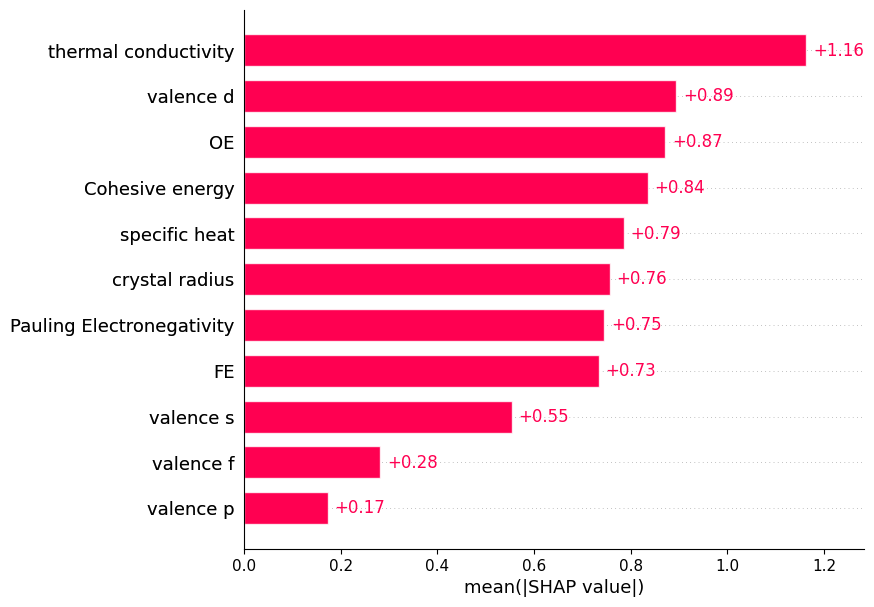

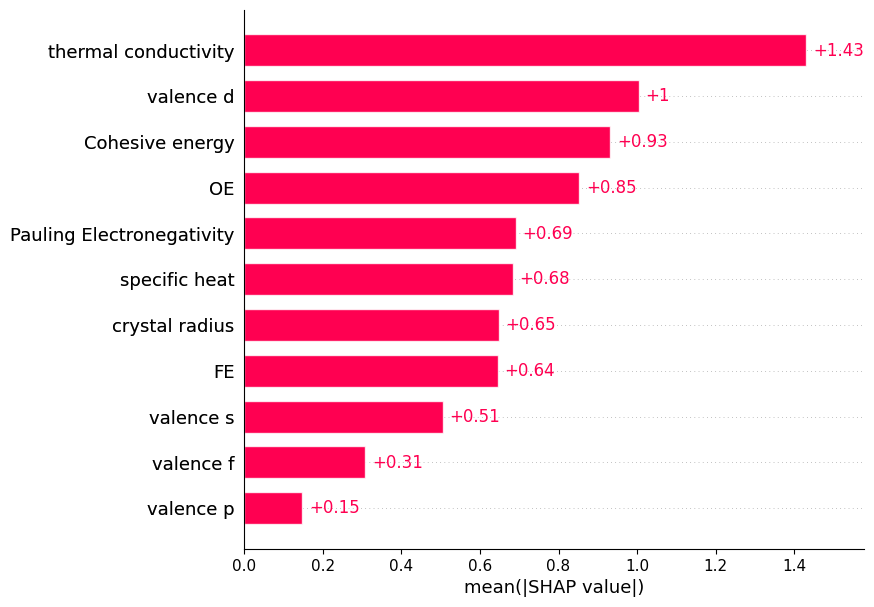

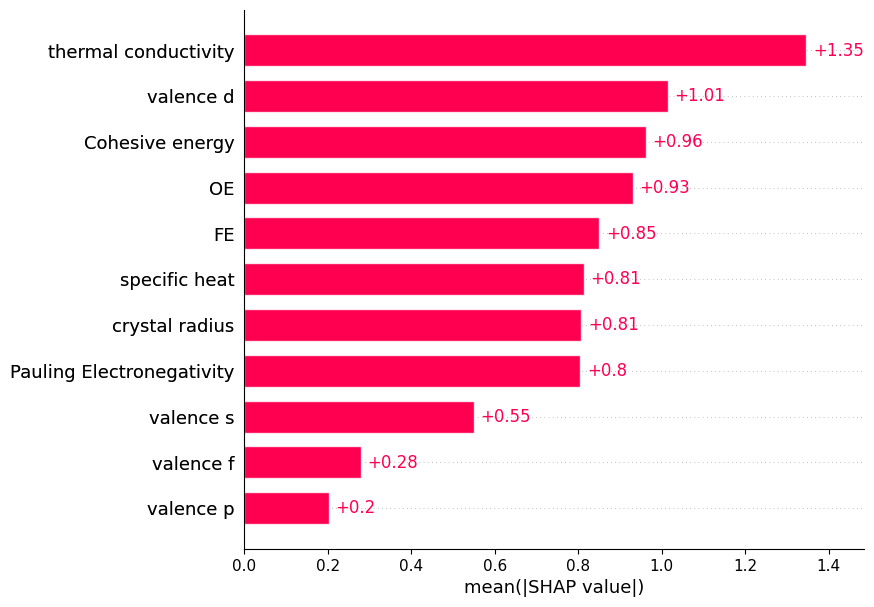

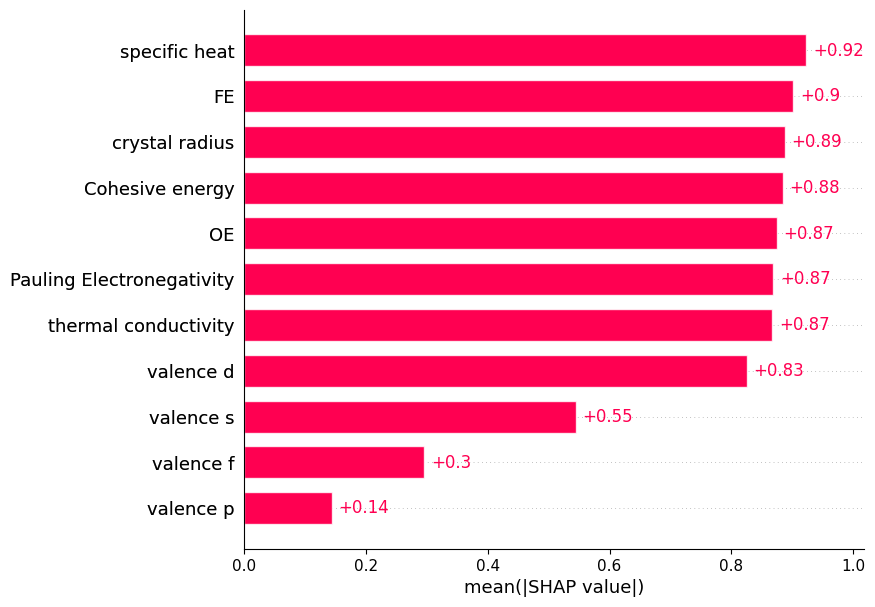

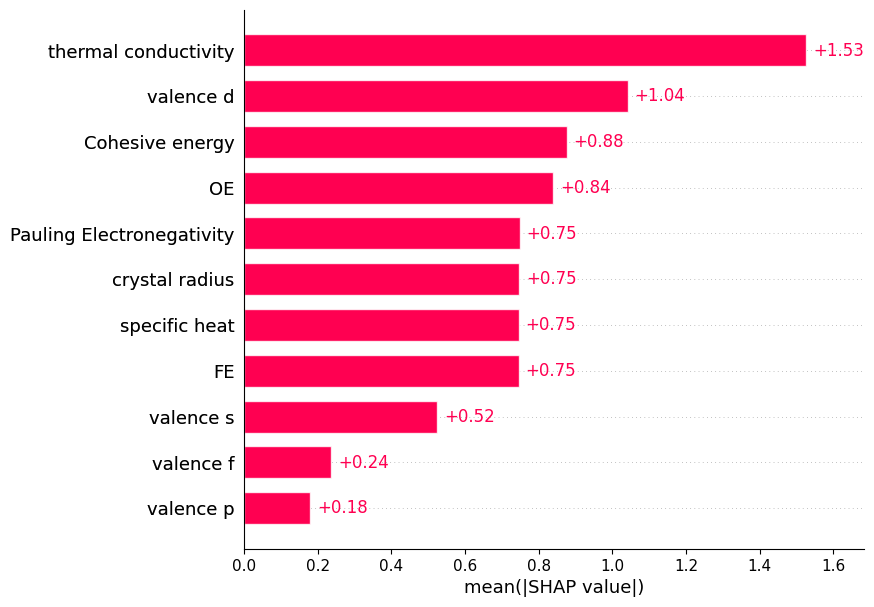

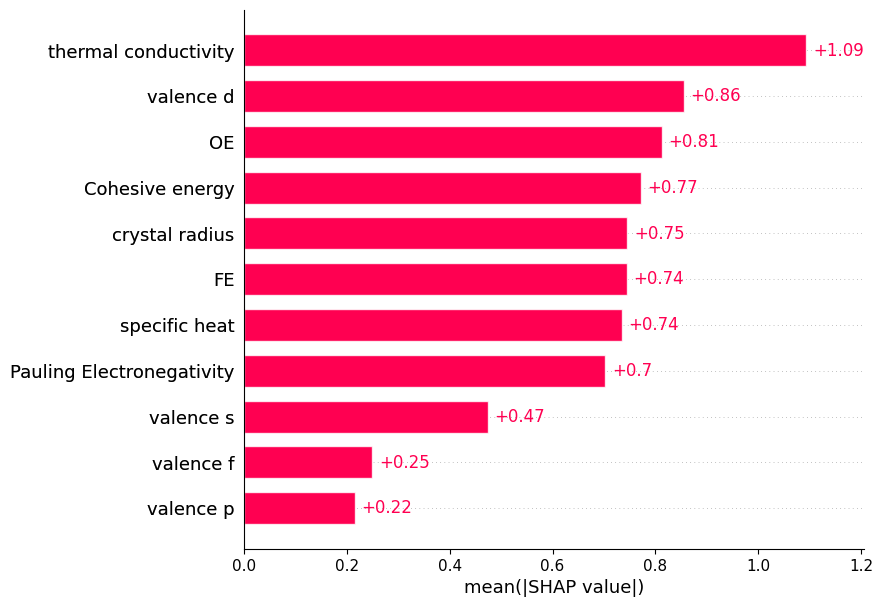

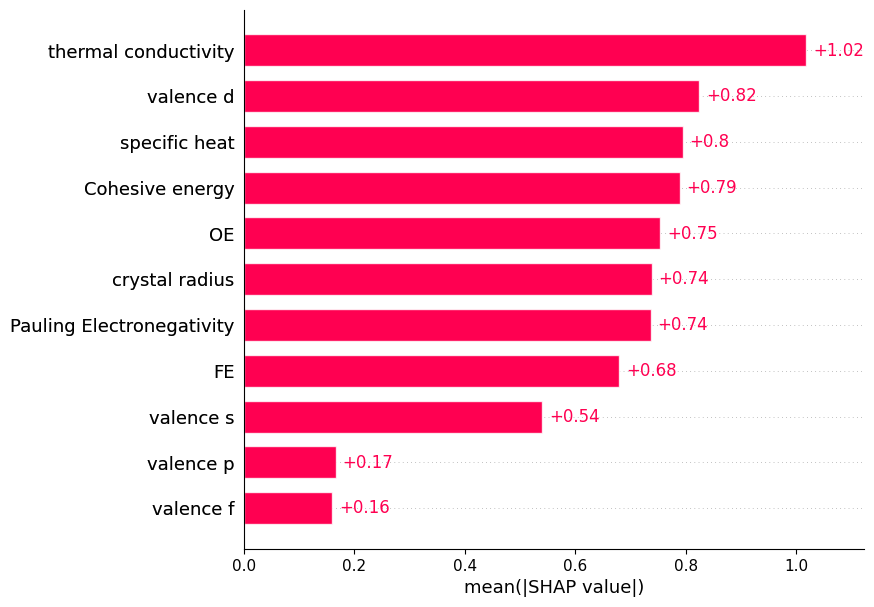

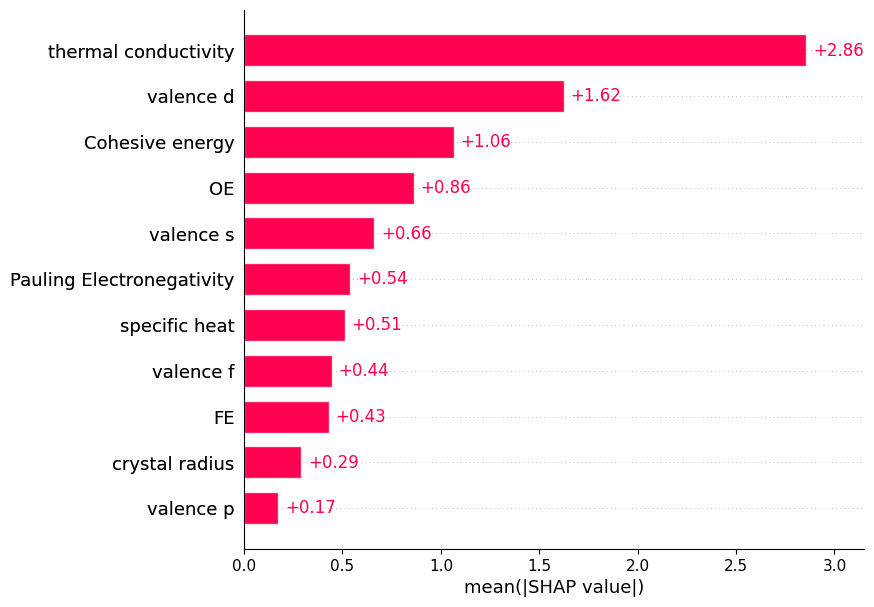

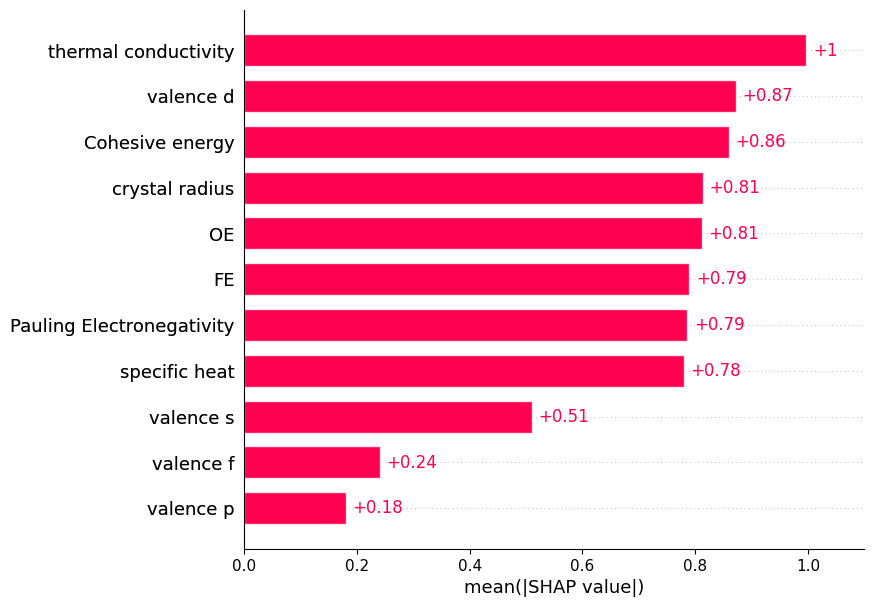

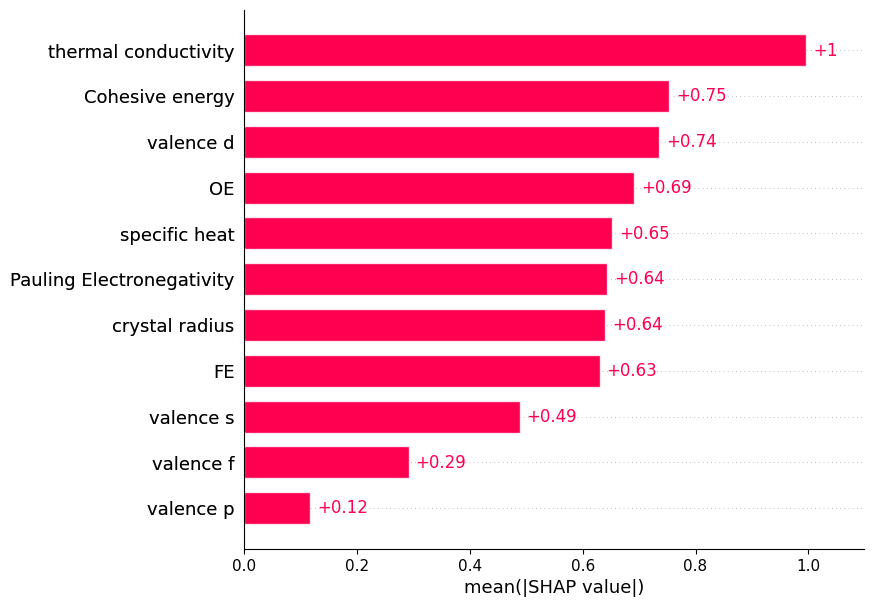

In [ ]:
model_GP3.plot_SHAP('all')

### KNN

In [ ]:
random_seeds = np.arange(0,10)

model_KNN3 = ModelEvaluatorBayes(X_metal_des, res, random_seeds, KNeighborsRegressor, param_space_KNN, results_dict=results_fit1, IIS_dict=IIS_fit1, model_dict=models_fit1)
model_KNN3.evaluate_model()

The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
Permutation explainer: 138it [00:14,  2.42it/s]


Random seed 0 finished



The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
Permutation explainer: 138it [00:12,  2.19it/s]


Random seed 1 finished



The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The object

Random seed 2 finished



The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
Permutation explainer: 138it [00:14,  2.52it/s]                         


Random seed 3 finished



The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
Permutation explainer: 138it [00:12,  1.58it/s]


Random seed 4 finished



The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The object

Random seed 5 finished



The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
Permutation explainer: 138it [00:14,  2.96it/s]


Random seed 6 finished



The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
Permutation explainer: 138it [00:14,  3.14it/s]


Random seed 7 finished



The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
Permutation explainer: 138it [00:16,  3.15it/s]


Random seed 8 finished



The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The objective has been evaluated at this point before.
The object

Random seed 9 finished



In [ ]:
model_KNN3.show_IIS()

,Feature,Mean Rank,Non-Zero Frequency (%),IIS
9,thermal conductivity,1.0,100.0,1.000000
6,valence d,2.4,100.0,0.807500
7,valence f,3.0,100.0,0.780000
10,Cohesive energy,3.7,100.0,0.759189
8,specific heat,5.5,100.0,0.730000
2,FE,6.6,100.0,0.720000
3,OE,7.1,100.0,0.716479
1,Pauling Electronegativity,7.9,100.0,0.711772
5,valence p,8.8,100.0,0.707500
4,valence s,9.1,100.0,0.706264


In [ ]:
model_KNN3.show_shap_ranks()

{'crystal radius': [10, 11, 11, 11, 11, 11, 11, 11, 11, 11],
 'Pauling Electronegativity': [7, 6, 9, 7, 7, 10, 7, 8, 10, 8],
 'FE': [4, 5, 7, 5, 5, 8, 6, 10, 6, 10],
 'OE': [8, 8, 6, 8, 8, 6, 8, 6, 7, 6],
 'valence s': [9, 10, 10, 10, 9, 9, 10, 7, 8, 9],
 'valence p': [11, 9, 8, 9, 10, 7, 9, 9, 9, 7],
 'valence d': [5, 2, 2, 3, 2, 2, 2, 2, 2, 2],
 'valence f': [3, 3, 3, 2, 3, 3, 4, 3, 3, 3],
 'specific heat': [6, 7, 5, 6, 6, 5, 5, 5, 5, 5],
 'thermal conductivity': [1, 1, 1, 1, 1, 1, 1, 1, 1, 1],
 'Cohesive energy': [2, 4, 4, 4, 4, 4, 3, 4, 4, 4]}

In [ ]:
model_KNN3.show_performance()

,random_seed,training R2,test R2,training RMSE,test RMSE,cv_score
0,0,0.358874,0.075020,13.221019,20.616713,0.176696
1,1,0.100656,-0.136539,17.065171,17.208598,0.200028
2,2,0.334336,0.251240,14.093475,16.326610,0.177650
3,3,0.305133,0.230685,14.528131,15.978993,0.238998
4,4,0.275250,0.008333,15.236395,15.910115,0.140323
5,5,0.263356,0.343069,15.069873,14.478163,0.116461
6,6,0.258400,0.567211,15.579749,9.897590,0.169720
7,7,0.531397,-0.163485,10.737347,24.660396,0.463471
8,8,0.222954,0.709962,16.165709,7.721510,0.226500
9,9,0.241723,0.493287,15.553644,11.621951,0.160967


In [ ]:
model_KNN3.show_parameters()

{0: OrderedDict([('n_neighbors', 5), ('p', 1), ('weights', 'distance')]),
 1: OrderedDict([('n_neighbors', 8), ('p', 2), ('weights', 'distance')]),
 2: OrderedDict([('n_neighbors', 21), ('p', 2), ('weights', 'distance')]),
 3: OrderedDict([('n_neighbors', 14), ('p', 2), ('weights', 'distance')]),
 4: OrderedDict([('n_neighbors', 7), ('p', 2), ('weights', 'distance')]),
 5: OrderedDict([('n_neighbors', 20), ('p', 2), ('weights', 'distance')]),
 6: OrderedDict([('n_neighbors', 19), ('p', 2), ('weights', 'distance')]),
 7: OrderedDict([('n_neighbors', 17), ('p', 2), ('weights', 'distance')]),
 8: OrderedDict([('n_neighbors', 21), ('p', 2), ('weights', 'distance')]),
 9: OrderedDict([('n_neighbors', 21), ('p', 1), ('weights', 'distance')])}

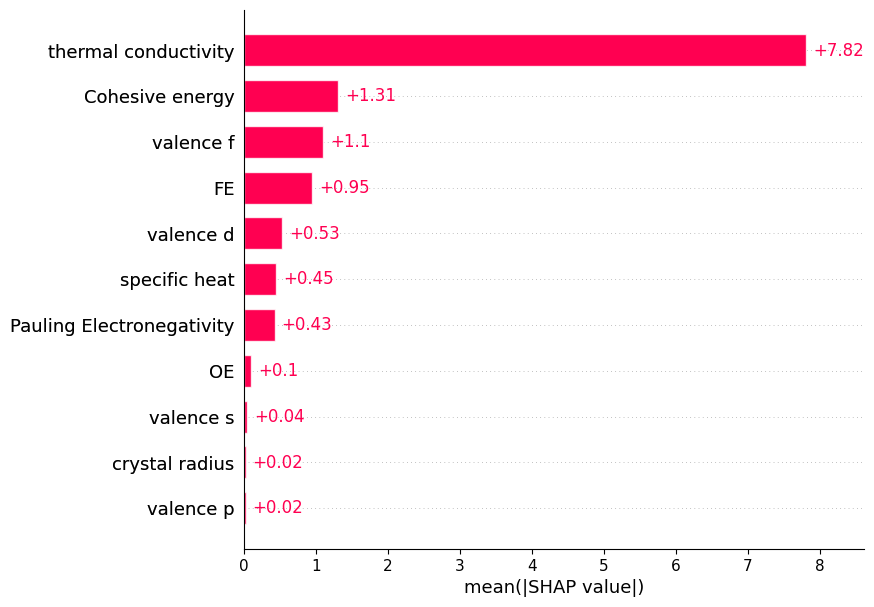

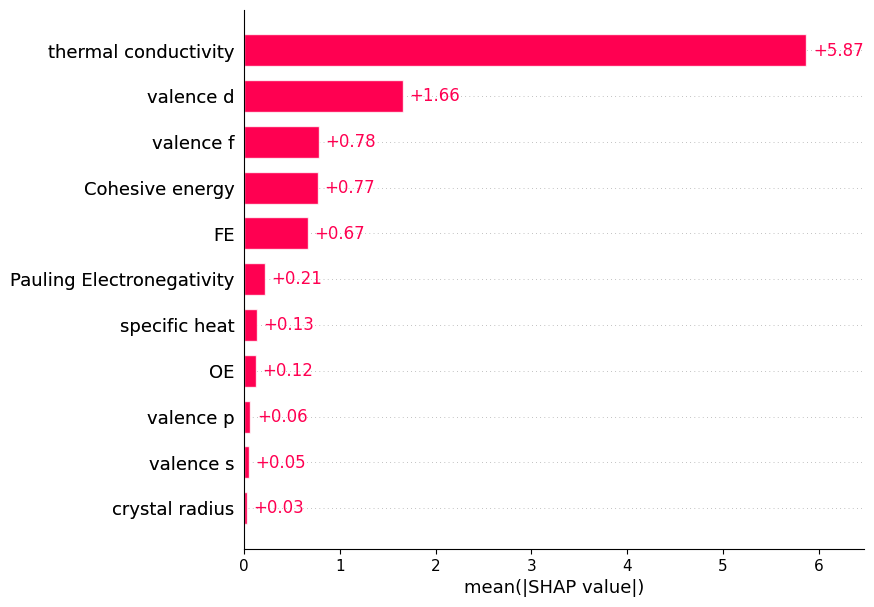

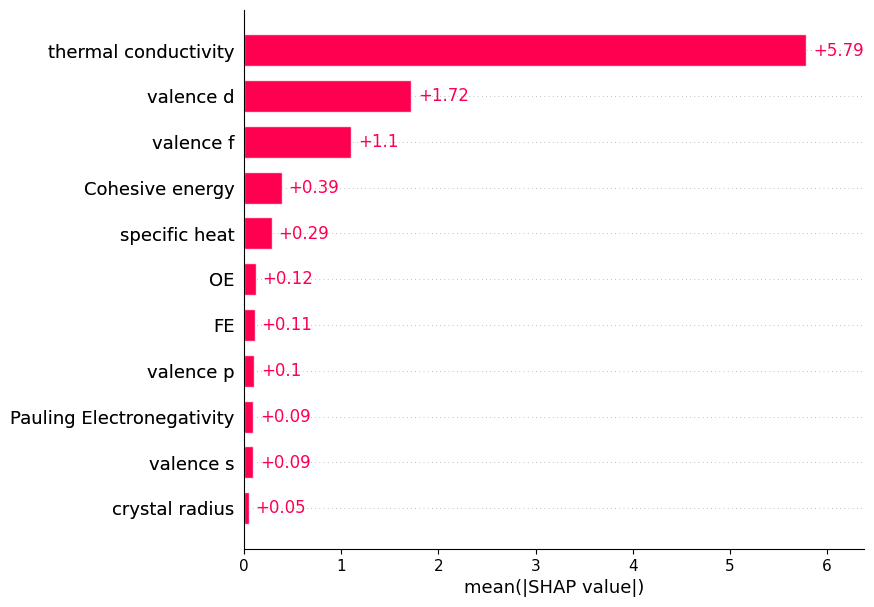

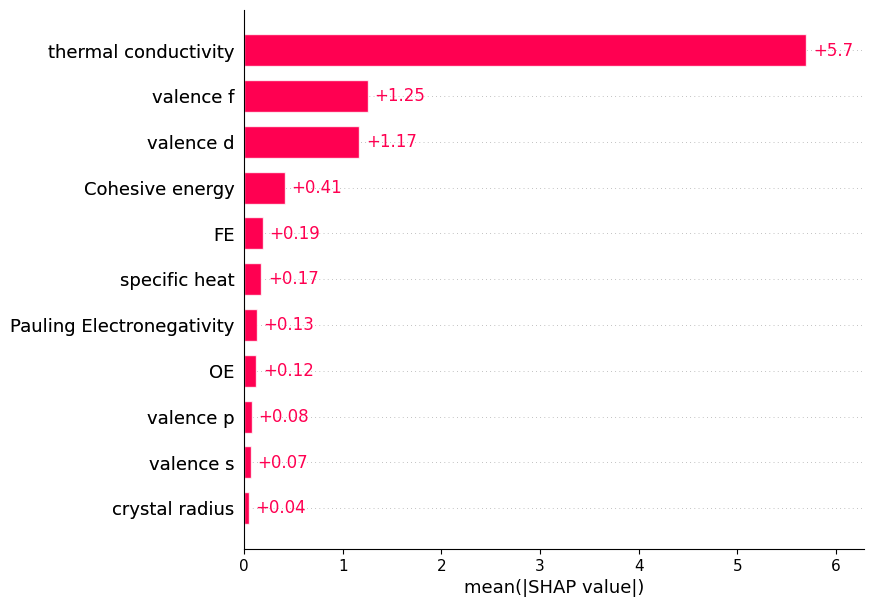

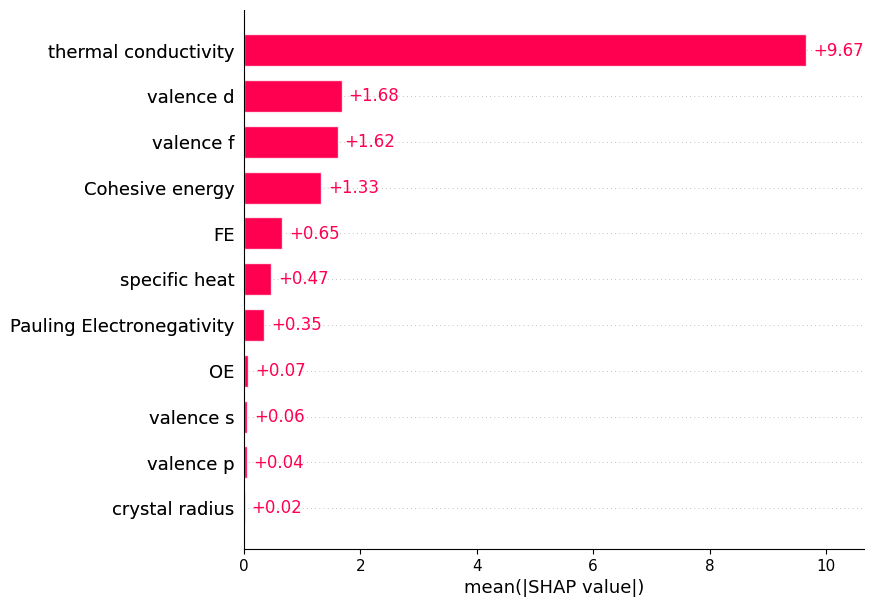

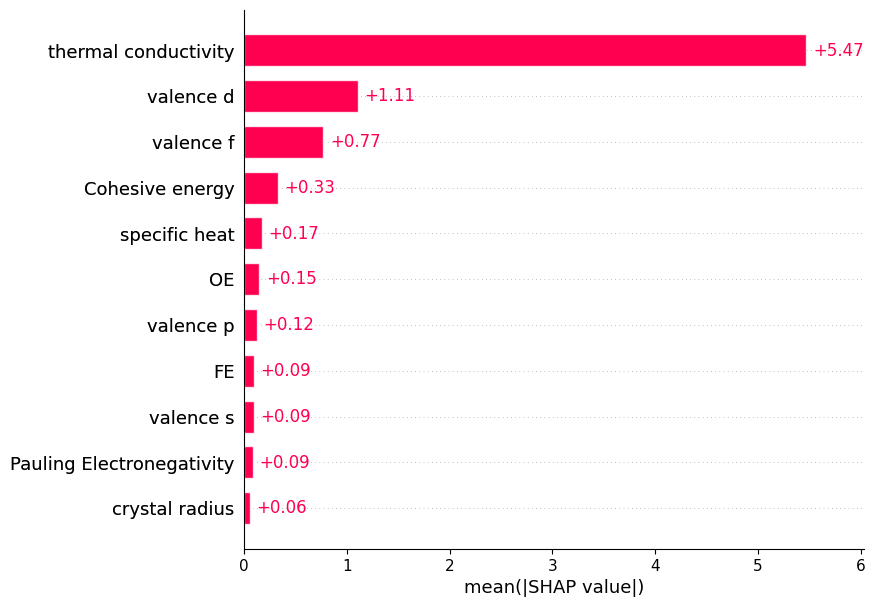

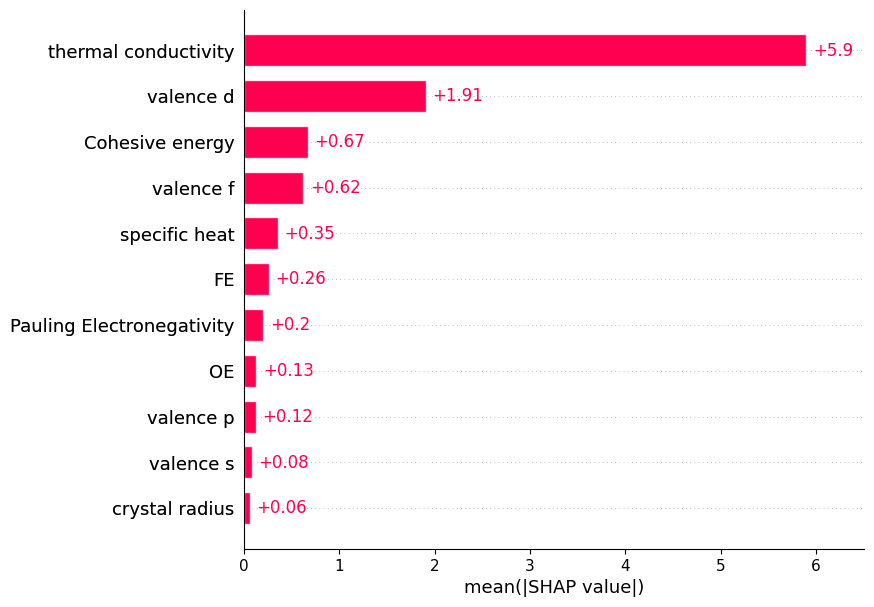

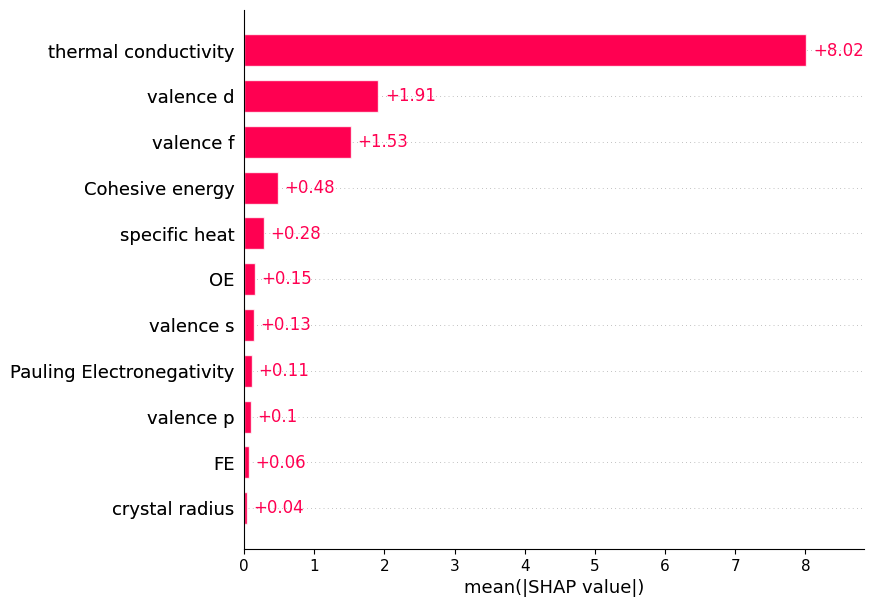

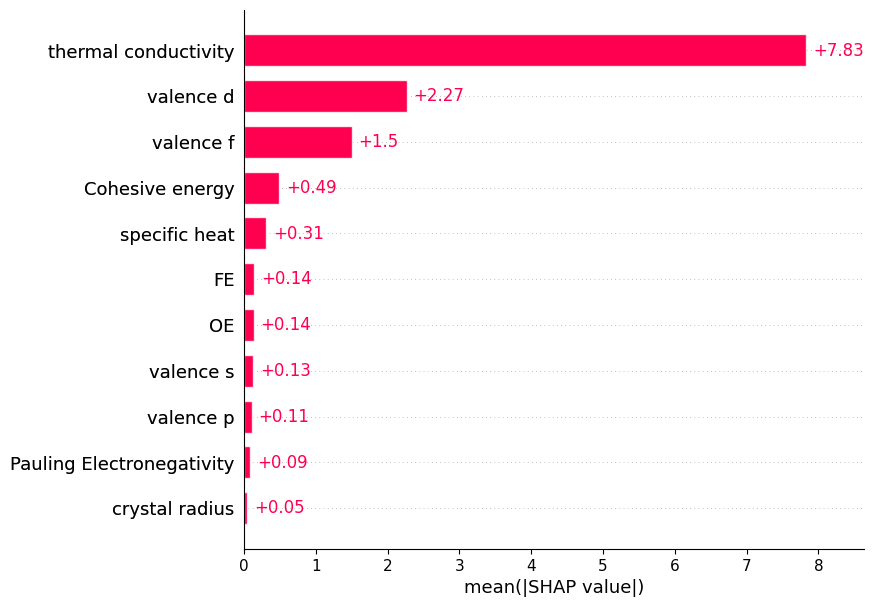

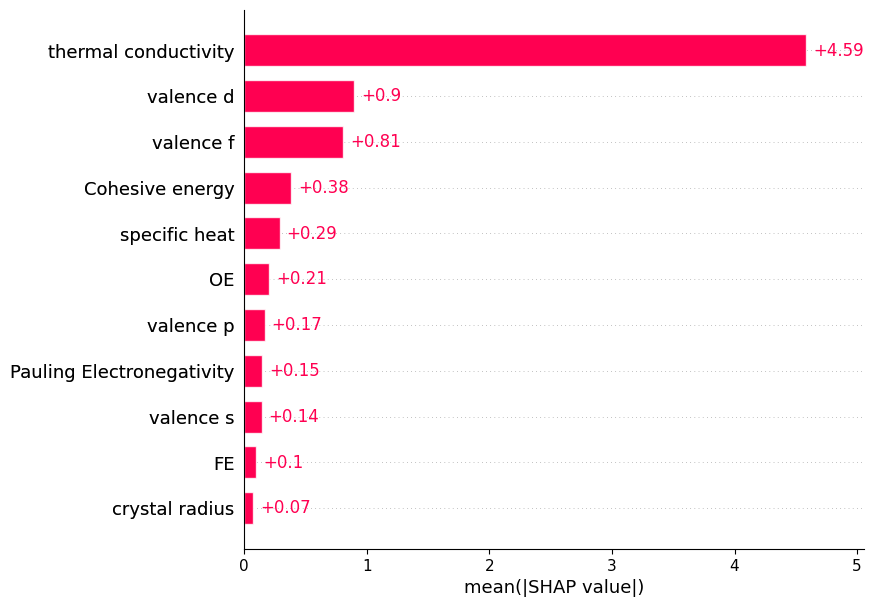

In [ ]:
model_KNN3.plot_SHAP('all')

## 4.IIS ranking

In [ ]:
IIS_data_fit_regular = IISDataAnalysis(results=results_fit1,
                           IIS=IIS_fit1,
                           models=models_fit1,
                           results_csv_name='df_results_fit_regular.csv',
                           models_joblib_name='models_fit_regular.joblib',
                           iis_full_csv_name='df_IIS_full_fit_regular.csv',
                           iis_csv_name='df_IIS_fit_regular.csv')

In [ ]:
IIS_data_fit_regular.show_model_performance()

,train_r2,test_r2,train_rmse,test_rmse,cv_r2
DecisionTreeRegressor,0.318681,0.292220,14.420350,14.996913,0.217926
RandomForestRegressor,0.321571,0.314002,14.393016,14.759091,0.229932
GradientBoostingRegressor,0.323204,0.313015,14.375359,14.770490,0.237492
XGBRegressor,0.320505,0.327989,14.405714,14.600388,0.236424
SVR,0.292775,0.328506,14.697159,14.600562,0.227882
GaussianProcessRegressor,0.322875,0.315350,14.379212,14.749080,0.229831
KNeighborsRegressor,0.289208,0.237878,14.725051,15.442064,0.207081


In [ ]:
IIS_data_fit_regular.show_IIS_values()

,crystal radius,Pauling Electronegativity,FE,OE,valence s,valence p,valence d,valence f,specific heat,thermal conductivity,Cohesive energy
DecisionTreeRegressor,0.713000,0.341333,0.569435,0.337474,0.518471,0.122000,0.472714,0.262875,0.525750,0.401000,0.712000
RandomForestRegressor,0.746744,0.714595,0.796923,0.715205,0.716479,0.700841,0.783793,0.702673,0.737347,0.715833,0.890000
GradientBoostingRegressor,0.745000,0.591000,0.787857,0.712857,0.574261,0.568593,0.741739,0.577905,0.736000,0.724098,0.864118
XGBRegressor,0.759189,0.524000,0.835000,0.582316,0.242250,0.103667,0.687857,0.315143,0.736000,0.651689,0.890000
SVR,0.700000,0.706667,0.703000,0.725932,0.713421,0.714595,0.835000,0.752500,0.734706,1.000000,0.780000
GaussianProcessRegressor,0.724098,0.720769,0.718529,0.750488,0.708372,0.700275,0.792222,0.703333,0.730000,0.876250,0.770000
KNeighborsRegressor,0.700275,0.711772,0.720000,0.716479,0.706264,0.707500,0.807500,0.780000,0.730000,1.000000,0.759189


In [ ]:
IIS_data_fit_regular.show_IIS_details()

crystal radius  \
DecisionTreeRegressor     Mean Rank                    3.000000   
                          Non-Zero Frequency(%)       90.000000   
                          IIS                          0.713000   
RandomForestRegressor     Mean Rank                    4.300000   
                          Non-Zero Frequency(%)      100.000000   
                          IIS                          0.746744   
GradientBoostingRegressor Mean Rank                    4.400000   
                          Non-Zero Frequency(%)      100.000000   
                          IIS                          0.745000   
XGBRegressor              Mean Rank                    3.700000   
                          Non-Zero Frequency(%)      100.000000   
                          IIS                          0.759189   
SVR                       Mean Rank                   11.000000   
                          Non-Zero Frequency(%)      100.000000   
                          IIS                          0.700000   
GaussianProcessRegressor  Mean Rank                    6.100000   
                          Non-Zero Frequency(%)      100.000000   
                          IIS                          0.724098   
KNeighborsRegressor       Mean Rank                   10.900000   
                          Non-Zero Frequency(%)      100.000000   
                          IIS                          0.700275   

                                                 Pauling Electronegativity  \
DecisionTreeRegressor     Mean Rank                               4.500000   
                          Non-Zero Frequency(%)                  40.000000   
                          IIS                                     0.341333   
RandomForestRegressor     Mean Rank                               7.400000   
                          Non-Zero Frequency(%)                 100.000000   
                          IIS                                     0.714595   
GradientBoostingRegressor Mean Rank                               6.000000   
                          Non-Zero Frequency(%)                  80.000000   
                          IIS                                     0.591000   
XGBRegressor              Mean Rank                               6.000000   
                          Non-Zero Frequency(%)                  70.000000   
                          IIS                                     0.524000   
SVR                       Mean Rank                               9.000000   
                          Non-Zero Frequency(%)                 100.000000   
                          IIS                                     0.706667   
GaussianProcessRegressor  Mean Rank                               6.500000   
                          Non-Zero Frequency(%)                 100.000000   
                          IIS                                     0.720769   
KNeighborsRegressor       Mean Rank                               7.900000   
                          Non-Zero Frequency(%)                 100.000000   
                          IIS                                     0.711772   

                                                         FE          OE  \
DecisionTreeRegressor     Mean Rank                3.285714    4.750000   
                          Non-Zero Frequency(%)   70.000000   40.000000   
                          IIS                      0.569435    0.337474   
RandomForestRegressor     Mean Rank                2.600000    7.300000   
                          Non-Zero Frequency(%)  100.000000  100.000000   
                          IIS                      0.796923    0.715205   
GradientBoostingRegressor Mean Rank                2.800000    7.700000   
                          Non-Zero Frequency(%)  100.000000  100.000000   
                          IIS                      0.787857    0.712857   
XGBRegressor              Mean Rank                2.000000    7.125000   
                          Non-Ze

In [ ]:
IIS_data_fit_regular.show_IIS_ranks()

,crystal radius,Pauling Electronegativity,FE,OE,valence s,valence p,valence d,valence f,specific heat,thermal conductivity,Cohesive energy
DecisionTreeRegressor,1,8,3,9,5,11,6,10,4,7,2
RandomForestRegressor,4,9,2,8,6,11,3,10,5,7,1
GradientBoostingRegressor,3,8,2,7,10,11,4,9,5,6,1
XGBRegressor,3,8,2,7,10,11,5,9,4,6,1
SVR,11,9,10,6,8,7,2,4,5,1,3
GaussianProcessRegressor,6,7,8,4,9,11,2,10,5,1,3
KNeighborsRegressor,11,8,6,7,10,9,2,3,5,1,4


In [ ]:
IIS_data_fit_regular.get_IIS_mean_rank()

,Feature,Mean Rank,Standard Deviation
0,Cohesive energy,2.143,1.215
1,valence d,3.429,1.618
2,thermal conductivity,4.143,2.968
3,FE,4.714,3.302
4,specific heat,4.714,0.488
5,crystal radius,5.571,3.994
6,OE,6.857,1.574
7,valence f,7.857,3.024
8,Pauling Electronegativity,8.143,0.690
9,valence s,8.286,2.059


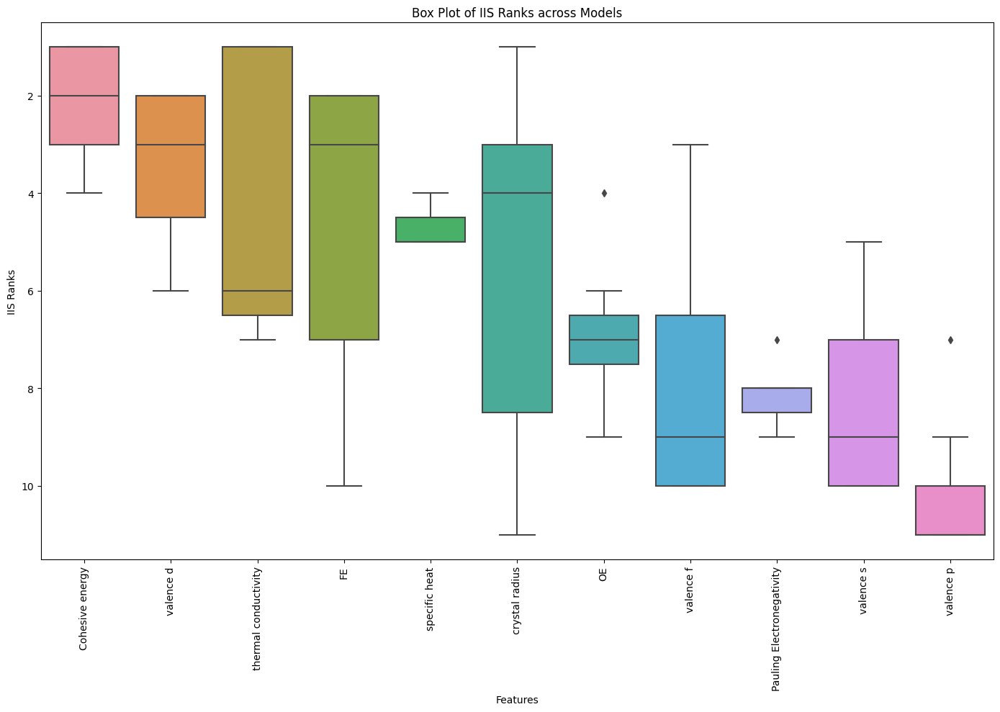

In [ ]:
IIS_data_fit_regular.plot_IIS_mean_rank()

# E. Code for result replication

In [ ]:
df_IIS = pd.read_csv('/content/df_IIS_sub.csv', index_col='Unnamed: 0')
df_IIS

,crystal radius,Pauling Electronegativity,FE,OE,valence s,valence p,valence d,valence f,specific heat,thermal conductivity,Cohesive energy
DecisionTreeRegressor,0.637538,0.557846,0.554556,0.341333,0.369538,0.181143,0.341333,0.271714,0.633778,0.396111,0.792222
RandomForestRegressor,0.734706,0.714000,0.754615,0.728929,0.719254,0.702039,0.807500,0.700841,0.773125,0.714000,0.776452
GradientBoostingRegressor,0.770000,0.721562,0.728929,0.719254,0.711250,0.636000,0.724098,0.574261,0.746744,0.736000,0.890000
XGBRegressor,0.746744,0.654207,0.746744,0.600390,0.447000,0.100000,0.621161,0.103667,0.759316,0.654207,0.792222
SVR,0.700000,0.707079,0.703000,0.728929,0.715205,0.712308,0.835000,0.761667,0.731111,1.000000,0.767059
KNeighborsRegressor,0.701132,0.711250,0.708372,0.713421,0.713421,0.577250,0.813478,0.792222,0.740213,1.000000,0.746744
GaussianProcessRegressor,0.700000,0.708824,0.703333,0.726897,0.717826,0.709759,0.835000,0.761667,0.732264,1.000000,0.759189


In [ ]:
df_ranked = df_IIS.rank(axis=1, ascending=False, method='min').astype(int)
df_ranked

,crystal radius,Pauling Electronegativity,FE,OE,valence s,valence p,valence d,valence f,specific heat,thermal conductivity,Cohesive energy
DecisionTreeRegressor,2,4,5,8,7,11,8,10,3,6,1
RandomForestRegressor,5,8,4,6,7,10,1,11,3,8,2
GradientBoostingRegressor,2,7,5,8,9,10,6,11,3,4,1
XGBRegressor,3,5,3,8,9,11,7,10,2,5,1
SVR,11,9,10,6,7,8,2,4,5,1,3
KNeighborsRegressor,10,8,9,6,6,11,2,3,5,1,4
GaussianProcessRegressor,11,9,10,6,7,8,2,3,5,1,4


In [ ]:
# Extracting the IIS values for each feature across models
iis_ranks = df_ranked.T

# Calculating the mean and standard deviation of IIS for each feature
mean_ranks = iis_ranks.mean(axis=1).round(3)
std_ranks = iis_ranks.std(axis=1).round(3)

# Constructing the results DataFrame
results_df = pd.DataFrame({
    'Feature': mean_ranks.index,
    'Mean Rank': mean_ranks.values,
    'Standard Deviation': std_ranks.values
})

# Sorting by Mean IIS in descending order
results_df = results_df.sort_values(by='Mean Rank', ascending=True).reset_index(drop=True)
results_df

,Feature,Mean Rank,Standard Deviation
0,Cohesive energy,2.286,1.380
1,specific heat,3.714,1.254
2,thermal conductivity,3.714,2.812
3,valence d,4.000,2.887
4,crystal radius,6.286,4.231
5,FE,6.571,2.992
6,OE,6.857,1.069
7,Pauling Electronegativity,7.143,1.952
8,valence s,7.429,1.134
9,valence f,7.429,3.867


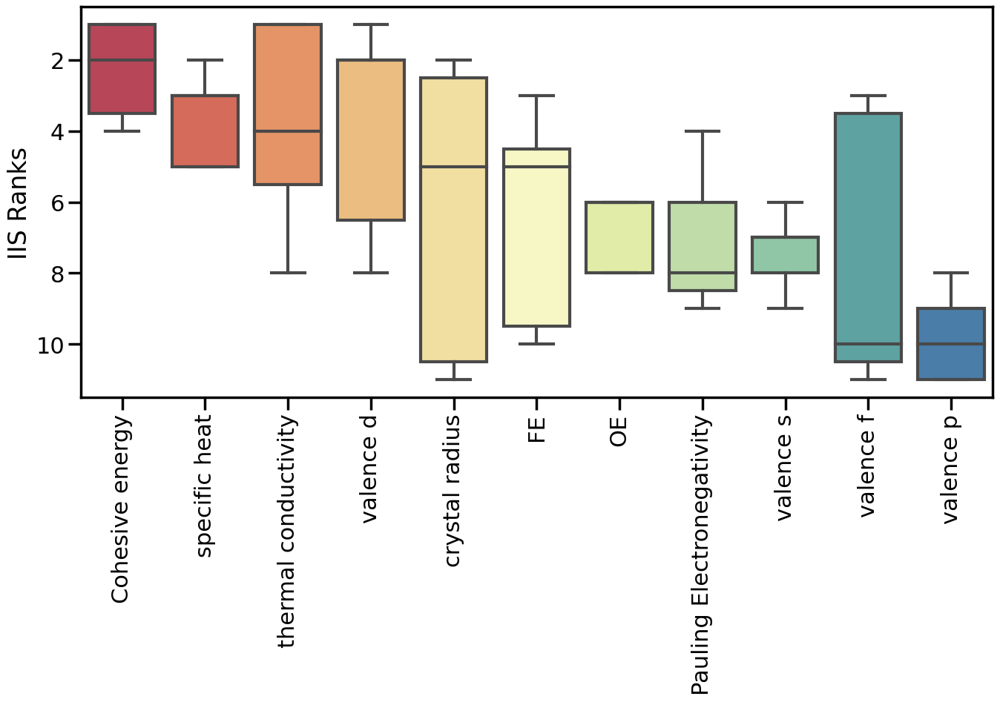

In [ ]:
# Sort columns based on their mean rank
mean_ranks = df_ranked.mean().sort_values()
sorted_columns = mean_ranks.index.tolist()

# Plotting
sns.set_context("poster")
plt.figure(figsize=(14, 10))
sns.boxplot(data=df_ranked[sorted_columns], orient="v", palette="Spectral")
# plt.title('Box plot of IIS ranks with full set of catalytic descriptors using approach 1')
plt.ylabel('IIS Ranks')
# plt.xlabel('Features')
plt.gca().invert_yaxis()  # Invert the y-axis
plt.xticks(rotation=90)  # Rotate x-ticks to 90 degrees
plt.tight_layout()

plt.show()